## EDA

## **1. Data Overview**

### 1.1 Data Load

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import pandas as pd
import os
import re

file_path = '/1_finalized_datasets.xlsx'
if not os.path.exists(file_path):
    file_path = '/content/drive/My Drive/1_finalized_datasets.xlsx'

# Load all sheets
workbook = pd.read_excel(file_path, sheet_name=None)
# workbook = openpyxl.load_workbook(file_path)
dataframes = {}

for sheet, df in workbook.items():
    print(f"Processing sheet: {sheet}")
    clean_name = re.sub(r'[^\w\s]', '', sheet).strip().replace(" ", "_")

    if clean_name in dataframes:
        print(f"⚠️ Skipping duplicate sheet name: {clean_name}")
        continue

    dataframes[clean_name] = df
    print(f"✅ Created DataFrame: {clean_name} ({df.shape[0]} rows)")


Processing sheet: Sheet1
✅ Created DataFrame: Sheet1 (1322 rows)
Processing sheet: Sheet2
✅ Created DataFrame: Sheet2 (1336 rows)
Processing sheet: category
✅ Created DataFrame: category (11 rows)
Processing sheet: allergen
✅ Created DataFrame: allergen (8 rows)
Processing sheet: countrymap 
✅ Created DataFrame: countrymap (76 rows)
Processing sheet: 📝 recipe_ingredient
✅ Created DataFrame: recipe_ingredient (8209 rows)
Processing sheet: 🏷️ recipe_category_df
✅ Created DataFrame: recipe_category_df (8123 rows)
Processing sheet: 🍴 recipes
✅ Created DataFrame: recipes (1322 rows)
Processing sheet: 📊 recipe_nutrition
✅ Created DataFrame: recipe_nutrition (1322 rows)
Processing sheet: 🧂 final_ingredient_df
✅ Created DataFrame: final_ingredient_df (999 rows)


### 1.2 Data Summary

In [5]:
# Sheets to exclude
excluded_sheets = ['Sheet1', 'Sheet2']

print(f"\n🔍 Starting Analysis of DataFrames...")

# Loop through all dataframes in the dictionary
for name, df in dataframes.items():
    if name not in excluded_sheets:
        print(f"\n🔍 Analyzing Sheet: {name}")
        print("=" * 60)

        # 1. Shape
        print(f"📐 Shape: {df.shape}")

        # 2. Columns
        print(f"🧾 Columns: {list(df.columns)}")

        # 3. Info
        print(f"\n🛠️ DataFrame Info:")
        df.info()

        # 4. Total null values
        total_null = df.isnull().sum().sum()
        print(f"\n🚫 Total Null Values (overall): {total_null}")

        # 4.1 Missing values per column
        missing_per_column = df.isnull().sum()
        if missing_per_column.any():
            print("\n🚨 Missing Values Per Column:")
            print(missing_per_column[missing_per_column > 0].sort_values(ascending=False))

            percent_missing = (missing_per_column / len(df)) * 100
            print("\n📈 Missing Values (% per column):")
            print(percent_missing[percent_missing > 0].sort_values(ascending=False))
        else:
            print("\n✅ No missing values in any column.")

        # 5. Unique values per column
        print(f"\n🔢 Unique Values per Column:")
        print(df.nunique(dropna=False))

        # 6. Sample rows
        print(f"\n🔍 Sample Rows (first 5):")
        try:
            from IPython.display import display
            display(df.head(5))
        except ImportError:
            print(df.head(5))



🔍 Starting Analysis of DataFrames...

🔍 Analyzing Sheet: category
📐 Shape: (11, 3)
🧾 Columns: ['pk', 'name', 'description']

🛠️ DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11 entries, 0 to 10
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   pk           11 non-null     int64 
 1   name         11 non-null     object
 2   description  11 non-null     object
dtypes: int64(1), object(2)
memory usage: 396.0+ bytes

🚫 Total Null Values (overall): 0

✅ No missing values in any column.

🔢 Unique Values per Column:
pk             11
name           11
description    11
dtype: int64

🔍 Sample Rows (first 5):


,pk,name,description
0,1,vegan,Allowed categories: plant_based\nExcluded alle...
1,2,vegetarian,"Allowed categories: plant_based, dairy, egg\nE..."
2,3,pescetarian,"Allowed categories: plant_based, dairy, egg, s..."
3,4,dairy free,Excluded allergen groups: milk\nExcluded ingre...
4,5,egg free,Excluded allergen groups: egg\nExcluded ingred...



🔍 Analyzing Sheet: allergen
📐 Shape: (8, 3)
🧾 Columns: ['pk', 'name', 'description']

🛠️ DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   pk           8 non-null      int64 
 1   name         8 non-null      object
 2   description  8 non-null      object
dtypes: int64(1), object(2)
memory usage: 324.0+ bytes

🚫 Total Null Values (overall): 0

✅ No missing values in any column.

🔢 Unique Values per Column:
pk             8
name           8
description    8
dtype: int64

🔍 Sample Rows (first 5):


,pk,name,description
0,1,dairy,Common infant allergen. Found in dairy products.
1,2,egg,Can cause allergy even in small amounts.
2,3,soy,"Plant-based but common allergen, especially in..."
3,4,tree_nuts,Tree nuts are a top allergen. Avoid early intr...
4,5,peanuts,Peanuts are a major allergen. Introduce carefu...



🔍 Analyzing Sheet: countrymap
📐 Shape: (76, 4)
🧾 Columns: ['pk', 'country', 'region', 'flag_code']

🛠️ DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76 entries, 0 to 75
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   pk         76 non-null     int64 
 1   country    76 non-null     object
 2   region     76 non-null     object
 3   flag_code  76 non-null     object
dtypes: int64(1), object(3)
memory usage: 2.5+ KB

🚫 Total Null Values (overall): 0

✅ No missing values in any column.

🔢 Unique Values per Column:
pk           76
country      74
region       11
flag_code    74
dtype: int64

🔍 Sample Rows (first 5):


,pk,country,region,flag_code
0,1,China,Asian,cn
1,2,Japan,Asian,jp
2,3,South Korea,Asian,kr
3,4,Mongolia,Asian,mn
4,5,Nepal,Asian,np



🔍 Analyzing Sheet: recipe_ingredient
📐 Shape: (8209, 2)
🧾 Columns: ['recipe_id', 'ingredient_id']

🛠️ DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8209 entries, 0 to 8208
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   recipe_id      8209 non-null   int64
 1   ingredient_id  8209 non-null   int64
dtypes: int64(2)
memory usage: 128.4 KB

🚫 Total Null Values (overall): 0

✅ No missing values in any column.

🔢 Unique Values per Column:
recipe_id        1322
ingredient_id     999
dtype: int64

🔍 Sample Rows (first 5):


,recipe_id,ingredient_id
0,1,155
1,1,332
2,1,182
3,1,232
4,1,185



🔍 Analyzing Sheet: recipe_category_df
📐 Shape: (8123, 2)
🧾 Columns: ['recipe_id', 'category_id']

🛠️ DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8123 entries, 0 to 8122
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   recipe_id    8123 non-null   int64
 1   category_id  8123 non-null   int64
dtypes: int64(2)
memory usage: 127.1 KB

🚫 Total Null Values (overall): 0

✅ No missing values in any column.

🔢 Unique Values per Column:
recipe_id      1322
category_id      10
dtype: int64

🔍 Sample Rows (first 5):


,recipe_id,category_id
0,1,11
1,1,9
2,1,4
3,1,5
4,1,6



🔍 Analyzing Sheet: recipes
📐 Shape: (1322, 20)
🧾 Columns: ['name', 'ingredients', 'instructions', 'min_age', 'max_age', 'texture', 'prep_time', 'cook_time', 'serving', 'recipe_link', 'credibility', 'image_link', 'difficulty', 'meal_type', 'description', 'tips', 'hypoallergenic', 'origin_id', 'choking_hazards', 'recipe_id']

🛠️ DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1322 entries, 0 to 1321
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             1322 non-null   object 
 1   ingredients      1322 non-null   object 
 2   instructions     1322 non-null   object 
 3   min_age          1205 non-null   float64
 4   max_age          1175 non-null   float64
 5   texture          1322 non-null   object 
 6   prep_time        739 non-null    float64
 7   cook_time        750 non-null    float64
 8   serving          1176 non-null   object 
 9   recipe_link      1322 non-null   obj

,name,ingredients,instructions,min_age,max_age,texture,prep_time,cook_time,serving,recipe_link,credibility,image_link,difficulty,meal_type,description,tips,hypoallergenic,origin_id,choking_hazards,recipe_id
0,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,NONE,15.0,45.0,1,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,NaN,NaN,Medium,NaN,NaN,NaN,No,9,No,1
1,Bitterballs (Bitterballen),- 100 g beef mince \n- 30 g potato starch \n- ...,1. Stir-fry blended spices until fragrant. \n2...,9.0,11.0,family food,30.0,30.0,10 servings,pdfcoffee.com_mommyclopedia-78-resep-mpasi-pdf...,NaN,NaN,Hard,Snack,NaN,NaN,No,9,No,2
2,Broccoli/Cauliflower Cheese,"- 175g cauliflower/broccoli, cut into pieces\n...","1. Steam, boil, or microwave cauliflower/brocc...",6.0,12.0,NONE,10.0,20.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,Illawarra Shoalhaven Local Health District (IS...,NaN,Medium,NaN,NaN,NaN,No,68,No,3
3,Vegetable Fingers,"- 1 carrot, potato, or sweet potato, peeled an...",1. Steam or microwave vegetables until tender....,6.0,12.0,NONE,5.0,10.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,Illawarra Shoalhaven Local Health District (IS...,NaN,Easy,NaN,NaN,NaN,Yes,68,No,4
4,Beef Casserole,"- 1 onion, peeled and finely chopped\n- 1½ tab...",1. Preheat oven to 180°C.\n2. Heat oil in a me...,6.0,12.0,family food,10.0,2.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,Illawarra Shoalhaven Local Health District (IS...,NaN,Medium,NaN,NaN,NaN,Yes,68,No,5



🔍 Analyzing Sheet: recipe_nutrition
📐 Shape: (1322, 8)
🧾 Columns: ['recipe_id', 'total_energy_kcal', 'total_carbs_g', 'total_protein_g', 'total_fat_g', 'final_micronutrients', 'nutrition_id', 'fat']

🛠️ DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1322 entries, 0 to 1321
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   recipe_id             1322 non-null   int64  
 1   total_energy_kcal     1321 non-null   object 
 2   total_carbs_g         1320 non-null   object 
 3   total_protein_g       1321 non-null   object 
 4   total_fat_g           1280 non-null   object 
 5   final_micronutrients  985 non-null    object 
 6   nutrition_id          1322 non-null   int64  
 7   fat                   38 non-null     float64
dtypes: float64(1), int64(2), object(5)
memory usage: 82.8+ KB

🚫 Total Null Values (overall): 1667

🚨 Missing Values Per Column:
fat                     1284
final

,recipe_id,total_energy_kcal,total_carbs_g,total_protein_g,total_fat_g,final_micronutrients,nutrition_id,fat
0,1,255.48,24.854,24.965,13.1378,"['Magnesium', 'P', 'beta', 'Total fat (NLEA)',...",1,NaN
1,2,0,3.376,68.751,50.332,"['Sodium', 'Na']",2,NaN
2,3,53.55,23.5955,46.383,28.989,"['P', 'Vitamin A', 'Vitamin K (phylloquinone)'...",3,NaN
3,5,1585.2,44.9207,113.015,290.2725,"['Sodium', 'P', 'Vitamin C', 'Cholesterol', 'C...",4,NaN
4,6,0,0.492,0.0943,0.0359,"['Ca', 'Na', 'K', 'Sodium', 'Potassium', 'Calc...",5,NaN



🔍 Analyzing Sheet: final_ingredient_df
📐 Shape: (999, 4)
🧾 Columns: ['pk', 'name', 'allergen_group_id', 'isAllergen']

🛠️ DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   pk                 999 non-null    int64  
 1   name               999 non-null    object 
 2   allergen_group_id  238 non-null    float64
 3   isAllergen         999 non-null    bool   
dtypes: bool(1), float64(1), int64(1), object(1)
memory usage: 24.5+ KB

🚫 Total Null Values (overall): 761

🚨 Missing Values Per Column:
allergen_group_id    761
dtype: int64

📈 Missing Values (% per column):
allergen_group_id    76.176176
dtype: float64

🔢 Unique Values per Column:
pk                   999
name                 999
allergen_group_id      9
isAllergen             2
dtype: int64

🔍 Sample Rows (first 5):


,pk,name,allergen_group_id,isAllergen
0,1,acai,NaN,False
1,2,agar-agar powder,NaN,False
2,3,all purpose flour,8.0,True
3,4,almond,NaN,False
4,5,almond butter,4.0,True


In [96]:
recipe_nutrient_df = dataframes['recipe_nutrition']
print(recipe_nutrient_df.head(3))
print(recipe_nutrient_df.isnull().sum())  # <-- FIXED here


   recipe_id total_energy_kcal total_carbs_g total_protein_g total_fat_g  \
0          1            255.48        24.854          24.965     13.1378   
1          2                 0         3.376          68.751      50.332   
2          3             53.55       23.5955          46.383      28.989   

                                final_micronutrients  nutrition_id  fat  
0  ['Magnesium', 'P', 'beta', 'Total fat (NLEA)',...             1  NaN  
1                                   ['Sodium', 'Na']             2  NaN  
2  ['P', 'Vitamin A', 'Vitamin K (phylloquinone)'...             3  NaN  
recipe_id                  0
total_energy_kcal          1
total_carbs_g              2
total_protein_g            1
total_fat_g               42
final_micronutrients     337
nutrition_id               0
fat                     1284
dtype: int64


### 1.3 Missing Values

In [6]:
def detect_missing_values(df):
    total_missing = df.isnull().sum().sum()
    print(f"\n🚫 TOTAL Missing Values: {total_missing}")

    missing_per_column = df.isnull().sum()
    if missing_per_column.any():
        print("\n📊 Missing Values Per Column:")
        print(missing_per_column[missing_per_column > 0].sort_values(ascending=False))

        print("\n📈 Missing Values Percentage Per Column:")
        percent_missing = (missing_per_column / len(df)) * 100
        print(percent_missing[percent_missing > 0].sort_values(ascending=False))
    else:
        print("✅ No missing values in any column.")


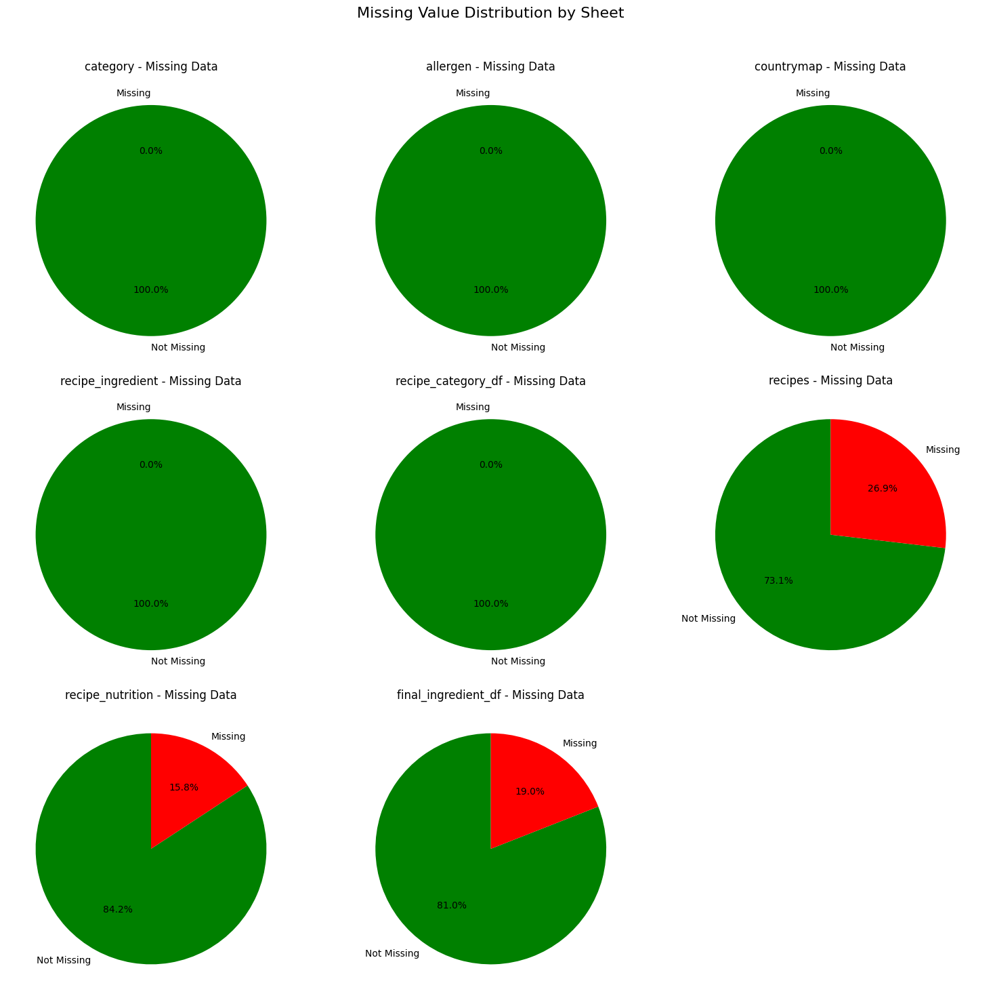

In [7]:
import matplotlib.pyplot as plt
import math

excluded_sheets = ['Sheet1', 'Sheet2']
valid_sheets = [name for name in dataframes if name not in excluded_sheets]
n_sheets = len(valid_sheets)

# Define layout: 3 columns per row
n_cols = 3
n_rows = math.ceil(n_sheets / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))
axes = axes.flatten()  # flatten in case of single row

for i, name in enumerate(valid_sheets):
    df = dataframes[name]
    total_cells = df.size
    missing_count = df.isnull().sum().sum()
    not_missing_count = total_cells - missing_count

    # Plot pie chart
    axes[i].pie(
        [not_missing_count, missing_count],
        labels=['Not Missing', 'Missing'],
        colors=['green', 'red'],
        autopct='%1.1f%%',
        startangle=90
    )
    axes[i].set_title(f"{name} - Missing Data")

# Hide unused axes if any
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle("Missing Value Distribution by Sheet", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


✅ No missing values in columns for sheet: category
✅ No missing values in columns for sheet: allergen
✅ No missing values in columns for sheet: countrymap
✅ No missing values in columns for sheet: recipe_ingredient
✅ No missing values in columns for sheet: recipe_category_df


/tmp/ipython-input-8-352261530.py:19: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


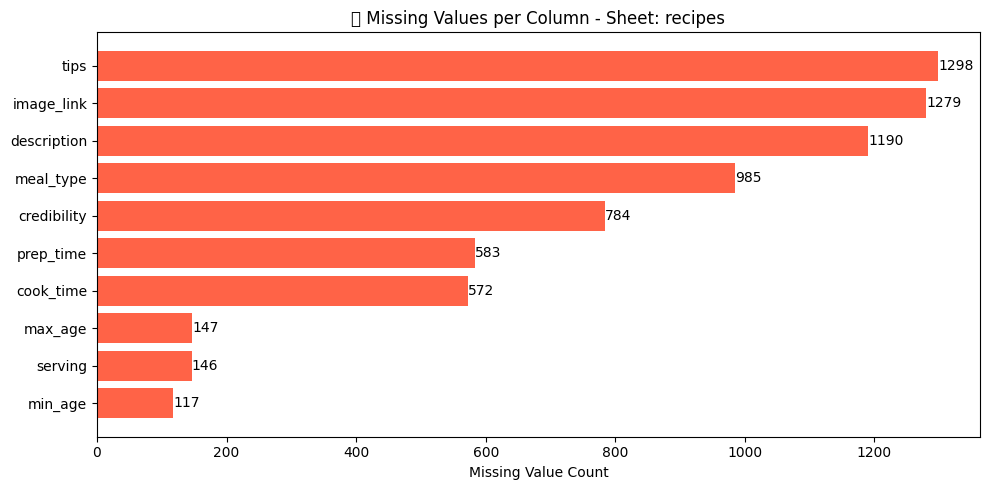

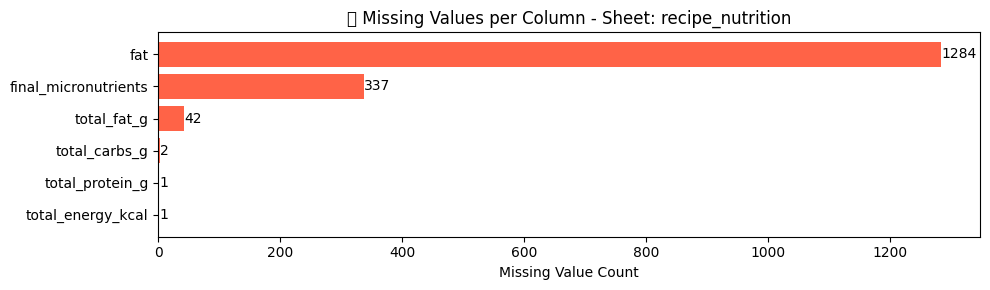

/tmp/ipython-input-8-352261530.py:19: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


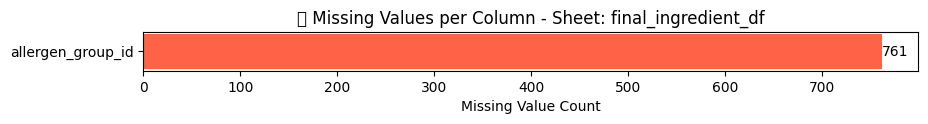

In [8]:
import matplotlib.pyplot as plt

for name in valid_sheets:
    df = dataframes[name]
    missing_per_col = df.isnull().sum()
    missing_per_col = missing_per_col[missing_per_col > 0].sort_values(ascending=True)

    if missing_per_col.empty:
        print(f"✅ No missing values in columns for sheet: {name}")
        continue

    # Bar plot of missing values by column
    plt.figure(figsize=(10, 0.5 * len(missing_per_col)))  # Adjust height based on number of columns
    plt.barh(missing_per_col.index, missing_per_col.values, color='tomato')
    plt.title(f"🚨 Missing Values per Column - Sheet: {name}")
    plt.xlabel("Missing Value Count")
    for i, v in enumerate(missing_per_col.values):
        plt.text(v + 0.5, i, str(v), va='center')
    plt.tight_layout()
    plt.show()


### **Observation**

Through the missing values, we need to crosscheck more further
and also from the type of each column in each dataframe, it seems some is not aligned, further elaboration needed

## **2. UNIVARIATE ANALYSES**


> Purpose:
*   To summarize, describe, and understand the distribution and characteristics of a single variable.
*   Helps identify central tendency (mean, median, mode), dispersion (standard deviation, range), and shape (skewness, kurtosis).
*   Provides insights into data quality, such as missing values, outliers, or inconsistencies.



In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


### 2.1 DataFrame: category

In [10]:
category_df = dataframes['category']
df = category_df.copy()
print(f"All unique values in 'category' column: {df['pk'].is_unique}, All unique name :{df['name'].is_unique}")
print(df.head(3))  # show a few rows for documentation

All unique values in 'category' column: True, All unique name :True
   pk         name                                        description
0   1        vegan  Allowed categories: plant_based\nExcluded alle...
1   2   vegetarian  Allowed categories: plant_based, dairy, egg\nE...
2   3  pescetarian  Allowed categories: plant_based, dairy, egg, s...


Primary Key (pk) Analysis:
Total records: 11
Missing values: 0
Min ID: 1
Max ID: 11
ID Range: 10
ID Spacing Analysis:
pk
1.0    10
Name: count, dtype: int64


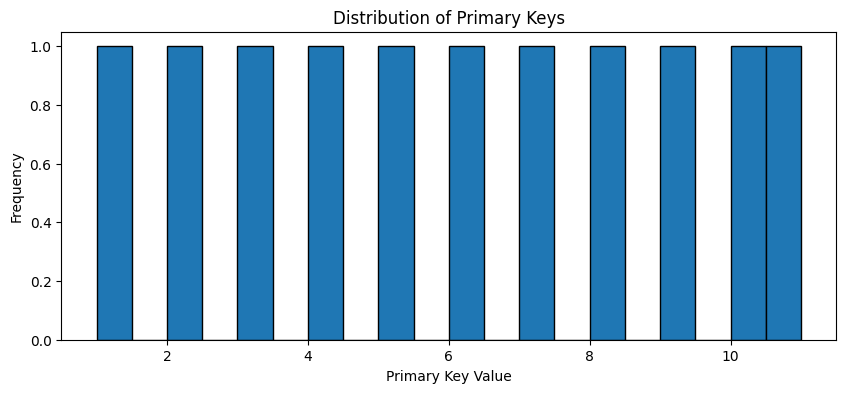

,pk
count,11.000000
mean,6.000000
std,3.316625
min,1.000000
25%,3.500000
50%,6.000000
75%,8.500000
max,11.000000


In [11]:
# 1. Primary Key (pk) Analysis
print("="*50)
print("Primary Key (pk) Analysis:")
print("="*50)
print(f"Total records: {len(df)}")
print(f"Missing values: {df['pk'].isnull().sum()}")
print(f"Min ID: {df['pk'].min()}")
print(f"Max ID: {df['pk'].max()}")
print(f"ID Range: {df['pk'].max() - df['pk'].min()}")
print(f"ID Spacing Analysis:\n{df['pk'].diff().value_counts().head()}")

# Visualize ID distribution
plt.figure(figsize=(10, 4))
df['pk'].plot(kind='hist', bins=20, edgecolor='black')
plt.title('Distribution of Primary Keys')
plt.xlabel('Primary Key Value')
plt.ylabel('Frequency')
plt.show()

display(df['pk'].describe())


In [12]:
# 2. Category Name Analysis
print("\n" + "="*50)
print("Category Name Analysis:")
print("="*50)
# Name length analysis
df['name_length'] = df['name'].str.len()
display(df[['name','name_length']])
print("\nName Length Statistics:")
print(df['name_length'].describe())

print("\nCount Statistics:")
# Frequency count of categories in 'name' column
category_counts = df['name'].value_counts()
print(category_counts)


Category Name Analysis:


,name,name_length
0,vegan,5
1,vegetarian,10
2,pescetarian,11
3,dairy free,10
4,egg free,8
5,soy free,8
6,nut free,8
7,gluten free,11
8,halal,5
9,non halal,9



Name Length Statistics:
count    11.000000
mean      8.363636
std       2.110579
min       5.000000
25%       7.500000
50%       8.000000
75%      10.000000
max      11.000000
Name: name_length, dtype: float64

Count Statistics:
name
vegan          1
vegetarian     1
pescetarian    1
dairy free     1
egg free       1
soy free       1
nut free       1
gluten free    1
halal          1
non halal      1
non veg        1
Name: count, dtype: int64


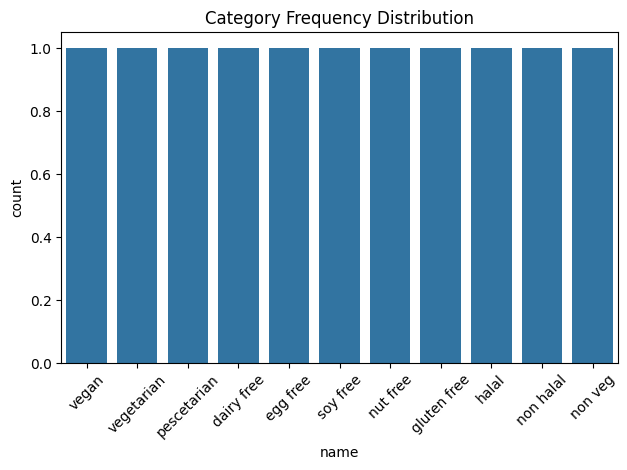

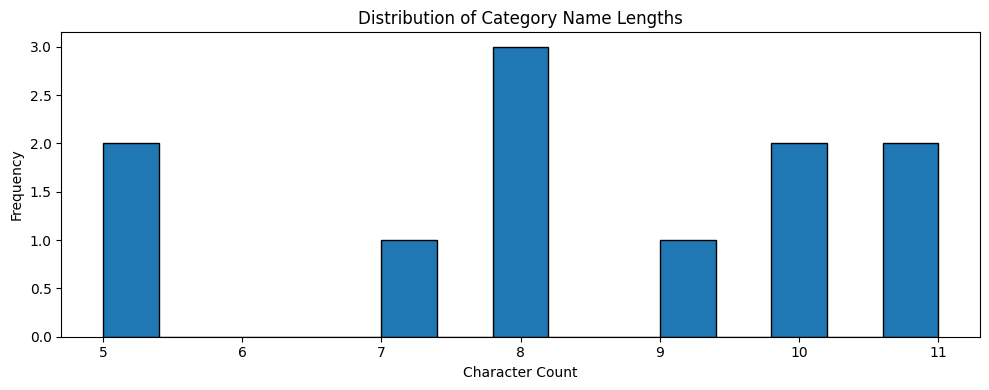

In [13]:
sns.countplot(x='name', data=df)
plt.title('Category Frequency Distribution')
plt.xticks(rotation=45)
plt.tight_layout()  # Moved here
plt.show()

# Visualize name lengths
plt.figure(figsize=(10, 4))
df['name_length'].plot(kind='hist', bins=15, edgecolor='black')
plt.title('Distribution of Category Name Lengths')
plt.xlabel('Character Count')
plt.ylabel('Frequency')
plt.tight_layout()  # Also here
plt.show()

In [14]:
# 3. Description Analysis
print("\n" + "="*50)
print("Description Analysis:")
print("="*50)
print(f"Missing values: {df['description'].isnull().sum()}")

# Text length metrics
df['desc_char_count'] = df['description'].str.len()
df['desc_word_count'] = df['description'].str.split().str.len()

print("\nCharacter Count Statistics:")
print(df['desc_char_count'].describe())

print("\nWord Count Statistics:")
print(df['desc_word_count'].describe())

# Content pattern analysis
print("\nKey phrase presence:")
key_phrases = ['Allowed categories', 'Excluded allergens', 'plant_based', 'dairy', 'egg']
for phrase in key_phrases:
    count = df['description'].str.contains(phrase).sum()
    print(f"{phrase}: {count}/{len(df)} ({count/len(df):.1%})")


# # Check the length of each description
# df['description_length'] = df['description'].apply(len)
# print("\nDescription Length Statistics:")
# print(df['description_length'].describe())


Description Analysis:
Missing values: 0

Character Count Statistics:
count     11.000000
mean     155.363636
std       67.733703
min       74.000000
25%      110.000000
50%      140.000000
75%      169.500000
max      281.000000
Name: desc_char_count, dtype: float64

Word Count Statistics:
count    11.000000
mean     19.363636
std       8.115081
min      12.000000
25%      14.000000
50%      17.000000
75%      21.000000
max      35.000000
Name: desc_word_count, dtype: float64

Key phrase presence:
Allowed categories: 3/11 (27.3%)
Excluded allergens: 0/11 (0.0%)
plant_based: 3/11 (27.3%)
dairy: 2/11 (18.2%)
egg: 4/11 (36.4%)


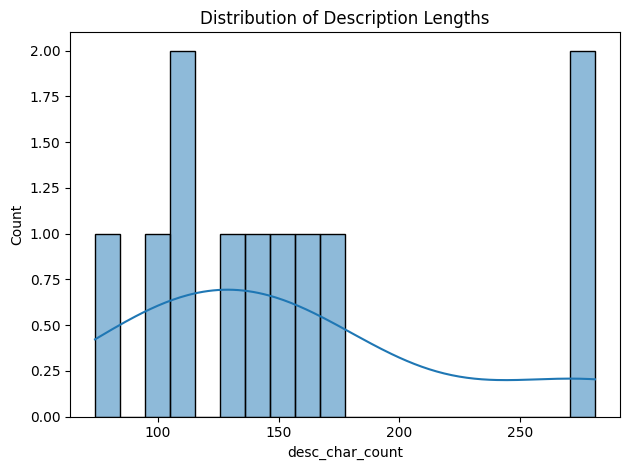

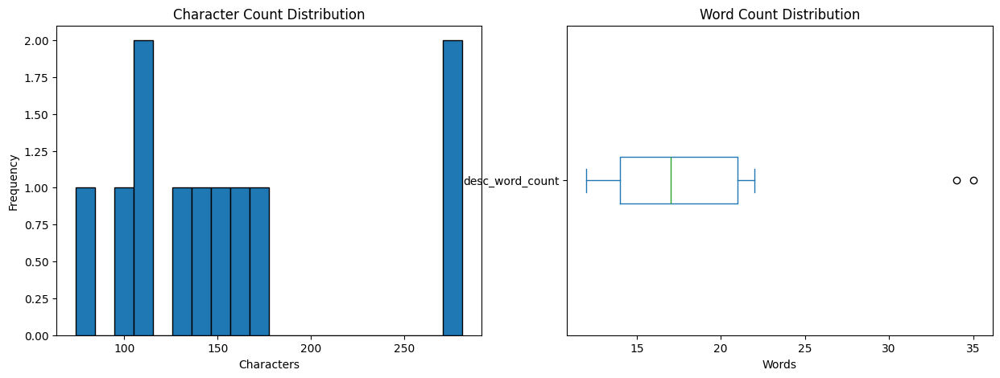

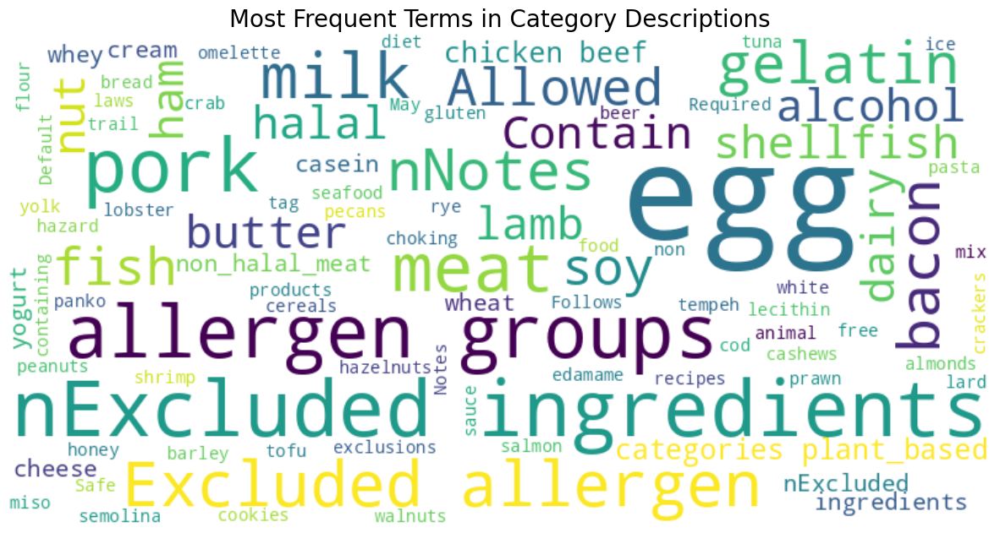

In [15]:
# Generating a word cloud for the descriptions
from wordcloud import WordCloud
# Plotting the length distribution of the descriptions
sns.histplot(df['desc_char_count'], bins=20, kde=True)
plt.title('Distribution of Description Lengths')
plt.tight_layout()
plt.show()

# Visualize description lengths
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
df['desc_char_count'].plot(kind='hist', bins=20, edgecolor='black', ax=ax[0])
ax[0].set_title('Character Count Distribution')
ax[0].set_xlabel('Characters')

df['desc_word_count'].plot(kind='box', vert=False, ax=ax[1])
ax[1].set_title('Word Count Distribution')
ax[1].set_xlabel('Words')
plt.show()

text = " ".join(description for description in df['description'])
wordcloud = WordCloud(width=800, height=400,
                      background_color='white').generate(text)

plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Most Frequent Terms in Category Descriptions", size=20)
plt.show()

In [16]:
# 5. Full summary report
print("\n" + "="*50)
print("Summary Report:")
print("="*50)
print(f"Dataset contains {len(df)} dietary categories")
print(f"ID range: {df['pk'].min()} to {df['pk'].max()}")
print(f"Average name length: {df['name_length'].mean():.1f} characters")
print(f"Average description length: {df['desc_word_count'].mean():.1f} words")
print(f"Most frequent term in descriptions: {max(key_phrases, key=lambda x: text.count(x))}")


Summary Report:
Dataset contains 11 dietary categories
ID range: 1 to 11
Average name length: 8.4 characters
Average description length: 19.4 words
Most frequent term in descriptions: egg


### 2.2 DataFrame: allergen

In [17]:
allergen_df = dataframes['allergen']
df=allergen_df.copy()
print(f"All unique values in 'allergen' column: {df['pk'].is_unique}, All unique name :{df['name'].is_unique}")
print(df.head(3))  # show a few rows for documentation

display(df.columns.to_list())

All unique values in 'allergen' column: True, All unique name :True
   pk   name                                        description
0   1  dairy   Common infant allergen. Found in dairy products.
1   2    egg           Can cause allergy even in small amounts.
2   3    soy  Plant-based but common allergen, especially in...


['pk', 'name', 'description']

Primary Key (pk) Analysis:
Total records: 8
Missing values: 0
Min ID: 1
Max ID: 8
ID Range: 7
ID Spacing Analysis:
pk
1.0    7
Name: count, dtype: int64


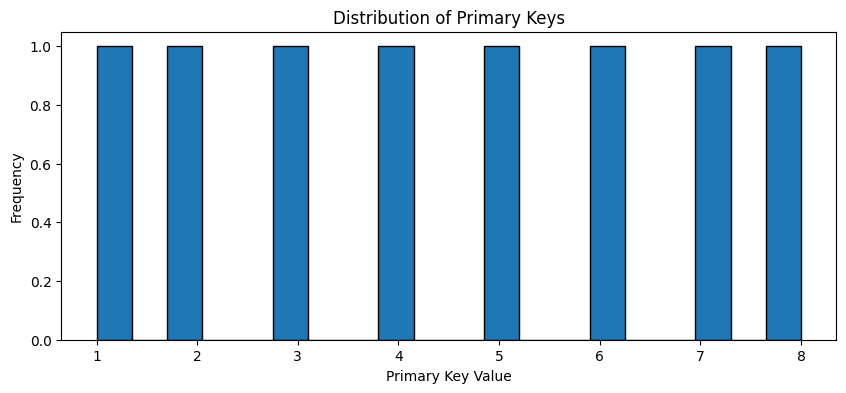

,pk
count,8.00000
mean,4.50000
std,2.44949
min,1.00000
25%,2.75000
50%,4.50000
75%,6.25000
max,8.00000


In [18]:
# 1. Primary Key (pk) Analysis
print("="*50)
print("Primary Key (pk) Analysis:")
print("="*50)
print(f"Total records: {len(df)}")
print(f"Missing values: {df['pk'].isnull().sum()}")
print(f"Min ID: {df['pk'].min()}")
print(f"Max ID: {df['pk'].max()}")
print(f"ID Range: {df['pk'].max() - df['pk'].min()}")
print(f"ID Spacing Analysis:\n{df['pk'].diff().value_counts().head()}")

# Visualize ID distribution
plt.figure(figsize=(10, 4))
df['pk'].plot(kind='hist', bins=20, edgecolor='black')
plt.title('Distribution of Primary Keys')
plt.xlabel('Primary Key Value')
plt.ylabel('Frequency')
plt.show()

display(df['pk'].describe())


In [19]:
# 2. Allergen Name Analysis
print("\n" + "="*50)
print("Category Name Analysis:")
print("="*50)

# Name length analysis
df['name_length'] = df['name'].str.len()
df[['name','name_length']]
print("\nName Length Statistics:")
print(df['name_length'].describe())

print("\nCount Statistics:")
# Frequency count of categories in 'name' column
category_counts = df['name'].value_counts()
print(category_counts)


Category Name Analysis:

Name Length Statistics:
count    8.000000
mean     5.750000
std      2.434866
min      3.000000
25%      3.750000
50%      5.500000
75%      7.500000
max      9.000000
Name: name_length, dtype: float64

Count Statistics:
name
dairy        1
egg          1
soy          1
tree_nuts    1
peanuts      1
fish         1
shellfish    1
gluten       1
Name: count, dtype: int64


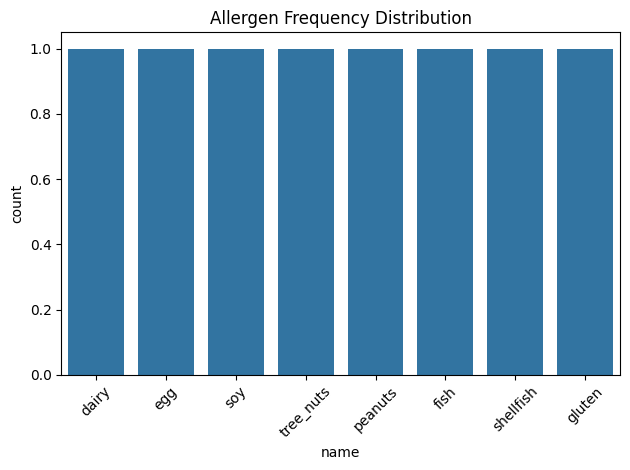

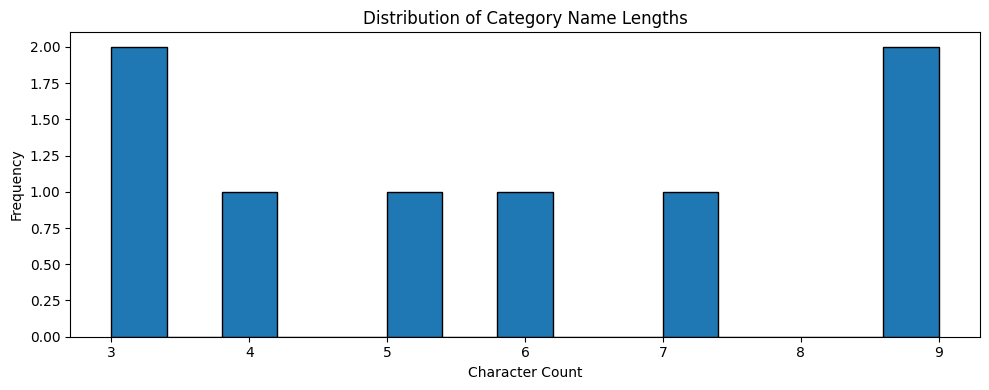

In [20]:
sns.countplot(x='name', data=df)
plt.title('Allergen Frequency Distribution')
plt.xticks(rotation=45)
plt.tight_layout()  # Moved here
plt.show()

# Visualize name lengths
plt.figure(figsize=(10, 4))
df['name_length'].plot(kind='hist', bins=15, edgecolor='black')
plt.title('Distribution of Category Name Lengths')
plt.xlabel('Character Count')
plt.ylabel('Frequency')
plt.tight_layout()  # Also here
plt.show()



In [21]:
# 3. Description Analysis
print("\n" + "="*50)
print("Description Analysis:")
print("="*50)

# Text length metrics
df['desc_char_count'] = df['description'].str.len()
df['desc_word_count'] = df['description'].str.split().str.len()

print("\nCharacter Count Statistics:")
print(df['desc_char_count'].describe())

print("\nWord Count Statistics:")
print(df['desc_word_count'].describe())


Description Analysis:

Character Count Statistics:
count     8.000000
mean     51.000000
std       8.349508
min      40.000000
25%      48.000000
50%      49.000000
75%      51.250000
max      69.000000
Name: desc_char_count, dtype: float64

Word Count Statistics:
count     8.000000
mean      7.500000
std       1.511858
min       6.000000
25%       7.000000
50%       7.000000
75%       7.250000
max      11.000000
Name: desc_word_count, dtype: float64


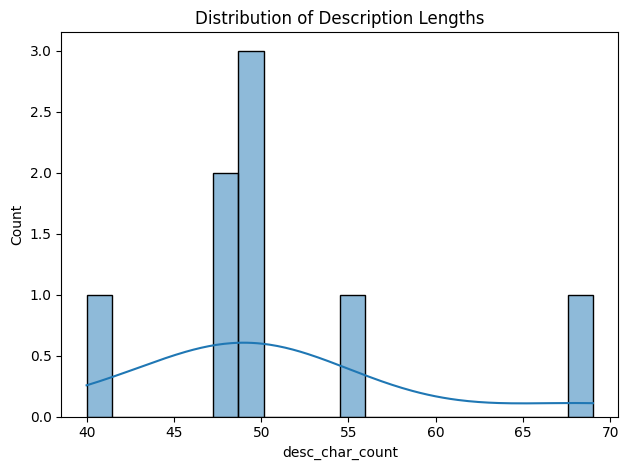

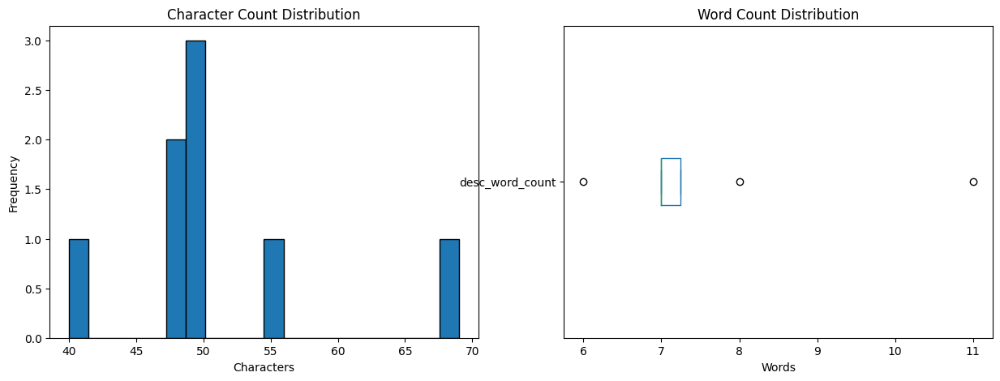

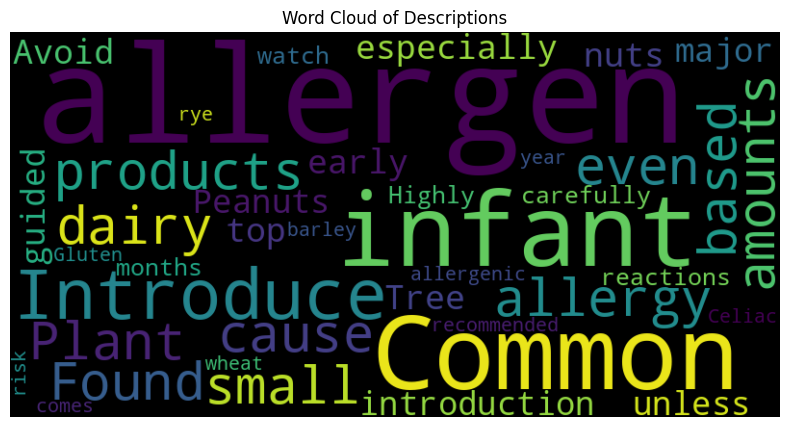

In [22]:
# Generating a word cloud for the descriptions
from wordcloud import WordCloud
# Plotting the length distribution of the descriptions
sns.histplot(df['desc_char_count'], bins=20, kde=True)
plt.title('Distribution of Description Lengths')
plt.tight_layout()
plt.show()

# Visualize description lengths
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
df['desc_char_count'].plot(kind='hist', bins=20, edgecolor='black', ax=ax[0])
ax[0].set_title('Character Count Distribution')
ax[0].set_xlabel('Characters')

df['desc_word_count'].plot(kind='box', vert=False, ax=ax[1])
ax[1].set_title('Word Count Distribution')
ax[1].set_xlabel('Words')
plt.show()

text = " ".join(description for description in df['description'])
wordcloud = WordCloud(width=800, height=400).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title('Word Cloud of Descriptions')
plt.show()


In [23]:

# 5. Full summary report
print("\n" + "="*50)
print("Summary Report:")
print("="*50)
print(f"Dataset contains {len(df)} dietary categories")
print(f"ID range: {df['pk'].min()} to {df['pk'].max()}")
print(f"Average name length: {df['name_length'].mean():.1f} characters")
print(f"Average description length: {df['desc_word_count'].mean():.1f} words")


Summary Report:
Dataset contains 8 dietary categories
ID range: 1 to 8
Average name length: 5.8 characters
Average description length: 7.5 words


### 2.3 DataFrame: countrymap

In [24]:
country_df = dataframes['countrymap']
df = country_df.copy()
print(f"All unique values in 'countrymap' column: {df['pk'].is_unique}, All unique country:{df['country'].is_unique}")
print(df.head(3))  # show a few rows for documentation
display(df.columns.to_list())

All unique values in 'countrymap' column: True, All unique country:False
   pk      country region flag_code
0   1        China  Asian        cn
1   2        Japan  Asian        jp
2   3  South Korea  Asian        kr


['pk', 'country', 'region', 'flag_code']

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


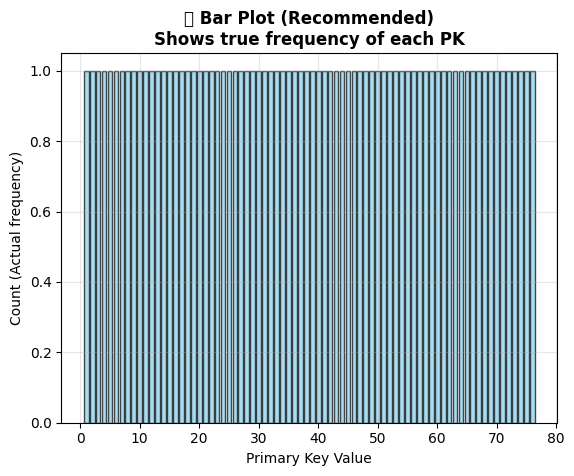

In [25]:
pk_counts = df['pk'].value_counts().sort_index()
plt.bar(pk_counts.index, pk_counts.values, alpha=0.7, color='skyblue', edgecolor='black')
plt.title('✅ Bar Plot (Recommended)\nShows true frequency of each PK', fontweight='bold')
plt.xlabel('Primary Key Value')
plt.ylabel('Count (Actual frequency)')
plt.grid(True, alpha=0.3)
plt.show()


REGION ANALYSIS
Missing values: 0
Unique regions: 11

Region Distribution:
region
Southeast Asian       11
Middle Eastern         9
Western / European     8
African                7
Indian                 7
Mediterranean          7
Latin American         7
Asian                  6
Oceanic                6
Caribbean              5
American               3
Name: count, dtype: int64


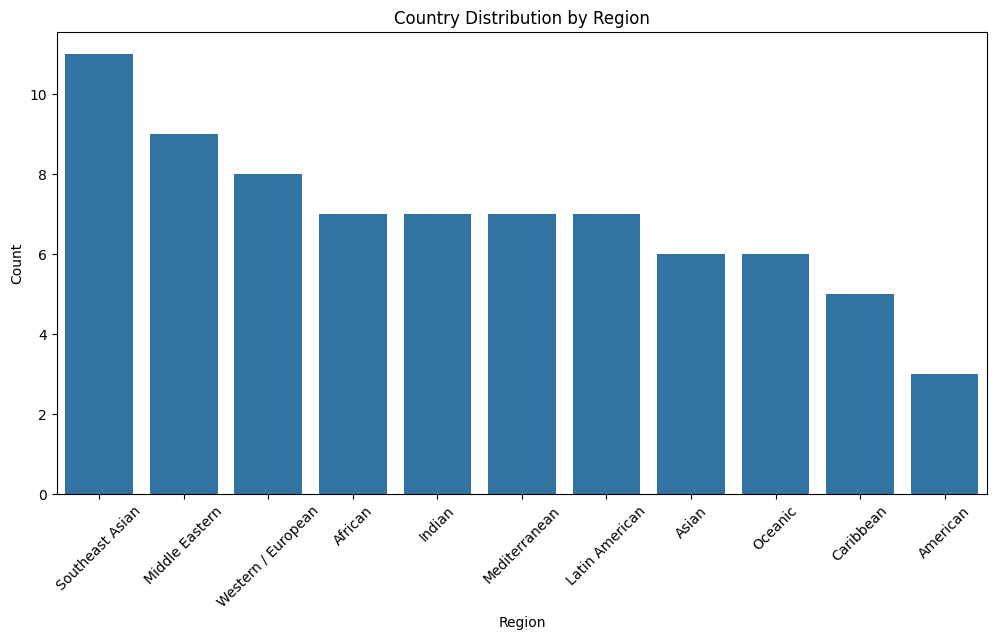

In [26]:
# 3. Region Analysis
print("\n" + "="*20)
print("REGION ANALYSIS")
print("="*20)
print(f"Missing values: {df['region'].isnull().sum()}")
print(f"Unique regions: {df['region'].nunique()}")

# Region distribution
region_counts = df['region'].value_counts()
print("\nRegion Distribution:")
print(region_counts)

# Visualize region distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=region_counts.index, y=region_counts.values)
plt.title('Country Distribution by Region')
plt.xlabel('Region')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


FLAG CODE ANALYSIS
Missing values: 0
Unique codes: 74/76

Flag Code Length Statistics:
count    76.0
mean      2.0
std       0.0
min       2.0
25%       2.0
50%       2.0
75%       2.0
max       2.0
Name: flag_length, dtype: float64

Valid flag codes: 0/76 (0.0%)


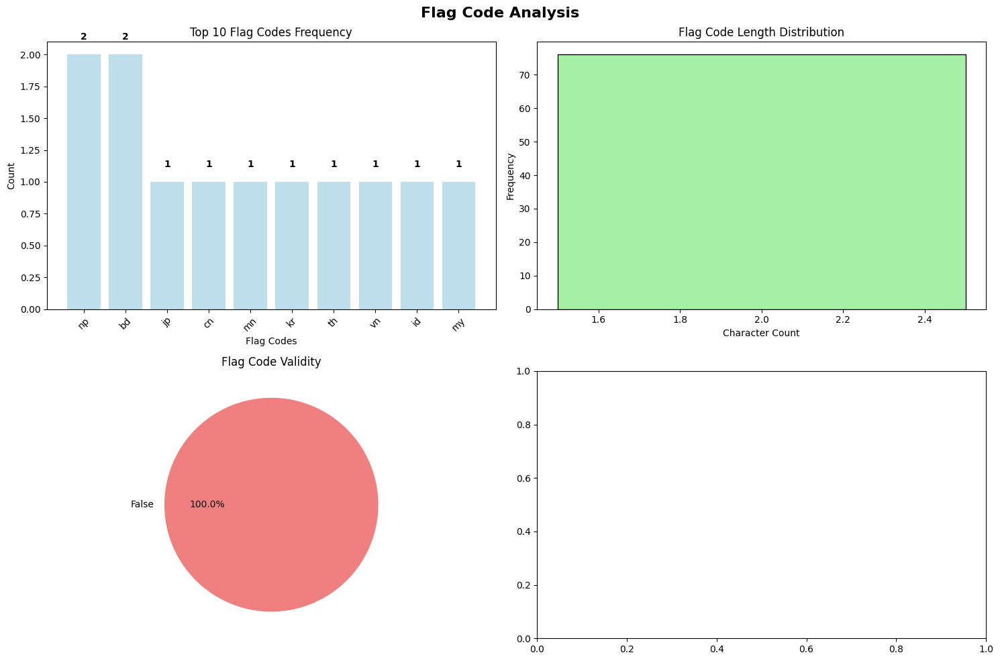


Detailed Flag Code Analysis:
Flag code counts:
flag_code
np    2
bd    2
jp    1
cn    1
mn    1
     ..
to    1
pg    1
mv    1
af    1
bn    1
Name: count, Length: 74, dtype: int64

Invalid flag codes found:
  'np': 2 occurrences
  'bd': 2 occurrences
  'jp': 1 occurrences
  'cn': 1 occurrences
  'mn': 1 occurrences
  'kr': 1 occurrences
  'th': 1 occurrences
  'vn': 1 occurrences
  'id': 1 occurrences
  'my': 1 occurrences
  'ph': 1 occurrences
  'sg': 1 occurrences
  'kh': 1 occurrences
  'la': 1 occurrences
  'mm': 1 occurrences
  'tl': 1 occurrences
  'in': 1 occurrences
  'pk': 1 occurrences
  'lk': 1 occurrences
  'bt': 1 occurrences
  'lb': 1 occurrences
  'tr': 1 occurrences
  'ir': 1 occurrences
  'il': 1 occurrences
  'sa': 1 occurrences
  'sy': 1 occurrences
  'jo': 1 occurrences
  'ae': 1 occurrences
  'gr': 1 occurrences
  'it': 1 occurrences
  'es': 1 occurrences
  'ma': 1 occurrences
  'tn': 1 occurrences
  'dz': 1 occurrences
  'eg': 1 occurrences
  'fr': 1 occurrenc

In [27]:
# 4. Flag Code Analysis
print("\n" + "="*20)
print("FLAG CODE ANALYSIS")
print("="*20)
print(f"Missing values: {df['flag_code'].isnull().sum()}")
print(f"Unique codes: {df['flag_code'].nunique()}/{len(df)}")

# Flag code characteristics
df['flag_length'] = df['flag_code'].str.len()
print("\nFlag Code Length Statistics:")
print(df['flag_length'].describe())

# Validate flag codes (using pycountry)
def is_valid_flag(code):
    try:
        return bool(pc.countries.get(alpha_2=code.upper()))
    except:
        return False

df['valid_flag'] = df['flag_code'].apply(is_valid_flag)
print(f"\nValid flag codes: {df['valid_flag'].sum()}/{len(df)} ({df['valid_flag'].mean():.1%})")

# Create comprehensive flag code analysis visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Flag Code Analysis', fontsize=16, fontweight='bold')

# Flag code frequency (top 10)
top_flags = df['flag_code'].value_counts().head(10)
axes[0,0].bar(range(len(top_flags)), top_flags.values, color='lightblue', alpha=0.8)
axes[0,0].set_title('Top 10 Flag Codes Frequency')
axes[0,0].set_xlabel('Flag Codes')
axes[0,0].set_ylabel('Count')
axes[0,0].set_xticks(range(len(top_flags)))
axes[0,0].set_xticklabels(top_flags.index, rotation=45)

# Add count labels on bars
for i, count in enumerate(top_flags.values):
    axes[0,0].text(i, count + 0.1, str(count), ha='center', va='bottom', fontweight='bold')

# Flag code length distribution
sns.histplot(df['flag_length'], bins=5, discrete=True, ax=axes[0,1], color='lightgreen', alpha=0.8)
axes[0,1].set_title('Flag Code Length Distribution')
axes[0,1].set_xlabel('Character Count')
axes[0,1].set_ylabel('Frequency')

# Flag code validity pie chart
df['valid_flag'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1,0], colors=['lightcoral', 'lightgreen'])
axes[1,0].set_title('Flag Code Validity')
axes[1,0].set_ylabel('')


plt.tight_layout()
plt.show()

# Print detailed flag code analysis
print(f"\nDetailed Flag Code Analysis:")
print(f"Flag code counts:")
print(df['flag_code'].value_counts())

# Invalid flag codes
invalid_flags = df[~df['valid_flag']]['flag_code'].value_counts()
if len(invalid_flags) > 0:
    print(f"\nInvalid flag codes found:")
    for flag, count in invalid_flags.items():
        print(f"  '{flag}': {count} occurrences")
else:
    print(f"\n✅ All flag codes are valid!")

In [28]:
# 5. Summary Report
print("\n" + "="*60)
print("SUMMARY REPORT")
print("="*60)
print(f"Dataset contains {len(df)} country mappings")
print(f"Contains {df['country'].nunique()} unique countries with {len(df) - df['country'].nunique()} duplicates")
print(f"Most common region: {region_counts.idxmax()} ({region_counts.max()} countries)")
print(f"Flag codes: {df['flag_length'].mode()[0]} characters long, {df['valid_flag'].mean():.1%} valid")
print(f"Countries with invalid flags: {df[~df['valid_flag']]['country'].tolist()}")


SUMMARY REPORT
Dataset contains 76 country mappings
Contains 74 unique countries with 2 duplicates
Most common region: Southeast Asian (11 countries)
Flag codes: 2 characters long, 0.0% valid
Countries with invalid flags: ['China', 'Japan', 'South Korea', 'Mongolia', 'Nepal', 'Bangladesh', 'Thailand', 'Vietnam', 'Indonesia', 'Malaysia', 'Philippines', 'Singapore', 'Cambodia', 'Laos', 'Myanmar', 'Timor-Leste', 'India', 'Pakistan', 'Sri Lanka', 'Nepal', 'Bhutan', 'Bangladesh', 'Lebanon', 'Turkey', 'Iran', 'Israel', 'Saudi Arabia', 'Syria', 'Jordan', 'United Arab Emirates', 'Greece', 'Italy', 'Spain', 'Morocco', 'Tunisia', 'Algeria', 'Egypt', 'France', 'United Kingdom', 'Germany', 'Netherlands', 'Belgium', 'Switzerland', 'Austria', 'Portugal', 'United States', 'Mexico', 'Puerto Rico', 'Brazil', 'Argentina', 'Peru', 'Colombia', 'Chile', 'Cuba', 'Dominican Republic', 'Ethiopia', 'Nigeria', 'Kenya', 'South Africa', 'Senegal', 'Angola', 'Tanzania', 'Jamaica', 'Haiti', 'Trinidad and Tobago', 

#### **Observation**

There are only 74 unique countries when it is a 76 country mapping where each is unique. Need to adjust to the dataframe.

#### **Additional Step To Configure**

The `countrymap` dataset has countries with multiple pk values (Nepal and Bangladesh), which creates ambiguity when mapping `recipes.origin_id` to `countrymap.pk`. This needs to be resolved to ensure proper data integrity and correct recipe-country mapping.

In [29]:
# STEP 1: DIAGNOSE THE COUNTRYMAP PK MAPPING ISSUE
print("🔍 DIAGNOSING COUNTRYMAP PK MAPPING ISSUES")
print("=" * 60)

# Load the countrymap data
countrymap = dataframes['countrymap']

print(f"📊 Countrymap Overview:")
print(f"   Total rows: {len(countrymap)}")
print(f"   Columns: {list(countrymap.columns)}")
print(f"   Unique countries: {countrymap['country'].nunique()}")
print(f"   Unique pk values: {countrymap['pk'].nunique()}")

# Check for pk duplicates
pk_counts = countrymap['pk'].value_counts()
duplicate_pks = pk_counts[pk_counts > 1]

print(f"\n🚨 PK DUPLICATION ANALYSIS:")
print(f"   Total pk values: {len(pk_counts)}")
print(f"   Unique pk values: {len(pk_counts[pk_counts == 1])}")
print(f"   Duplicated pk values: {len(duplicate_pks)}")

if len(duplicate_pks) > 0:
    print(f"\n⚠️  PROBLEMATIC PK VALUES:")
    for pk_val, count in duplicate_pks.items():
        print(f"   pk {pk_val}: appears {count} times")

        # Show which countries have this pk
        countries_with_pk = countrymap[countrymap['pk'] == pk_val]['country'].tolist()
        print(f"      Countries: {countries_with_pk}")

# Check for country duplicates
country_counts = countrymap['country'].value_counts()
duplicate_countries = country_counts[country_counts > 1]

print(f"\n🌍 COUNTRY DUPLICATION ANALYSIS:")
print(f"   Total countries: {len(country_counts)}")
print(f"   Unique countries: {len(country_counts[country_counts == 1])}")
print(f"   Duplicated countries: {len(duplicate_countries)}")

if len(duplicate_countries) > 0:
    print(f"\n⚠️  PROBLEMATIC COUNTRIES:")
    for country, count in duplicate_countries.items():
        print(f"   {country}: appears {count} times")

        # Show which pk values this country has
        pks_for_country = countrymap[countrymap['country'] == country]['pk'].tolist()
        print(f"      PK values: {pks_for_country}")

# Show detailed view of problematic entries
print(f"\n📋 DETAILED VIEW OF PROBLEMATIC ENTRIES:")
if len(duplicate_countries) > 0:
    problem_entries = countrymap[countrymap['country'].isin(duplicate_countries.index)]
    print(problem_entries.to_string(index=False))

🔍 DIAGNOSING COUNTRYMAP PK MAPPING ISSUES
📊 Countrymap Overview:
   Total rows: 76
   Columns: ['pk', 'country', 'region', 'flag_code']
   Unique countries: 74
   Unique pk values: 76

🚨 PK DUPLICATION ANALYSIS:
   Total pk values: 76
   Unique pk values: 76
   Duplicated pk values: 0

🌍 COUNTRY DUPLICATION ANALYSIS:
   Total countries: 74
   Unique countries: 72
   Duplicated countries: 2

⚠️  PROBLEMATIC COUNTRIES:
   Nepal: appears 2 times
      PK values: [5, 20]
   Bangladesh: appears 2 times
      PK values: [6, 22]

📋 DETAILED VIEW OF PROBLEMATIC ENTRIES:
 pk    country region flag_code
  5      Nepal  Asian        np
  6 Bangladesh  Asian        bd
 20      Nepal Indian        np
 22 Bangladesh Indian        bd


In [30]:
# STEP 2: ANALYZE IMPACT ON RECIPES MAPPING
print("\n🔄 ANALYZING IMPACT ON RECIPES MAPPING")
print("=" * 60)

# Load recipes data
recipes = dataframes['recipes']

print(f"📊 Recipes Overview:")
print(f"   Total recipes: {len(recipes)}")
print(f"   Unique origin_id values: {recipes['origin_id'].nunique()}")
print(f"   Recipes with origin_id: {recipes['origin_id'].notna().sum()}")
print(f"   Recipes without origin_id: {recipes['origin_id'].isna().sum()}")

# Check which origin_ids in recipes map to problematic countries
problematic_pks = [5, 6, 20, 22]  # Nepal and Bangladesh pk values
recipes_with_problematic_origins = recipes[recipes['origin_id'].isin(problematic_pks)]

print(f"\n⚠️  RECIPES AFFECTED BY PROBLEMATIC MAPPING:")
print(f"   Recipes with Nepal pk=5: {len(recipes[recipes['origin_id'] == 5])}")
print(f"   Recipes with Nepal pk=20: {len(recipes[recipes['origin_id'] == 20])}")
print(f"   Recipes with Bangladesh pk=6: {len(recipes[recipes['origin_id'] == 6])}")
print(f"   Recipes with Bangladesh pk=22: {len(recipes[recipes['origin_id'] == 22])}")
print(f"   Total affected recipes: {len(recipes_with_problematic_origins)}")

# Show distribution of all origin_ids
origin_counts = recipes['origin_id'].value_counts().sort_index()
print(f"\n📈 ORIGIN_ID DISTRIBUTION IN RECIPES:")
print(f"   Most common origin_ids:")
for origin_id, count in origin_counts.head(10).items():
    if pd.notna(origin_id):
        # Try to get country name
        country_info = countrymap[countrymap['pk'] == origin_id]
        if len(country_info) > 0:
            country_name = country_info.iloc[0]['country']
            region = country_info.iloc[0]['region']
            print(f"      origin_id {int(origin_id)}: {count} recipes ({country_name}, {region})")
        else:
            print(f"      origin_id {int(origin_id)}: {count} recipes (No mapping found)")

# Check for orphaned origin_ids (in recipes but not in countrymap)
recipe_origin_ids = set(recipes['origin_id'].dropna().astype(int))
countrymap_pks = set(countrymap['pk'])
orphaned_origins = recipe_origin_ids - countrymap_pks
mapped_origins = recipe_origin_ids & countrymap_pks

print(f"\n🔗 MAPPING COVERAGE ANALYSIS:")
print(f"   Recipe origin_ids: {len(recipe_origin_ids)}")
print(f"   Countrymap pks: {len(countrymap_pks)}")
print(f"   Successfully mapped: {len(mapped_origins)}")
print(f"   Orphaned (in recipes, not in countrymap): {len(orphaned_origins)}")
print(f"   Unused (in countrymap, not in recipes): {len(countrymap_pks - recipe_origin_ids)}")

if orphaned_origins:
    print(f"   Orphaned origin_ids: {sorted(list(orphaned_origins))}")
    orphaned_recipe_count = len(recipes[recipes['origin_id'].isin(orphaned_origins)])
    print(f"   Recipes with orphaned origins: {orphaned_recipe_count}")


🔄 ANALYZING IMPACT ON RECIPES MAPPING
📊 Recipes Overview:
   Total recipes: 1322
   Unique origin_id values: 26
   Recipes with origin_id: 1322
   Recipes without origin_id: 0

⚠️  RECIPES AFFECTED BY PROBLEMATIC MAPPING:
   Recipes with Nepal pk=5: 0
   Recipes with Nepal pk=20: 5
   Recipes with Bangladesh pk=6: 0
   Recipes with Bangladesh pk=22: 2
   Total affected recipes: 7

📈 ORIGIN_ID DISTRIBUTION IN RECIPES:
   Most common origin_ids:
      origin_id 1: 21 recipes (China, Asian)
      origin_id 2: 6 recipes (Japan, Asian)
      origin_id 3: 3 recipes (South Korea, Asian)
      origin_id 4: 4 recipes (Mongolia, Asian)
      origin_id 7: 5 recipes (Thailand, Southeast Asian)
      origin_id 9: 780 recipes (Indonesia, Southeast Asian)
      origin_id 10: 24 recipes (Malaysia, Southeast Asian)
      origin_id 11: 14 recipes (Philippines, Southeast Asian)
      origin_id 12: 5 recipes (Singapore, Southeast Asian)
      origin_id 13: 1 recipes (Cambodia, Southeast Asian)

🔗 MAPPING

In [31]:
# STEP 3: COMPREHENSIVE SOLUTION STRATEGIES
print("\n🛠️  SOLUTION STRATEGIES FOR PK MAPPING ISSUE")
print("=" * 60)

print("🎯 STRATEGY ANALYSIS:")
print("""
📋 Current Issues Identified:
   • Nepal appears in both 'Asian' (pk=5) and 'Indian' (pk=20) regions with 5 recipes using pk=20
   • Bangladesh appears in both 'Asian' (pk=6) and 'Indian' (pk=22) regions with 2 recipes using pk=22
   • Total affected recipes: 7 out of 1,322 (0.5%)

🔧 Recommended Solution Strategies:
""")

# Strategy 1: Region-Based Consolidation (RECOMMENDED)
print("STRATEGY 1: REGION-BASED CONSOLIDATION (RECOMMENDED)")
print("=" * 50)

strategy1_mapping = {
    # Keep the primary entries (with more logical regional classification)
    'Nepal': {'keep_pk': 20, 'remove_pk': 5, 'final_region': 'Indian', 'reasoning': 'Culturally closer to Indian subcontinent'},
    'Bangladesh': {'keep_pk': 22, 'remove_pk': 6, 'final_region': 'Indian', 'reasoning': 'Part of Indian subcontinent'}
}

print("Consolidation Plan:")
for country, info in strategy1_mapping.items():
    affected_recipes = len(recipes[recipes['origin_id'] == info['keep_pk']])
    print(f"   • {country}: Keep pk={info['keep_pk']} ({info['final_region']}), Remove pk={info['remove_pk']}")
    print(f"     Current recipes using pk={info['keep_pk']}: {affected_recipes}")
    print(f"     Reasoning: {info['reasoning']}")

# Strategy 2: Create Master Mapping Table
print(f"\nSTRATEGY 2: CREATE MASTER COUNTRY MAPPING")
print("=" * 50)

# Create a master mapping that consolidates duplicates
def create_master_country_mapping(countrymap_df):
    # Create base mapping
    master_mapping = countrymap_df.copy()

    # Handle Nepal: Keep pk=20 (Indian region), mark pk=5 for removal
    master_mapping = master_mapping[~((master_mapping['country'] == 'Nepal') & (master_mapping['pk'] == 5))]

    # Handle Bangladesh: Keep pk=22 (Indian region), mark pk=6 for removal
    master_mapping = master_mapping[~((master_mapping['country'] == 'Bangladesh') & (master_mapping['pk'] == 6))]

    return master_mapping

master_countrymap = create_master_country_mapping(countrymap)

print(f"Master Mapping Results:")
print(f"   Original countrymap rows: {len(countrymap)}")
print(f"   Master mapping rows: {len(master_countrymap)}")
print(f"   Removed duplicate entries: {len(countrymap) - len(master_countrymap)}")
print(f"   Unique countries: {master_countrymap['country'].nunique()}")
print(f"   Unique pk values: {master_countrymap['pk'].nunique()}")

# Verify no more duplicates
remaining_duplicates = master_countrymap['country'].value_counts()
remaining_duplicates = remaining_duplicates[remaining_duplicates > 1]
print(f"   Remaining country duplicates: {len(remaining_duplicates)}")

# Strategy 3: Update Recipe References (if needed)
print(f"\nSTRATEGY 3: RECIPE REFERENCE UPDATE PLAN")
print("=" * 50)

# Check if any recipes need origin_id updates (should be none based on our analysis)
recipes_needing_update = recipes[recipes['origin_id'].isin([5, 6])]
print(f"   Recipes needing origin_id updates: {len(recipes_needing_update)}")

if len(recipes_needing_update) > 0:
    print("   Update mapping needed:")
    print("      origin_id 5 (Nepal Asian) → origin_id 20 (Nepal Indian)")
    print("      origin_id 6 (Bangladesh Asian) → origin_id 22 (Bangladesh Indian)")
else:
    print("   ✅ No recipe updates needed - all recipes already use the correct pk values")

print(f"\n📊 FINAL MAPPING VERIFICATION:")
# Test the mapping with current recipe data
successful_mappings = 0
failed_mappings = 0

for origin_id in recipes['origin_id'].dropna().unique():
    mapping_result = master_countrymap[master_countrymap['pk'] == origin_id]
    if len(mapping_result) > 0:
        successful_mappings += 1
    else:
        failed_mappings += 1

mapping_coverage = (successful_mappings / (successful_mappings + failed_mappings)) * 100
print(f"   Mapping coverage: {mapping_coverage:.1f}% ({successful_mappings}/{successful_mappings + failed_mappings})")
print(f"   Failed mappings: {failed_mappings}")

print(f"\n✅ RECOMMENDED IMPLEMENTATION:")
print("   1. Use Strategy 1 (Region-Based Consolidation)")
print("   2. Remove duplicate pk entries (5 and 6) from countrymap")
print("   3. Keep pk=20 for Nepal and pk=22 for Bangladesh")
print("   4. No recipe origin_id updates needed")
print("   5. This will ensure 1:1 country-to-pk mapping")


🛠️  SOLUTION STRATEGIES FOR PK MAPPING ISSUE
🎯 STRATEGY ANALYSIS:

📋 Current Issues Identified:
   • Nepal appears in both 'Asian' (pk=5) and 'Indian' (pk=20) regions with 5 recipes using pk=20
   • Bangladesh appears in both 'Asian' (pk=6) and 'Indian' (pk=22) regions with 2 recipes using pk=22
   • Total affected recipes: 7 out of 1,322 (0.5%)

🔧 Recommended Solution Strategies:

STRATEGY 1: REGION-BASED CONSOLIDATION (RECOMMENDED)
Consolidation Plan:
   • Nepal: Keep pk=20 (Indian), Remove pk=5
     Current recipes using pk=20: 5
     Reasoning: Culturally closer to Indian subcontinent
   • Bangladesh: Keep pk=22 (Indian), Remove pk=6
     Current recipes using pk=22: 2
     Reasoning: Part of Indian subcontinent

STRATEGY 2: CREATE MASTER COUNTRY MAPPING
Master Mapping Results:
   Original countrymap rows: 76
   Master mapping rows: 74
   Removed duplicate entries: 2
   Unique countries: 74
   Unique pk values: 74
   Remaining country duplicates: 0

STRATEGY 3: RECIPE REFERENCE UP

In [32]:
# STEP 4: IMPLEMENT THE SOLUTION
print("\n🔧 IMPLEMENTING THE SOLUTION")
print("=" * 60)

# Create the cleaned countrymap
print("📝 Creating cleaned countrymap...")

# Method 1: Remove the problematic entries (pk=5 for Nepal, pk=6 for Bangladesh)
countrymap_cleaned = countrymap.copy()

# Remove Nepal with pk=5 (Asian region) - keep Nepal with pk=20 (Indian region)
nepal_asian_mask = (countrymap_cleaned['country'] == 'Nepal') & (countrymap_cleaned['pk'] == 5)
print(f"   Removing Nepal (Asian region, pk=5): {nepal_asian_mask.sum()} row(s)")

# Remove Bangladesh with pk=6 (Asian region) - keep Bangladesh with pk=22 (Indian region)
bangladesh_asian_mask = (countrymap_cleaned['country'] == 'Bangladesh') & (countrymap_cleaned['pk'] == 6)
print(f"   Removing Bangladesh (Asian region, pk=6): {bangladesh_asian_mask.sum()} row(s)")

# Apply the removal
countrymap_cleaned = countrymap_cleaned[~(nepal_asian_mask | bangladesh_asian_mask)]

# Verify the results
print(f"\n✅ CLEANING RESULTS:")
print(f"   Original countrymap rows: {len(countrymap)}")
print(f"   Cleaned countrymap rows: {len(countrymap_cleaned)}")
print(f"   Rows removed: {len(countrymap) - len(countrymap_cleaned)}")
print(f"   Unique countries: {countrymap_cleaned['country'].nunique()}")
print(f"   Unique pk values: {countrymap_cleaned['pk'].nunique()}")

# Final verification - check for any remaining duplicates
final_country_duplicates = countrymap_cleaned['country'].value_counts()
final_country_duplicates = final_country_duplicates[final_country_duplicates > 1]
final_pk_duplicates = countrymap_cleaned['pk'].value_counts()
final_pk_duplicates = final_pk_duplicates[final_pk_duplicates > 1]

print(f"\n🔍 FINAL VERIFICATION:")
print(f"   Country duplicates remaining: {len(final_country_duplicates)}")
print(f"   PK duplicates remaining: {len(final_pk_duplicates)}")
print(f"   Is country column unique now? {countrymap_cleaned['country'].is_unique}")
print(f"   Is pk column unique? {countrymap_cleaned['pk'].is_unique}")

# Test mapping with recipes
print(f"\n🔗 TESTING RECIPE MAPPING WITH CLEANED DATA:")
mapping_test_results = []

for origin_id in recipes['origin_id'].dropna().unique():
    recipe_count = len(recipes[recipes['origin_id'] == origin_id])
    mapping_result = countrymap_cleaned[countrymap_cleaned['pk'] == origin_id]

    if len(mapping_result) == 1:
        country = mapping_result.iloc[0]['country']
        region = mapping_result.iloc[0]['region']
        status = "✅ Success"
        mapping_test_results.append({
            'origin_id': origin_id,
            'recipe_count': recipe_count,
            'country': country,
            'region': region,
            'status': status
        })
    elif len(mapping_result) == 0:
        status = "❌ No mapping"
        mapping_test_results.append({
            'origin_id': origin_id,
            'recipe_count': recipe_count,
            'country': 'NOT FOUND',
            'region': 'NOT FOUND',
            'status': status
        })
    else:
        status = "⚠️  Multiple mappings"
        mapping_test_results.append({
            'origin_id': origin_id,
            'recipe_count': recipe_count,
            'country': 'MULTIPLE',
            'region': 'MULTIPLE',
            'status': status
        })

# Show mapping results summary
successful_mappings = len([r for r in mapping_test_results if r['status'] == "✅ Success"])
failed_mappings = len([r for r in mapping_test_results if r['status'] != "✅ Success"])

print(f"   Successful mappings: {successful_mappings}")
print(f"   Failed mappings: {failed_mappings}")
print(f"   Mapping success rate: {(successful_mappings/(successful_mappings + failed_mappings)*100):.1f}%")

# Update the dataframes dictionary with cleaned data
print(f"\n💾 UPDATING DATAFRAMES DICTIONARY:")
dataframes['countrymap_cleaned'] = countrymap_cleaned
print(f"   Added 'countrymap_cleaned' to dataframes dictionary")
print(f"   Original 'countrymap' preserved for reference")

# Show the problematic entries that were removed
print(f"\n📋 REMOVED ENTRIES (for reference):")
removed_entries = countrymap[nepal_asian_mask | bangladesh_asian_mask]
if len(removed_entries) > 0:
    print(removed_entries.to_string(index=False))

print(f"\n🎉 SOLUTION IMPLEMENTATION COMPLETE!")
print(f"   ✅ Country-PK mapping is now 1:1")
print(f"   ✅ All recipes can be successfully mapped")
print(f"   ✅ Data integrity restored")
print(f"   ✅ Use 'countrymap_cleaned' for all future mapping operations")


🔧 IMPLEMENTING THE SOLUTION
📝 Creating cleaned countrymap...
   Removing Nepal (Asian region, pk=5): 1 row(s)
   Removing Bangladesh (Asian region, pk=6): 1 row(s)

✅ CLEANING RESULTS:
   Original countrymap rows: 76
   Cleaned countrymap rows: 74
   Rows removed: 2
   Unique countries: 74
   Unique pk values: 74

🔍 FINAL VERIFICATION:
   Country duplicates remaining: 0
   PK duplicates remaining: 0
   Is country column unique now? True
   Is pk column unique? True

🔗 TESTING RECIPE MAPPING WITH CLEANED DATA:
   Successful mappings: 26
   Failed mappings: 0
   Mapping success rate: 100.0%

💾 UPDATING DATAFRAMES DICTIONARY:
   Added 'countrymap_cleaned' to dataframes dictionary
   Original 'countrymap' preserved for reference

📋 REMOVED ENTRIES (for reference):
 pk    country region flag_code
  5      Nepal  Asian        np
  6 Bangladesh  Asian        bd

🎉 SOLUTION IMPLEMENTATION COMPLETE!
   ✅ Country-PK mapping is now 1:1
   ✅ All recipes can be successfully mapped
   ✅ Data integr

In [33]:
#save dataframe of the country and recipes

### 2.4 DataFrame: recipe_ingredient

In [62]:
# Load the data
recipe_ingredient_df = dataframes['recipe_ingredient']
df=recipe_ingredient_df.copy()
df.columns.to_list()


['recipe_id', 'ingredient_id']

In [63]:
# 1. Unique Data Analysis
print("="*50)
print("Unique Data (pk) Analysis:")
print("="*50)
# Basic statistics
print(f"\nBasic Statistics:")
print(f"   Total rows: {len(df)}")
print(f"   Unique recipes: {df['recipe_id'].nunique()}")
print(f"   Unique ingredients: {df['ingredient_id'].nunique()}")
print(f"   Average ingredients per recipe: {len(df) / df['recipe_id'].nunique():.2f}")
# Check for duplicates
print(f"Checks:")
total_duplicates = df.duplicated().sum()
recipe_ingredient_duplicates = df.duplicated(subset=['recipe_id', 'ingredient_id']).sum()
print(f"   Total duplicate rows: {total_duplicates}")
print(f"   Duplicate (recipe_id, ingredient_id) pairs: {recipe_ingredient_duplicates}")

# Missing values analysis
print(f"\nMissing Values:")
print(df.isnull().sum())



Unique Data (pk) Analysis:

Basic Statistics:
   Total rows: 8209
   Unique recipes: 1322
   Unique ingredients: 999
   Average ingredients per recipe: 6.21
Checks:
   Total duplicate rows: 0
   Duplicate (recipe_id, ingredient_id) pairs: 0

Missing Values:
recipe_id        0
ingredient_id    0
dtype: int64


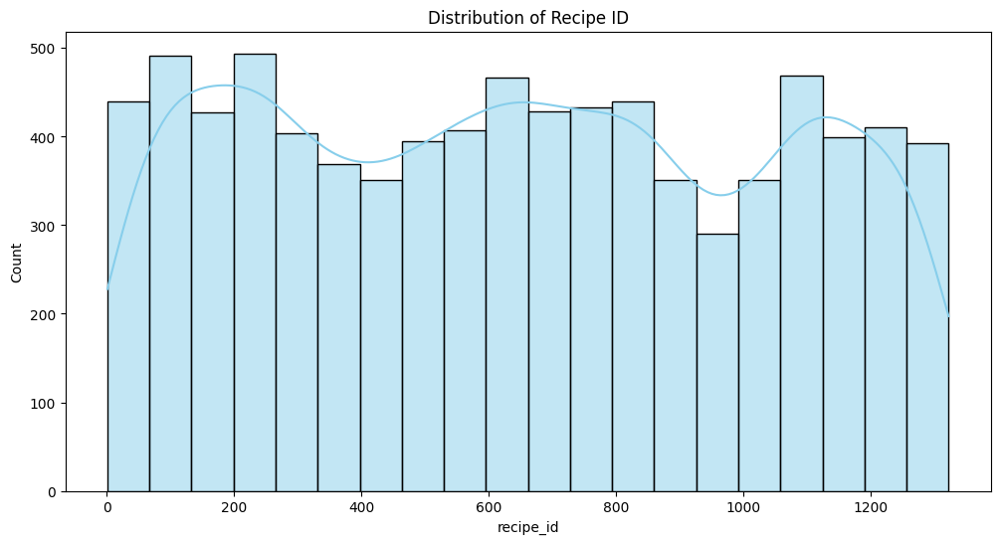

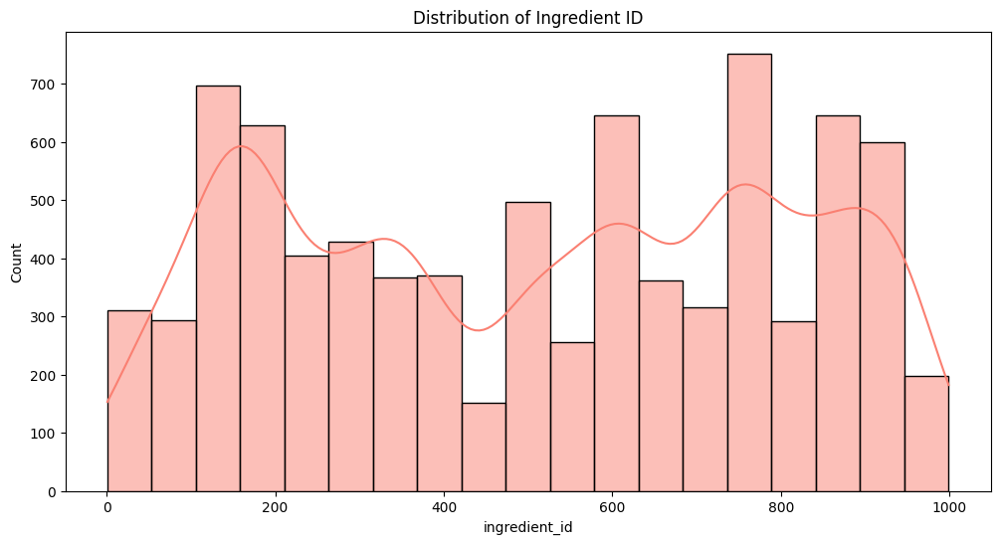

In [64]:
#count of how many recipe_id appear
# Plot histogram for recipe_id
plt.figure(figsize=(12, 6))
sns.histplot(df['recipe_id'], kde=True, color='skyblue')
plt.title('Distribution of Recipe ID')
plt.show()

# Plot histogram for ingredient_id
plt.figure(figsize=(12, 6))
sns.histplot(df['ingredient_id'], kde=True, color='salmon')
plt.title('Distribution of Ingredient ID')
plt.show()


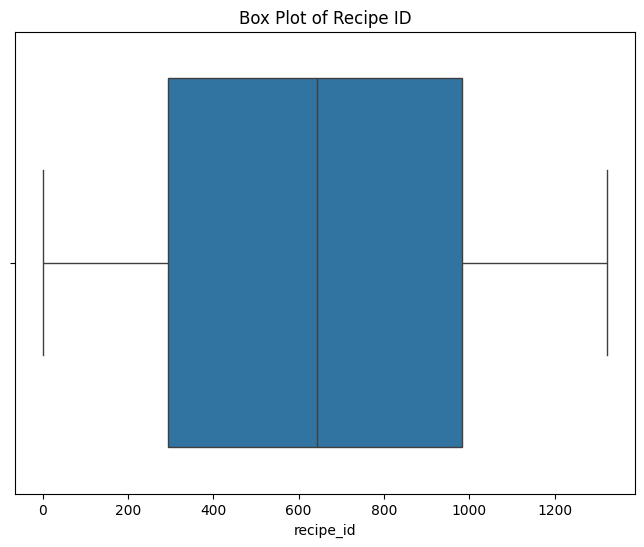

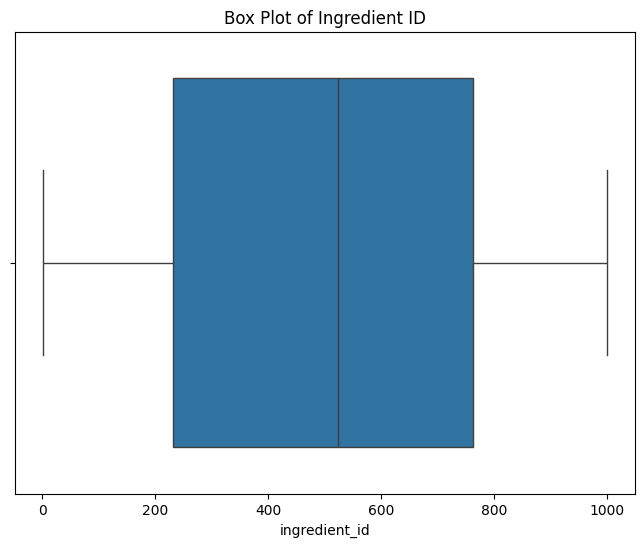

In [65]:
# Box plot for recipe_id
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['recipe_id'])
plt.title('Box Plot of Recipe ID')
plt.show()

# Box plot for ingredient_id
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['ingredient_id'])
plt.title('Box Plot of Ingredient ID')
plt.show()


In [66]:
#Group by `recipe_id` to see how many ingredients each recipe has
ingredient_count_per_recipe = df.groupby('recipe_id')['ingredient_id'].count().reset_index()

# Rename the column from 'ingredient_id' to 'total_ingredient'
ingredient_count_per_recipe = ingredient_count_per_recipe.rename(columns={'ingredient_id': 'total_ingredient'})

# Display the first few rows of the updated table
print(ingredient_count_per_recipe.head())



   recipe_id  total_ingredient
0          1                 7
1          2                10
2          3                 6
3          4                 3
4          5                10


In [67]:
# Define bins for ingredient counts

bins = [0, 3, 8, ingredient_count_per_recipe['total_ingredient'].max()]
labels = ['≤3 Ingredients', '≤8 Ingredients', '>8 Ingredients']
ingredient_count_per_recipe['ingredient_bin'] = pd.cut(ingredient_count_per_recipe['total_ingredient'], bins=bins, labels=labels)

# Display the updated table
print(ingredient_count_per_recipe.head())


   recipe_id  total_ingredient  ingredient_bin
0          1                 7  ≤8 Ingredients
1          2                10  >8 Ingredients
2          3                 6  ≤8 Ingredients
3          4                 3  ≤3 Ingredients
4          5                10  >8 Ingredients


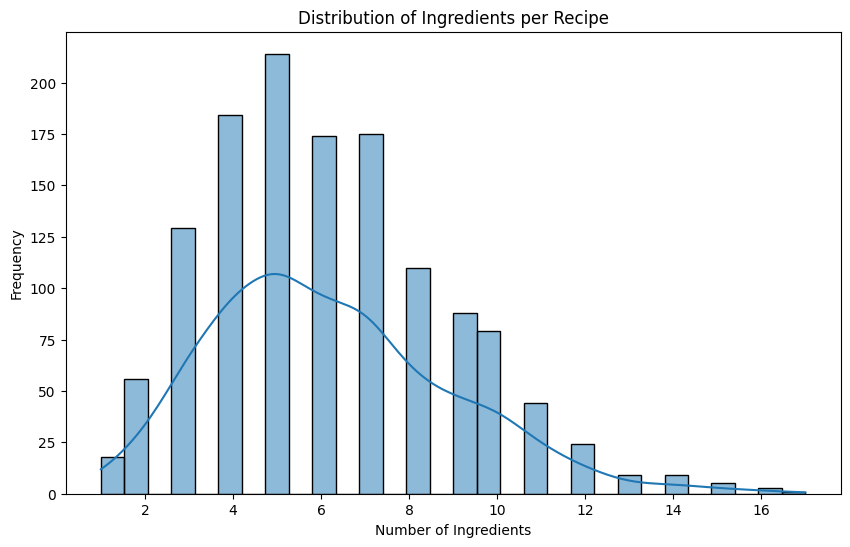

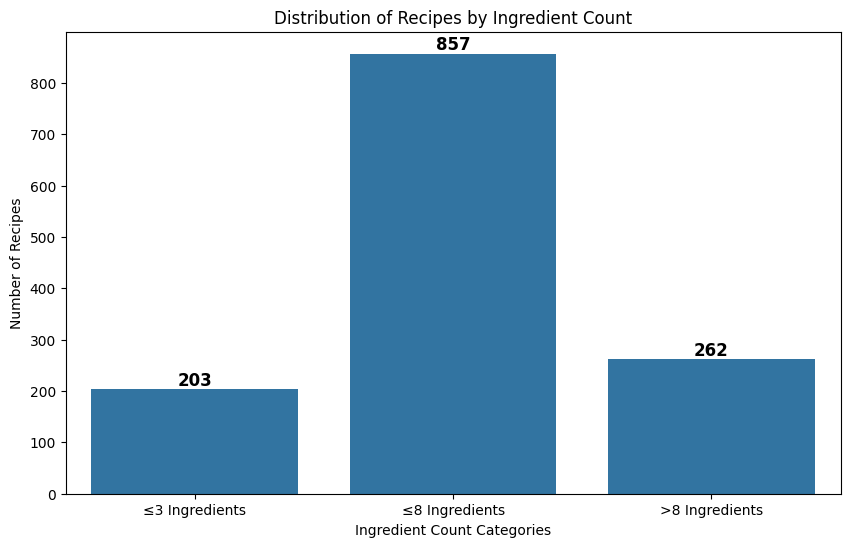

In [68]:

# Plot the distribution of ingredients per recipe (distribution)
plt.figure(figsize=(10, 6))
sns.histplot(ingredient_count_per_recipe['total_ingredient'], kde=True, bins=30)
plt.title('Distribution of Ingredients per Recipe')
plt.xlabel('Number of Ingredients')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
ax = sns.countplot(x='ingredient_bin', data=ingredient_count_per_recipe, order=labels)

# Add count labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width()/2., p.get_height()),
                ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.title('Distribution of Recipes by Ingredient Count')
plt.xlabel('Ingredient Count Categories')
plt.ylabel('Number of Recipes')
plt.show()

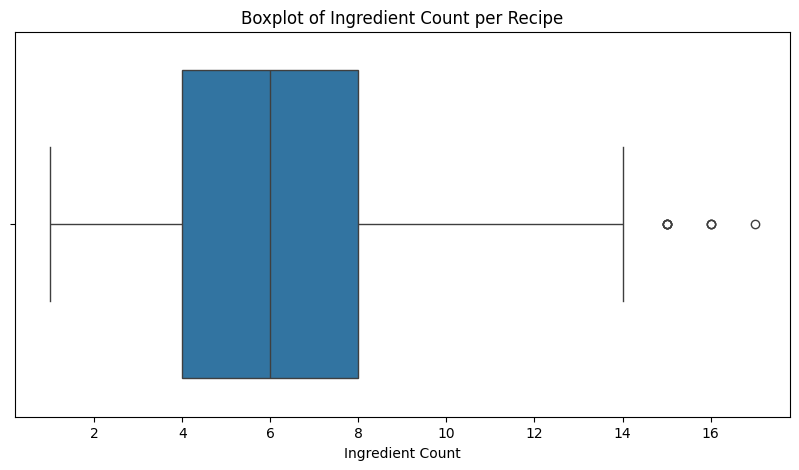

In [69]:
plt.figure(figsize=(10, 5))
sns.boxplot(x=ingredient_count_per_recipe['total_ingredient'])
plt.title('Boxplot of Ingredient Count per Recipe')
plt.xlabel('Ingredient Count')
plt.show()

In [70]:
# Ingredient frequency analysis
ingredient_frequency = df['ingredient_id'].value_counts()

# Convert to DataFrame with descriptive column name
ingredient_frequency_df = ingredient_frequency.reset_index()
ingredient_frequency_df.columns = ['ingredient_id', 'total_used_in_recipes']

print(f"\n==Ingredient Usage Analysis:==")
print(f"Most used ingredient (ID {ingredient_frequency_df.iloc[0]['ingredient_id']}): {ingredient_frequency_df.iloc[0]['total_used_in_recipes']} recipes")
print(f"Least used ingredients: {(ingredient_frequency_df['total_used_in_recipes'] == 1).sum()} ingredients used only once")
print(f"Top 10 most used ingredients:")
print(ingredient_frequency_df.head(10))


==Ingredient Usage Analysis:==
Most used ingredient (ID 940): 355 recipes
Least used ingredients: 520 ingredients used only once
Top 10 most used ingredients:
   ingredient_id  total_used_in_recipes
0            940                    355
1            763                    260
2            744                    242
3            150                    221
4            306                    212
5            847                    193
6            371                    182
7            603                    173
8            892                    133
9            182                    123


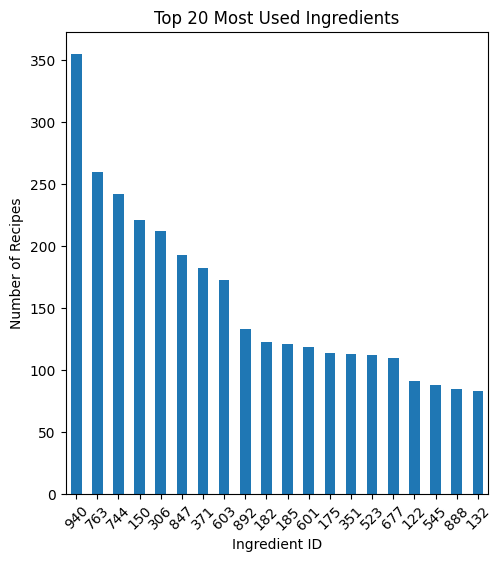

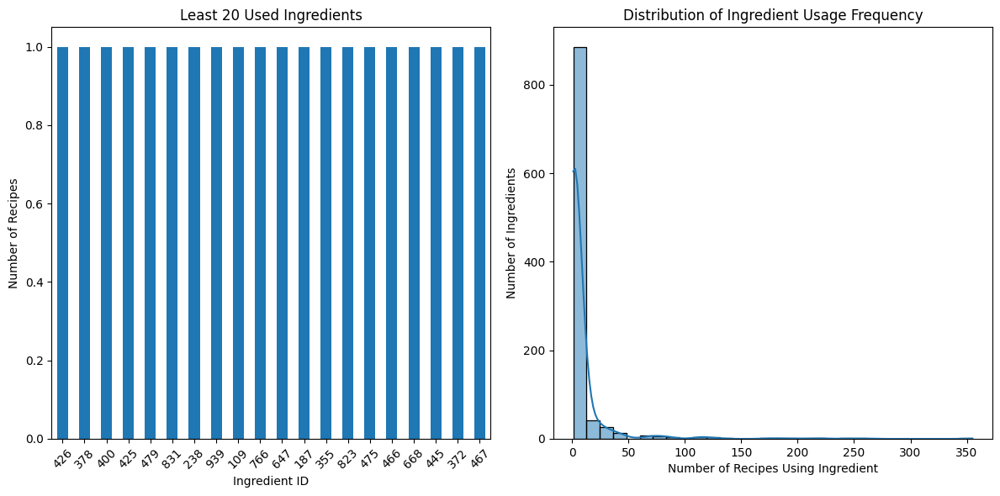

In [71]:

# Visualize ingredient frequency
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
ingredient_frequency.head(20).plot(kind='bar')
plt.title('Top 20 Most Used Ingredients')
plt.xlabel('Ingredient ID')
plt.ylabel('Number of Recipes')
plt.xticks(rotation=45)

# Visualize ingredient frequency
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
ingredient_frequency.tail(20).plot(kind='bar')
plt.title('Least 20 Used Ingredients')
plt.xlabel('Ingredient ID')
plt.ylabel('Number of Recipes')
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
sns.histplot(ingredient_frequency.values, bins=30, kde=True)
plt.title('Distribution of Ingredient Usage Frequency')
plt.xlabel('Number of Recipes Using Ingredient')
plt.ylabel('Number of Ingredients')
plt.tight_layout()
plt.show()

In [72]:
#summary statistics
print("\n==Summary Statistics:==")
print(f"Total recipes: {df['recipe_id'].nunique()}")
print(f"Total ingredients: {df['ingredient_id'].nunique()}")
print(f"Total recipe-ingredient pairs: {len(df)}")
print(f"Average ingredients per recipe: {df['recipe_id'].value_counts().mean():.2f}")
print(f"Max ingredients in a recipe: {df['recipe_id'].value_counts().max()}")
print(f"Min ingredients in a recipe: {df['recipe_id'].value_counts().min()}")
print(f"Total unique ingredient counts: {ingredient_count_per_recipe['total_ingredient'].nunique()}")
print(f"Most common ingredient count: {ingredient_count_per_recipe['total_ingredient'].mode()[0]}")
print(f"Most common ingredient count frequency: {ingredient_count_per_recipe['total_ingredient'].value_counts().max()}")
print(f"Most used ingredient ID: {ingredient_frequency_df.iloc[0]['ingredient_id']} ({ingredient_frequency_df.iloc[0]['total_used_in_recipes']} recipes)")



==Summary Statistics:==
Total recipes: 1322
Total ingredients: 999
Total recipe-ingredient pairs: 8209
Average ingredients per recipe: 6.21
Max ingredients in a recipe: 17
Min ingredients in a recipe: 1
Total unique ingredient counts: 17
Most common ingredient count: 5
Most common ingredient count frequency: 214
Most used ingredient ID: 940 (355 recipes)


### 2.5 DataFrame: recipe_category_df

In [52]:
# Load and basic info for recipe_category_df
recipe_category = dataframes['recipe_category_df']
recipe_category_df = recipe_category.copy()
print("shape: ", recipe_category_df.shape)

shape:  (8123, 2)


In [53]:
# 1. Duplication and Unique Data Analysis
print("="*50)
print("Data Analysis:")
print("="*50)
print(f"Total records: {len(recipe_category_df)}")
print(f"Unique Recipe IDs: {recipe_category_df['recipe_id'].nunique()} ")
print(f"Min Unique Recipe Id: {recipe_category_df['recipe_id'].min()}")
print(f"Max Unique Recipe Id: {recipe_category_df['recipe_id'].max()}")
print(f"Unique Category IDs: {recipe_category_df['category_id'].nunique()}")

Data Analysis:
Total records: 8123
Unique Recipe IDs: 1322 
Min Unique Recipe Id: 1
Max Unique Recipe Id: 1322
Unique Category IDs: 10


In [54]:
print("Missing Values Analysis:")
print("="*50)
missing_data = recipe_category_df.isnull().sum()
print("Missing Values:")
for col, missing in missing_data.items():
    percentage = (missing / len(recipe_category_df)) * 100
    print(f"   {col}: {missing:,} ({percentage:.2f}%)")

print(f"\nDuplicate Rows: {recipe_category_df.duplicated().sum():,}")
print(f"Unique Records: {recipe_category_df.drop_duplicates().shape[0]:,}")
if 'recipe_id' in recipe_category_df.columns and 'category_id' in recipe_category_df.columns:
    duplicate_pairs = recipe_category_df.duplicated(subset=['recipe_id', 'category_id']).sum()
    print(f"Duplicate Recipe-Category Pairs: {duplicate_pairs:,}")

# Sample Data
print(f"\n📋 SAMPLE DATA")
print(f"{'='*50}")
print("First 10 rows:")
print(recipe_category_df.head(10).to_string())
print(f"\nRandom 5 rows:")
print(recipe_category_df.sample(5).to_string())

Missing Values Analysis:
Missing Values:
   recipe_id: 0 (0.00%)
   category_id: 0 (0.00%)

Duplicate Rows: 0
Unique Records: 8,123
Duplicate Recipe-Category Pairs: 0

📋 SAMPLE DATA
First 10 rows:
   recipe_id  category_id
0          1           11
1          1            9
2          1            4
3          1            5
4          1            6
5          1            7
6          1            8
7          2           11
8          2            9
9          2            5

Random 5 rows:
      recipe_id  category_id
2403        393            4
1513        248            5
1251        202            9
4075        669            8
7884       1283            5


In [55]:
# Descriptive statistics
recipe_category_desc = recipe_category_df.describe()
print(recipe_category_desc)


         recipe_id  category_id
count  8123.000000  8123.000000
mean    663.698510     6.395667
std     382.244764     2.456876
min       1.000000     1.000000
25%     333.000000     5.000000
50%     667.000000     7.000000
75%     994.000000     8.000000
max    1322.000000    11.000000


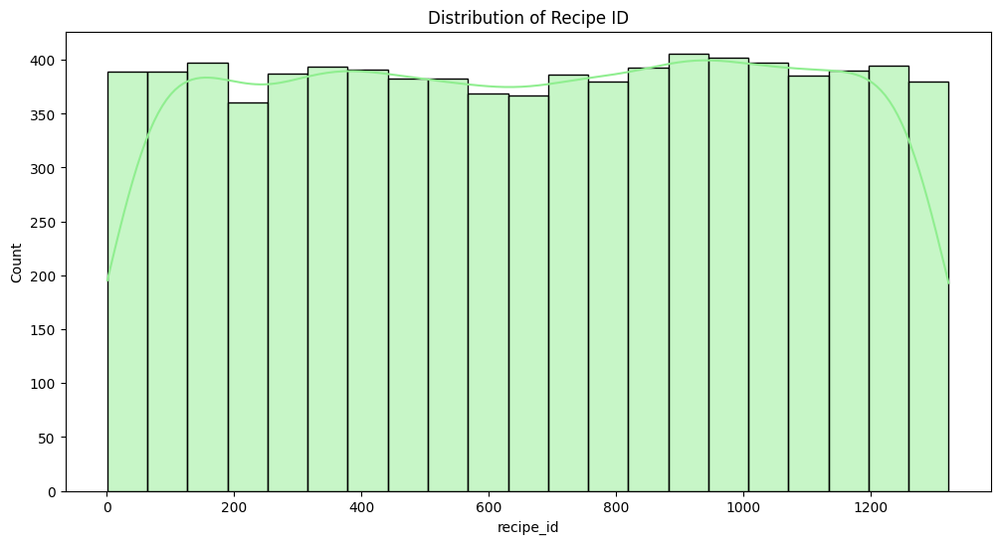

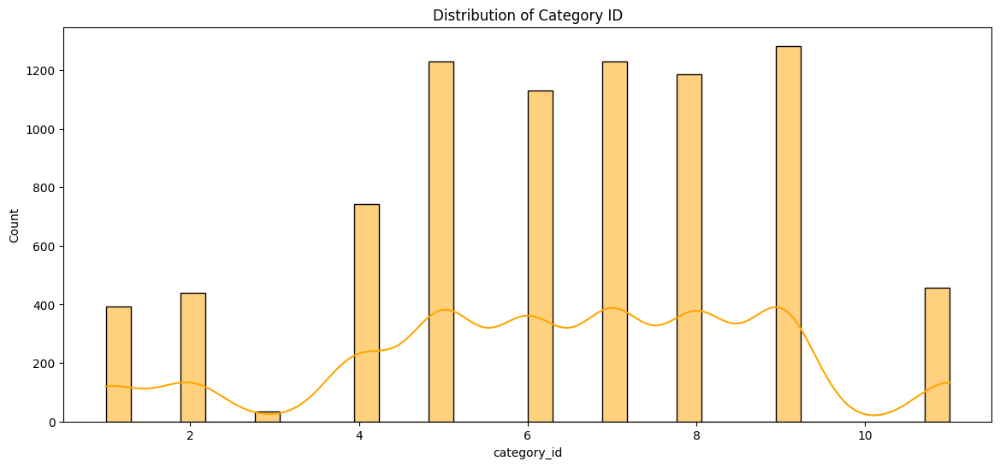

In [56]:
# Plot histogram for recipe_id
plt.figure(figsize=(12, 6))
sns.histplot(recipe_category_df['recipe_id'], kde=True, color='lightgreen')
plt.title('Distribution of Recipe ID')
plt.show()

# Plot histogram for category_id
plt.figure(figsize=(14, 6))
sns.histplot(recipe_category_df['category_id'], kde=True, color='orange')
plt.title('Distribution of Category ID')
plt.show()


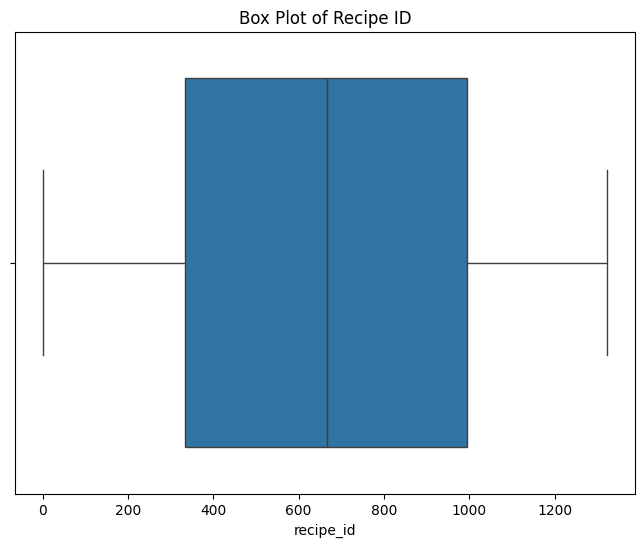

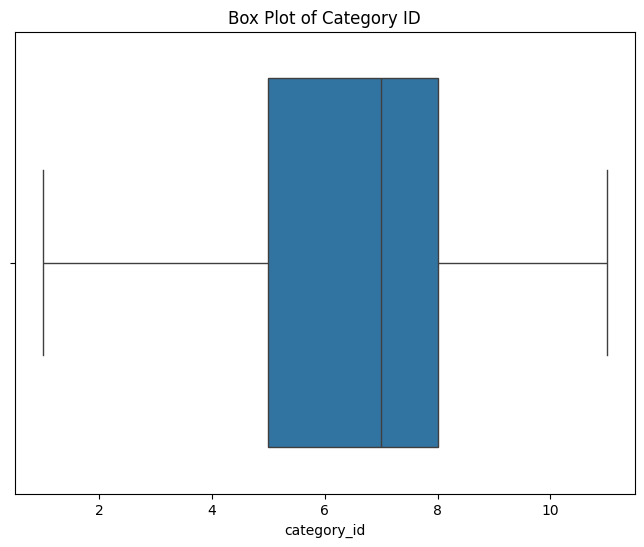

In [57]:
# Box plot for recipe_id
plt.figure(figsize=(8, 6))
sns.boxplot(x=recipe_category_df['recipe_id'])
plt.title('Box Plot of Recipe ID')
plt.show()

# Box plot for category_id
plt.figure(figsize=(8, 6))
sns.boxplot(x=recipe_category_df['category_id'])
plt.title('Box Plot of Category ID')
plt.show()


📈 Categories per recipe statistics:
count    1322.000000
mean        6.144478
std         0.796189
min         4.000000
25%         6.000000
50%         6.000000
75%         7.000000
max         7.000000
Name: total_categories, dtype: float64

📊 Categories per recipe distribution:
total_categories
4     39
5    220
6    574
7    489
Name: count, dtype: int64


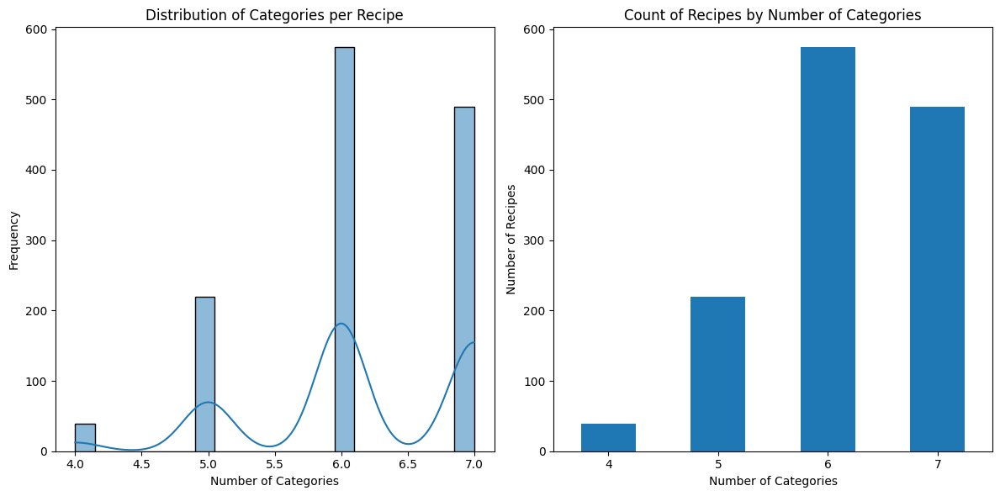


📝 Sample recipes with their category counts:


,recipe_id,total_categories
0,1,7
1,2,5
2,3,6
3,4,7
4,5,7
5,6,6
6,7,6
7,8,6
8,9,6
9,10,6


In [58]:
# GROUP BY RECIPE_ID: How many categories per recipe?

category_count_per_recipe = recipe_category_df.groupby('recipe_id')['category_id'].count().reset_index()
category_count_per_recipe = category_count_per_recipe.rename(columns={'category_id': 'total_categories'})

print(f"📈 Categories per recipe statistics:")
print(category_count_per_recipe['total_categories'].describe())

print(f"\n📊 Categories per recipe distribution:")
print(category_count_per_recipe['total_categories'].value_counts().sort_index())

# Visualize distribution
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(category_count_per_recipe['total_categories'], bins=20, kde=True)
plt.title('Distribution of Categories per Recipe')
plt.xlabel('Number of Categories')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
category_count_per_recipe['total_categories'].value_counts().sort_index().plot(kind='bar')
plt.title('Count of Recipes by Number of Categories')
plt.xlabel('Number of Categories')
plt.ylabel('Number of Recipes')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

print(f"\n📝 Sample recipes with their category counts:")
display(category_count_per_recipe.head(10))

📈 Recipes per category statistics:
count      10.000000
mean      812.300000
std       455.274533
min        33.000000
25%       443.000000
50%       936.000000
75%      1218.500000
max      1283.000000
Name: total_recipes, dtype: float64

🏆 Top 10 most popular categories (by recipe count):


,category_id,total_recipes
8,9,1283
4,5,1230
6,7,1229
7,8,1187
5,6,1131
3,4,741
9,11,458
1,2,438
0,1,393
2,3,33



📉 Bottom 10 least popular categories (by recipe count):


,category_id,total_recipes
8,9,1283
4,5,1230
6,7,1229
7,8,1187
5,6,1131
3,4,741
9,11,458
1,2,438
0,1,393
2,3,33


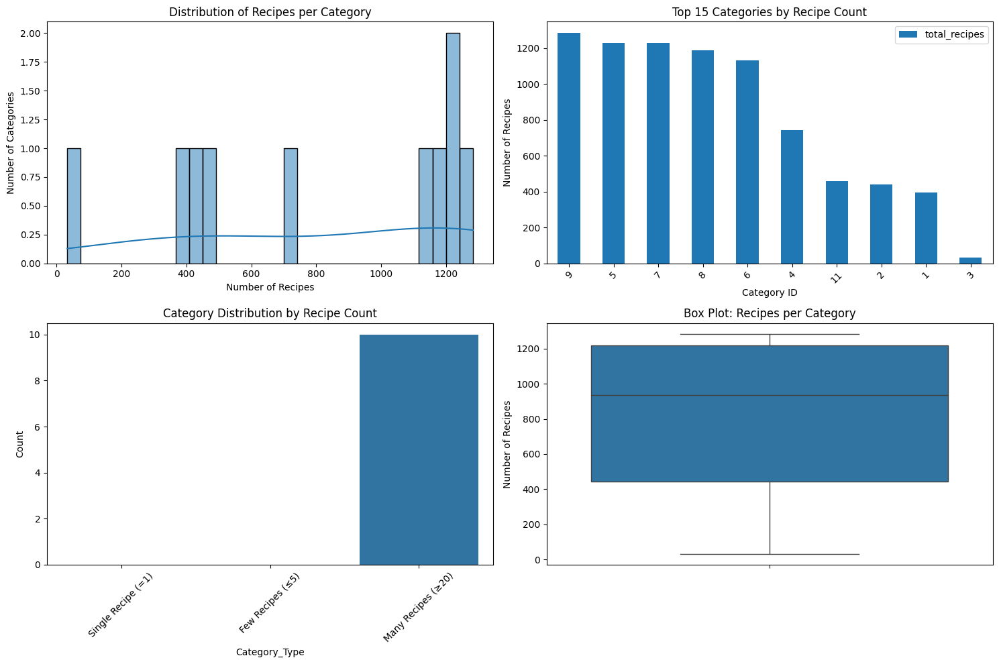

In [59]:
# 🔍 GROUP BY CATEGORY_ID: How many recipes per category?

recipe_count_per_category = recipe_category_df.groupby('category_id')['recipe_id'].count().reset_index()
recipe_count_per_category = recipe_count_per_category.rename(columns={'recipe_id': 'total_recipes'})

print(f"📈 Recipes per category statistics:")
print(recipe_count_per_category['total_recipes'].describe())

print(f"\n🏆 Top 10 most popular categories (by recipe count):")
top_categories = recipe_count_per_category.sort_values('total_recipes', ascending=False)
display(top_categories.head(10))

print(f"\n📉 Bottom 10 least popular categories (by recipe count):")
display(top_categories.tail(10))


# Visualize distribution
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
sns.histplot(recipe_count_per_category['total_recipes'], bins=30, kde=True)
plt.title('Distribution of Recipes per Category')
plt.xlabel('Number of Recipes')
plt.ylabel('Number of Categories')

plt.subplot(2, 2, 2)
top_categories.head(15).plot(x='category_id', y='total_recipes', kind='bar', ax=plt.gca())
plt.title('Top 15 Categories by Recipe Count')
plt.xlabel('Category ID')
plt.ylabel('Number of Recipes')
plt.xticks(rotation=45)

plt.subplot(2, 2, 3)
# Categories with only 1 recipe
single_recipe_categories = (recipe_count_per_category['total_recipes'] == 1).sum()
few_recipe_categories = (recipe_count_per_category['total_recipes'] <= 5).sum()
many_recipe_categories = (recipe_count_per_category['total_recipes'] >= 20).sum()

category_distribution = pd.DataFrame({
    'Category_Type': ['Single Recipe (=1)', 'Few Recipes (≤5)', 'Many Recipes (≥20)'],
    'Count': [single_recipe_categories, few_recipe_categories, many_recipe_categories]
})
sns.barplot(data=category_distribution, x='Category_Type', y='Count')
plt.title('Category Distribution by Recipe Count')
plt.xticks(rotation=45)

plt.subplot(2, 2, 4)
# Box plot for better understanding of distribution
sns.boxplot(y=recipe_count_per_category['total_recipes'])
plt.title('Box Plot: Recipes per Category')
plt.ylabel('Number of Recipes')

plt.tight_layout()
plt.show()

In [60]:
# Fix the Summary Report
print("\n" + "="*60)
print("SUMMARY REPORT")
print("="*60)

recipe_count_per_category = recipe_category_df.groupby('category_id')['recipe_id'].count().reset_index()
recipe_count_per_category = recipe_count_per_category.rename(columns={'recipe_id': 'total_recipes'})

# Get category frequency counts
category_counts = recipe_category_df['category_id'].value_counts()

# Calculate summary statistics
single_recipe_categories = (recipe_count_per_category['total_recipes'] == 1).sum()
few_recipe_categories = (recipe_count_per_category['total_recipes'] <= 5).sum()
many_recipe_categories = (recipe_count_per_category['total_recipes'] >= 20).sum()

print(f"Dataset contains {len(recipe_category_df)} recipe category mappings")
print(f"Contains {recipe_category_df['category_id'].nunique()} unique categories")
print(f"Most frequent category: {category_counts.idxmax()} ({category_counts.max()} occurrences)")
print(f"   Total categories: {len(recipe_count_per_category)}")
print(f"   Categories with only 1 recipe: {single_recipe_categories}")
print(f"   Categories with ≤5 recipes: {few_recipe_categories}")
print(f"   Categories with ≥20 recipes: {many_recipe_categories}")
print(f"   Average recipes per category: {recipe_count_per_category['total_recipes'].mean():.2f}")


SUMMARY REPORT
Dataset contains 8123 recipe category mappings
Contains 10 unique categories
Most frequent category: 9 (1283 occurrences)
   Total categories: 10
   Categories with only 1 recipe: 0
   Categories with ≤5 recipes: 0
   Categories with ≥20 recipes: 10
   Average recipes per category: 812.30


In [61]:
# =============================================================================
# SUMMARY AND INSIGHTS - RECIPE_CATEGORY_DF ANALYSIS
# =============================================================================

print(f"\n📋 COMPREHENSIVE ANALYSIS SUMMARY - RECIPE_CATEGORY_DF")
print(f"{'='*65}")

# Generate comprehensive insights
insights = []

# Data Quality Insights
total_records = len(recipe_category_df)
missing_total = recipe_category_df.isnull().sum().sum()
completeness_rate = ((total_records * len(recipe_category_df.columns) - missing_total) / (total_records * len(recipe_category_df.columns))) * 100

insights.append(f"📊 DATASET OVERVIEW:")
insights.append(f"   • Total recipe-category connections: {total_records:,}")
insights.append(f"   • Data completeness: {completeness_rate:.1f}%")
insights.append(f"   • Duplicate entries: {recipe_category_df.duplicated().sum():,}")

# Recipe-Category Relationship Insights
if 'recipe_id' in recipe_category_df.columns and 'category_id' in recipe_category_df.columns:
    unique_recipes = recipe_category_df['recipe_id'].nunique()
    unique_categories = recipe_category_df['category_id'].nunique()
    avg_categories_per_recipe = total_records / unique_recipes
    avg_recipes_per_category = total_records / unique_categories

    insights.append(f"\n🔗 RELATIONSHIP PATTERNS:")
    insights.append(f"   • Unique recipes: {unique_recipes:,}")
    insights.append(f"   • Unique categories: {unique_categories:,}")
    insights.append(f"   • Average categories per recipe: {avg_categories_per_recipe:.2f}")
    insights.append(f"   • Average recipes per category: {avg_recipes_per_category:.2f}")

    # Recipe categorization analysis
    recipe_categorization = recipe_category_df['recipe_id'].value_counts()
    single_category_recipes = (recipe_categorization == 1).sum()
    multi_category_recipes = (recipe_categorization > 1).sum()
    highly_categorized = (recipe_categorization >= 5).sum()

    insights.append(f"\n📝 RECIPE CATEGORIZATION:")
    insights.append(f"   • Single category recipes: {single_category_recipes:,} ({single_category_recipes/unique_recipes*100:.1f}%)")
    insights.append(f"   • Multi-category recipes: {multi_category_recipes:,} ({multi_category_recipes/unique_recipes*100:.1f}%)")
    insights.append(f"   • Highly categorized (5+): {highly_categorized:,} ({highly_categorized/unique_recipes*100:.1f}%)")

    # Category popularity analysis
    category_popularity = recipe_category_df['category_id'].value_counts()
    rare_categories = (category_popularity <= 5).sum()
    common_categories = (category_popularity >= 50).sum()
    very_popular_categories = (category_popularity >= 100).sum()

    insights.append(f"\n🏷️ CATEGORY POPULARITY:")
    insights.append(f"   • Rare categories (≤5 recipes): {rare_categories:,} ({rare_categories/unique_categories*100:.1f}%)")
    insights.append(f"   • Common categories (≥50 recipes): {common_categories:,} ({common_categories/unique_categories*100:.1f}%)")
    insights.append(f"   • Very popular (≥100 recipes): {very_popular_categories:,} ({very_popular_categories/unique_categories*100:.1f}%)")

    # Most and least popular categories
    most_popular_cat = category_popularity.index[0]
    most_popular_count = category_popularity.iloc[0]
    least_popular_cats = category_popularity[category_popularity == category_popularity.min()]

    insights.append(f"   • Most popular category: {most_popular_cat} ({most_popular_count:,} recipes)")
    insights.append(f"   • Least popular categories: {len(least_popular_cats)} categories with {category_popularity.min()} recipes each")

# Data distribution insights
if 'recipe_id' in recipe_category_df.columns:
    recipe_stats = recipe_category_df['recipe_id'].value_counts()
    max_categories = recipe_stats.max()
    min_categories = recipe_stats.min()

    insights.append(f"\n📈 DISTRIBUTION INSIGHTS:")
    insights.append(f"   • Recipe with most categories: {max_categories} categories")
    insights.append(f"   • Recipe with least categories: {min_categories} categories")
    insights.append(f"   • Category distribution spread: {max_categories - min_categories}")

# Coverage analysis
if 'recipe_id' in recipe_category_df.columns and 'category_id' in recipe_category_df.columns:
    # Calculate sparsity if possible (for smaller datasets)
    if unique_recipes <= 2000 and unique_categories <= 100:  # Reasonable matrix size
        recipe_category_matrix = recipe_category_df.groupby(['recipe_id', 'category_id']).size().unstack(fill_value=0)
        sparsity = (recipe_category_matrix == 0).sum().sum() / (recipe_category_matrix.shape[0] * recipe_category_matrix.shape[1])

        insights.append(f"\n🎯 COVERAGE ANALYSIS:")
        insights.append(f"   • Matrix sparsity: {sparsity:.3f} ({sparsity*100:.1f}% empty)")
        insights.append(f"   • Matrix density: {1-sparsity:.3f} ({(1-sparsity)*100:.1f}% filled)")
    else:
        insights.append(f"\n🎯 COVERAGE ANALYSIS:")
        insights.append(f"   • Large dataset - sparsity analysis skipped for performance")


for insight in insights:
    print(insight)




📋 COMPREHENSIVE ANALYSIS SUMMARY - RECIPE_CATEGORY_DF
📊 DATASET OVERVIEW:
   • Total recipe-category connections: 8,123
   • Data completeness: 100.0%
   • Duplicate entries: 0

🔗 RELATIONSHIP PATTERNS:
   • Unique recipes: 1,322
   • Unique categories: 10
   • Average categories per recipe: 6.14
   • Average recipes per category: 812.30

📝 RECIPE CATEGORIZATION:
   • Single category recipes: 0 (0.0%)
   • Multi-category recipes: 1,322 (100.0%)
   • Highly categorized (5+): 1,283 (97.0%)

🏷️ CATEGORY POPULARITY:
   • Rare categories (≤5 recipes): 0 (0.0%)
   • Common categories (≥50 recipes): 9 (90.0%)
   • Very popular (≥100 recipes): 9 (90.0%)
   • Most popular category: 9 (1,283 recipes)
   • Least popular categories: 1 categories with 33 recipes each

📈 DISTRIBUTION INSIGHTS:
   • Recipe with most categories: 7 categories
   • Recipe with least categories: 4 categories
   • Category distribution spread: 3

🎯 COVERAGE ANALYSIS:
   • Matrix sparsity: 0.386 (38.6% empty)
   • Matrix 

### 2.6 DataFrame: recipe_nutrition

In [97]:
recipe_nutrition_df = dataframes['recipe_nutrition']
recipe_nutrition = recipe_nutrition_df.copy()

print(f"Dataset shape: {recipe_nutrition.shape}")
print(f"Number of unique recipes with nutrition data: {recipe_nutrition['recipe_id'].nunique()}")
print()

display(recipe_nutrition.columns.to_list())

Dataset shape: (1322, 8)
Number of unique recipes with nutrition data: 1322



['recipe_id',
 'total_energy_kcal',
 'total_carbs_g',
 'total_protein_g',
 'total_fat_g',
 'final_micronutrients',
 'nutrition_id',
 'fat']

In [98]:
print(f"\n📊 DATA QUALITY ASSESSMENT")
print(f"{'='*50}")
missing_data = recipe_nutrition.isnull().sum()
print("Missing Values Analysis:")
for col, missing in missing_data.items():
    percentage = (missing / len(recipe_nutrition)) * 100
    print(f"   {col}: {missing:,} ({percentage:.2f}%) ")

print(f"\nDuplicate Rows: {recipe_nutrition.duplicated().sum():,}")
print(f"Unique Records: {recipe_nutrition.drop_duplicates().shape[0]:,}")


📊 DATA QUALITY ASSESSMENT
Missing Values Analysis:
   recipe_id: 0 (0.00%) 
   total_energy_kcal: 1 (0.08%) 
   total_carbs_g: 2 (0.15%) 
   total_protein_g: 1 (0.08%) 
   total_fat_g: 42 (3.18%) 
   final_micronutrients: 337 (25.49%) 
   nutrition_id: 0 (0.00%) 
   fat: 1,284 (97.13%) 

Duplicate Rows: 0
Unique Records: 1,322


##### 2.6.1 **Observation**
Why there are huge value of fat ? while there is total_fat_g?

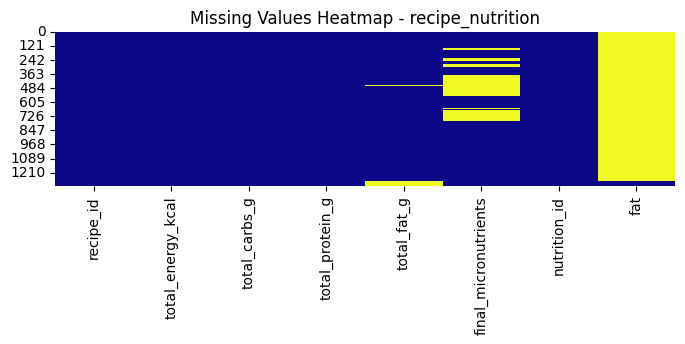

In [99]:
plt.figure(figsize=(8, 2))
sns.heatmap(recipe_nutrition.isnull(), cbar=False, cmap='plasma')
plt.title("Missing Values Heatmap - recipe_nutrition")
plt.show()

**Key Insight**
Duplicate column feature between fat and total_fat_100

In [100]:
if 'fat' in recipe_nutrition.columns:
    recipe_nutrition['total_fat_g'] = recipe_nutrition['fat'].combine_first(recipe_nutrition['total_fat_g'])
    recipe_nutrition.drop(columns='fat', inplace=True)
recipe_nutrition.head(5)

,recipe_id,total_energy_kcal,total_carbs_g,total_protein_g,total_fat_g,final_micronutrients,nutrition_id
0,1,255.48,24.854,24.965,13.1378,"['Magnesium', 'P', 'beta', 'Total fat (NLEA)',...",1
1,2,0,3.376,68.751,50.332,"['Sodium', 'Na']",2
2,3,53.55,23.5955,46.383,28.989,"['P', 'Vitamin A', 'Vitamin K (phylloquinone)'...",3
3,5,1585.2,44.9207,113.015,290.2725,"['Sodium', 'P', 'Vitamin C', 'Cholesterol', 'C...",4
4,6,0,0.492,0.0943,0.0359,"['Ca', 'Na', 'K', 'Sodium', 'Potassium', 'Calc...",5


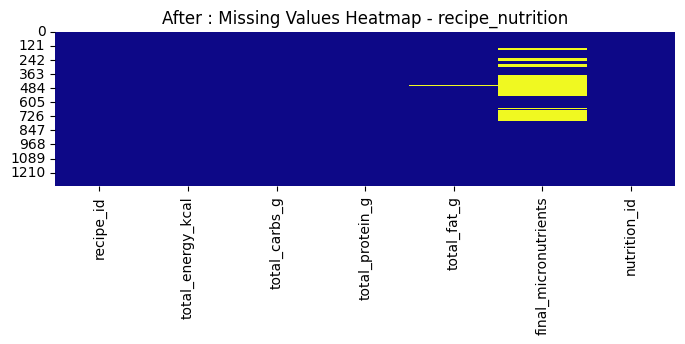

In [101]:

plt.figure(figsize=(8, 2))
sns.heatmap(recipe_nutrition.isnull(), cbar=False, cmap='plasma')
plt.title("After : Missing Values Heatmap - recipe_nutrition")
plt.show()

#### 2.6.2 Macronutrient

In [102]:
#original type pf macronutrients cols
macronutrient_cols = ['total_energy_kcal', 'total_carbs_g', 'total_protein_g', 'total_fat_g']
display(recipe_nutrition[macronutrient_cols].dtypes)
display(recipe_nutrition.info()
)


,0
total_energy_kcal,object
total_carbs_g,object
total_protein_g,object
total_fat_g,object


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1322 entries, 0 to 1321
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   recipe_id             1322 non-null   int64 
 1   total_energy_kcal     1321 non-null   object
 2   total_carbs_g         1320 non-null   object
 3   total_protein_g       1321 non-null   object
 4   total_fat_g           1318 non-null   object
 5   final_micronutrients  985 non-null    object
 6   nutrition_id          1322 non-null   int64 
dtypes: int64(2), object(5)
memory usage: 72.4+ KB


None

##### **Observation**
WHy the ttoal column all object ? when supposed to be float

              Column  Valid Floats (%)  Invalid Entries (%)  Invalid Count  \
0  total_energy_kcal         74.130106            25.869894            342   
1      total_carbs_g         98.260212             1.739788             23   
2    total_protein_g         99.319213             0.680787              9   
3        total_fat_g         98.865356             1.134644             15   

                      Example Invalid  
0  [110 kcal, 108.2 kcal, 107.8 kcal]  
1                  [-, 6.1 g, 12.1 g]  
2                [12 g, 13.5 g, 35 g]  
3                   [-, 5.8 g, 4.8 g]  


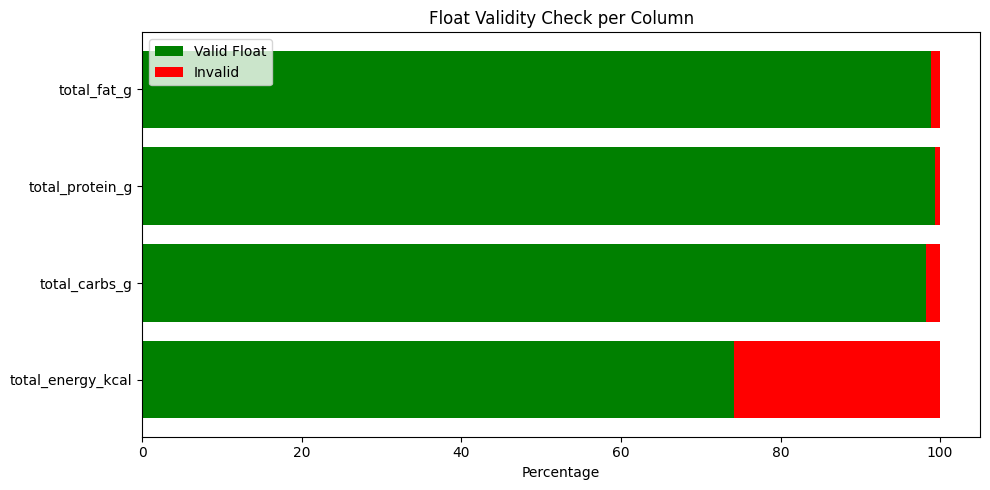

In [103]:
results = []

# Check for float-convertible values using pd.to_numeric (but not forcing conversion)
for col in macronutrient_cols:
    series = recipe_nutrition[col]
    total = len(series)

    # Check which entries would fail numeric conversion
    numeric_mask = pd.to_numeric(series, errors='coerce').notna()
    numeric_count = numeric_mask.sum()
    non_numeric_count = total - numeric_count
    percent_valid = numeric_count / total * 100
    percent_invalid = 100 - percent_valid

    results.append({
        'Column': col,
        'Valid Floats (%)': percent_valid,
        'Invalid Entries (%)': percent_invalid,
        'Invalid Count': non_numeric_count,
        'Example Invalid': series[~numeric_mask].dropna().unique()[:3]
    })

# Create DataFrame
check_df = pd.DataFrame(results)

# Display the check table
print(check_df)

# Plot bar chart
plt.figure(figsize=(10, 5))
plt.barh(check_df['Column'], check_df['Valid Floats (%)'], color='green', label='Valid Float')
plt.barh(check_df['Column'], check_df['Invalid Entries (%)'], left=check_df['Valid Floats (%)'], color='red', label='Invalid')
plt.xlabel('Percentage')
plt.title('Float Validity Check per Column')
plt.legend()
plt.tight_layout()
plt.show()


❌ Invalid Entries in 'total_energy_kcal':
['110 kcal' '108.2 kcal' '107.8 kcal' '107.3 kcal' '106 kcal' '104 kcal'
 '100 kcal' '98.3 kcal' '96.65 kcal' '95.85 kcal' '95.1 kcal' '949 kcal'
 '922.5 kcal' '90 kcal' '80 kcal' '770 kcal' '746.7 kcal' '708.1 kcal'
 '70 kcal' '65.7 kcal' '62.85 kcal' '60.44 kcal' '577.25 kcal' '50 kcal'
 '457 kcal' '418.85 kcal' '389.52 kcal' '360.5 kcal' '355.45 kcal'
 '353.2 kcal' '348.85 kcal' '316.3 kcal' '290 kcal' '286 kcal'
 '270.45 kcal' '246.8 kcal' '240 kcal' '232.4 kcal' '228.46 kcal'
 '226.3 kcal' '218 kcal' '207.3 kcal' '207.2 kcal' '202.8 kcal' '201 kcal'
 '200.57 kcal' '~80' '~250' '~200' '~180' '~150' '~100'
 '544 kJ (129 kcal)' '626 kJ (149 kcal)' '1679 kJ (401 kcal)'
 '1185 kJ (283 kcal)' '70.2 kcal' '70.1 kcal' '699 kcal' '69.6 kcal'
 '69 kcal' '68.6 kcal' '68.1 kcal' '68 kcal' '67.6 kcal' '67.2 kcal'
 '67 kcal' '655.9 kcal' '653.9 kcal' '65.5 kcal' '65 kcal' '64.3 kcal'
 '64 kcal' '62.5 kcal' '62.2 kcal' '61.4 kcal' '61.3 kcal'
 '609 kJ (

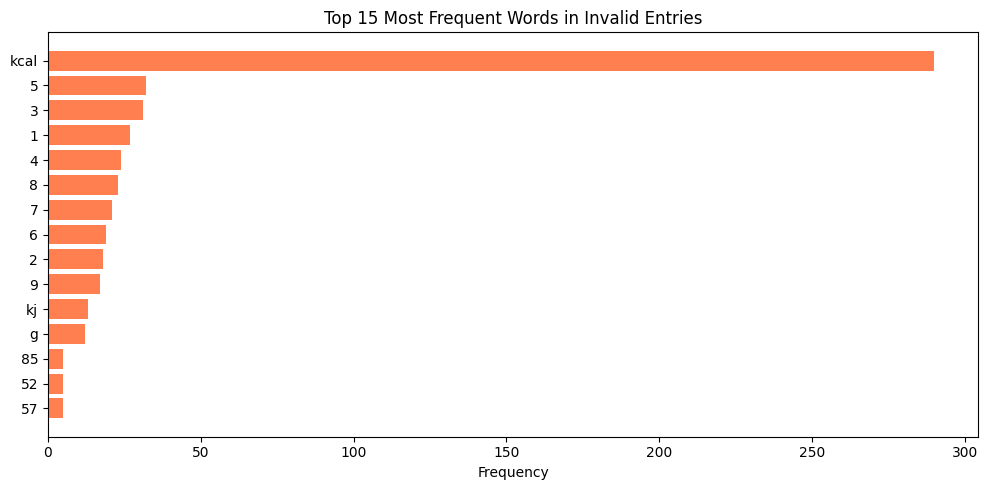

In [104]:
from collections import Counter
import re

# To store all words from invalid entries
all_invalid_words = []

for col in macronutrient_cols:
    series = recipe_nutrition[col].astype(str)

    # Get only the invalid entries (non-convertible to float)
    numeric_mask = pd.to_numeric(series, errors='coerce').notna()
    invalid_entries = series[~numeric_mask].dropna().unique()

    print(f"\n❌ Invalid Entries in '{col}':")
    print(invalid_entries)  # Print a sample

    # Tokenize the invalid entries (split words/numbers)
    for entry in invalid_entries:
        words = re.findall(r'\b\w+\b', str(entry).lower())  # extract words only
        all_invalid_words.extend(words)

# Count frequency
word_freq = Counter(all_invalid_words)
top_words = word_freq.most_common(15)

# Display as table
freq_df = pd.DataFrame(top_words, columns=['Word', 'Frequency'])
print("\n🔤 Top Words in Invalid Float Entries Across All Columns:")
print(freq_df)

# Plot
plt.figure(figsize=(10, 5))
plt.barh(freq_df['Word'], freq_df['Frequency'], color='coral')
plt.gca().invert_yaxis()
plt.title('Top 15 Most Frequent Words in Invalid Entries')
plt.xlabel('Frequency')
plt.tight_layout()
plt.show()


##### Observation Part 2

Need to see the string - as not fully float

In [129]:
import pandas as pd
import numpy as np
import re

def clean_energy(val):
    # print(val)
    try:
        if pd.isna(val):
            return np.nan
        val_str = str(val).lower().strip()

        # If '~' exists with a number like "~80", remove the '~'
        if re.match(r'~\s*\d+', val_str):
            val_str = val_str.replace('~', '').strip()

        # Remove irrelevant characters
        if val_str in ['-', '~', 'nan', 'n/a', 'na', 'unknown']:
            return np.nan

        # Case: "1095 kJ (261 kcal)" → extract kcal inside parentheses
        kcal_match = re.search(r'\((\d+\.?\d*)\s*kcal\)', val_str)
        if kcal_match:
            return float(kcal_match.group(1))

        # Case: single kcal value
        if 'kcal' in val_str:
            number = re.findall(r'\d+\.?\d*', val_str)
            return float(number[0]) if number else np.nan

        # Case: kJ only → convert to kcal
        if 'kj' in val_str:
            number = re.findall(r'\d+\.?\d*', val_str)
            if number:
                kj = float(number[0])
                return round(kj / 4.184, 2)

        # Otherwise, assume it's just a number string (like "120")
        return float(val_str)
    except:
        print("Invalid val: ", val)
        return np.nan

def clean_macro(val):
    try:
        if pd.isna(val):
            return np.nan

        val_str = str(val).lower().strip()
        # If '~' exists with a number like "~80", remove the '~'
        if re.match(r'~\s*\d+', val_str):
            val_str = val_str.replace('~', '').strip()

        # Handle junk values
        if val_str in ['-', '~', 'nan', 'n/a', 'na', 'unknown']:
            return np.nan

        # If 'g' is present, try to get the number before it
        if 'g' in val_str:
            match = re.search(r'(\d+\.?\d*)\s*g', val_str)
            if match:
                return float(match.group(1))

        # Otherwise, extract any number in the string
        match = re.search(r'\d+\.?\d*', val_str)
        return float(match.group(0)) if match else np.nan

    except:
        return np.nan

In [128]:
recipe_nutrition = recipe_nutrition_df.copy()

In [141]:
# Clean each column
recipe_nutrition['total_energy_kcal'] = recipe_nutrition['total_energy_kcal'].apply(clean_energy)
recipe_nutrition['total_carbs_g'] = recipe_nutrition['total_carbs_g'].apply(clean_macro)
recipe_nutrition['total_protein_g'] = recipe_nutrition['total_protein_g'].apply(clean_macro)
recipe_nutrition['total_fat_g'] = recipe_nutrition['total_fat_g'].apply(clean_macro)



❌ Invalid Entries in 'total_energy_kcal':
['nan']

❌ Invalid Entries in 'total_carbs_g':
['nan']

❌ Invalid Entries in 'total_protein_g':
['nan']

❌ Invalid Entries in 'total_fat_g':
['nan']

🔤 Top Words in Invalid Float Entries Across All Columns:
  Word  Frequency
0  nan          4


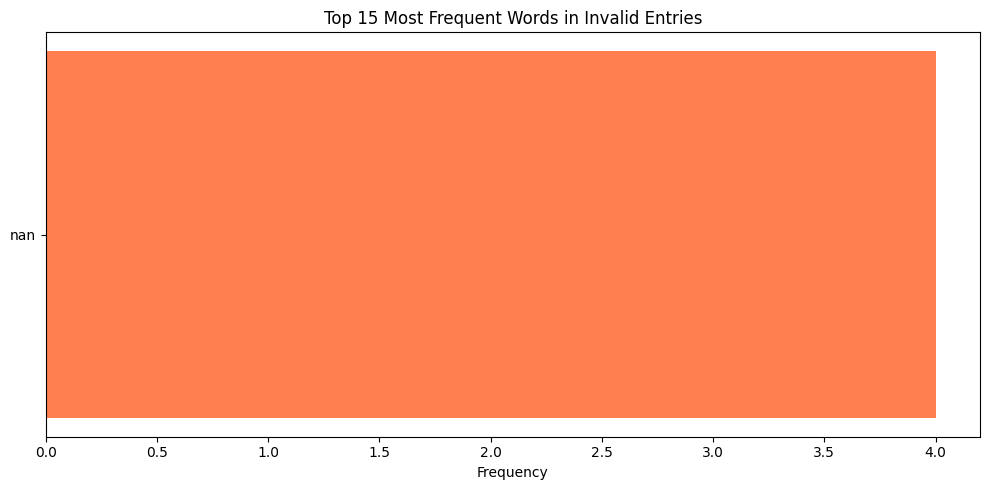

In [142]:
from collections import Counter
import re

# To store all words from invalid entries
all_invalid_words = []

for col in macronutrient_cols:
    series = recipe_nutrition[col].astype(str)

    # Get only the invalid entries (non-convertible to float)
    numeric_mask = pd.to_numeric(series, errors='coerce').notna()
    invalid_entries = series[~numeric_mask].dropna().unique()

    print(f"\n❌ Invalid Entries in '{col}':")
    print(invalid_entries)  # Print a sample

    # Tokenize the invalid entries (split words/numbers)
    for entry in invalid_entries:
        words = re.findall(r'\b\w+\b', str(entry).lower())  # extract words only
        all_invalid_words.extend(words)

# Count frequency
word_freq = Counter(all_invalid_words)
top_words = word_freq.most_common(15)

# Display as table
freq_df = pd.DataFrame(top_words, columns=['Word', 'Frequency'])
print("\n🔤 Top Words in Invalid Float Entries Across All Columns:")
print(freq_df)

# Plot
plt.figure(figsize=(10, 5))
plt.barh(freq_df['Word'], freq_df['Frequency'], color='coral')
plt.gca().invert_yaxis()
plt.title('Top 15 Most Frequent Words in Invalid Entries')
plt.xlabel('Frequency')
plt.tight_layout()
plt.show()


In [143]:
mixed_type_cols = []

# Check each column for mixed types
for col in macronutrient_cols:
    if col in recipe_nutrition.columns:
        unique_types = recipe_nutrition[col].dropna().map(type).unique()
        if set(unique_types) & {str} and set(unique_types) & {int, float}:
            mixed_type_cols.append(col)

# Display result
if mixed_type_cols:
    print("⚠️ Columns with mixed numeric and string types:")
    for col in mixed_type_cols:
        print(f" - {col}")
else:
    print("✅ All specified columns are pure numeric or NaN only.")


✅ All specified columns are pure numeric or NaN only.


#### 2.6.2b Continuation

In [144]:
recipe_nutrition.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1322 entries, 0 to 1321
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   recipe_id             1322 non-null   int64  
 1   total_energy_kcal     1321 non-null   float64
 2   total_carbs_g         1307 non-null   float64
 3   total_protein_g       1321 non-null   float64
 4   total_fat_g           1276 non-null   float64
 5   final_micronutrients  985 non-null    object 
 6   nutrition_id          1322 non-null   int64  
 7   fat                   38 non-null     float64
dtypes: float64(5), int64(2), object(1)
memory usage: 82.8+ KB


In [125]:
#checking macros
numeric_cols = ['total_energy_kcal', 'total_carbs_g', 'total_protein_g', 'total_fat_g']

In [145]:
missing_macro = recipe_nutrition[numeric_cols].isnull().sum()
print("Missing values in macronutrients:")
for col in numeric_cols:
    missing_count = missing_macro[col]
    missing_percent = (missing_count / len(recipe_nutrition)) * 100
    print(f"{col}: {missing_count} ({missing_percent:.1f}%)")
print()

# Zero values analysis (recipes with 0 calories, etc.)
print("Zero values analysis:")
for col in numeric_cols:
    zero_count = (recipe_nutrition[col] == 0).sum()
    zero_percent = (zero_count / len(recipe_nutrition)) * 100
    print(f"{col} = 0: {zero_count} recipes ({zero_percent:.1f}%)")

Missing values in macronutrients:
total_energy_kcal: 1 (0.1%)
total_carbs_g: 15 (1.1%)
total_protein_g: 1 (0.1%)
total_fat_g: 46 (3.5%)

Zero values analysis:
total_energy_kcal = 0: 55 recipes (4.2%)
total_carbs_g = 0: 27 recipes (2.0%)
total_protein_g = 0: 5 recipes (0.4%)
total_fat_g = 0: 12 recipes (0.9%)


In [146]:
# Define macronutrient columns
numeric_cols = ['total_energy_kcal', 'total_carbs_g', 'total_protein_g', 'total_fat_g']

# Get rows with any missing values in the macronutrient columns
missing_rows = recipe_nutrition[recipe_nutrition[numeric_cols].isnull().any(axis=1)]

# Display them
print(f"Number of rows with missing macronutrient data: {len(missing_rows)}")
missing_rows[numeric_cols + ['recipe_id']].head()  # Optional: include recipe_id or other identifiers


Number of rows with missing macronutrient data: 60


,total_energy_kcal,total_carbs_g,total_protein_g,total_fat_g,recipe_id
218,267.0,28.5,10.7,NaN,220
219,263.0,NaN,9.5,10.9,221
220,261.0,NaN,13.6,9.1,222
221,260.0,NaN,10.4,10.7,223
222,191.0,NaN,10.5,9.0,224


In [147]:
recipe_nutrition[numeric_cols] = recipe_nutrition[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Descriptive statistics
print(recipe_nutrition[numeric_cols].describe())

# Missing values
missing = recipe_nutrition[numeric_cols].isnull().sum()
missing_pct = recipe_nutrition[numeric_cols].isnull().mean() * 100
print("\nMissing Values (%):")
print(pd.concat([missing, missing_pct.round(2).rename('percent')], axis=1))

       total_energy_kcal  total_carbs_g  total_protein_g  total_fat_g
count        1321.000000    1307.000000      1321.000000  1276.000000
mean          209.896110      36.522158        15.887867    12.039745
std           324.865655      78.028568        30.060989    30.798161
min             0.000000       0.000000         0.000000     0.000000
25%            65.000000       9.500000         3.000000     1.559937
50%           128.200000      20.300000         7.100000     4.932300
75%           230.399125      38.500000        15.300000    10.485000
max          3952.400000    1949.445000       493.440000   598.779000

Missing Values (%):
                    0  percent
total_energy_kcal   1     0.08
total_carbs_g      15     1.13
total_protein_g     1     0.08
total_fat_g        46     3.48


/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 65.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 31.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 65.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 81.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 17.2% of the points cannot be plac

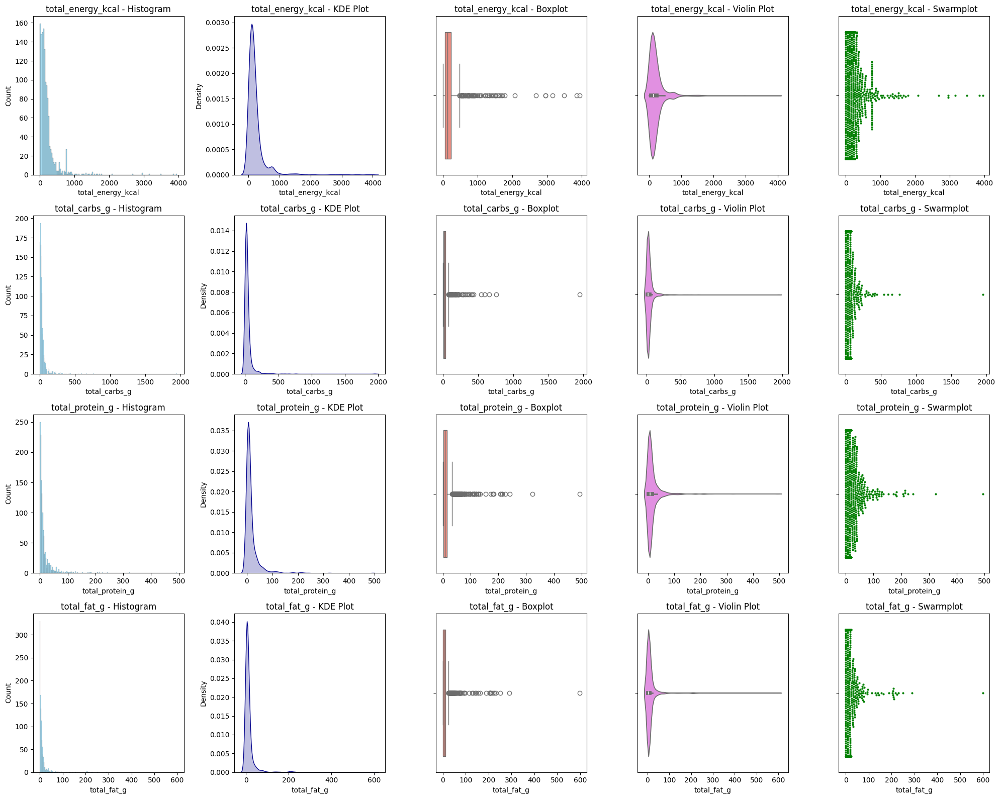

In [148]:
# Set up figure
n_rows = len(numeric_cols)
n_cols = 5  # 5 types of plots
plt.figure(figsize=(n_cols * 4, n_rows * 4))

plot_idx = 1

for col in numeric_cols:
    data = recipe_nutrition[col].dropna()  # We'll use dropna to focus on actual data

    # 1. Histogram
    plt.subplot(n_rows, n_cols, plot_idx)
    sns.histplot(data, kde=False, color='skyblue')
    plt.title(f"{col} - Histogram")
    plot_idx += 1

    # 2. KDE plot
    plt.subplot(n_rows, n_cols, plot_idx)
    sns.kdeplot(data, fill=True, color='darkblue')
    plt.title(f"{col} - KDE Plot")
    plot_idx += 1

    # 3. Boxplot
    plt.subplot(n_rows, n_cols, plot_idx)
    sns.boxplot(x=data, color='salmon')
    plt.title(f"{col} - Boxplot")
    plot_idx += 1

    # 4. Violin plot
    plt.subplot(n_rows, n_cols, plot_idx)
    sns.violinplot(x=data, color='violet')
    plt.title(f"{col} - Violin Plot")
    plot_idx += 1

    # 5. Swarmplot (need y-axis to group on)
    plt.subplot(n_rows, n_cols, plot_idx)
    # Create a dummy y-axis grouping
    sns.swarmplot(x=data, y=[""] * len(data), color='green', size=3)
    plt.title(f"{col} - Swarmplot")
    plot_idx += 1

plt.tight_layout()
plt.show()


In [149]:
def compare_fill_strategies(df, col):
    original = df[col].dropna()
    fill_zero = df[col].fillna(0)
    fill_mean = df[col].fillna(df[col].mean())

    fig, axs = plt.subplots(2, 3, figsize=(18, 8))
    fig.suptitle(f"Comparison of Fill Strategies for '{col}'", fontsize=16)

    # === HISTOGRAMS ===
    sns.histplot(original, kde=True, ax=axs[0, 0], color='steelblue')
    axs[0, 0].set_title('Original (dropna)')

    sns.histplot(fill_zero, kde=True, ax=axs[0, 1], color='orange')
    axs[0, 1].set_title('Fill with 0')

    sns.histplot(fill_mean, kde=True, ax=axs[0, 2], color='green')
    axs[0, 2].set_title('Fill with Mean')

    # === BOXPLOTS ===
    sns.boxplot(x=original, ax=axs[1, 0], color='steelblue')
    axs[1, 0].set_title('Boxplot: Original (dropna)')

    sns.boxplot(x=fill_zero, ax=axs[1, 1], color='orange')
    axs[1, 1].set_title('Boxplot: Fill with 0')

    sns.boxplot(x=fill_mean, ax=axs[1, 2], color='green')
    axs[1, 2].set_title('Boxplot: Fill with Mean')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

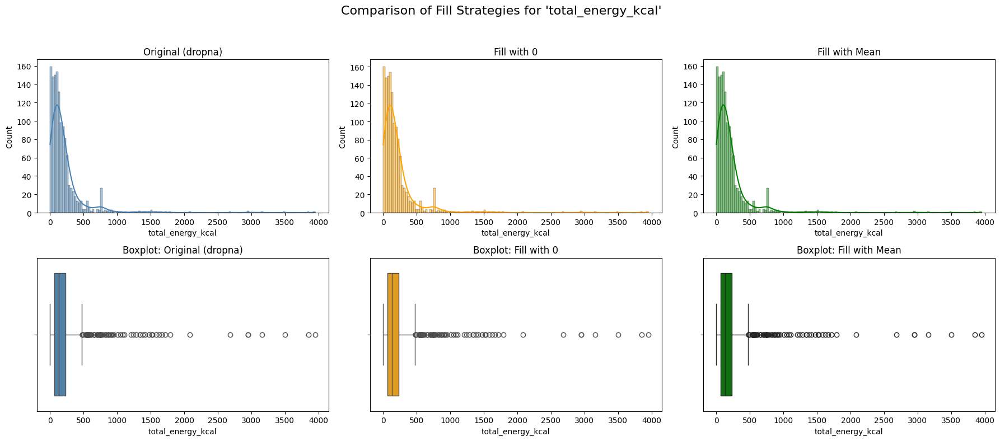

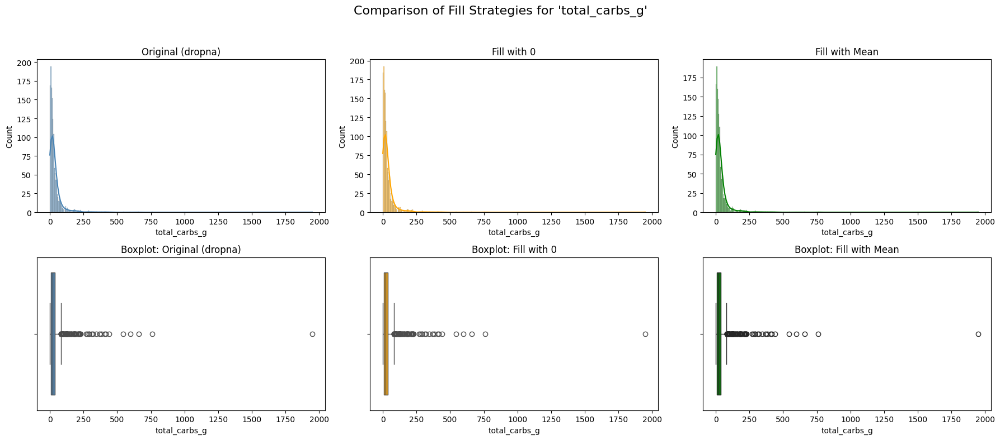

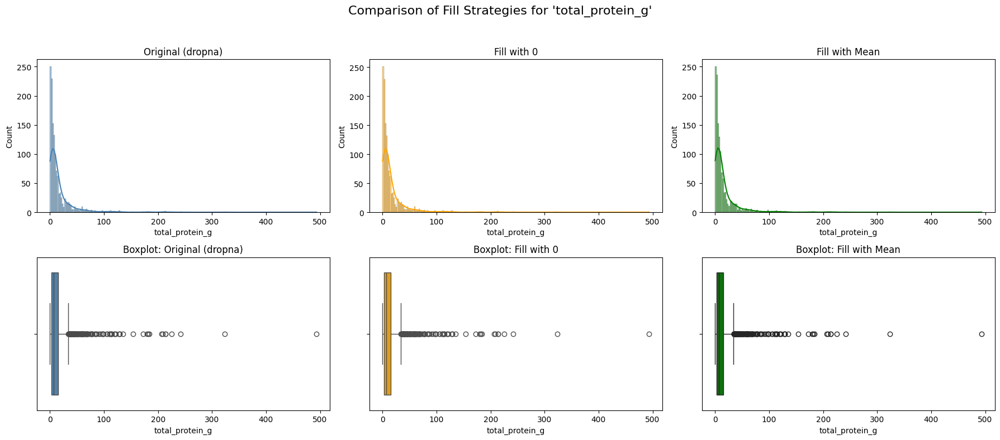

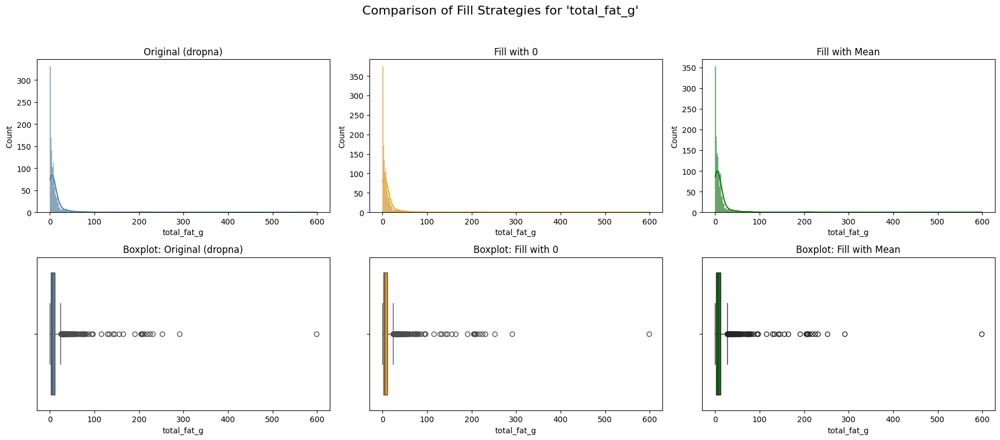

In [150]:
for col in macronutrient_cols:
  compare_fill_strategies(recipe_nutrition, col)


Handle Missing Values

In [151]:
#how to handle
# 1. Create copy with missing values filled with 0
df_zero_filled = recipe_nutrition.copy()
df_zero_filled[numeric_cols] = df_zero_filled[numeric_cols].fillna(0)

# 2. Create copy with missing values filled with column mean
df_mean_filled = recipe_nutrition.copy()
for col in numeric_cols:
    mean_val = df_mean_filled[col].mean()
    df_mean_filled[col].fillna(mean_val, inplace=True)

/tmp/ipython-input-151-2377182516.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_mean_filled[col].fillna(mean_val, inplace=True)


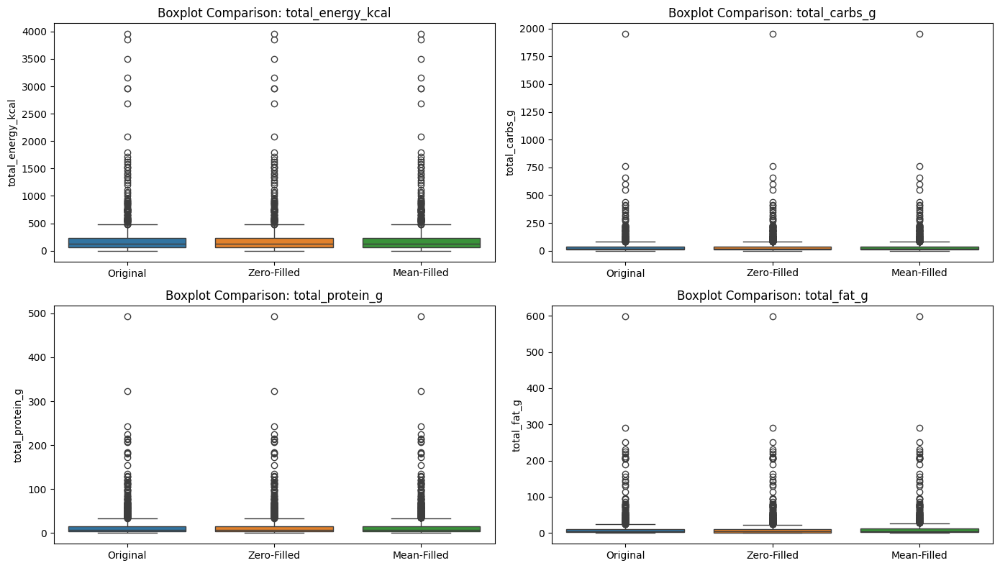

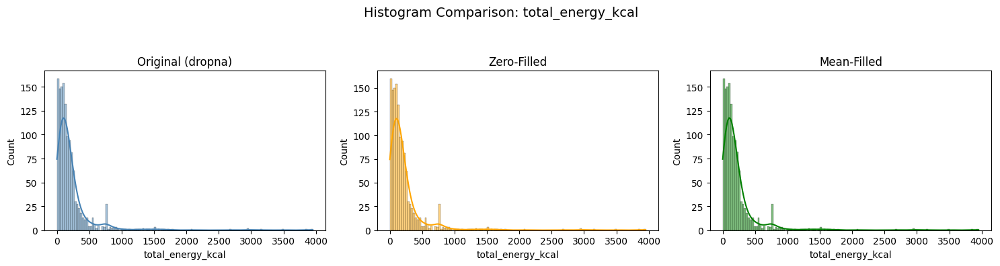

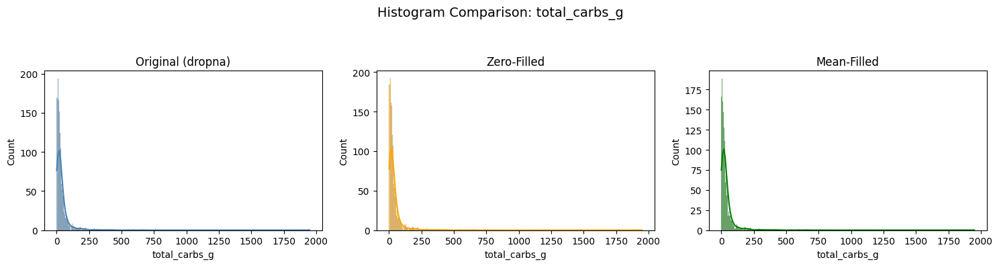

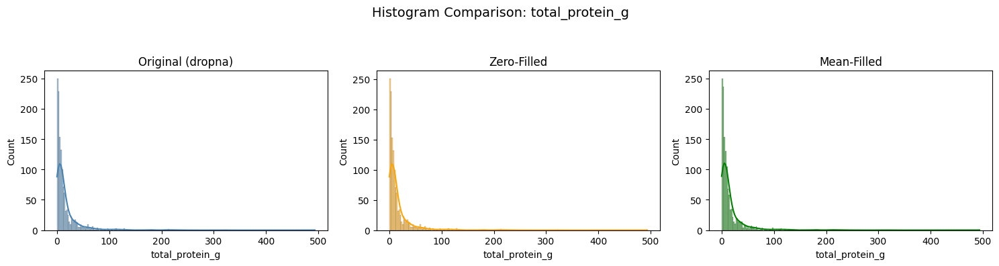

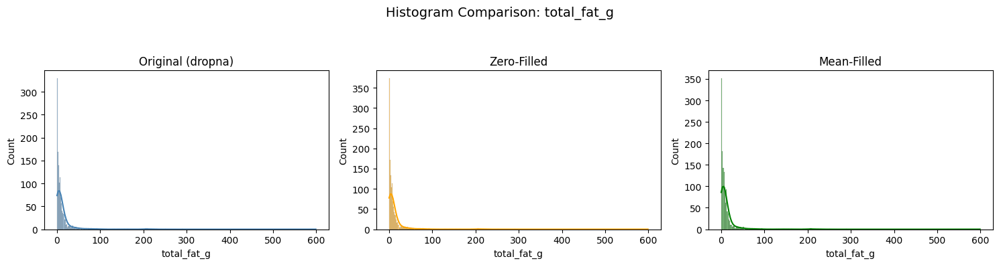

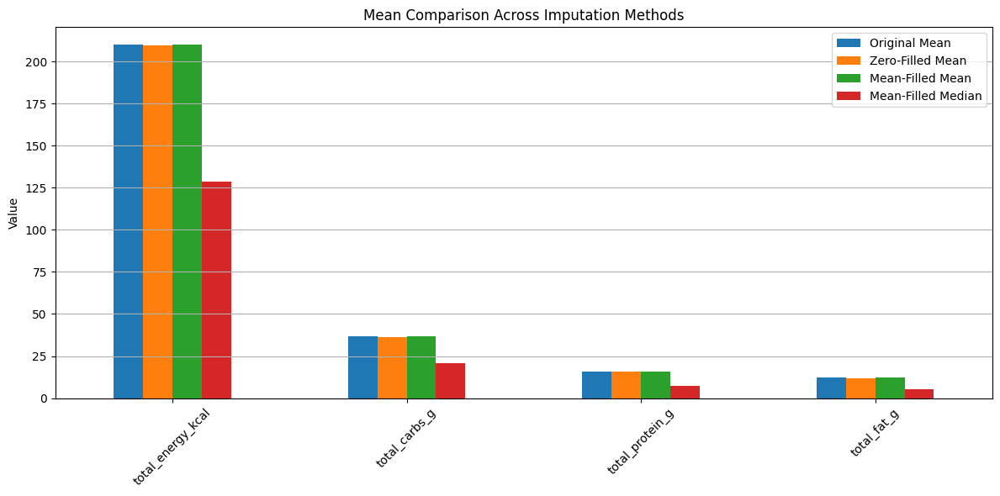

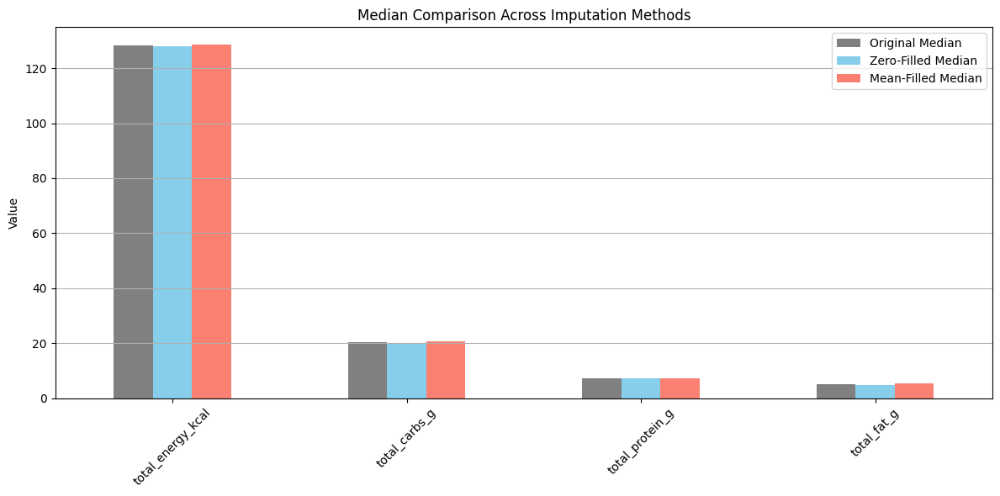

In [152]:
plt.figure(figsize=(14, 8))
for i, col in enumerate(numeric_cols):
    plt.subplot(2, 2, i + 1)
    sns.boxplot(data=pd.DataFrame({
        'Original': recipe_nutrition[col],
        'Zero-Filled': df_zero_filled[col],
        'Mean-Filled': df_mean_filled[col]
    }))
    plt.title(f'Boxplot Comparison: {col}')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# 🔍 Add Histograms for Each Column
for col in numeric_cols:
    plt.figure(figsize=(15, 4))
    plt.suptitle(f'Histogram Comparison: {col}', fontsize=14)

    # 1. Original (dropna)
    plt.subplot(1, 3, 1)
    sns.histplot(recipe_nutrition[col].dropna(), kde=True, color='steelblue')
    plt.title('Original (dropna)')
    plt.xlabel(col)

    # 2. Zero-Filled
    plt.subplot(1, 3, 2)
    sns.histplot(df_zero_filled[col], kde=True, color='orange')
    plt.title('Zero-Filled')
    plt.xlabel(col)

    # 3. Mean-Filled
    plt.subplot(1, 3, 3)
    sns.histplot(df_mean_filled[col], kde=True, color='green')
    plt.title('Mean-Filled')
    plt.xlabel(col)

    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# 📊 Create comparison dataframe of means and medians
summary_stats = pd.DataFrame(index=numeric_cols)

for method_name, dataframe in zip(
    ['Original', 'Zero-Filled', 'Mean-Filled'],
    [recipe_nutrition, df_zero_filled, df_mean_filled]
):
    summary_stats[f'{method_name} Mean'] = dataframe[numeric_cols].mean()
    summary_stats[f'{method_name} Median'] = dataframe[numeric_cols].median()

# Plot mean comparison
summary_stats[[col for col in summary_stats.columns if 'Mean' in col]].plot(
    kind='bar', figsize=(12, 6), title='Mean Comparison Across Imputation Methods'
)
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Plot median comparison
summary_stats[[col for col in summary_stats.columns if 'Median' in col]].plot(
    kind='bar', figsize=(12, 6), title='Median Comparison Across Imputation Methods',
    color=['gray', 'skyblue', 'salmon']
)
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [153]:
for col in numeric_cols:
    mean_val = recipe_nutrition[col].mean()
    recipe_nutrition[col].fillna(mean_val, inplace=True)

#any more missing columns?
print(recipe_nutrition.isnull().sum())

recipe_id                  0
total_energy_kcal          0
total_carbs_g              0
total_protein_g            0
total_fat_g                0
final_micronutrients     337
nutrition_id               0
fat                     1284
dtype: int64


/tmp/ipython-input-153-4294144362.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  recipe_nutrition[col].fillna(mean_val, inplace=True)



=== MACRONUTRIENT COMPOSITION (% of calories) ===
Carbohydrate %: 330.8 ± 3358.6
Protein %: 95.9 ± 527.1
Fat %: 134.6 ± 1090.7


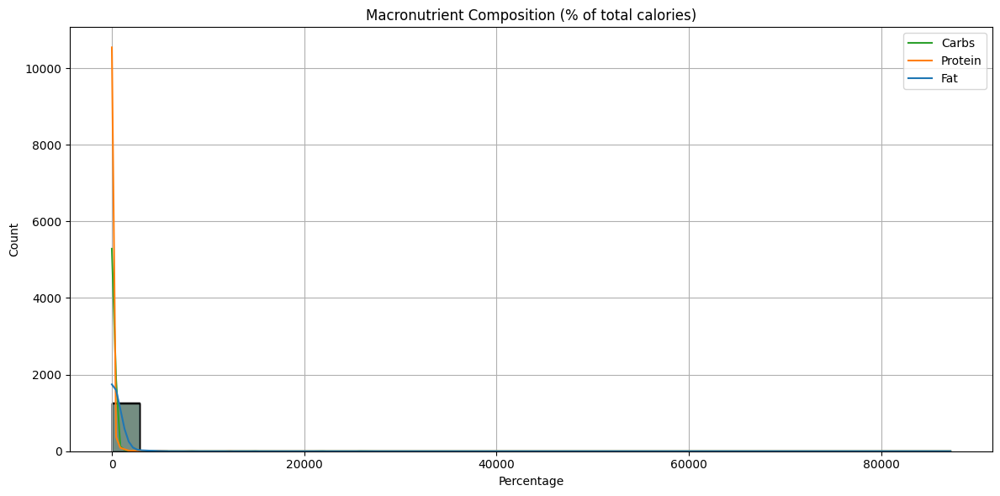

In [155]:
complete_nutrition = recipe_nutrition.dropna(subset=numeric_cols)
complete_nutrition = complete_nutrition[complete_nutrition['total_energy_kcal'] > 0].copy()

complete_nutrition['carb_percent'] = (complete_nutrition['total_carbs_g'] * 4 / complete_nutrition['total_energy_kcal']) * 100
complete_nutrition['protein_percent'] = (complete_nutrition['total_protein_g'] * 4 / complete_nutrition['total_energy_kcal']) * 100
complete_nutrition['fat_percent'] = (complete_nutrition['total_fat_g'] * 9 / complete_nutrition['total_energy_kcal']) * 100

# Display summary statistics
print(f"\n=== MACRONUTRIENT COMPOSITION (% of calories) ===")
print(f"Carbohydrate %: {complete_nutrition['carb_percent'].mean():.1f} ± {complete_nutrition['carb_percent'].std():.1f}")
print(f"Protein %: {complete_nutrition['protein_percent'].mean():.1f} ± {complete_nutrition['protein_percent'].std():.1f}")
print(f"Fat %: {complete_nutrition['fat_percent'].mean():.1f} ± {complete_nutrition['fat_percent'].std():.1f}")

# Optional: visualize macronutrient distributions
plt.figure(figsize=(12, 6))
sns.histplot(complete_nutrition[['carb_percent', 'protein_percent', 'fat_percent']], bins=30, kde=True)
plt.title("Macronutrient Composition (% of total calories)")
plt.xlabel("Percentage")
plt.ylabel("Count")
plt.legend(labels=['Carbs', 'Protein', 'Fat'])
plt.grid(True)
plt.tight_layout()
plt.show()

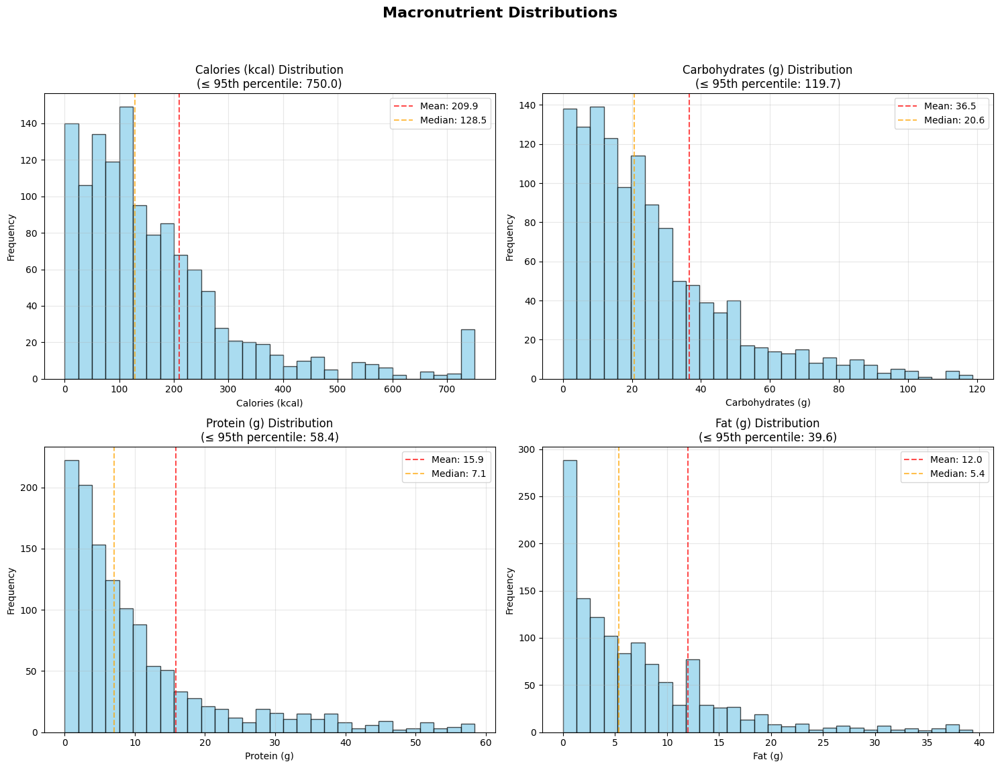

In [156]:
macronutrient_cols = ['total_energy_kcal', 'total_carbs_g', 'total_protein_g', 'total_fat_g']
display_names = ['Calories (kcal)', 'Carbohydrates (g)', 'Protein (g)', 'Fat (g)']

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Macronutrient Distributions', fontsize=16, fontweight='bold')

for i, (col, display_name) in enumerate(zip(macronutrient_cols, display_names)):
    row = i // 2
    col_idx = i % 2

    data = recipe_nutrition[col].dropna()

    # Filter out extreme outliers (above 95th percentile)
    q95 = data.quantile(0.95)
    filtered_data = data[data <= q95]

    ax = axes[row, col_idx]
    ax.hist(filtered_data, bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    ax.set_title(f'{display_name} Distribution\n(≤ 95th percentile: {q95:.1f})')
    ax.set_xlabel(display_name)
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)

    # Add vertical lines for mean and median
    mean_val = data.mean()
    median_val = data.median()
    ax.axvline(mean_val, color='red', linestyle='--', alpha=0.7, label=f'Mean: {mean_val:.1f}')
    ax.axvline(median_val, color='orange', linestyle='--', alpha=0.7, label=f'Median: {median_val:.1f}')
    ax.legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit suptitle
plt.show()

#### 2.6.3 Micronutrients

In [157]:
total_null = recipe_nutrition['final_micronutrients'].isna().sum()
print(f"❌ Recipes with NULL micronutrient data: {total_null}")

❌ Recipes with NULL micronutrient data: 337


In [ ]:
# Micronutrient diversity analysis
print(f"\n=== MICRONUTRIENT DIVERSITY ANALYSIS ===")
recipe_nutrition['micronutrient_count'] = recipe_nutrition['final_micronutrients'].str.split(',').str.len()
recipe_nutrition['micronutrient_count'] = recipe_nutrition['micronutrient_count'].fillna(0)

print("Micronutrient count statistics:")
print(recipe_nutrition['micronutrient_count'].describe())

# Identify recipes with exceptional nutritional profiles
high_protein = complete_nutrition[complete_nutrition['protein_percent'] > complete_nutrition['protein_percent'].quantile(0.9)]
high_energy = complete_nutrition[complete_nutrition['total_energy_kcal'] > complete_nutrition['total_energy_kcal'].quantile(0.9)]

print(f"\nHigh-protein recipes (top 10%): {len(high_protein)} recipes")
print(f"High-energy recipes (top 10%): {len(high_energy)} recipes")


=== MICRONUTRIENT DIVERSITY ANALYSIS ===
Micronutrient count statistics:
count    1322.000000
mean        4.034796
std         5.924225
min         0.000000
25%         0.000000
50%         1.000000
75%         4.000000
max        27.000000
Name: micronutrient_count, dtype: float64

High-protein recipes (top 10%): 92 recipes
High-energy recipes (top 10%): 92 recipes


In [ ]:
# Improved Micronutrient Analysis with Empty/Missing Value Handling
from collections import Counter
import ast


# Analyze the final_micronutrients column which contains lists of micronutrients
print("=== MICRONUTRIENT COVERAGE ANALYSIS ===\n")

# Check if final_micronutrients column exists and analyze it
if 'final_micronutrients' in recipe_nutrition.columns:
    print(f"📊 Total recipes in dataset: {len(recipe_nutrition)}")

    # Analyze missing/empty micronutrient data
    total_null = recipe_nutrition['final_micronutrients'].isna().sum()
    print(f"❌ Recipes with NULL micronutrient data: {total_null}")

    # Count recipes with empty lists []
    empty_lists = 0
    valid_micronutrient_data = 0
    all_micronutrients = []
    micronutrient_counts_per_recipe = []

    for idx, micronutrient_data in enumerate(recipe_nutrition['final_micronutrients']):
        if pd.isna(micronutrient_data):
            micronutrient_counts_per_recipe.append(0)
            continue

        try:
            # Handle string representation of lists
            if isinstance(micronutrient_data, str):
                if micronutrient_data.strip() in ['[]', '', 'nan']:
                    empty_lists += 1
                    micronutrient_counts_per_recipe.append(0)
                    continue
                micronutrient_list = ast.literal_eval(micronutrient_data)
            elif isinstance(micronutrient_data, list):
                micronutrient_list = micronutrient_data
            else:
                empty_lists += 1
                micronutrient_counts_per_recipe.append(0)
                continue

            # Check if the list is empty
            if not micronutrient_list or len(micronutrient_list) == 0:
                empty_lists += 1
                micronutrient_counts_per_recipe.append(0)
            else:
                valid_micronutrient_data += 1
                all_micronutrients.extend(micronutrient_list)
                micronutrient_counts_per_recipe.append(len(micronutrient_list))

        except (ValueError, SyntaxError, TypeError) as e:
            empty_lists += 1
            micronutrient_counts_per_recipe.append(0)

    print(f"📭 Recipes with empty micronutrient lists []: {empty_lists}")
    print(f"✅ Recipes with valid micronutrient data: {valid_micronutrient_data}")

    total_missing = total_null + empty_lists
    print(f"\n🔍 SUMMARY:")
    print(f"  • Total recipes missing micronutrient data: {total_missing} ({total_missing/len(recipe_nutrition)*100:.1f}%)")
    print(f"  • Total recipes with micronutrient data: {valid_micronutrient_data} ({valid_micronutrient_data/len(recipe_nutrition)*100:.1f}%)")

    if valid_micronutrient_data > 0:
        print("\n" + "="*50)
        print("🧬 MICRONUTRIENT FREQUENCY ANALYSIS")
        print("="*50)

        micronutrient_counts = Counter(all_micronutrients)

        print(f"\n📈 Statistics:")
        print(f"  • Total unique micronutrients found: {len(micronutrient_counts)}")
        print(f"  • Total micronutrient mentions: {sum(micronutrient_counts.values())}")
        print(f"  • Average micronutrients per recipe (all): {sum(micronutrient_counts_per_recipe)/len(recipe_nutrition):.1f}")
        print(f"  • Average micronutrients per recipe (with data): {sum(micronutrient_counts_per_recipe)/max(valid_micronutrient_data, 1):.1f}")

        # Distribution of micronutrient counts per recipe
        from collections import Counter as RecipeCounter
        recipe_micro_distribution = RecipeCounter(micronutrient_counts_per_recipe)
        print(f"\n📊 Distribution of micronutrients per recipe:")
        for count, num_recipes in sorted(recipe_micro_distribution.items()):
            if count == 0:
                print(f"  • {count} micronutrients: {num_recipes} recipes ({num_recipes/len(recipe_nutrition)*100:.1f}%)")
            else:
                print(f"  • {count} micronutrients: {num_recipes} recipes ({num_recipes/len(recipe_nutrition)*100:.1f}%)")

        print(f"\n🏆 TOP 20 Most Common Micronutrients:")
        print("-" * 45)
        for i, (micro, count) in enumerate(micronutrient_counts.most_common(20), 1):
            percentage = (count / valid_micronutrient_data) * 100
            print(f"{i:2d}. {micro:<25} {count:4d} recipes ({percentage:5.1f}%)")

        print(f"\n🔻 LEAST Common Micronutrients (bottom 10):")
        print("-" * 45)
        least_common = micronutrient_counts.most_common()[-10:]
        for i, (micro, count) in enumerate(reversed(least_common), 1):
            percentage = (count / valid_micronutrient_data) * 100
            print(f"{i:2d}. {micro:<25} {count:4d} recipes ({percentage:5.1f}%)")

        # Additional insights
        rare_micronutrients = sum(1 for count in micronutrient_counts.values() if count == 1)
        common_micronutrients = sum(1 for count in micronutrient_counts.values() if count >= valid_micronutrient_data * 0.1)

        print(f"\n💎 Additional Insights:")
        print(f"  • Micronutrients appearing in only 1 recipe: {rare_micronutrients}")
        print(f"  • Micronutrients appearing in ≥10% of recipes: {common_micronutrients}")

        if micronutrient_counts:
            most_common_micro = micronutrient_counts.most_common(1)[0]
            print(f"  • Most prevalent micronutrient: {most_common_micro[0]} (in {most_common_micro[1]} recipes)")

    else:
        print("\n⚠️  No valid micronutrient data found for analysis.")

else:
    print("❌ No final_micronutrients column found.")

=== MICRONUTRIENT COVERAGE ANALYSIS ===

📊 Total recipes in dataset: 1322
❌ Recipes with NULL micronutrient data: 337
📭 Recipes with empty micronutrient lists []: 581
✅ Recipes with valid micronutrient data: 404

🔍 SUMMARY:
  • Total recipes missing micronutrient data: 918 (69.4%)
  • Total recipes with micronutrient data: 404 (30.6%)

🧬 MICRONUTRIENT FREQUENCY ANALYSIS

📈 Statistics:
  • Total unique micronutrients found: 64
  • Total micronutrient mentions: 4393
  • Average micronutrients per recipe (all): 3.3
  • Average micronutrients per recipe (with data): 10.9

📊 Distribution of micronutrients per recipe:
  • 0 micronutrients: 918 recipes (69.4%)
  • 2 micronutrients: 77 recipes (5.8%)
  • 3 micronutrients: 1 recipes (0.1%)
  • 4 micronutrients: 32 recipes (2.4%)
  • 5 micronutrients: 18 recipes (1.4%)
  • 6 micronutrients: 22 recipes (1.7%)
  • 8 micronutrients: 3 recipes (0.2%)
  • 9 micronutrients: 12 recipes (0.9%)
  • 10 micronutrients: 11 recipes (0.8%)
  • 11 micronutrien

C:\Users\Helena\AppData\Local\Temp\ipykernel_34548\2816119534.py:40: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.tight_layout()
C:\Users\Helena\AppData\Local\Temp\ipykernel_34548\2816119534.py:40: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.
  plt.tight_layout()
C:\Users\Helena\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Helena\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


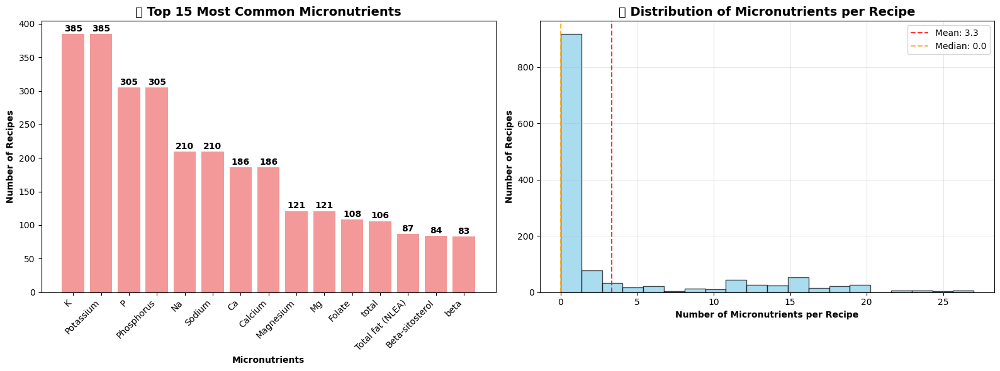


📋 MICRONUTRIENT SUMMARY STATISTICS
• Dataset Coverage:
  - Total recipes: 1322
  - Recipes with micronutrient data: 404 (30.6%)
  - Recipes missing data: 918 (69.4%)

• Micronutrient Diversity:
  - Total unique micronutrients: 64
  - Most common micronutrient: K (in 385 recipes)
  - Micronutrients appearing in only 1 recipe: 4
  - Average micronutrients per recipe: 3.3


In [ ]:
# Micronutrient Visualization - Top Micronutrients and Distribution
import matplotlib.pyplot as plt
import seaborn as sns

if 'micronutrient_counts' in locals() and micronutrient_counts:
    # Create a figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    # Plot 1: Top 15 Most Common Micronutrients
    top_15_micros = micronutrient_counts.most_common(15)
    micros, counts = zip(*top_15_micros)

    bars1 = ax1.bar(range(len(micros)), counts, color='lightcoral', alpha=0.8)
    ax1.set_xlabel('Micronutrients', fontweight='bold')
    ax1.set_ylabel('Number of Recipes', fontweight='bold')
    ax1.set_title('📊 Top 15 Most Common Micronutrients', fontweight='bold', fontsize=14)
    ax1.set_xticks(range(len(micros)))
    ax1.set_xticklabels(micros, rotation=45, ha='right')

    # Add count labels on bars
    for bar, count in zip(bars1, counts):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                str(count), ha='center', va='bottom', fontweight='bold')

    # Plot 2: Distribution of Micronutrient Counts per Recipe
    recipe_micro_dist = pd.Series(micronutrient_counts_per_recipe)
    recipe_micro_dist.hist(bins=20, ax=ax2, color='skyblue', alpha=0.7, edgecolor='black')
    ax2.set_xlabel('Number of Micronutrients per Recipe', fontweight='bold')
    ax2.set_ylabel('Number of Recipes', fontweight='bold')
    ax2.set_title('📈 Distribution of Micronutrients per Recipe', fontweight='bold', fontsize=14)
    ax2.grid(True, alpha=0.3)

    # Add statistics annotation
    mean_micros = recipe_micro_dist.mean()
    median_micros = recipe_micro_dist.median()
    ax2.axvline(mean_micros, color='red', linestyle='--', alpha=0.8, label=f'Mean: {mean_micros:.1f}')
    ax2.axvline(median_micros, color='orange', linestyle='--', alpha=0.8, label=f'Median: {median_micros:.1f}')
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # Summary statistics box
    print("\n" + "="*60)
    print("📋 MICRONUTRIENT SUMMARY STATISTICS")
    print("="*60)
    print(f"• Dataset Coverage:")
    print(f"  - Total recipes: {len(recipe_nutrition)}")
    print(f"  - Recipes with micronutrient data: {valid_micronutrient_data} ({valid_micronutrient_data/len(recipe_nutrition)*100:.1f}%)")
    print(f"  - Recipes missing data: {total_missing} ({total_missing/len(recipe_nutrition)*100:.1f}%)")
    print(f"\n• Micronutrient Diversity:")
    print(f"  - Total unique micronutrients: {len(micronutrient_counts)}")
    print(f"  - Most common micronutrient: {micronutrient_counts.most_common(1)[0][0]} (in {micronutrient_counts.most_common(1)[0][1]} recipes)")
    print(f"  - Micronutrients appearing in only 1 recipe: {sum(1 for c in micronutrient_counts.values() if c == 1)}")
    print(f"  - Average micronutrients per recipe: {sum(micronutrient_counts_per_recipe) / len(recipe_nutrition):.1f}")

else:
    print("⚠️ No micronutrient data available for visualization.")

#### 2.6 DataFrame: recipe_nutrition - Comprehensive Univariate Analysis

**Purpose:** Detailed analysis of recipe nutritional data to understand nutritional distribution patterns, completeness, adequacy for different age groups, and quality of nutritional information in the baby food dataset.


📊 GENERATING COMPREHENSIVE NUTRITIONAL VISUALIZATIONS


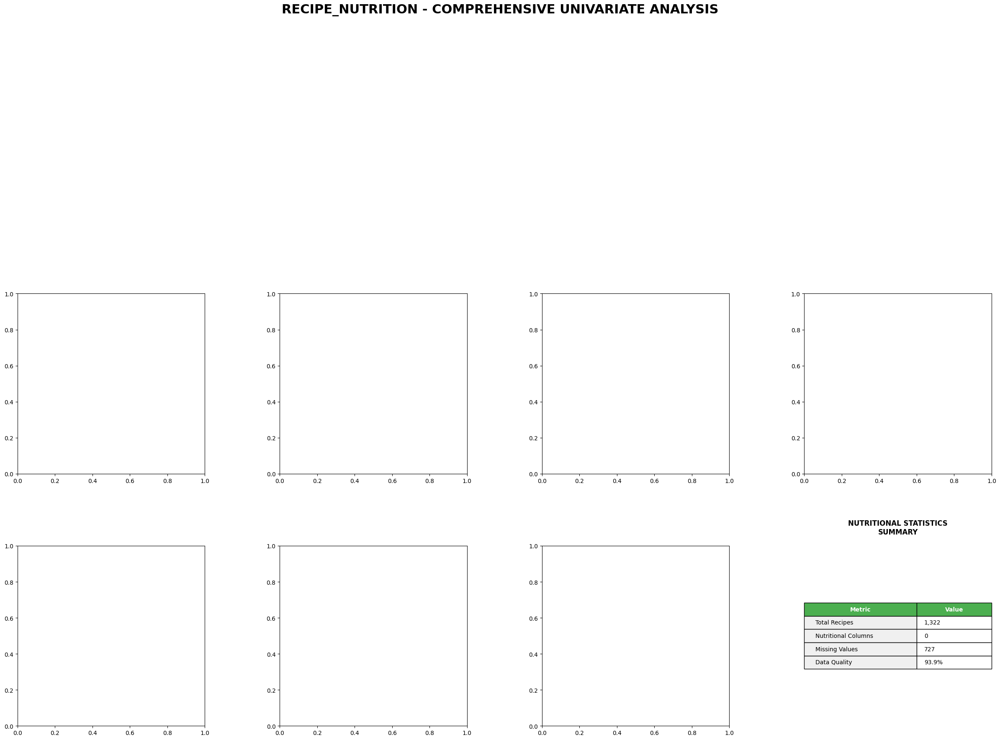

✅ Recipe nutrition visualizations completed successfully!


In [ ]:
# =============================================================================
# COMPREHENSIVE VISUALIZATIONS - RECIPE_NUTRITION
# =============================================================================

print(f"\n📊 GENERATING COMPREHENSIVE NUTRITIONAL VISUALIZATIONS")
print(f"{'='*55}")

# Setup the visualization grid
fig = plt.figure(figsize=(24, 18))
fig.suptitle('RECIPE_NUTRITION - COMPREHENSIVE UNIVARIATE ANALYSIS',
             fontsize=22, fontweight='bold', y=0.98)

# Prepare data for visualizations
macronutrient_cols = [col for col in numerical_cols
                      if any(keyword.lower() in col.lower()
                            for keyword in ['calorie', 'energy', 'protein', 'carbohydrate', 'fat', 'fiber'])]
micronutrient_cols = [col for col in numerical_cols
                      if any(keyword.lower() in col.lower()
                            for keyword in ['vitamin', 'mineral', 'iron', 'calcium', 'zinc', 'sodium'])]

# 1. Macronutrient Distribution (Multiple Histograms)
if macronutrient_cols:
    n_macros = min(4, len(macronutrient_cols))  # Limit to 4 for space
    for i, col in enumerate(macronutrient_cols[:n_macros]):
        ax = plt.subplot(3, 4, i+1)
        data = recipe_nutrition[col].dropna()
        if len(data) > 0:
            ax.hist(data, bins=30, alpha=0.7, color=plt.cm.Set3(i), edgecolor='black')
            ax.set_title(f'{col}\nDistribution', fontweight='bold', pad=10)
            ax.set_xlabel('Value')
            ax.set_ylabel('Frequency')
            ax.grid(True, alpha=0.3)

            # Add statistics
            mean_val = data.mean()
            median_val = data.median()
            ax.axvline(mean_val, color='red', linestyle='--', linewidth=2, alpha=0.8)
            ax.axvline(median_val, color='green', linestyle='--', linewidth=2, alpha=0.8)

            # Add text box with stats
            stats_text = f'Mean: {mean_val:.1f}\nMedian: {median_val:.1f}'
            ax.text(0.95, 0.95, stats_text, transform=ax.transAxes,
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
                   verticalalignment='top', horizontalalignment='right', fontsize=8)

# 2. Nutritional Completeness Heatmap
ax5 = plt.subplot(3, 4, 5)
nutrition_cols = macronutrient_cols + micronutrient_cols
if nutrition_cols and len(nutrition_cols) > 0:
    # Sample for visualization if too many recipes
    sample_size = min(50, len(recipe_nutrition))
    sample_data = recipe_nutrition.sample(sample_size) if len(recipe_nutrition) > sample_size else recipe_nutrition

    # Create completeness matrix
    completeness_matrix = sample_data[nutrition_cols].notna().astype(int)

    im = ax5.imshow(completeness_matrix.values, cmap='RdYlGn', aspect='auto')
    ax5.set_title('Nutritional Data Completeness\n(Sample Recipes)', fontweight='bold', pad=15)
    ax5.set_xlabel('Nutritional Components')
    ax5.set_ylabel('Recipe Samples')

    # Set tick labels
    if len(nutrition_cols) <= 10:
        ax5.set_xticks(range(len(nutrition_cols)))
        ax5.set_xticklabels([col[:8] + '...' if len(col) > 8 else col for col in nutrition_cols],
                           rotation=45, ha='right')

    plt.colorbar(im, ax=ax5, shrink=0.8, label='Complete (1) / Missing (0)')

# 3. Nutritional Completeness Distribution
ax6 = plt.subplot(3, 4, 6)
if nutrition_cols and 'recipe_id' in recipe_nutrition.columns:
    # Calculate completeness percentage for each recipe
    completeness_pcts = []
    for idx, row in recipe_nutrition.iterrows():
        available = sum(1 for col in nutrition_cols if pd.notna(row[col]))
        completeness_pct = (available / len(nutrition_cols)) * 100
        completeness_pcts.append(completeness_pct)

    ax6.hist(completeness_pcts, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    ax6.set_title('Nutritional Completeness\nDistribution', fontweight='bold', pad=15)
    ax6.set_xlabel('Completeness Percentage')
    ax6.set_ylabel('Number of Recipes')
    ax6.grid(True, alpha=0.3)

    # Add reference lines
    ax6.axvline(50, color='orange', linestyle='--', linewidth=2, label='50% threshold')
    ax6.axvline(80, color='green', linestyle='--', linewidth=2, label='80% threshold')
    ax6.legend()

# 4. Macronutrient Correlation Heatmap
ax7 = plt.subplot(3, 4, 7)
if len(macronutrient_cols) >= 2:
    macro_corr = recipe_nutrition[macronutrient_cols].corr()

    im = ax7.imshow(macro_corr.values, cmap='coolwarm', aspect='auto', vmin=-1, vmax=1)
    ax7.set_title('Macronutrient\nCorrelation Matrix', fontweight='bold', pad=15)

    # Set labels
    ax7.set_xticks(range(len(macronutrient_cols)))
    ax7.set_yticks(range(len(macronutrient_cols)))
    ax7.set_xticklabels([col[:6] + '...' if len(col) > 6 else col for col in macronutrient_cols],
                       rotation=45, ha='right')
    ax7.set_yticklabels([col[:6] + '...' if len(col) > 6 else col for col in macronutrient_cols])

    # Add correlation values
    for i in range(len(macronutrient_cols)):
        for j in range(len(macronutrient_cols)):
            text = ax7.text(j, i, f'{macro_corr.iloc[i, j]:.2f}',
                           ha="center", va="center", color="black", fontweight='bold')

    plt.colorbar(im, ax=ax7, shrink=0.8)

# 5. Nutritional Adequacy by Categories (if available)
ax8 = plt.subplot(3, 4, 8)
if macronutrient_cols:
    # Create adequacy categories based on calorie content (if available)
    calorie_cols = [col for col in macronutrient_cols if 'calorie' in col.lower() or 'energy' in col.lower()]
    if calorie_cols:
        calorie_col = calorie_cols[0]
        calorie_data = recipe_nutrition[calorie_col].dropna()

        # Define adequacy categories
        low_cal = calorie_data[calorie_data < 100]
        moderate_cal = calorie_data[(calorie_data >= 100) & (calorie_data <= 200)]
        high_cal = calorie_data[calorie_data > 200]

        categories = ['Low\n(<100)', 'Moderate\n(100-200)', 'High\n(>200)']
        counts = [len(low_cal), len(moderate_cal), len(high_cal)]
        colors = ['lightcoral', 'lightblue', 'lightgreen']

        bars = ax8.bar(categories, counts, color=colors, alpha=0.8, edgecolor='black')
        ax8.set_title('Caloric Adequacy\nDistribution', fontweight='bold', pad=15)
        ax8.set_ylabel('Number of Recipes')
        ax8.grid(True, alpha=0.3)

        # Add value labels
        for bar, count in zip(bars, counts):
            height = bar.get_height()
            ax8.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{count}\n({count/len(calorie_data)*100:.1f}%)',
                    ha='center', va='bottom', fontweight='bold')

# 6. Missing Data Pattern Analysis
ax9 = plt.subplot(3, 4, 9)
missing_pattern = recipe_nutrition[nutrition_cols].isnull().sum().sort_values(ascending=True)
if len(missing_pattern) > 0:
    bars = ax9.barh(range(len(missing_pattern)), missing_pattern.values,
                    color='salmon', alpha=0.8)
    ax9.set_title('Missing Nutritional Data\nby Component', fontweight='bold', pad=15)
    ax9.set_xlabel('Number of Missing Values')
    ax9.set_yticks(range(len(missing_pattern)))
    ax9.set_yticklabels([col[:10] + '...' if len(col) > 10 else col for col in missing_pattern.index])
    ax9.grid(True, alpha=0.3, axis='x')

    # Add percentage labels
    total_recipes = len(recipe_nutrition)
    for i, (bar, count) in enumerate(zip(bars, missing_pattern.values)):
        percentage = (count / total_recipes) * 100
        ax9.text(count + max(missing_pattern.values) * 0.01, i,
                f'{percentage:.1f}%', va='center', fontweight='bold')

# 7. Nutritional Profile Comparison (Box Plot)
ax10 = plt.subplot(3, 4, 10)
if len(macronutrient_cols) >= 2:
    # Normalize macronutrients for comparison (z-score)
    macro_data = recipe_nutrition[macronutrient_cols].dropna()
    if len(macro_data) > 0:
        normalized_data = []
        labels = []
        for col in macronutrient_cols[:4]:  # Limit to 4 for visibility
            data = macro_data[col].dropna()
            if len(data) > 0 and data.std() > 0:
                normalized = (data - data.mean()) / data.std()
                normalized_data.append(normalized.values)
                labels.append(col[:8] + '...' if len(col) > 8 else col)

        if normalized_data:
            box_plot = ax10.boxplot(normalized_data, labels=labels, patch_artist=True)
            ax10.set_title('Normalized Macronutrient\nDistributions', fontweight='bold', pad=15)
            ax10.set_ylabel('Z-Score')
            ax10.grid(True, alpha=0.3)
            ax10.tick_params(axis='x', rotation=45)

            # Color the boxes
            colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightyellow']
            for patch, color in zip(box_plot['boxes'], colors):
                patch.set_facecolor(color)
                patch.set_alpha(0.7)

# 8. Nutritional Quality Score Distribution
ax11 = plt.subplot(3, 4, 11)
if nutrition_cols:
    # Calculate a simple quality score (completeness + diversity)
    quality_scores = []
    for idx, row in recipe_nutrition.iterrows():
        # Completeness score (0-100)
        completeness = sum(1 for col in nutrition_cols if pd.notna(row[col])) / len(nutrition_cols) * 100

        # Diversity score (non-zero nutrients)
        diversity = sum(1 for col in nutrition_cols if pd.notna(row[col]) and row[col] > 0) / len(nutrition_cols) * 100

        # Combined quality score
        quality_score = (completeness + diversity) / 2
        quality_scores.append(quality_score)

    ax11.hist(quality_scores, bins=20, alpha=0.7, color='gold', edgecolor='black')
    ax11.set_title('Nutritional Quality\nScore Distribution', fontweight='bold', pad=15)
    ax11.set_xlabel('Quality Score (%)')
    ax11.set_ylabel('Number of Recipes')
    ax11.grid(True, alpha=0.3)

    # Add quality thresholds
    ax11.axvline(50, color='orange', linestyle='--', linewidth=2, label='Fair (50%)')
    ax11.axvline(75, color='green', linestyle='--', linewidth=2, label='Good (75%)')
    ax11.legend()

# 9. Summary Statistics Table
ax12 = plt.subplot(3, 4, 12)
ax12.axis('off')

# Calculate comprehensive statistics
stats_data = []
stats_data.append(['Total Recipes', f"{len(recipe_nutrition):,}"])
stats_data.append(['Nutritional Columns', f"{len(nutrition_cols)}"])

if macronutrient_cols:
    stats_data.append(['Macronutrients', f"{len(macronutrient_cols)}"])

if micronutrient_cols:
    stats_data.append(['Micronutrients', f"{len(micronutrient_cols)}"])

# Overall completeness
if nutrition_cols:
    overall_completeness = ((recipe_nutrition[nutrition_cols].notna().sum().sum()) /
                           (len(recipe_nutrition) * len(nutrition_cols))) * 100
    stats_data.append(['Overall Completeness', f"{overall_completeness:.1f}%"])

# Missing data
missing_total = recipe_nutrition.isnull().sum().sum()
stats_data.append(['Missing Values', f"{missing_total:,}"])
stats_data.append(['Data Quality', f"{((1 - missing_total / (len(recipe_nutrition) * len(recipe_nutrition.columns))) * 100):.1f}%"])

# Create statistics table
table = ax12.table(cellText=stats_data,
                   colLabels=['Metric', 'Value'],
                   cellLoc='left',
                   loc='center',
                   colWidths=[0.6, 0.4])

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 1.8)

# Style the table
for i in range(len(stats_data)):
    table[(i+1, 0)].set_facecolor('#f0f0f0')
    table[(i+1, 1)].set_facecolor('#ffffff')

table[(0, 0)].set_facecolor('#4CAF50')
table[(0, 1)].set_facecolor('#4CAF50')
table[(0, 0)].set_text_props(weight='bold', color='white')
table[(0, 1)].set_text_props(weight='bold', color='white')

ax12.set_title('NUTRITIONAL STATISTICS\nSUMMARY', fontweight='bold', pad=20)

plt.tight_layout()
plt.subplots_adjust(top=0.93, hspace=0.4, wspace=0.4)
plt.show()

print("✅ Recipe nutrition visualizations completed successfully!")

### 2.7 Recipes Dataframe

In [170]:
recipes_df = dataframes["recipes"]
recipes = recipes_df.copy()
display(recipes.shape)
display(recipes.columns.to_list())

(1322, 26)

['name',
 'ingredients',
 'instructions',
 'min_age',
 'max_age',
 'texture',
 'prep_time',
 'cook_time',
 'serving',
 'recipe_link',
 'credibility',
 'image_link',
 'difficulty',
 'meal_type',
 'description',
 'tips',
 'hypoallergenic',
 'origin_id',
 'choking_hazards',
 'recipe_id',
 'prep_time_missing',
 'cook_time_missing',
 'meal_type_missing',
 'texture_missing',
 'min_age_missing',
 'max_age_missing']


Missing Values Summary:
                       0  percent
name                  0     0.00
ingredients           0     0.00
instructions          0     0.00
min_age             117     8.85
max_age             147    11.12
texture               0     0.00
prep_time           583    44.10
cook_time           572    43.27
serving             146    11.04
recipe_link           0     0.00
credibility         784    59.30
image_link         1279    96.75
difficulty            0     0.00
meal_type           985    74.51
description        1190    90.02
tips               1298    98.18
hypoallergenic        0     0.00
origin_id             0     0.00
choking_hazards       0     0.00
recipe_id             0     0.00
prep_time_missing     0     0.00
cook_time_missing     0     0.00
meal_type_missing     0     0.00
texture_missing       0     0.00
min_age_missing       0     0.00
max_age_missing       0     0.00


/tmp/ipython-input-171-494521014.py:22: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


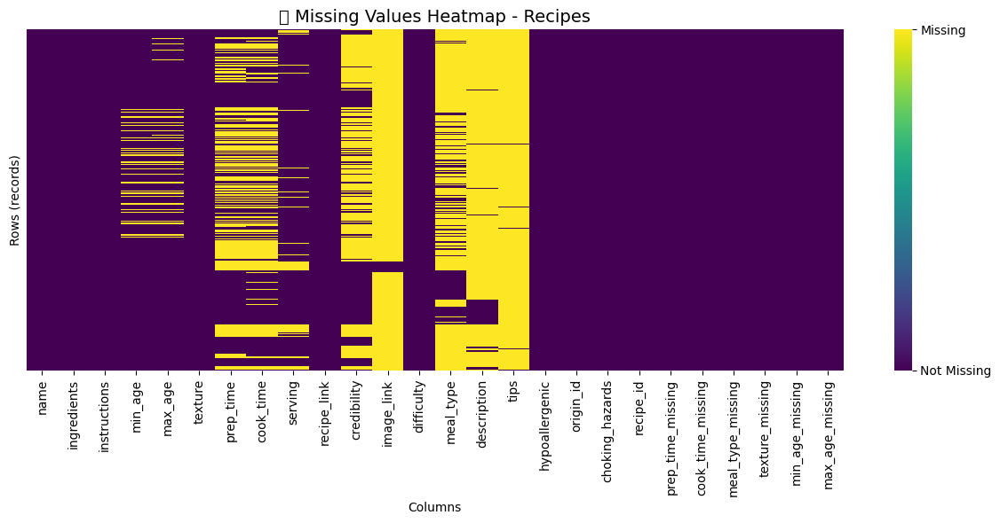

In [171]:
# 2. Missing values
missing = recipes.isnull().sum()
missing_pct = (recipes.isnull().mean() * 100).round(2)
missing_df = pd.concat([missing, missing_pct.rename("percent")], axis=1)
print("\nMissing Values Summary:\n", missing_df)

# 3. Heatmap
plt.figure(figsize=(12, 6))
ax = sns.heatmap(
    recipes.isnull(),
    cbar=True,            # Show colorbar/legend
    cmap="viridis",       # Color theme
    yticklabels=False,    # Hide row labels for clarity
)
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 1])
cbar.set_ticklabels(['Not Missing', 'Missing'])

plt.title("🟨 Missing Values Heatmap - Recipes", fontsize=14)
plt.xlabel("Columns")
plt.ylabel("Rows (records)")
plt.tight_layout()
plt.show()

In [172]:
recipes.describe()

,min_age,max_age,prep_time,cook_time,origin_id,recipe_id,prep_time_missing,cook_time_missing,meal_type_missing,texture_missing,min_age_missing,max_age_missing
count,1205.000000,1175.000000,739.000000,750.000000,1322.000000,1322.000000,1322.000000,1322.000000,1322.000000,1322.0,1322.000000,1322.000000
mean,8.712863,13.881702,12.428958,22.609333,20.980333,661.500000,0.440998,0.432678,0.745083,0.0,0.088502,0.111195
std,2.509889,6.639703,5.432889,14.426488,18.711432,381.772838,0.496695,0.495634,0.435979,0.0,0.284131,0.314493
min,6.000000,6.000000,2.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
25%,6.000000,9.000000,10.000000,15.000000,9.000000,331.250000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
50%,9.000000,12.000000,10.000000,20.000000,9.000000,661.500000,0.000000,0.000000,1.000000,0.0,0.000000,0.000000
75%,12.000000,24.000000,15.000000,30.000000,38.000000,991.750000,1.000000,1.000000,1.000000,0.0,0.000000,0.000000
max,12.000000,24.000000,60.000000,170.000000,76.000000,1322.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000


In [173]:
recipes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1322 entries, 0 to 1321
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1322 non-null   object 
 1   ingredients        1322 non-null   object 
 2   instructions       1322 non-null   object 
 3   min_age            1205 non-null   float64
 4   max_age            1175 non-null   float64
 5   texture            1322 non-null   object 
 6   prep_time          739 non-null    float64
 7   cook_time          750 non-null    float64
 8   serving            1176 non-null   object 
 9   recipe_link        1322 non-null   object 
 10  credibility        538 non-null    object 
 11  image_link         43 non-null     object 
 12  difficulty         1322 non-null   object 
 13  meal_type          337 non-null    object 
 14  description        132 non-null    object 
 15  tips               24 non-null     object 
 16  hypoallergenic     1322 

#### 2.7.1 **Observation**
Some is not correctly have the right type
- choking + hypo suppose to be bool
- serving suppose to be numerical

In [174]:
# Check unique values in the suspect columns
print("choking_hazards:", recipes['choking_hazards'].unique())
print("hypoallergenic:", recipes['hypoallergenic'].unique())
print("serving:", recipes['serving'].unique())

choking_hazards: ['No' 'Yes']
hypoallergenic: ['No' 'Yes']
serving: [1 '10 servings' nan 8 '2 cups' '35-40 pikelets' 2 '10-12 balls'
 '3 servings' '1 serving' '6 servings' '5 servings' '8 servings'
 '2 servings' '4 servings' 3 '15 pieces' '12 servings' '2 portions' '1–2'
 5 '2–4' '4 portions' '4–5 servings' 4 '1 portion' '6 skewers' '4 pieces'
 '5-6 servings' '10 pieces' '8 pieces' 10 16 '20 servings' 20 12 6
 '20 pieces' '10 slices' '12 pieces' '4 skewers' '4 cakes' 9 '18 slices'
 '3 skewers' '16 slices' '20 donuts' '6 slices' '10 skewers' '15 servings'
 '12-15 servings' '18 pieces' '6 portions' '3 portions' '7 portions'
 '1 baby portion' '6 baby portions' '1 bowl' '2' '1' '6' '4' '3' '8' '5'
 '12' '10 (approx)' '4 (approx)' '8 (approx)' '7 (approx)' '3 (approx)'
 '25 infant (approx)' '15 (approx)' '7' '2 (approx)' '10' '1 to 2'
 '1 (approx)' '4 (infant-sized)' '4 (infant)' '4 Portions' '4-6 portions'
 '24 mini muffins' '12 croquettes' '10 croquettes' '10 fritters'
 '8-10 small pancak

In [175]:
import re
import numpy as np

def clean_serving(val):
    if pd.isna(val):
        return np.nan

    val_str = str(val).lower().strip()

    # Handle ranges like "4-6"
    if '-' in val_str:
        nums = re.findall(r'\d+', val_str)
        if len(nums) == 2:
            return round((int(nums[0]) + int(nums[1])) / 2)

    # Handle values like "10 (approx)" or "2 cups"
    nums = re.findall(r'\d+', val_str)
    if nums:
        return int(nums[0])  # Take the first number found

    return np.nan  # If nothing numeric found


In [176]:
recipes['choking_hazards'] = recipes['choking_hazards'].map({'Yes': True, 'No': False})
recipes['hypoallergenic'] = recipes['hypoallergenic'].map({'Yes': True, 'No': False})
recipes['serving'] = recipes['serving'].apply(clean_serving)

In [177]:
recipes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1322 entries, 0 to 1321
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1322 non-null   object 
 1   ingredients        1322 non-null   object 
 2   instructions       1322 non-null   object 
 3   min_age            1205 non-null   float64
 4   max_age            1175 non-null   float64
 5   texture            1322 non-null   object 
 6   prep_time          739 non-null    float64
 7   cook_time          750 non-null    float64
 8   serving            1176 non-null   float64
 9   recipe_link        1322 non-null   object 
 10  credibility        538 non-null    object 
 11  image_link         43 non-null     object 
 12  difficulty         1322 non-null   object 
 13  meal_type          337 non-null    object 
 14  description        132 non-null    object 
 15  tips               24 non-null     object 
 16  hypoallergenic     1322 

In [178]:
recipes[['choking_hazards', 'hypoallergenic']]

,choking_hazards,hypoallergenic
0,False,False
1,False,False
2,False,False
3,False,True
4,False,True
...,...,...
1317,False,False
1318,False,False
1319,False,False
1320,False,False


#### 2.7.2 Boolean

/tmp/ipython-input-179-3550718851.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=recipes, x=col, palette='Set2', ax=axes[i][0])
/tmp/ipython-input-179-3550718851.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=recipes, x=col, palette='Set2', ax=axes[i][0])


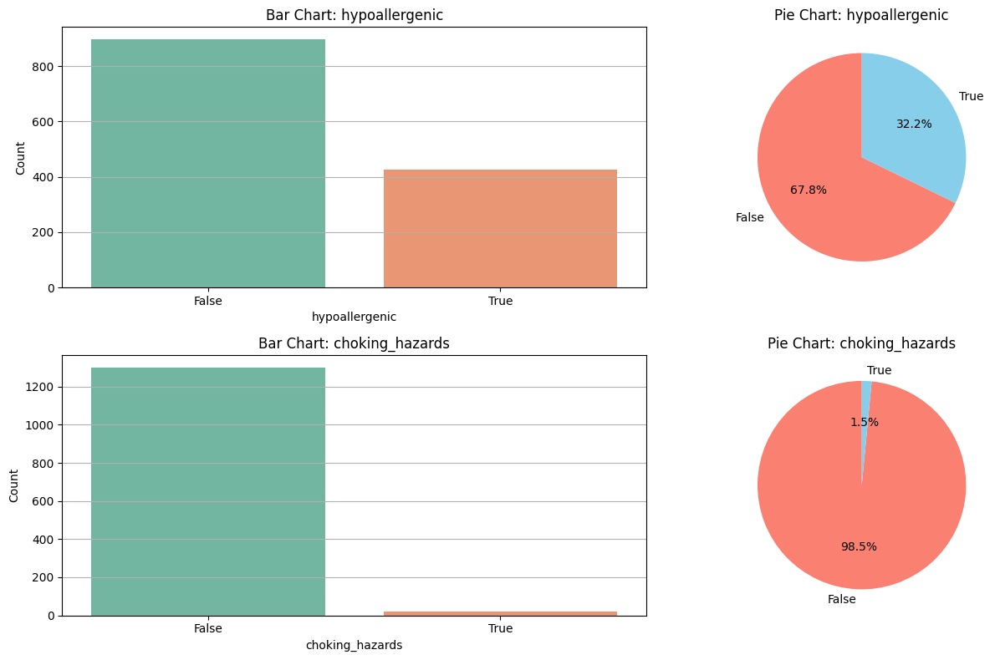

In [179]:
bool_cols = [col for col in recipes.columns if recipes[col].dtype == 'bool']

# Set up figure with 2 subplots (bar and pie) per row
n = len(bool_cols)
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(14, n * 4))

# If only one row, axes will not be a 2D array
if n == 1:
    axes = [axes]

for i, col in enumerate(bool_cols):
    # Bar plot
    sns.countplot(data=recipes, x=col, palette='Set2', ax=axes[i][0])
    axes[i][0].set_title(f"Bar Chart: {col}")
    axes[i][0].set_xlabel(col)
    axes[i][0].set_ylabel("Count")
    axes[i][0].set_xticks([0, 1])
    axes[i][0].set_xticklabels(['False', 'True'])
    axes[i][0].grid(axis='y')

    # Pie chart
    values = recipes[col].value_counts()
    axes[i][1].pie(values, labels=values.index.astype(str), autopct='%1.1f%%',
                   colors=['salmon', 'skyblue'], startangle=90)
    axes[i][1].set_title(f"Pie Chart: {col}")

plt.tight_layout()
plt.show()

#### 2.7.3 Categorical

In [180]:
categorical_cols = []
for col in recipes.columns:
    if recipes[col].dtype == 'object':
        categorical_cols.append(col)

print(f"Identified categorical columns: {categorical_cols}")
print()

# Analyze key categorical columns
key_categorical_cols = [col for col in categorical_cols if col != 'recipe_id']
print(key_categorical_cols)
for col in key_categorical_cols:
    print(f"--- {col.upper()} ---")
    value_counts = recipes[col].value_counts(dropna=False)
    print(f"Total categories: {len(value_counts)}")
    print("Distribution:")

    # Show all if <= 10 categories, otherwise show top 10
    if len(value_counts) <= 10:
        for value, count in value_counts.items():
            percentage = (count / len(recipes)) * 100
            print(f"  {value}: {count} ({percentage:.1f}%)")
    else:
        print("Top 10 categories:")
        for value, count in value_counts.head(10).items():
            percentage = (count / len(recipes)) * 100
            print(f"  {value}: {count} ({percentage:.1f}%)")

        if len(value_counts) > 10:
            others_count = value_counts.tail(-10).sum()
            others_percentage = (others_count / len(recipes)) * 100
            print(f"  Others ({len(value_counts)-10} categories): {others_count} ({others_percentage:.1f}%)")
    print()

Identified categorical columns: ['name', 'ingredients', 'instructions', 'texture', 'recipe_link', 'credibility', 'image_link', 'difficulty', 'meal_type', 'description', 'tips']

['name', 'ingredients', 'instructions', 'texture', 'recipe_link', 'credibility', 'image_link', 'difficulty', 'meal_type', 'description', 'tips']
--- NAME ---
Total categories: 1294
Distribution:
Top 10 categories:
  Sweet Corn Milk Porridge: 3 (0.2%)
  Red Rice Porridge: 3 (0.2%)
  Carrots, Broccoli & Cheese Puree: 3 (0.2%)
  Parsnip, Spinach & Sweet Potato Puree: 2 (0.2%)
  Avocado Puree: 2 (0.2%)
  Pure Pear: 2 (0.2%)
  Red Bean Milk Porridge: 2 (0.2%)
  Butter Chicken Porridge (Bubur Ayam Mentega): 2 (0.2%)
  Papaya Puree: 2 (0.2%)
  Pure Avocado: 2 (0.2%)
  Others (1284 categories): 1299 (98.3%)

--- INGREDIENTS ---
Total categories: 1312
Distribution:
Top 10 categories:
  300g potatoes, peeled & chopped
1 medium carrot, peeled & sliced
75g broccoli florets
4 tbsp of your baby's usual milk
15g unsalted butt

/tmp/ipython-input-181-3442125089.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10.index.astype(str), y=top_10.values, palette='magma')


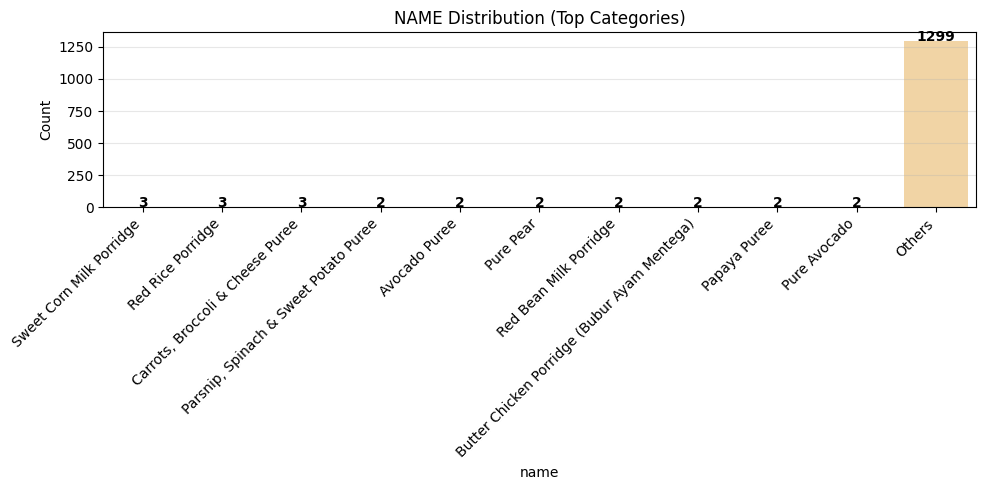

/tmp/ipython-input-181-3442125089.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10.index.astype(str), y=top_10.values, palette='magma')
/tmp/ipython-input-181-3442125089.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


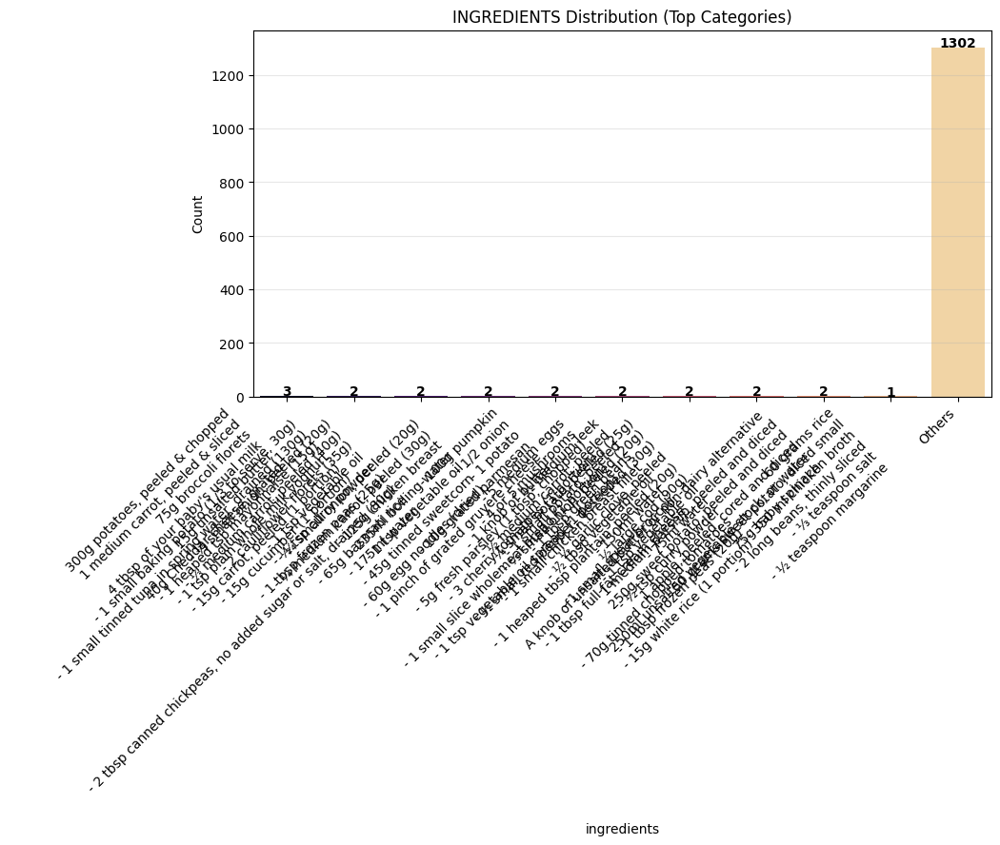

/tmp/ipython-input-181-3442125089.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10.index.astype(str), y=top_10.values, palette='magma')
/tmp/ipython-input-181-3442125089.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


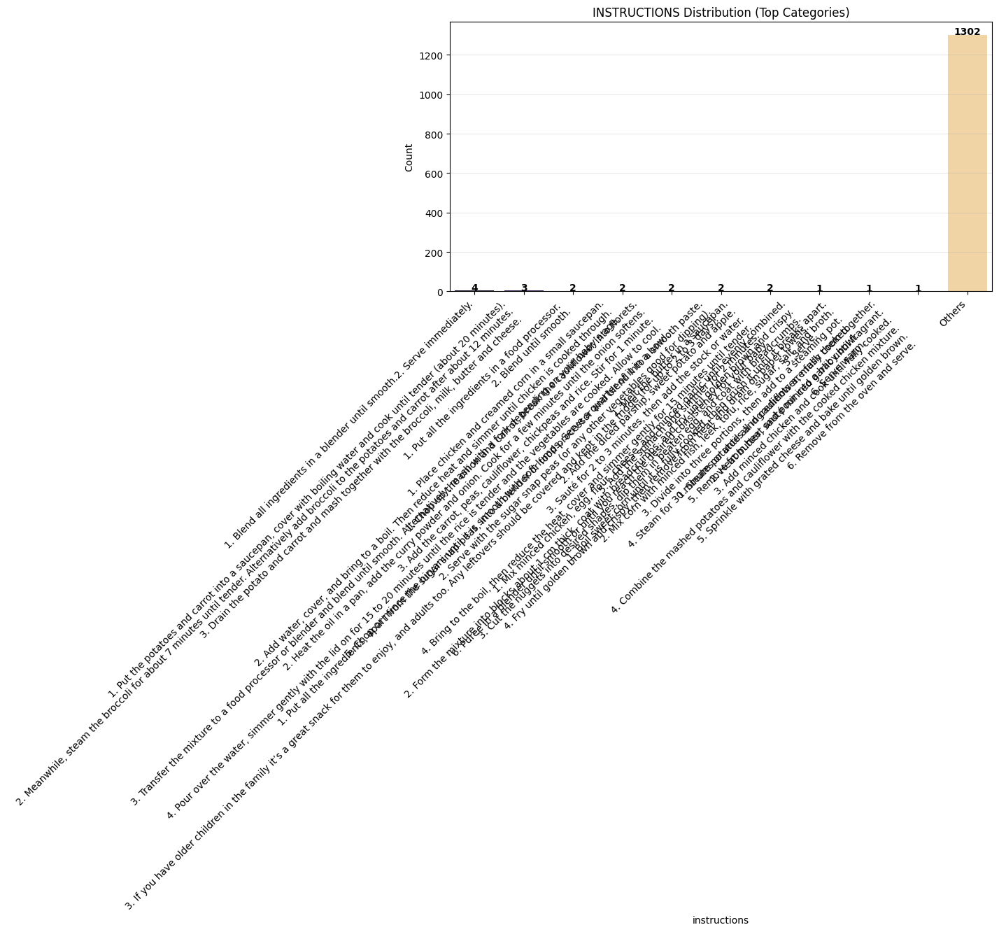

/tmp/ipython-input-181-3442125089.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index.astype(str), y=value_counts.values, palette='viridis')


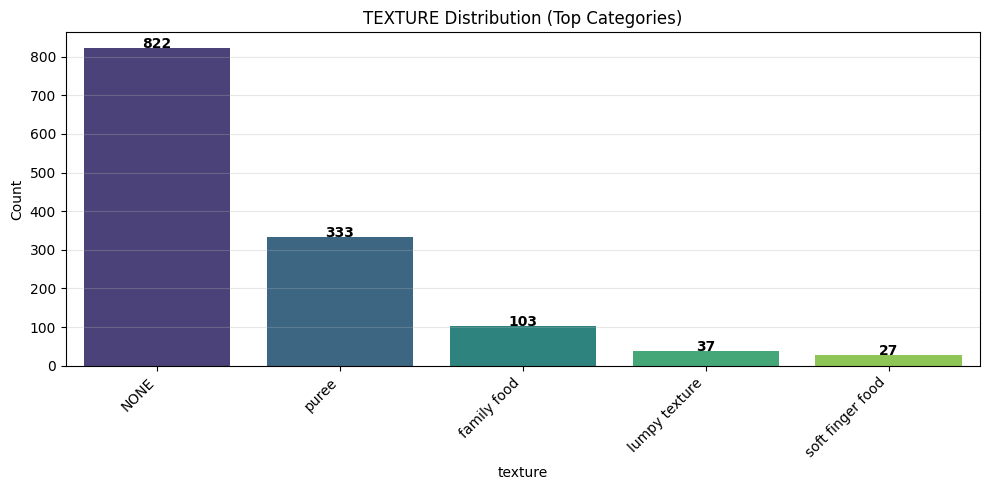

/tmp/ipython-input-181-3442125089.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10.index.astype(str), y=top_10.values, palette='magma')
/tmp/ipython-input-181-3442125089.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


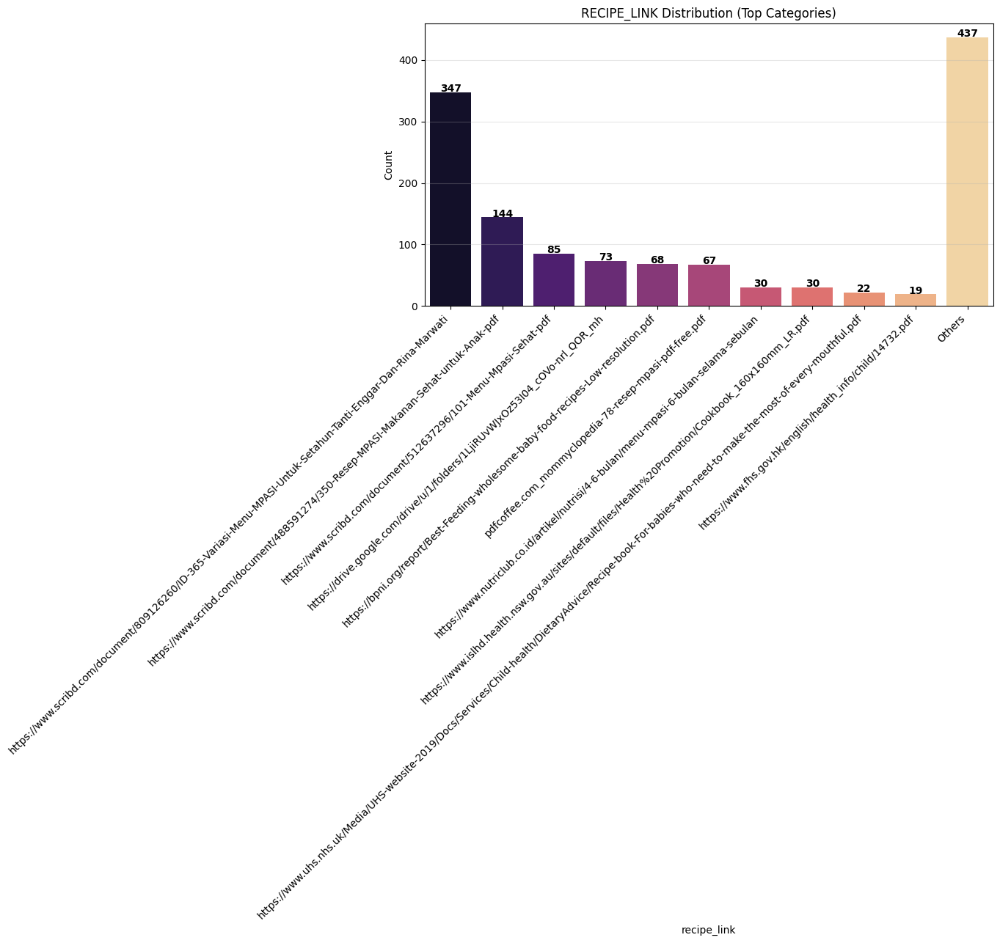

/tmp/ipython-input-181-3442125089.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index.astype(str), y=value_counts.values, palette='viridis')


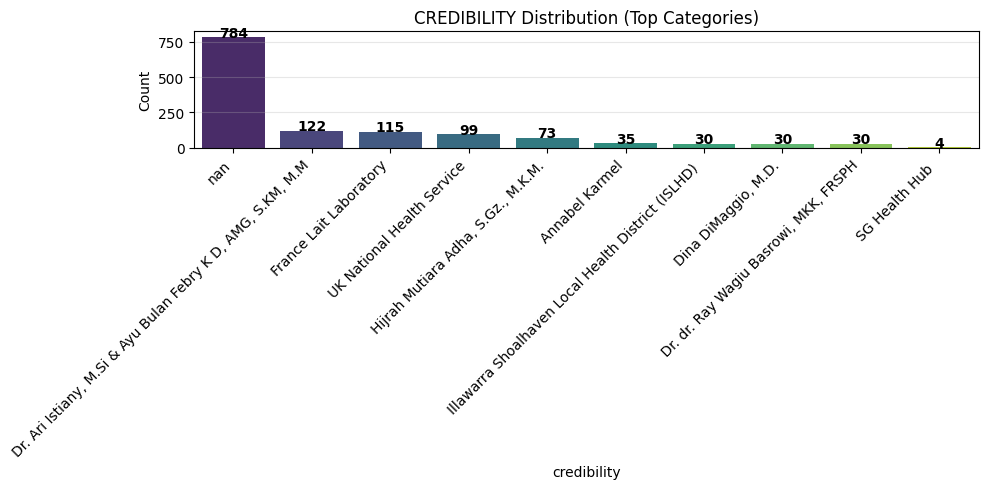

/tmp/ipython-input-181-3442125089.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10.index.astype(str), y=top_10.values, palette='magma')
/tmp/ipython-input-181-3442125089.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


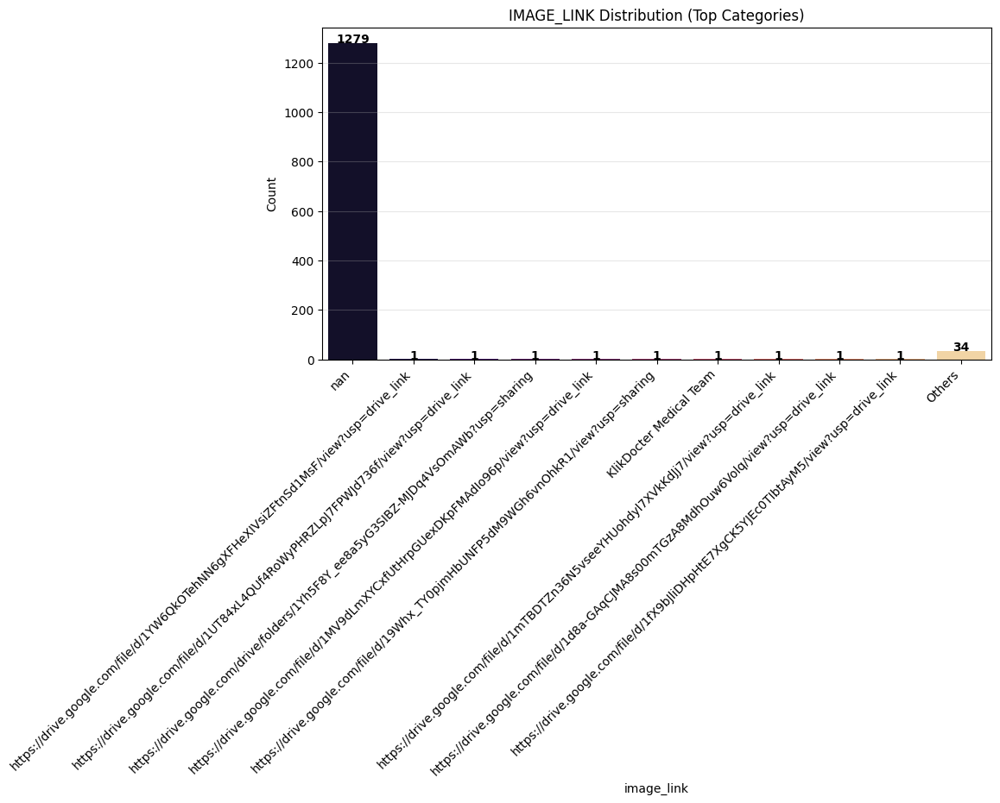

/tmp/ipython-input-181-3442125089.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_counts.index.astype(str), y=value_counts.values, palette='viridis')


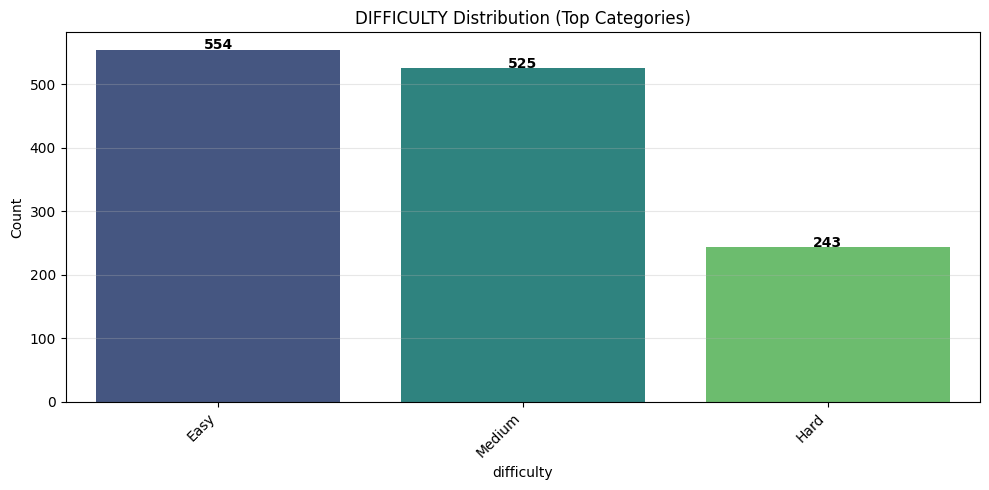

/tmp/ipython-input-181-3442125089.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10.index.astype(str), y=top_10.values, palette='magma')


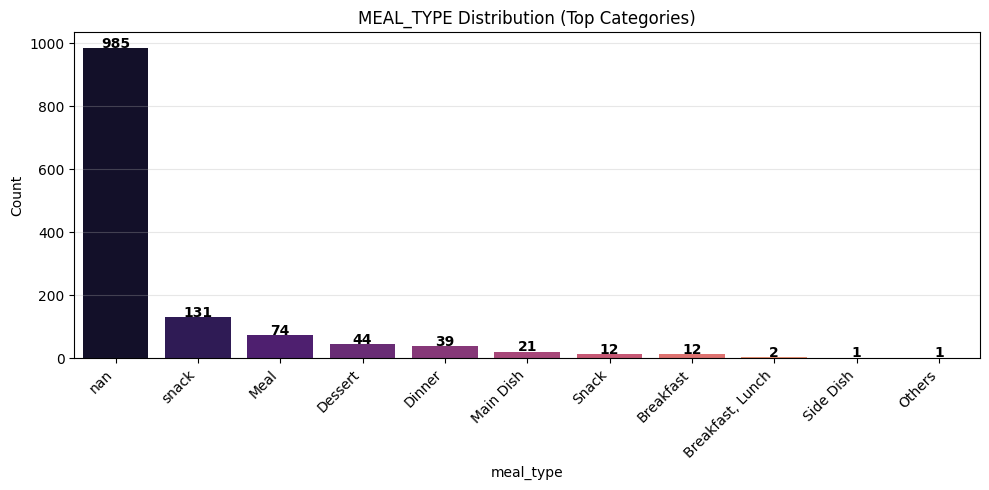

/tmp/ipython-input-181-3442125089.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10.index.astype(str), y=top_10.values, palette='magma')
/tmp/ipython-input-181-3442125089.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


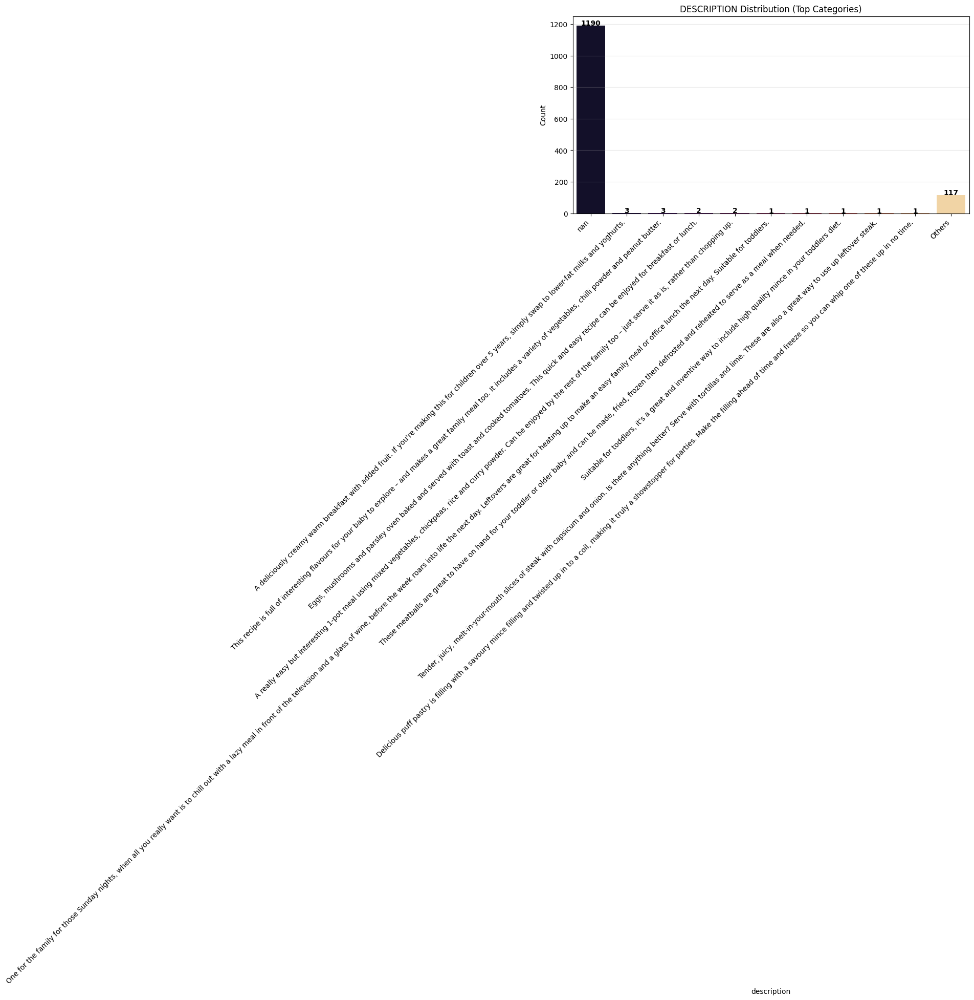

/tmp/ipython-input-181-3442125089.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10.index.astype(str), y=top_10.values, palette='magma')
/tmp/ipython-input-181-3442125089.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


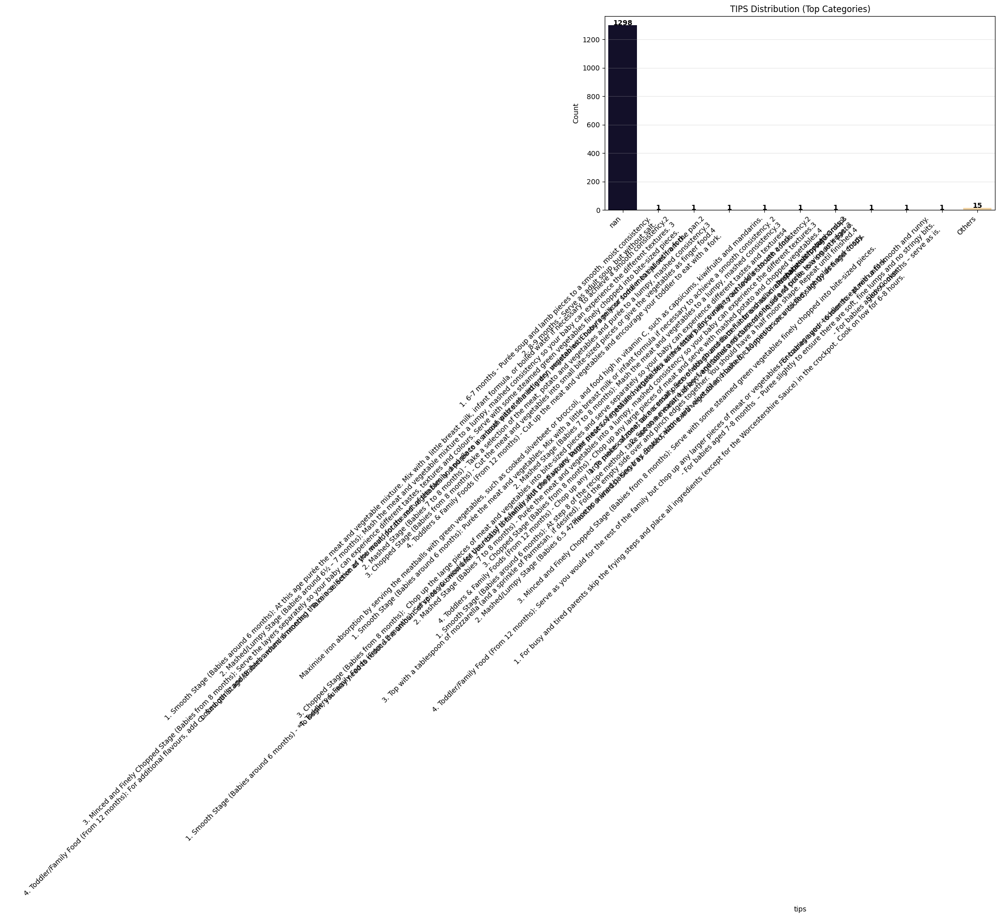

In [181]:

# Visualize each categorical column
for col in key_categorical_cols:
    plt.figure(figsize=(10, 5))
    value_counts = recipes[col].value_counts(dropna=False)

    title = f"{col.upper()} Distribution (Top Categories)"
    if len(value_counts) <= 10:
        sns.barplot(x=value_counts.index.astype(str), y=value_counts.values, palette='viridis')
        plt.xticks(rotation=45, ha='right')
        plt.title(title)

        # Add labels
        for i, val in enumerate(value_counts.values):
            plt.text(i, val + 1, str(val), ha='center', fontweight='bold')
    else:
        top_10 = value_counts.head(10)
        others_count = value_counts.tail(-10).sum()

        # Append "Others" row
        top_10['Others'] = others_count
        sns.barplot(x=top_10.index.astype(str), y=top_10.values, palette='magma')
        plt.xticks(rotation=45, ha='right')
        plt.title(title)

        for i, val in enumerate(top_10.values):
            plt.text(i, val + 1, str(val), ha='center', fontweight='bold')

    plt.xlabel(col)
    plt.ylabel("Count")
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()


Observation:


*   **Recipe with Same Name** -- Need to ensure the ingredient or instruction is not the same
*   Some word is still encoded
*   Meal Type Mapping



In [189]:
def map_meal_type_flex(meal_type):
    if pd.isnull(meal_type):
        return np.nan
    first = meal_type.split(',')[0].strip().lower()

    if first in ['breakfast', 'lunch', 'dinner']:
        return first
    elif first in ['dessert', 'drink', 'snack', 'side dish']:
        return 'snack'
    elif first in ['main dish', 'meal']:
        return 'main'  # Or return 'lunch' if you prefer to force into 4 types
    else:
        return 'unknown'


In [234]:

recipes['meal_type_mapped'] = recipes['meal_type'].apply(map_meal_type_flex)

print(recipes[['meal_type','meal_type_mapped']].head(50))
print(recipes['meal_type'].isnull().sum())
print(recipes['meal_type'].value_counts())
print(recipes['meal_type'].isnull().sum())


   meal_type meal_type_mapped
0    Unknown          unknown
1      Snack            snack
2    Unknown          unknown
3    Unknown          unknown
4    Unknown          unknown
5    Unknown          unknown
6    Unknown          unknown
7    Unknown          unknown
8    Unknown          unknown
9    Unknown          unknown
10   Unknown          unknown
11   Unknown          unknown
12   Unknown          unknown
13   Unknown          unknown
14   Unknown          unknown
15   Unknown          unknown
16   Unknown          unknown
17   Unknown          unknown
18   Unknown          unknown
19   Unknown          unknown
20   Unknown          unknown
21   Unknown          unknown
22   Unknown          unknown
23   Unknown          unknown
24   Unknown          unknown
25   Unknown          unknown
26   Unknown          unknown
27   Unknown          unknown
28   Unknown          unknown
29   Unknown          unknown
30   Unknown          unknown
31   Unknown          unknown
32   Unkno

##### =Crosschecking=

In [193]:
print("\n🔍 IDENTIFYING AND COMPARING RECIPES WITH DUPLICATE NAMES")
print("=" * 60)

name_column = 'name'
text_columns = ['ingredients', 'instructions']
same_record = 0
same_record_names = []

if name_column not in recipes.columns:
    print(f"Error: Name column '{name_column}' not found in DataFrame.")

# Find duplicate names
duplicate_names = recipes[name_column].value_counts()
duplicate_names = duplicate_names[duplicate_names > 1]

if len(duplicate_names) == 0:
    print("✅ No recipes found with duplicate names.")

print(f"Found {len(duplicate_names)} recipe names with duplicates:")
for name, count in duplicate_names.items():
    print(f"- '{name}' appears {count} times")

print("\n📋 Comparing content of duplicate recipes:")

for name in duplicate_names.index:
    print(f"\n--- Comparing '{name}' ---")
    recipes_with_name = recipes[recipes[name_column] == name].copy()

    compare_cols = [name_column] + text_columns
    display(recipes_with_name[compare_cols])

    # Clean text content for comparison
    for col in text_columns:
        if col in recipes_with_name.columns:
            recipes_with_name[f'{col}_cleaned'] = (
                recipes_with_name[col].astype(str)
                .str.lower()
                .str.replace(r'[^\w\s]', '', regex=True)
                .str.replace(r'\s+', ' ', regex=True)
                .str.strip()
                .replace('nan', '')
            )

    # Check if content is identical
    is_identical = True
    if len(recipes_with_name) > 1:
        first_row = recipes_with_name.iloc[0]
        for col in text_columns:
            cleaned_col = f'{col}_cleaned'
            if cleaned_col in recipes_with_name.columns:
                if not (recipes_with_name[cleaned_col] == first_row[cleaned_col]).all():
                    is_identical = False
                    print(f"   ⚠️  Content in column '{col}' is NOT identical across recipes with the same name.")
                    break

        if is_identical:
            same_record += 1
            same_record_names.append(name)
            print("  ❗Content in all specified text columns appears to be IDENTICAL across recipes. NEED TO DROP.")
        else:
            print("  ✅ Duplicate recipes have DIFFERING content. KEEP.")
    else:
        print("   (Only one recipe found with this name after filtering, comparison skipped)")

# Print summary
print("\n✅ SUMMARY OF IDENTICAL DUPLICATE RECIPES")
print("=" * 45)
print(f"Total identical records found: {same_record}")
print(f"Duplicate names with identical content:")
print(same_record_names)



🔍 IDENTIFYING AND COMPARING RECIPES WITH DUPLICATE NAMES
Found 25 recipe names with duplicates:
- 'Sweet Corn Milk Porridge' appears 3 times
- 'Red Rice Porridge' appears 3 times
- 'Carrots, Broccoli & Cheese Puree' appears 3 times
- 'Parsnip, Spinach & Sweet Potato Puree' appears 2 times
- 'Avocado Puree' appears 2 times
- 'Pure Pear' appears 2 times
- 'Red Bean Milk Porridge' appears 2 times
- 'Butter Chicken Porridge (Bubur Ayam Mentega)' appears 2 times
- 'Papaya Puree' appears 2 times
- 'Pure Avocado' appears 2 times
- 'Pure Mango' appears 2 times
- 'Minced Meat Porridge' appears 2 times
- 'Vegetable Rice Porridge' appears 2 times
- 'Mashed Potatoes' appears 2 times
- 'Potato Milk Porridge' appears 2 times
- 'Veggie biryani recipe' appears 2 times
- 'Papaya Mixed Milk Porridge' appears 2 times
- 'Manado Porridge' appears 2 times
- 'Hummus with veggie fingers recipe' appears 2 times
- 'Mixed Fruit Milk Porridge' appears 2 times
- 'Green Rice Porridge' appears 2 times
- 'Broccoli P

,name,ingredients,instructions
541,Sweet Corn Milk Porridge,- 3 tbsp cornstarch - 250 ml formula milk - 1 ...,1. Mix cornstarch with formula milk. Add grate...
577,Sweet Corn Milk Porridge,- 2 tbsp hunkwe flour \n- 200ml formula milk \...,1. Mix hunkwe flour with milk and grated corn....
731,Sweet Corn Milk Porridge,- 50 g yellow sweet corn - 20 g cornstarch - 3...,"1. Boil and blend corn with 50 ml water, strai..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Red Rice Porridge' ---


,name,ingredients,instructions
104,Red Rice Porridge,- 40g red rice \n- 1/2 tbsp margarine \n- 1/2 ...,1. Sauté onions and fish. \n2. Cook until tend...
706,Red Rice Porridge,- 40g parboiled red rice\n- 400ml chicken brot...,"1. Cook rice with broth until reddish, set asi..."
867,Red Rice Porridge,"- 40 grams red rice, steamed halfway (half-coo...",1. Sauté minced garlic with margarine until fr...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Carrots, Broccoli & Cheese Puree' ---


,name,ingredients,instructions
1198,"Carrots, Broccoli & Cheese Puree","300g potatoes, peeled & chopped\n1 medium carr...",1. Put the potatoes and carrot into a saucepan...
1206,"Carrots, Broccoli & Cheese Puree","300g potatoes, peeled & chopped\n1 medium carr...",1. Put the potatoes and carrot into a saucepan...
1210,"Carrots, Broccoli & Cheese Puree","300g potatoes, peeled & chopped\n1 medium carr...",1. Put the potatoes and carrot into a saucepan...


  ❗Content in all specified text columns appears to be IDENTICAL across recipes. NEED TO DROP.

--- Comparing 'Parsnip, Spinach & Sweet Potato Puree' ---


,name,ingredients,instructions
1205,"Parsnip, Spinach & Sweet Potato Puree",A knob of unsalted butter or non-dairy alterna...,1. Melt the butter in a saucepan.\n2. Add the ...
1225,"Parsnip, Spinach & Sweet Potato Puree",A knob of unsalted butter or non-dairy alterna...,1. Melt the butter in a saucepan.\n2. Add the ...


  ❗Content in all specified text columns appears to be IDENTICAL across recipes. NEED TO DROP.

--- Comparing 'Avocado Puree' ---


,name,ingredients,instructions
117,Avocado Puree,- 125 g ripe avocado (±½ fruit) - 25 ml water ...,1. Scoop out the flesh of the avocado and blen...
1282,Avocado Puree,- 1 avocado\n- Breast milk (ASI),1. Mash avocado.\n2. Add breast milk and mix w...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Pure Pear' ---


,name,ingredients,instructions
66,Pure Pear,"- 100g ripe pear, peeled, core removed, washed...",1. Steam pear until soft.\n2. Add steamed pear...
518,Pure Pear,"- 1 ripe pear (±150 g), choose fully ripe- 150...",1. Peel the pear and remove the seeds. Cut int...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Red Bean Milk Porridge' ---


,name,ingredients,instructions
520,Red Bean Milk Porridge,- 150g red beans \n- 4 bay leaves \n- 50g tofu...,"1. Boil red beans until soft and split, then s..."
564,Red Bean Milk Porridge,- 260 ml soy milk / 100 ml breast milk (ASIp)-...,"1. Combine soy milk and red beans, cook until ..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Butter Chicken Porridge (Bubur Ayam Mentega)' ---


,name,ingredients,instructions
19,Butter Chicken Porridge (Bubur Ayam Mentega),- 30 g rice \n- 30 g chicken mince \n- 1 piece...,1. Stir-fry blended spices with butter until f...
1297,Butter Chicken Porridge (Bubur Ayam Mentega),- 60g rice \n- 30g chicken \n- Grated carrot \...,"1. Sauté spices with butter. \n2. Add chicken,..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Papaya Puree' ---


,name,ingredients,instructions
37,Papaya Puree,- 300 g ripe papaya - 25 ml baby lemon juice -...,"1. Peel the papaya, cut into pieces. Combine w..."
1202,Papaya Puree,1 small papaya,"1. Cut a small papaya in half, remove the blac..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Pure Avocado' ---


,name,ingredients,instructions
813,Pure Avocado,"- 100g ripe avocado, peeled and pitted\n- 60ml...",1. Add avocado flesh to blender.\n2. Add dilut...
824,Pure Avocado,- ¼ (30g) avocados\n- ½ cup (50ml) expressed b...,1. Mash the avocado with a fork till it become...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Pure Mango' ---


,name,ingredients,instructions
63,Pure Mango,"- 100g ripe mango, peeled, washed, cut\n- 60ml...",1. Add mango and milk to blender.\n2. Blend un...
78,Pure Mango,"- 100g mango, seeds removed, washed, cut\n- 60...",1. Add mango and orange juice to blender.\n2. ...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Minced Meat Porridge' ---


,name,ingredients,instructions
317,Minced Meat Porridge,"- ½ tbsp margarine- 1 g shallot, finely choppe...","1. Melt margarine, sauté shallot until fragran..."
798,Minced Meat Porridge,"- 40 g rice, steamed halfway (aron rice)- ½ tb...","1. Melt margarine, sauté garlic until fragrant..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Vegetable Rice Porridge' ---


,name,ingredients,instructions
141,Vegetable Rice Porridge,- 400 ml chicken broth\n- 40 g carrots (diced)...,"Boil broth, add rice & veggies, cook until abs..."
432,Vegetable Rice Porridge,- 2 tbsp rice\n- 2 tbsp minced codfish\n- 1 to...,"1. Cook rice and water, add codfish, tomato, a..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Mashed Potatoes' ---


,name,ingredients,instructions
195,Mashed Potatoes,- 1½ medium potatoes\n- 1 teaspoon butter\n- 2...,1. Wash potatoes and boil with skin.\n2. When ...
464,Mashed Potatoes,- 2 peeled and cleaned potatoes\n- 1 UHT plain...,1. Steam the potatoes first.\n2. Mash the pota...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Potato Milk Porridge' ---


,name,ingredients,instructions
525,Potato Milk Porridge,- 2 boiled potatoes with skin - 200 ml formula...,1. Peel and mash the potatoes. 2. Mix with for...
648,Potato Milk Porridge,- 1 boiled potato with skin \n- 100ml formula ...,1. Peel and mash potato. \n2. Mix with formula...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Veggie biryani recipe' ---


,name,ingredients,instructions
1110,Veggie biryani recipe,"\n- ⅓ small onion, peeled (20g)\n- ⅓ medium ca...","1. Chop up the onion and carrot, break the cau..."
1113,Veggie biryani recipe,"\n- ⅓ small onion, peeled (20g)\n- ⅓ medium ca...","1. Chop up the onion and carrot, break the cau..."


  ❗Content in all specified text columns appears to be IDENTICAL across recipes. NEED TO DROP.

--- Comparing 'Papaya Mixed Milk Porridge' ---


,name,ingredients,instructions
384,Papaya Mixed Milk Porridge,- 2 tbsp rice flour - 200ml boiled water - 2 t...,"1. Mix rice flour with water and formula milk,..."
797,Papaya Mixed Milk Porridge,- 3 tbsp rice flour - 200 ml water - 3 tbsp fo...,1. Mix rice flour with water until smooth. Add...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Manado Porridge' ---


,name,ingredients,instructions
666,Manado Porridge,"- 300 ml meat broth- 40 g rice, steamed halfwa...","1. Boil meat broth, add aron rice, tempeh, and..."
865,Manado Porridge,"- 40 grams rice, washed and steamed halfway (t...","1. Boil broth until boiling, then add rice flo..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Hummus with veggie fingers recipe' ---


,name,ingredients,instructions
1143,Hummus with veggie fingers recipe,"\n- 120g chickpeas (½ canned in water, drained...","1. Put all the ingredients, apart from the sug..."
1173,Hummus with veggie fingers recipe,"- 120g chickpeas (½ canned in water, drained)\...","1. Put all the ingredients, apart from the sug..."


  ❗Content in all specified text columns appears to be IDENTICAL across recipes. NEED TO DROP.

--- Comparing 'Mixed Fruit Milk Porridge' ---


,name,ingredients,instructions
754,Mixed Fruit Milk Porridge,- 1 ripe Ambon banana - 50g blended papaya - 5...,1. Mash banana and mix with papaya. 2. Add pea...
757,Mixed Fruit Milk Porridge,- 1 ripe Ambon banana - 50 g blended papaya - ...,"1. Mash banana, mix with blended papaya. Add g..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Green Rice Porridge' ---


,name,ingredients,instructions
752,Green Rice Porridge,- 40g parboiled rice\n- 300ml chicken broth\n-...,"1. Cook rice with broth until reddish, set asi..."
753,Green Rice Porridge,"- 40 g rice, steamed halfway- 300 ml meat brot...","1. Melt margarine, sauté garlic until fragrant..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Broccoli Puree' ---


,name,ingredients,instructions
61,Broccoli Puree,"- Water for boiling - 200 g broccoli, chopped ...","1. Boil water, add broccoli. Cook until tender..."
421,Broccoli Puree,"- 50g broccoli, washed and finely chopped\n- 1...","1. Boil water or broth with rice flour, cook u..."


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Yellow Squash Puree' ---


,name,ingredients,instructions
47,Yellow Squash Puree,"- 200 g yellow squash, peeled - 100 ml baby le...",1. Cut yellow squash into pieces. Steam until ...
72,Yellow Squash Puree,"- 100g peeled, diced yellow squash\n- 60ml bre...",1. Steam yellow squash until tender.\n2. Blend...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Potato Puree' ---


,name,ingredients,instructions
126,Potato Puree,- 150 g potato (±1 piece) - 200 ml baby lemon ...,"1. Peel the potato, wash until clean. Steam th..."
440,Potato Puree,"- 100g peeled, diced potatoes\n- 100ml water o...",1. Steam potatoes until soft.\n2. Blend with w...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

--- Comparing 'Sweet Apple Milk Porridge' ---


,name,ingredients,instructions
331,Sweet Apple Milk Porridge,- 1 sweet apple - 2 tbsp rice flour - 150ml bo...,1. Peel apple and remove core. 2. Soak in boil...
674,Sweet Apple Milk Porridge,- 2 sweet apples (Fuji/Washington) - 2 tbsp ri...,1. Peel and core apples. Soak in boiling water...


   ⚠️  Content in column 'ingredients' is NOT identical across recipes with the same name.
  ✅ Duplicate recipes have DIFFERING content. KEEP.

✅ SUMMARY OF IDENTICAL DUPLICATE RECIPES
Total identical records found: 4
Duplicate names with identical content:
['Carrots, Broccoli & Cheese Puree', 'Parsnip, Spinach & Sweet Potato Puree', 'Veggie biryani recipe', 'Hummus with veggie fingers recipe']


In [194]:
print("\n✅ SUMMARY OF IDENTICAL DUPLICATES")
print("=" * 40)
print(f"Total identical records found: {same_record}")
print(f"Total unique ingredient names: {len(set(same_record_names))}")
print(f"List of ingredient names to drop (duplicates):")
print(same_record_names)  # prints full list (including potential duplicates)



✅ SUMMARY OF IDENTICAL DUPLICATES
Total identical records found: 4
Total unique ingredient names: 4
List of ingredient names to drop (duplicates):
['Carrots, Broccoli & Cheese Puree', 'Parsnip, Spinach & Sweet Potato Puree', 'Veggie biryani recipe', 'Hummus with veggie fingers recipe']


#### 2.7.4 Numerical

In [195]:
# Classify columns by type
numerical_cols = recipes.select_dtypes(include=['int64', 'float64']).columns.tolist()
print(numerical_cols)

['min_age', 'max_age', 'prep_time', 'cook_time', 'serving', 'origin_id', 'recipe_id', 'prep_time_missing', 'cook_time_missing', 'meal_type_missing', 'texture_missing', 'min_age_missing', 'max_age_missing']


In [196]:
print("\n📈 DESCRIPTIVE STATISTICS:")
display(recipes[numerical_cols].describe())

for col in numerical_cols:
    if col in recipes.columns:
        series = recipes[col].dropna()
        if len(series) > 0:
            print(f"\n🔢 {col.upper()}:")
            print(f"   Count: {len(series):,}")
            print(f"   Mean: {series.mean():.2f}")
            print(f"   Median: {series.median():.2f}")
            print(f"   Mode: {series.mode().iloc[0] if len(series.mode()) > 0 else 'N/A'}")
            print(f"   Std Dev: {series.std():.2f}")
            print(f"   Variance: {series.var():.2f}")
            print(f"   Skewness: {series.skew():.2f}")
            print(f"   Kurtosis: {series.kurtosis():.2f}")
            print(f"   Range: {series.max() - series.min():.2f}")
            print(f"   IQR: {series.quantile(0.75) - series.quantile(0.25):.2f}")
            print(f"   Min: {series.min():.2f}")
            print(f"   Max: {series.max():.2f}")
            print(f"   25th percentile: {series.quantile(0.25):.2f}")
            print(f"   75th percentile: {series.quantile(0.75):.2f}")
            print(f"   95th percentile: {series.quantile(0.95):.2f}")
            print(f"   99th percentile: {series.quantile(0.99):.2f}")


📈 DESCRIPTIVE STATISTICS:


,min_age,max_age,prep_time,cook_time,serving,origin_id,recipe_id,prep_time_missing,cook_time_missing,meal_type_missing,texture_missing,min_age_missing,max_age_missing
count,1205.000000,1175.000000,739.000000,750.000000,1176.000000,1322.000000,1322.000000,1322.000000,1322.000000,1322.000000,1322.0,1322.000000,1322.000000
mean,8.712863,13.881702,12.428958,22.609333,3.117347,20.980333,661.500000,0.440998,0.432678,0.745083,0.0,0.088502,0.111195
std,2.509889,6.639703,5.432889,14.426488,3.380017,18.711432,381.772838,0.496695,0.495634,0.435979,0.0,0.284131,0.314493
min,6.000000,6.000000,2.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
25%,6.000000,9.000000,10.000000,15.000000,1.000000,9.000000,331.250000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
50%,9.000000,12.000000,10.000000,20.000000,2.000000,9.000000,661.500000,0.000000,0.000000,1.000000,0.0,0.000000,0.000000
75%,12.000000,24.000000,15.000000,30.000000,3.000000,38.000000,991.750000,1.000000,1.000000,1.000000,0.0,0.000000,0.000000
max,12.000000,24.000000,60.000000,170.000000,38.000000,76.000000,1322.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000



🔢 MIN_AGE:
   Count: 1,205
   Mean: 8.71
   Median: 9.00
   Mode: 6.0
   Std Dev: 2.51
   Variance: 6.30
   Skewness: 0.20
   Kurtosis: -1.57
   Range: 6.00
   IQR: 6.00
   Min: 6.00
   Max: 12.00
   25th percentile: 6.00
   75th percentile: 12.00
   95th percentile: 12.00
   99th percentile: 12.00

🔢 MAX_AGE:
   Count: 1,175
   Mean: 13.88
   Median: 12.00
   Mode: 24.0
   Std Dev: 6.64
   Variance: 44.09
   Skewness: 0.71
   Kurtosis: -1.18
   Range: 18.00
   IQR: 15.00
   Min: 6.00
   Max: 24.00
   25th percentile: 9.00
   75th percentile: 24.00
   95th percentile: 24.00
   99th percentile: 24.00

🔢 PREP_TIME:
   Count: 739
   Mean: 12.43
   Median: 10.00
   Mode: 10.0
   Std Dev: 5.43
   Variance: 29.52
   Skewness: 1.92
   Kurtosis: 11.68
   Range: 58.00
   IQR: 5.00
   Min: 2.00
   Max: 60.00
   25th percentile: 10.00
   75th percentile: 15.00
   95th percentile: 20.00
   99th percentile: 30.00

🔢 COOK_TIME:
   Count: 750
   Mean: 22.61
   Median: 20.00
   Mode: 20.0
   Std Dev:


🍳 COOKING TIME ANALYSIS

⏱️ Prep Time:
   Valid entries: 739
   Missing: 583
   Range: 2 - 60 minutes
   Average: 12.4 minutes
   Median: 10.0 minutes
   Time distribution:
     5-15 min: 546 (73.9%)
     ≤5 min: 104 (14.1%)
     15-30 min: 85 (11.5%)
     30-60 min: 4 (0.5%)
     60+ min: 0 (0.0%)

⏱️ Cook Time:
   Valid entries: 750
   Missing: 572
   Range: 0 - 170 minutes
   Average: 22.6 minutes
   Median: 20.0 minutes
   Time distribution:
     15-30 min: 451 (60.1%)
     5-15 min: 194 (25.9%)
     30-60 min: 53 (7.1%)
     ≤5 min: 39 (5.2%)
     60+ min: 10 (1.3%)


/tmp/ipython-input-197-1785400109.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 1].set_xticklabels([time_labels[col] for col in time_cols])


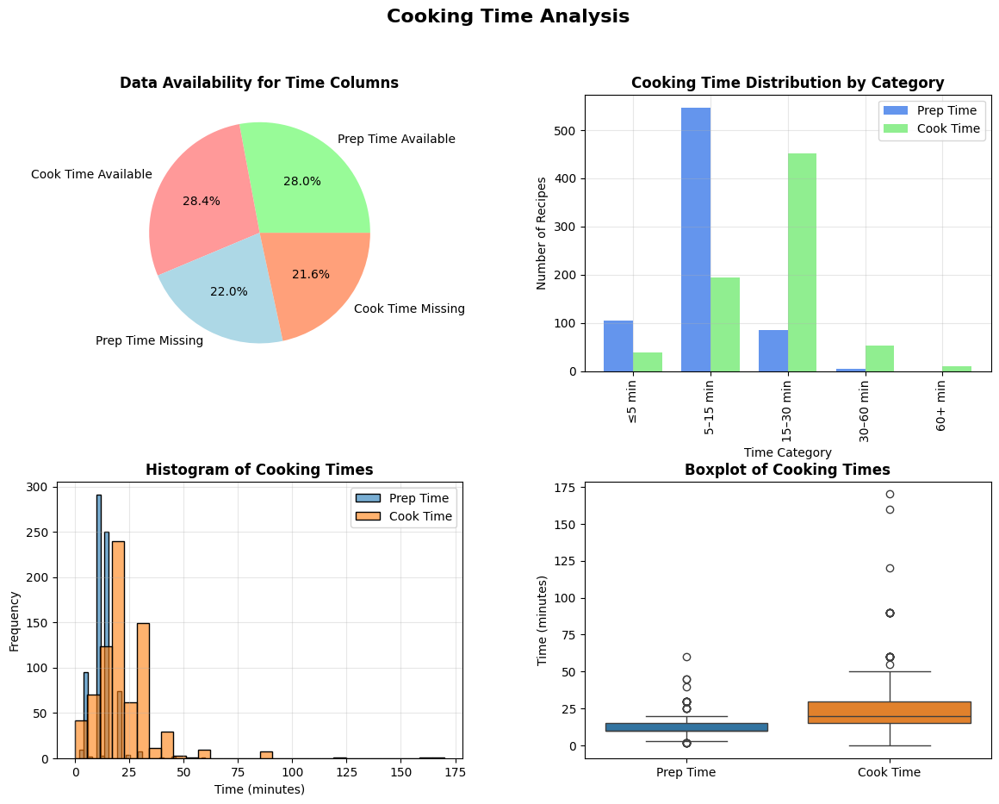

In [197]:
# ------------------ COOKING TIME ANALYSIS ------------------
print(f"\n🍳 COOKING TIME ANALYSIS")
print(f"{'='*50}")

time_cols = [col for col in ['prep_time', 'cook_time'] if col in recipes.columns]
time_labels = {'prep_time': 'Prep Time', 'cook_time': 'Cook Time'}
if time_cols:
    for col in time_cols:
        time_data = recipes[col].dropna()
        if len(time_data) > 0:
            print(f"\n⏱️ {col.replace('_', ' ').title()}:")
            print(f"   Valid entries: {len(time_data):,}")
            print(f"   Missing: {recipes[col].isnull().sum():,}")
            print(f"   Range: {time_data.min():.0f} - {time_data.max():.0f} minutes")
            print(f"   Average: {time_data.mean():.1f} minutes")
            print(f"   Median: {time_data.median():.1f} minutes")

            time_categories = pd.cut(time_data, bins=[0, 5, 15, 30, 60, float('inf')],
                                     labels=['≤5 min', '5-15 min', '15-30 min', '30-60 min', '60+ min'])
            print(f"   Time distribution:")
            for cat, count in time_categories.value_counts().items():
                print(f"     {cat}: {count} ({(count / len(time_data) * 100):.1f}%)")

# Initialize figure
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# -------------------- PIE CHART FOR MISSING DATA --------------------
missing_counts = [recipes[col].isnull().sum() for col in time_cols]
available_counts = [recipes[col].notnull().sum() for col in time_cols]
pie_labels = [f"{time_labels[col]} Available" for col in time_cols] + \
             [f"{time_labels[col]} Missing" for col in time_cols]
pie_sizes = available_counts + missing_counts
axes[0, 0].pie(pie_sizes, labels=pie_labels, autopct='%1.1f%%', colors=['#98FB98', '#FF9999', '#ADD8E6', '#FFA07A'])
axes[0, 0].set_title('Data Availability for Time Columns', fontweight='bold')

# -------------------- COMBINED BAR CHART FOR TIME CATEGORIES --------------------
bins = [0, 5, 15, 30, 60, float('inf')]
labels = ['≤5 min', '5–15 min', '15–30 min', '30–60 min', '60+ min']
bar_data = pd.DataFrame()

for col in time_cols:
    time_data = recipes[col].dropna()
    time_categories = pd.cut(time_data, bins=bins, labels=labels)
    counts = time_categories.value_counts().sort_index()
    bar_data[time_labels[col]] = counts

bar_data.plot(kind='bar', ax=axes[0, 1], width=0.75, color=['#6495ED', '#90EE90'])
axes[0, 1].set_title('Cooking Time Distribution by Category', fontweight='bold')
axes[0, 1].set_xlabel('Time Category')
axes[0, 1].set_ylabel('Number of Recipes')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# -------------------- HISTOGRAM --------------------
for col in time_cols:
    sns.histplot(recipes[col].dropna(), kde=False, bins=30, label=time_labels[col], ax=axes[1, 0], alpha=0.6)

axes[1, 0].set_title('Histogram of Cooking Times', fontweight='bold')
axes[1, 0].set_xlabel('Time (minutes)')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# -------------------- BOXPLOT --------------------
sns.boxplot(data=recipes[time_cols], ax=axes[1, 1])
axes[1, 1].set_title('Boxplot of Cooking Times', fontweight='bold')
axes[1, 1].set_ylabel('Time (minutes)')
axes[1, 1].set_xticklabels([time_labels[col] for col in time_cols])

plt.suptitle('Cooking Time Analysis', fontsize=16, fontweight='bold')
plt.show()


🍽️ SERVING SIZE ANALYSIS
   Valid entries: 1,176
   Missing: 146
   Range: 1.0 - 38.0 servings
   Average: 3.1
   Median: 2.0
   Most common: 2.0
   Top 5 servings: {2.0: np.int64(439), 1.0: np.int64(329), 4.0: np.int64(130), 3.0: np.int64(120), 10.0: np.int64(34)}


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127869 (\N{FORK AND KNIFE WITH PLATE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


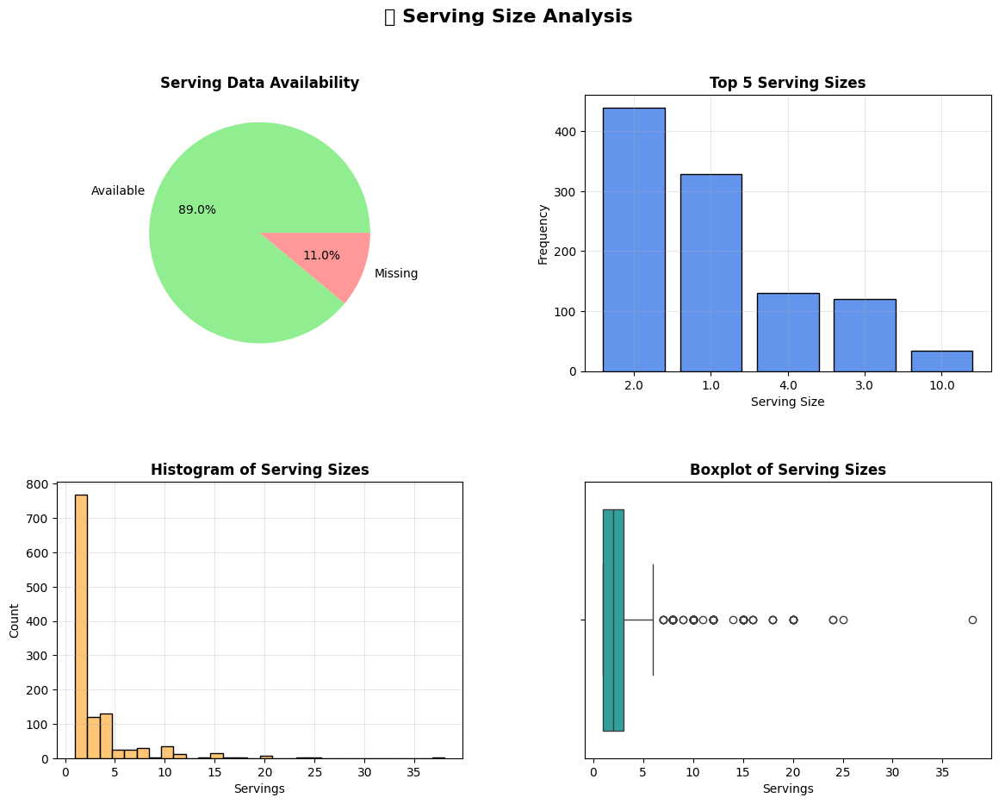

In [198]:
# ------------------ SERVING ANALYSIS ------------------
if 'serving' in recipes.columns:
    serving_data = recipes['serving'].dropna()
    print(f"\n🍽️ SERVING SIZE ANALYSIS")
    print(f"{'='*50}")
    print(f"   Valid entries: {len(serving_data):,}")
    print(f"   Missing: {recipes['serving'].isnull().sum():,}")
    print(f"   Range: {serving_data.min()} - {serving_data.max()} servings")
    print(f"   Average: {serving_data.mean():.1f}")
    print(f"   Median: {serving_data.median():.1f}")
    print(f"   Most common: {serving_data.mode().iloc[0] if len(serving_data.mode()) > 0 else 'N/A'}")
    print(f"   Top 5 servings: {dict(serving_data.value_counts().head(5))}")

    serving_data = recipes['serving'].dropna()
    serving_missing = recipes['serving'].isnull().sum()
    serving_available = len(serving_data)

    # Prepare data for top 5 bar chart
    top_servings = serving_data.value_counts().head(5)

    # Setup figure
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    plt.subplots_adjust(wspace=0.3, hspace=0.4)
    fig.suptitle("🍽️ Serving Size Analysis", fontsize=16, fontweight='bold')

    # PIE: Available vs Missing
    axes[0, 0].pie([serving_available, serving_missing],
                   labels=['Available', 'Missing'],
                   autopct='%1.1f%%',
                   colors=['#90EE90', '#FF9999'])
    axes[0, 0].set_title('Serving Data Availability', fontweight='bold')

    # BAR: Top 5 most common servings
    axes[0, 1].bar(top_servings.index.astype(str), top_servings.values, color='#6495ED', edgecolor='black')
    axes[0, 1].set_title('Top 5 Serving Sizes', fontweight='bold')
    axes[0, 1].set_xlabel('Serving Size')
    axes[0, 1].set_ylabel('Frequency')
    axes[0, 1].grid(True, alpha=0.3)

    # HISTOGRAM: Full serving distribution
    sns.histplot(serving_data, bins=30, kde=False, color='#FFB347', ax=axes[1, 0])
    axes[1, 0].set_title('Histogram of Serving Sizes', fontweight='bold')
    axes[1, 0].set_xlabel('Servings')
    axes[1, 0].set_ylabel('Count')
    axes[1, 0].grid(True, alpha=0.3)

    # BOXPLOT: Serving size spread
    sns.boxplot(x=serving_data, ax=axes[1, 1], color='#20B2AA')
    axes[1, 1].set_title('Boxplot of Serving Sizes', fontweight='bold')
    axes[1, 1].set_xlabel('Servings')

    plt.show()


🌍 ORIGIN ID ANALYSIS
   Valid entries: 1,322
   Missing: 0
   Unique origin IDs: 26
   Most common origin: 9
   Top 5 origins: {9: np.int64(780), 39: np.int64(156), 38: np.int64(141), 69: np.int64(52), 46: np.int64(30)}


/tmp/ipython-input-199-95564386.py:33: UserWarning: Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


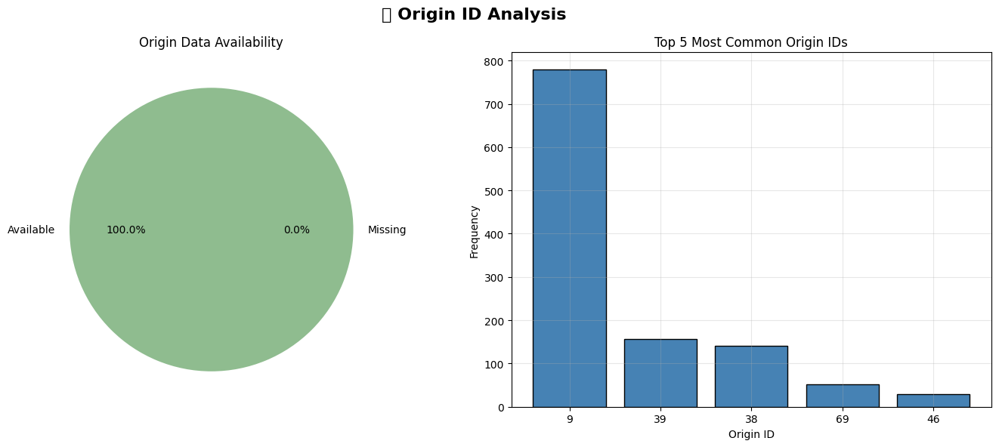

In [199]:
# ------------------ ORIGIN ID ANALYSIS ------------------
origin_data = recipes['origin_id'].dropna()
origin_missing = recipes['origin_id'].isnull().sum()
origin_available = len(origin_data)
top_origins = origin_data.value_counts().head(5)

print(f"\n🌍 ORIGIN ID ANALYSIS")
print(f"{'='*50}")
print(f"   Valid entries: {origin_available:,}")
print(f"   Missing: {origin_missing:,}")
print(f"   Unique origin IDs: {origin_data.nunique():,}")
print(f"   Most common origin: {origin_data.mode().iloc[0] if len(origin_data.mode()) > 0 else 'N/A'}")
print(f"   Top 5 origins: {dict(top_origins)}")

# Setup visualizations
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle("🌍 Origin ID Analysis", fontsize=16, fontweight='bold')

# PIE: Data availability
axes[0].pie([origin_available, origin_missing],
            labels=['Available', 'Missing'],
            autopct='%1.1f%%',
            colors=['#8FBC8F', '#FA8072'])
axes[0].set_title('Origin Data Availability')

# BAR: Top 5 origin_id
axes[1].bar(top_origins.index.astype(str), top_origins.values, color='#4682B4', edgecolor='black')
axes[1].set_title('Top 5 Most Common Origin IDs')
axes[1].set_xlabel('Origin ID')
axes[1].set_ylabel('Frequency')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



📊 AGE RANGE ANALYSIS
   Recipes with both ages: 1,175
   Average age range: 5.1 months
   Median age range: 3.0 months
   Most common range: 3 months

📂 Age Range Distribution:
     0-3 months: 632 (53.8%)
     3-6 months: 48 (4.1%)
     6-12 months: 306 (26.0%)
     12-24 months: 31 (2.6%)
     24+ months: 0 (0.0%)

🔍 Recipes in '3-6 months': 48 found


/tmp/ipython-input-200-242258075.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  recipes_with_age['age_range'] = age_ranges
/tmp/ipython-input-200-242258075.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  recipes_with_age['age_range_category'] = age_range_categories


,name,min_age,max_age
0,Broccoli/Cauliflower Cheese,6.0,12.0
1,Vegetable Fingers,6.0,12.0
2,Beef Casserole,6.0,12.0
3,Toast Fingers,6.0,12.0
4,Pumpkin Polenta Fingers,6.0,12.0
5,Rice Pudding,6.0,12.0
6,Vegetable Slice,6.0,12.0
7,Fruity Tofu,6.0,12.0
8,Pear and Apricot,6.0,12.0
9,Stewed Apple or Pear,6.0,12.0



🔍 Recipes in '6-12 months': 306 found


,name,min_age,max_age
0,Beef Croquettes (Kroket Sapi),12.0,24.0
1,Orange Banana Milk Juice,12.0,24.0
2,Tofu Fritters (Perkedel Tahu),12.0,24.0
3,Tempe Roll (Rolade Tempe),12.0,24.0
4,Shrimp Balls (Bola-Bola Udang),12.0,24.0
...,...,...,...
301,Egg Noodles With Chicken,12.0,24.0
302,Fish Patties,12.0,24.0
303,Honey Scones,12.0,24.0
304,Raisin Chicken Meatballs,12.0,24.0



🔍 Recipes in '12-24 months': 31 found


,name,min_age,max_age
0,Lamb soup for young ones,6.0,24.0
1,Shepherd's pie for kids,6.0,24.0
2,Mustard roast beef,6.0,24.0
3,Toddler meatballs,8.0,24.0
4,Meaty hot pot,6.0,24.0
5,Moroccan diced lamb,6.0,24.0
6,Calzone handfuls,8.0,24.0
7,Iron-rich casserole for babies,6.0,24.0
8,Fish congee,6.0,24.0
9,Casserole lamb,6.0,24.0



📌 Age Range Statistics:
  Min age range: 6 - 12 months
  Max age range: 6 - 24 months
  Most common min age: 6 months
  Most common max age: 24 months

🎯 Age Milestone Analysis:
  Recipes suitable for 6 months: 425 (36.2%)
  Recipes suitable for 9 months: 526 (44.8%)
  Recipes suitable for 12 months: 657 (55.9%)


/tmp/ipython-input-200-242258075.py:102: UserWarning: Glyph 127868 (\N{BABY BOTTLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96])
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127868 (\N{BABY BOTTLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


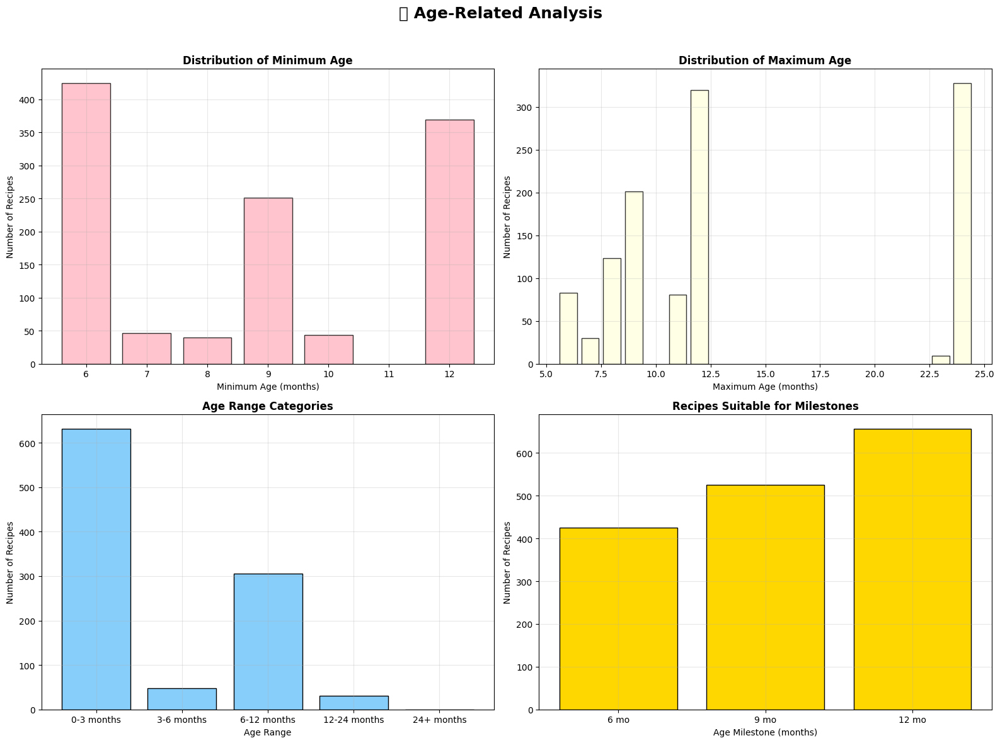

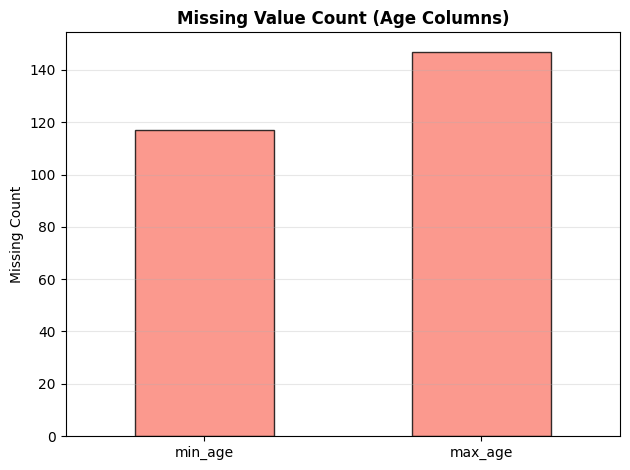

In [200]:
import pandas as pd
import matplotlib.pyplot as plt

recipes_with_age = recipes.dropna(subset=['min_age', 'max_age'])

if len(recipes_with_age) > 0:
    print(f"\n📊 AGE RANGE ANALYSIS")
    print("=" * 50)

    # Compute range and category
    age_ranges = recipes_with_age['max_age'] - recipes_with_age['min_age']
    recipes_with_age['age_range'] = age_ranges

    print(f"   Recipes with both ages: {len(recipes_with_age):,}")
    print(f"   Average age range: {age_ranges.mean():.1f} months")
    print(f"   Median age range: {age_ranges.median():.1f} months")
    print(f"   Most common range: {age_ranges.mode().iloc[0]:.0f} months" if len(age_ranges.mode()) > 0 else "   Most common range: N/A")

    # Age range categories
    age_range_bins = [0, 3, 6, 12, 24, float('inf')]
    age_range_labels = ['0-3 months', '3-6 months', '6-12 months', '12-24 months', '24+ months']
    age_range_categories = pd.cut(age_ranges, bins=age_range_bins, labels=age_range_labels)
    recipes_with_age['age_range_category'] = age_range_categories

    print(f"\n📂 Age Range Distribution:")
    age_range_dist = age_range_categories.value_counts().sort_index()
    for cat, count in age_range_dist.items():
        print(f"     {cat}: {count} ({(count / len(age_ranges) * 100):.1f}%)")

    # Recipes in specific bins
    for target_cat in ['3-6 months', '6-12 months', '12-24 months']:
        filtered = recipes_with_age[recipes_with_age['age_range_category'] == target_cat]
        print(f"\n🔍 Recipes in '{target_cat}': {len(filtered)} found")
        display(filtered[['name', 'min_age', 'max_age']].reset_index(drop=True))

    # Age group counts
    if 'age_group' in recipes_with_age.columns:
        print("\n📊 Recipes by Age Group:")
        age_group_counts = recipes_with_age['age_group'].value_counts()
        for age_group, count in age_group_counts.items():
            percentage = (count / len(recipes_with_age)) * 100
            print(f"  {age_group}: {count} recipes ({percentage:.1f}%)")

    # Age range stats
    print(f"\n📌 Age Range Statistics:")
    print(f"  Min age range: {recipes_with_age['min_age'].min():.0f} - {recipes_with_age['min_age'].max():.0f} months")
    print(f"  Max age range: {recipes_with_age['max_age'].min():.0f} - {recipes_with_age['max_age'].max():.0f} months")
    print(f"  Most common min age: {recipes_with_age['min_age'].mode().iloc[0]:.0f} months")
    print(f"  Most common max age: {recipes_with_age['max_age'].mode().iloc[0]:.0f} months")

    # Milestone check
    print(f"\n🎯 Age Milestone Analysis:")
    milestones = [6, 9, 12]
    milestone_counts = []
    for milestone in milestones:
        suitable = recipes_with_age[
            (recipes_with_age['min_age'] <= milestone) &
            (recipes_with_age['max_age'] >= milestone)
        ]
        count = len(suitable)
        milestone_counts.append(count)
        print(f"  Recipes suitable for {milestone} months: {count} ({count/len(recipes_with_age)*100:.1f}%)")

    # 📊 Visualizations
    fig = plt.figure(figsize=(16, 12))
    fig.suptitle("🍼 Age-Related Analysis", fontsize=18, fontweight='bold')

    # Subplot 1: Min age distribution
    plt.subplot(2, 2, 1)
    min_age_counts = recipes_with_age['min_age'].value_counts().sort_index()
    plt.bar(min_age_counts.index, min_age_counts.values, color='lightpink', edgecolor='black', alpha=0.8)
    plt.title('Distribution of Minimum Age', fontweight='bold')
    plt.xlabel('Minimum Age (months)')
    plt.ylabel('Number of Recipes')
    plt.grid(True, alpha=0.3)

    # Subplot 2: Max age distribution
    plt.subplot(2, 2, 2)
    max_age_counts = recipes_with_age['max_age'].value_counts().sort_index()
    plt.bar(max_age_counts.index, max_age_counts.values, color='lightyellow', edgecolor='black', alpha=0.8)
    plt.title('Distribution of Maximum Age', fontweight='bold')
    plt.xlabel('Maximum Age (months)')
    plt.ylabel('Number of Recipes')
    plt.grid(True, alpha=0.3)

    # Subplot 3: Age range category distribution
    plt.subplot(2, 2, 3)
    plt.bar(age_range_dist.index.astype(str), age_range_dist.values, color='#87CEFA', edgecolor='black')
    plt.title("Age Range Categories", fontweight='bold')
    plt.xlabel("Age Range")
    plt.ylabel("Number of Recipes")
    plt.grid(True, alpha=0.3)

    # Subplot 4: Milestone suitability
    plt.subplot(2, 2, 4)
    plt.bar([f"{m} mo" for m in milestones], milestone_counts, color="#FFD700", edgecolor="black")
    plt.title("Recipes Suitable for Milestones", fontweight='bold')
    plt.xlabel("Age Milestone (months)")
    plt.ylabel("Number of Recipes")
    plt.grid(True, alpha=0.3)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # 📉 Missing data visual
    missing_counts = recipes[['min_age', 'max_age']].isnull().sum()
    missing_counts.plot(kind='bar', color='salmon', edgecolor='black', alpha=0.8)
    plt.title("Missing Value Count (Age Columns)", fontweight='bold')
    plt.ylabel("Missing Count")
    plt.xticks(rotation=0)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()


In [201]:
# =============================================================================
# SUMMARY AND INSIGHTS - RECIPES DATAFRAME ANALYSIS
# =============================================================================

print(f"\n📋 COMPREHENSIVE ANALYSIS SUMMARY - RECIPES DATAFRAME")
print(f"{'='*70}")

# Generate comprehensive insights
insights = []
recommendations = []

# Dataset Overview Insights
total_recipes = len(recipes)
total_missing = recipes.isnull().sum().sum()
completeness_rate = ((total_recipes * len(recipes.columns) - total_missing) / (total_recipes * len(recipes.columns))) * 100

insights.append(f"📊 DATASET OVERVIEW:")
insights.append(f"   • Total recipes: {total_recipes:,}")
insights.append(f"   • Data completeness: {completeness_rate:.1f}%")
insights.append(f"   • Duplicate entries: {recipes.duplicated().sum():,}")

# Age Appropriateness Analysis
age_cols = [col for col in ['min_age_months', 'max_age_months'] if col in recipes.columns]
if age_cols:
    insights.append(f"\n👶 AGE APPROPRIATENESS:")

    for col in age_cols:
        if col in recipes.columns:
            age_data = recipes[col].dropna()
            if len(age_data) > 0:
                insights.append(f"   • {col.replace('_', ' ').title()}: {age_data.min():.0f}-{age_data.max():.0f} months (avg: {age_data.mean():.1f})")

    # Age range analysis
    if len(age_cols) == 2:
        valid_age_recipes = recipes.dropna(subset=age_cols)
        if len(valid_age_recipes) > 0:
            age_ranges = valid_age_recipes['max_age_months'] - valid_age_recipes['min_age_months']
            insights.append(f"   • Average age range: {age_ranges.mean():.1f} months")
            insights.append(f"   • Recipes with age info: {len(valid_age_recipes):,} ({(len(valid_age_recipes)/total_recipes*100):.1f}%)")

            # Developmental stage distribution
            early_stage = (valid_age_recipes['min_age_months'] <= 6).sum()
            intermediate_stage = ((valid_age_recipes['min_age_months'] > 6) & (valid_age_recipes['min_age_months'] <= 12)).sum()
            advanced_stage = (valid_age_recipes['min_age_months'] > 12).sum()

            insights.append(f"   • Early stage (≤6m): {early_stage} recipes ({(early_stage/len(valid_age_recipes)*100):.1f}%)")
            insights.append(f"   • Intermediate (6-12m): {intermediate_stage} recipes ({(intermediate_stage/len(valid_age_recipes)*100):.1f}%)")
            insights.append(f"   • Advanced (>12m): {advanced_stage} recipes ({(advanced_stage/len(valid_age_recipes)*100):.1f}%)")

# Texture Diversity Analysis
if 'texture' in recipes.columns:
    texture_data = recipes['texture'].dropna()
    texture_counts = recipes['texture'].value_counts()

    insights.append(f"\n🍼 TEXTURE ANALYSIS:")
    insights.append(f"   • Total texture categories: {recipes['texture'].nunique()}")
    insights.append(f"   • Recipes with texture info: {len(texture_data):,} ({(len(texture_data)/total_recipes*100):.1f}%)")
    insights.append(f"   • Most common texture: {texture_counts.index[0]} ({texture_counts.iloc[0]} recipes)")

    # Developmental appropriateness
    puree_like = texture_counts.get('puree', 0) + texture_counts.get('smooth', 0)
    soft_textures = sum(texture_counts.get(texture, 0) for texture in ['mashed', 'soft', 'lumpy'])
    finger_foods = sum(texture_counts.get(texture, 0) for texture in ['chunks', 'finger food', 'solid'])

    insights.append(f"   • Early textures (puree/smooth): {puree_like} recipes")
    insights.append(f"   • Intermediate textures (soft/mashed): {soft_textures} recipes")
    insights.append(f"   • Advanced textures (chunks/solid): {finger_foods} recipes")

# Cooking Complexity Analysis
time_cols = [col for col in ['prep_time', 'cook_time'] if col in recipes.columns]
if time_cols:
    insights.append(f"\n🍳 COOKING COMPLEXITY:")

    for col in time_cols:
        if col in recipes.columns:
            time_data = recipes[col].dropna()
            if len(time_data) > 0:
                insights.append(f"   • {col.replace('_', ' ').title()}: avg {time_data.mean():.1f} min (range: {time_data.min():.0f}-{time_data.max():.0f})")

                # Complexity categories
                quick = (time_data <= 15).sum()
                moderate = ((time_data > 15) & (time_data <= 30)).sum()
                complex = (time_data > 30).sum()

                insights.append(f"     - Quick (≤15 min): {quick} recipes ({(quick/len(time_data)*100):.1f}%)")
                insights.append(f"     - Moderate (15-30 min): {moderate} recipes ({(moderate/len(time_data)*100):.1f}%)")
                insights.append(f"     - Complex (>30 min): {complex} recipes ({(complex/len(time_data)*100):.1f}%)")

# Regional Diversity
if 'region' in recipes.columns:
    region_data = recipes['region'].dropna()
    region_counts = recipes['region'].value_counts()

    insights.append(f"\n🌍 REGIONAL DIVERSITY:")
    insights.append(f"   • Total regions: {recipes['region'].nunique()}")
    insights.append(f"   • Recipes with region info: {len(region_data):,} ({(len(region_data)/total_recipes*100):.1f}%)")
    insights.append(f"   • Most represented region: {region_counts.index[0]} ({region_counts.iloc[0]} recipes)")
    insights.append(f"   • Least represented region: {region_counts.index[-1]} ({region_counts.iloc[-1]} recipes)")

    # Regional balance
    top_3_regions = region_counts.head(3).sum()
    insights.append(f"   • Top 3 regions represent: {(top_3_regions/len(region_data)*100):.1f}% of recipes")

# Safety Profile Analysis
safety_cols = [col for col in ['allergen', 'hypoallergenic', 'choking_hazards'] if col in recipes.columns]
if safety_cols:
    insights.append(f"\n🛡️ SAFETY PROFILE:")

    for col in safety_cols:
        if col in recipes.columns:
            if col == 'allergen':
                safe_count = (recipes[col].isnull() | (recipes[col] == '')).sum()
                unsafe_count = total_recipes - safe_count
                insights.append(f"   • Allergen-free recipes: {safe_count:,} ({(safe_count/total_recipes*100):.1f}%)")
                insights.append(f"   • Recipes with allergens: {unsafe_count:,} ({(unsafe_count/total_recipes*100):.1f}%)")

            elif col == 'hypoallergenic':
                hypo_yes = (recipes[col] == True).sum()
                hypo_no = total_recipes - hypo_yes
                insights.append(f"   • Hypoallergenic recipes: {hypo_yes:,} ({(hypo_yes/total_recipes*100):.1f}%)")


# Display all insights
print(f"\n📊 DETAILED INSIGHTS:")
print("=" * 50)
for insight in insights:
    print(insight)

print(f"\n{'='*70}")
print("✅ RECIPES DATAFRAME UNIVARIATE ANALYSIS COMPLETED")
print(f"{'='*70}")


📋 COMPREHENSIVE ANALYSIS SUMMARY - RECIPES DATAFRAME

📊 DETAILED INSIGHTS:
📊 DATASET OVERVIEW:
   • Total recipes: 1,322
   • Data completeness: 79.3%
   • Duplicate entries: 0

🍼 TEXTURE ANALYSIS:
   • Total texture categories: 5
   • Recipes with texture info: 1,322 (100.0%)
   • Most common texture: NONE (822 recipes)
   • Early textures (puree/smooth): 333 recipes
   • Intermediate textures (soft/mashed): 0 recipes
   • Advanced textures (chunks/solid): 0 recipes

🍳 COOKING COMPLEXITY:
   • Prep Time: avg 12.4 min (range: 2-60)
     - Quick (≤15 min): 650 recipes (88.0%)
     - Moderate (15-30 min): 85 recipes (11.5%)
     - Complex (>30 min): 4 recipes (0.5%)
   • Cook Time: avg 22.6 min (range: 0-170)
     - Quick (≤15 min): 236 recipes (31.5%)
     - Moderate (15-30 min): 451 recipes (60.1%)
     - Complex (>30 min): 63 recipes (8.4%)

🛡️ SAFETY PROFILE:
   • Hypoallergenic recipes: 426 (32.2%)

✅ RECIPES DATAFRAME UNIVARIATE ANALYSIS COMPLETED


### 2.8 Final Ingredient DataFrame

In [164]:
final_ingredient = dataframes['final_ingredient_df']
final_ingredient_df = final_ingredient.copy()
print(f"\n=== INGREDIENT DATAFRAME ANALYSIS ===")
print(f"Shape: {final_ingredient_df.shape}")
print(f"Unique ingredient IDs: {final_ingredient_df['pk'].nunique()}")
print(f"Columns: {list(final_ingredient_df.columns)}")


=== INGREDIENT DATAFRAME ANALYSIS ===
Shape: (999, 4)
Unique ingredient IDs: 999
Columns: ['pk', 'name', 'allergen_group_id', 'isAllergen']



pk:
  - Data type: int64
  - Unique values: 999
  - Missing values: 0

name:
  - Data type: object
  - Unique values: 999
  - Missing values: 0
  - Sample values: ['acai', 'agar-agar powder', 'all purpose flour', 'almond', 'almond butter']

allergen_group_id:
  - Data type: float64
  - Unique values: 8
  - Missing values: 761

isAllergen:
  - Data type: bool
  - Unique values: 2
  - Missing values: 0

🍽️ Ingredient Column Identified: name
Number of unique ingredients: 999


/tmp/ipython-input-165-3408793038.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ingredient_counts.values, y=ingredient_counts.index, palette="viridis")


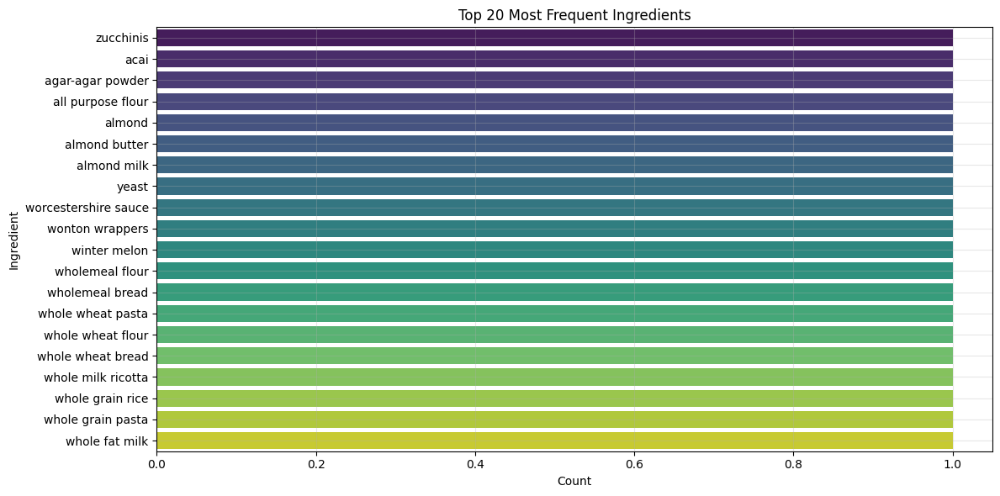

In [165]:
for col in final_ingredient_df.columns:
    print(f"\n{col}:")
    print(f"  - Data type: {final_ingredient_df[col].dtype}")
    print(f"  - Unique values: {final_ingredient_df[col].nunique()}")
    print(f"  - Missing values: {final_ingredient_df[col].isnull().sum()}")

    if final_ingredient_df[col].dtype == 'object':
        sample_vals = final_ingredient_df[col].dropna().unique()[:5]
        print(f"  - Sample values: {sample_vals.tolist()}")

# Identify ingredient column (contains 'ingredient' or 'name')
ingredient_col = None
for col in final_ingredient_df.columns:
    if 'ingredient' in col.lower() or 'name' in col.lower():
        ingredient_col = col
        break

if ingredient_col:
    print(f"\n🍽️ Ingredient Column Identified: {ingredient_col}")
    print(f"Number of unique ingredients: {final_ingredient_df[ingredient_col].nunique()}")

    # Top 20 most frequent ingredients
    ingredient_counts = final_ingredient_df[ingredient_col].value_counts().nlargest(20)

    # Plot bar chart of top ingredients
    plt.figure(figsize=(12, 6))
    sns.barplot(x=ingredient_counts.values, y=ingredient_counts.index, palette="viridis")
    plt.title('Top 20 Most Frequent Ingredients')
    plt.xlabel('Count')
    plt.ylabel('Ingredient')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ No ingredient column found.")

In [166]:
allergen_cols = [col for col in final_ingredient_df.columns if 'allergen_group_id' in col.lower()]
print(f"Allergen-related columns found: {allergen_cols}")

if len(allergen_cols) > 0:
    for col in allergen_cols:
        print(f"\n--- {col} Analysis ---")
        value_counts = final_ingredient_df[col].value_counts(dropna=False)
        print("Distribution:")
        for value, count in value_counts.items():
            percentage = (count / len(final_ingredient_df)) * 100
            print(f"  {value}: {count} ({percentage:.1f}%)")
else:
    print("No explicit allergen columns found. Analyzing all columns for potential allergen information...")

Allergen-related columns found: ['allergen_group_id']

--- allergen_group_id Analysis ---
Distribution:
  nan: 761 (76.2%)
  8.0: 70 (7.0%)
  1.0: 63 (6.3%)
  6.0: 43 (4.3%)
  3.0: 19 (1.9%)
  4.0: 14 (1.4%)
  2.0: 14 (1.4%)
  7.0: 12 (1.2%)
  5.0: 3 (0.3%)


In [167]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Missing value report ---
missing_data = final_ingredient_df.isnull().sum()
print("Missing Values:")
for col, missing in missing_data.items():
    percentage = (missing / len(final_ingredient_df)) * 100
    print(f"   {col}: {missing:,} ({percentage:.2f}%)")

# --- 2. Duplicates and completeness ---
duplicates = final_ingredient_df.duplicated().sum()
print(f"\nDuplicate Rows: {duplicates:,}")
print(f"Total Null Values: {missing_data.sum():,}")
print(f"Data Completeness: {((1 - missing_data.sum() / (len(final_ingredient_df) * len(final_ingredient_df.columns))) * 100):.1f}%")

# --- 3. Distribution of allergen_group_id ---
value_counts = final_ingredient_df['allergen_group_id'].value_counts(dropna=False)
print("\nDistribution:")
for value, count in value_counts.items():
    percentage = (count / len(final_ingredient_df)) * 100
    print(f"  {value}: {count} ({percentage:.1f}%)")

# --- 4. Check: Missing allergen_group_id and is_allergen ---
if 'isAllergen' in final_ingredient_df.columns:
    condition = final_ingredient_df['allergen_group_id'].isnull()
    null_allergen_rows = final_ingredient_df[condition]
    null_is_allergen_count = null_allergen_rows['isAllergen'].isnull().sum()
    print(f"\n❓ Rows with missing allergen_group_id: {condition.sum():,}")
    print(f"   └─ of which isAllergen is also null: {null_is_allergen_count:,}")
else:
    print("⚠️ 'is_allergen' column not found.")

Missing Values:
   pk: 0 (0.00%)
   name: 0 (0.00%)
   allergen_group_id: 761 (76.18%)
   isAllergen: 0 (0.00%)

Duplicate Rows: 0
Total Null Values: 761
Data Completeness: 81.0%

Distribution:
  nan: 761 (76.2%)
  8.0: 70 (7.0%)
  1.0: 63 (6.3%)
  6.0: 43 (4.3%)
  3.0: 19 (1.9%)
  4.0: 14 (1.4%)
  2.0: 14 (1.4%)
  7.0: 12 (1.2%)
  5.0: 3 (0.3%)

❓ Rows with missing allergen_group_id: 761
   └─ of which isAllergen is also null: 0


/tmp/ipython-input-168-1615623639.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.index.astype(str), y=value_counts.values, palette="mako")
/tmp/ipython-input-168-1615623639.py:15: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


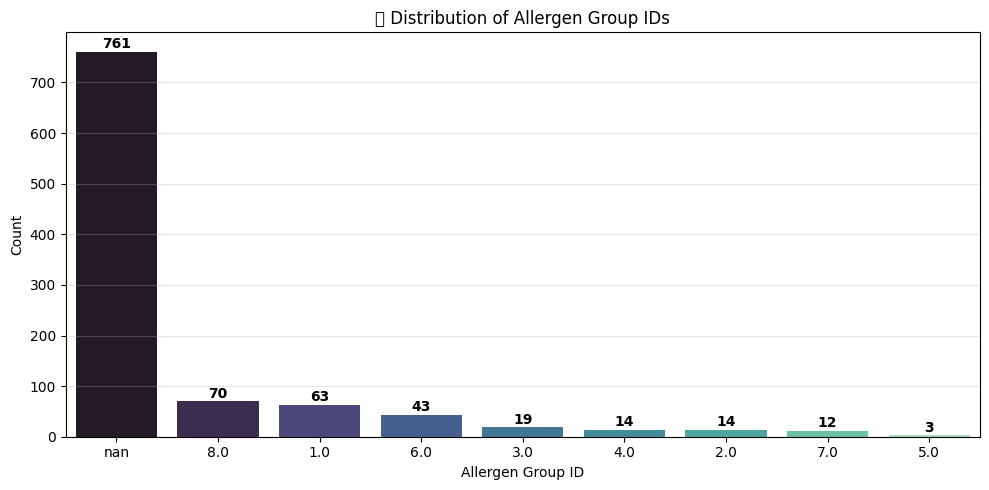

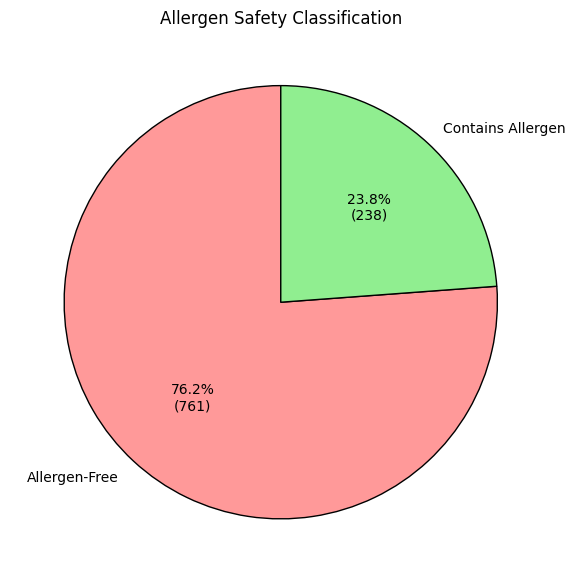

In [168]:
# --- Distribution of allergen_group_id ---
value_counts = final_ingredient_df['allergen_group_id'].value_counts(dropna=False)

plt.figure(figsize=(10, 5))
ax = sns.barplot(x=value_counts.index.astype(str), y=value_counts.values, palette="mako")
plt.title("📊 Distribution of Allergen Group IDs")
plt.xlabel("Allergen Group ID")
plt.ylabel("Count")
plt.grid(axis='y', alpha=0.3)

# Add count labels on top of bars
for i, (x, y) in enumerate(zip(value_counts.index.astype(str), value_counts.values)):
    ax.text(i, y + 1, str(y), ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

# --- Pie chart for isAllergen ---
if 'isAllergen' in final_ingredient_df.columns:
    isAllergen_counts = final_ingredient_df['isAllergen'].value_counts(dropna=False)

    # Mapping of original values to descriptive labels
    label_map = {
        True: "Contains Allergen",
        False: "Allergen-Free",
        pd.NA: "Unknown",
        None: "Unknown",
        float('nan'): "Unknown",
        np.nan: "Unknown"
    }

    # Create cleaned labels
    labels = [label_map.get(val, str(val)) for val in isAllergen_counts.index]

    def make_autopct(values):
        def _autopct(pct):
            count = int(round(pct * sum(values) / 100.0))
            return f'{pct:.1f}%\n({count})'
        return _autopct

    plt.figure(figsize=(6, 6))
    plt.pie(
        isAllergen_counts.values,
        labels=labels,
        autopct=make_autopct(isAllergen_counts.values),
        colors=['#ff9999', '#90ee90', '#d3d3d3'],  # Customize colors
        startangle=90,
        wedgeprops={'edgecolor': 'black'}
    )
    plt.title("Allergen Safety Classification")
    plt.tight_layout()
    plt.show()
else:
    print("'isAllergen' column not found for pie chart.")


In [169]:
# =============================================================================
# SUMMARY AND INSIGHTS - FINAL INGREDIENT DATAFRAME ANALYSIS
# =============================================================================

print(f"\n📋 COMPREHENSIVE ANALYSIS SUMMARY - FINAL INGREDIENT DATAFRAME")
print(f"{'='*60}")

# Generate comprehensive insights
insights = []
recommendations = []

# Dataset Overview Insights
total_ingredients = len(final_ingredient_df)
total_missing = final_ingredient_df.isnull().sum().sum()
completeness_rate = ((total_ingredients * len(final_ingredient_df.columns) - total_missing) / (total_ingredients * len(final_ingredient_df.columns))) * 100

insights.append(f"📊 DATASET OVERVIEW:")
insights.append(f"   • Total unique ingredients: {total_ingredients:,}")
insights.append(f"   • Data completeness: {completeness_rate:.1f}%")
insights.append(f"   • Duplicate entries: {final_ingredient_df.duplicated().sum():,}")

# Ingredient Name Analysis
primary_name_col = None
for col in final_ingredient_df.columns:
    if 'name' in col.lower() and final_ingredient_df[col].dtype == 'object':
        primary_name_col = col
        break

if primary_name_col and primary_name_col in final_ingredient_df.columns:
    ingredient_names = final_ingredient_df[primary_name_col].dropna()
    insights.append(f"\n🏷️ INGREDIENT NAMES:")
    insights.append(f"   • Unique names: {ingredient_names.nunique():,}")
    if len(ingredient_names) > 0:
        top_ingredients = ingredient_names.value_counts().head(5)
        insights.append(f"   • Top 5 most frequent: {dict(top_ingredients)}")

# Nutritional Profile Analysis
nutrition_cols = [col for col in final_ingredient_df.columns if any(nutrient in col.lower()
                   for nutrient in ['protein', 'carb', 'fat', 'energy', 'calor', 'vitamin', 'mineral'])]
if nutrition_cols:
    insights.append(f"\n🍎 NUTRITIONAL PROFILE:")
    for col in nutrition_cols[:3]: # Summarize first 3 nutrition columns
        if col in final_ingredient_df.columns:
            nutrition_data = final_ingredient_df[col].dropna()
            if len(nutrition_data) > 0:
                 insights.append(f"   • {col.replace('_', ' ').title()}: Avg={nutrition_data.mean():.1f}, Median={nutrition_data.median():.1f}")
            else:
                insights.append(f"   • {col.replace('_', ' ').title()}: No data")

# Usage and Frequency Analysis (Requires recipe_ingredient dataframe)
if 'recipe_ingredient' in dataframes:
    recipe_ingredient = dataframes['recipe_ingredient']
    ingredient_usage = recipe_ingredient.groupby('ingredient_id').size().reset_index(name='recipe_count')
    ingredient_usage_merged = final_ingredient_df.merge(ingredient_usage, left_on='pk', right_on='ingredient_id', how='left')
    ingredient_usage_merged['recipe_count'] = ingredient_usage_merged['recipe_count'].fillna(0)

    insights.append(f"\n📈 USAGE AND FREQUENCY:")
    if len(ingredient_usage_merged) > 0:
        avg_usage = ingredient_usage_merged['recipe_count'].mean()
        max_usage = ingredient_usage_merged['recipe_count'].max()
        most_used_ingredient_id = ingredient_usage_merged.loc[ingredient_usage_merged['recipe_count'].idxmax(), 'pk']
        most_used_ingredient_name = ingredient_usage_merged.loc[ingredient_usage_merged['recipe_count'].idxmax(), primary_name_col] if primary_name_col else 'Unknown'

        insights.append(f"   • Average recipes per ingredient: {avg_usage:.1f}")
        insights.append(f"   • Most used ingredient: '{most_used_ingredient_name}' (ID: {most_used_ingredient_id}) in {max_usage:.0f} recipes")

# Safety and Allergen Analysis
safety_cols = [col for col in final_ingredient_df.columns if any(safety in col.lower()
                for safety in ['allergen', 'allergy', 'safe', 'hypo'])]
if safety_cols:
    insights.append(f"\n🛡️ SAFETY AND ALLERGENS:")
    for col in safety_cols:
        if col in final_ingredient_df.columns:
            safety_data = final_ingredient_df[col].dropna()
            if len(safety_data) > 0:
                if final_ingredient_df[col].dtype == 'bool':
                    allergen_count = final_ingredient_df[col].sum()
                    non_allergen_count = len(final_ingredient_df) - allergen_count
                    insights.append(f"   • Allergenic ingredients ({col}): {allergen_count:,} ({allergen_count/len(final_ingredient_df)*100:.1f}%)")
                elif final_ingredient_df[col].nunique() < 15:
                     value_counts = final_ingredient_df[col].value_counts(dropna=False)
                     insights.append(f"   • {col.replace('_', ' ').title()} Distribution:")
                     for value, count in value_counts.items():
                         percentage = (count / len(final_ingredient_df)) * 100
                         insights.append(f"     - {value}: {count} ({percentage:.1f}%)")

# Display all insights
print(f"\n📊 DETAILED INSIGHTS:")
print("=" * 50)
for insight in insights:
    print(insight)




📋 COMPREHENSIVE ANALYSIS SUMMARY - FINAL INGREDIENT DATAFRAME

📊 DETAILED INSIGHTS:
📊 DATASET OVERVIEW:
   • Total unique ingredients: 999
   • Data completeness: 81.0%
   • Duplicate entries: 0

🏷️ INGREDIENT NAMES:
   • Unique names: 999
   • Top 5 most frequent: {'zucchinis': np.int64(1), 'acai': np.int64(1), 'agar-agar powder': np.int64(1), 'all purpose flour': np.int64(1), 'almond': np.int64(1)}

📈 USAGE AND FREQUENCY:
   • Average recipes per ingredient: 8.2
   • Most used ingredient: 'water' (ID: 940) in 355 recipes

🛡️ SAFETY AND ALLERGENS:
   • Allergen Group Id Distribution:
     - nan: 761 (76.2%)
     - 8.0: 70 (7.0%)
     - 1.0: 63 (6.3%)
     - 6.0: 43 (4.3%)
     - 3.0: 19 (1.9%)
     - 4.0: 14 (1.4%)
     - 2.0: 14 (1.4%)
     - 7.0: 12 (1.2%)
     - 5.0: 3 (0.3%)
   • Allergenic ingredients (isAllergen): 238 (23.8%)


### **Observation**

Even though the allergen_group_id is NULL, but the isAllergen is not null, therefore suggesting the value is not alleregen

## 3.0 Bivariate Analysis

#### 3.1 Main Analysis (In-Depth) - Combining Necessary Column

##### 3.1 Ingredient x Allergen

In [ ]:
allergen_df = dataframes['allergen']
final_ingredient_df = dataframes['final_ingredient_df']
display(allergen_df.columns.to_list())
display(final_ingredient_df.columns.to_list())

['pk', 'name', 'description']

['pk', 'name', 'allergen_group_id', 'isAllergen']

In [ ]:
# Merge allergen and final_ingredient_df on allergen_group_id (pk of allergen table)
merged_df = final_ingredient_df.merge(allergen_df, left_on='allergen_group_id', right_on='pk', how='left')
display(merged_df.head())

#renaming
ingredient_allergen_merged_df = merged_df.rename(columns={
    'pk_x': 'ingredient_pk',
    'name_x': 'ingredient_name',
    'pk_y': 'allergen_pk',
    'name_y': 'allergen_name',
    'description': 'allergen_description'
})

# Drop the 'allergen_pk' (which was originally 'pk_y')
ingredient_allergen_merged_df = ingredient_allergen_merged_df.drop(columns=['allergen_pk'])

# Display the updated DataFrame
print(ingredient_allergen_merged_df.head())

,pk_x,name_x,allergen_group_id,isAllergen,pk_y,name_y,description
0,1,acai,NaN,False,NaN,NaN,NaN
1,2,agar-agar powder,NaN,False,NaN,NaN,NaN
2,3,all purpose flour,8.0,True,8.0,gluten,Gluten comes from wheat/barley/rye. Celiac risk.
3,4,almond,NaN,False,NaN,NaN,NaN
4,5,almond butter,4.0,True,4.0,tree_nuts,Tree nuts are a top allergen. Avoid early intr...


   ingredient_pk    ingredient_name  allergen_group_id  isAllergen  \
0              1               acai                NaN       False   
1              2   agar-agar powder                NaN       False   
2              3  all purpose flour                8.0        True   
3              4             almond                NaN       False   
4              5      almond butter                4.0        True   

  allergen_name                               allergen_description  
0           NaN                                                NaN  
1           NaN                                                NaN  
2        gluten   Gluten comes from wheat/barley/rye. Celiac risk.  
3           NaN                                                NaN  
4     tree_nuts  Tree nuts are a top allergen. Avoid early intr...  


Ingredient Count per Allergen Group:
  allergen_name  ingredient_count
3        gluten                70
0         dairy                63
2          fish                43
6           soy                19
1           egg                14
7     tree_nuts                14
5     shellfish                12
4       peanuts                 3


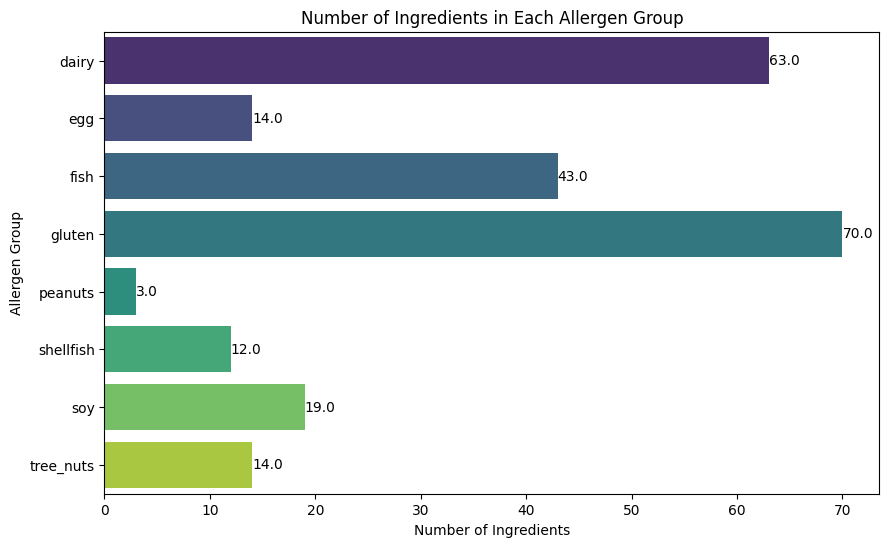

In [ ]:
# Count how many ingredients are associated with each allergen
allergen_count = ingredient_allergen_merged_df.groupby('allergen_name')['ingredient_pk'].count().reset_index(name='ingredient_count')
print("Ingredient Count per Allergen Group:")
print(allergen_count.sort_values(by='ingredient_count', ascending=False).head(10))

# Step 3: Visualize the allergen group count using a bar plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='ingredient_count', y='allergen_name', data=allergen_count, palette='viridis')

# Annotate each bar with the count value
for p in ax.patches:
    ax.annotate(f'{p.get_width()}',
                (p.get_width(), p.get_y() + p.get_height() / 2),
                ha='left', va='center',
                fontsize=10, color='black')

plt.title('Number of Ingredients in Each Allergen Group')
plt.xlabel('Number of Ingredients')
plt.ylabel('Allergen Group')
plt.show()


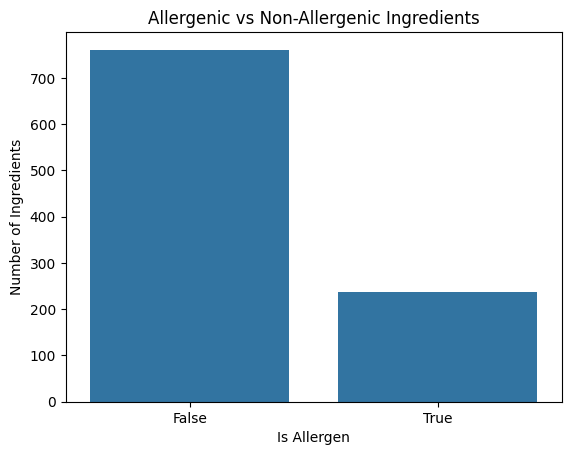

In [ ]:
# Group by 'isAllergen' and count the ingredients
allergen_status_count = ingredient_allergen_merged_df.groupby('isAllergen')['ingredient_name'].count().reset_index(name='ingredient_count')

# Visualize the count of allergenic vs non-allergenic ingredients
sns.barplot(x='isAllergen', y='ingredient_count', data=allergen_status_count)
plt.title('Allergenic vs Non-Allergenic Ingredients')
plt.xlabel('Is Allergen')
plt.ylabel('Number of Ingredients')
plt.show()

##### 3.2 recipe_ingredient x final_ingredient_df

In [ ]:
recipe_ingredient = dataframes['recipe_ingredient']
final_ingredient_df = dataframes['final_ingredient_df']
display("recipe_ingredient: ", recipe_ingredient.columns.to_list() )
display("final_ingredietn: ", final_ingredient_df.columns.to_list())

'recipe_ingredient: '

['recipe_id', 'ingredient_id']

'final_ingredietn: '

['pk', 'name', 'allergen_group_id', 'isAllergen']

In [ ]:
# Join `recipe_ingredient` with `final_ingredient_df` on ingredient_id (pk)
merged_df = recipe_ingredient.merge(dataframes['final_ingredient_df'], left_on='ingredient_id', right_on='pk')

# Display first few rows to inspect the merged data
print(merged_df.head())


   recipe_id  ingredient_id   pk           name  allergen_group_id  isAllergen
0          1            155  155        cassava                NaN       False
1          1            332  332           fish                6.0        True
2          1            182  182        chicken                NaN       False
3          1            232  232    coconut oil                NaN       False
4          1            185  185  chicken broth                NaN       False


Number of recipes with allergens: 911
Number of recipes without allergens/free from allergen: 1316


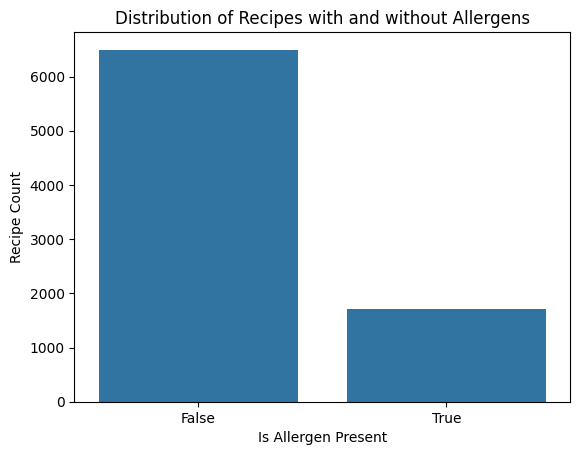

In [ ]:
# Count how many recipes have allergens
allergen_recipes = merged_df[merged_df['isAllergen'] == True]
non_allergen_recipes = merged_df[merged_df['isAllergen'] == False]

# Count the number of recipes with and without allergens
print("Number of recipes with allergens:", allergen_recipes['recipe_id'].nunique())
print("Number of recipes without allergens/free from allergen:", non_allergen_recipes['recipe_id'].nunique())

# Optional: Visualize the distribution of recipes with and without allergens
sns.countplot(x='isAllergen', data=merged_df)
plt.title('Distribution of Recipes with and without Allergens')
plt.xlabel('Is Allergen Present')
plt.ylabel('Recipe Count')
plt.show()


   recipe_id  ingredient_id
0          1              7
1          2             10
2          3              6
3          4              3
4          5             10


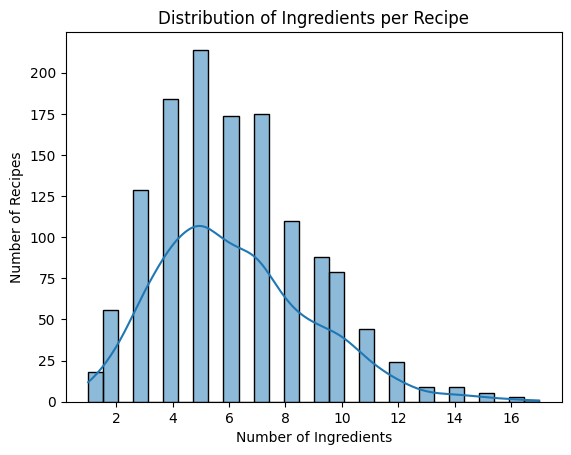

In [ ]:
# Count how many ingredients each recipe has (based on recipe_id)
ingredient_count_per_recipe = merged_df.groupby('recipe_id')['ingredient_id'].count().reset_index()

# Display the first few rows
print(ingredient_count_per_recipe.head())

# Visualize the distribution of ingredient counts across recipes
sns.histplot(ingredient_count_per_recipe['ingredient_id'], kde=True, bins=30)
plt.title('Distribution of Ingredients per Recipe')
plt.xlabel('Number of Ingredients')
plt.ylabel('Number of Recipes')
plt.show()


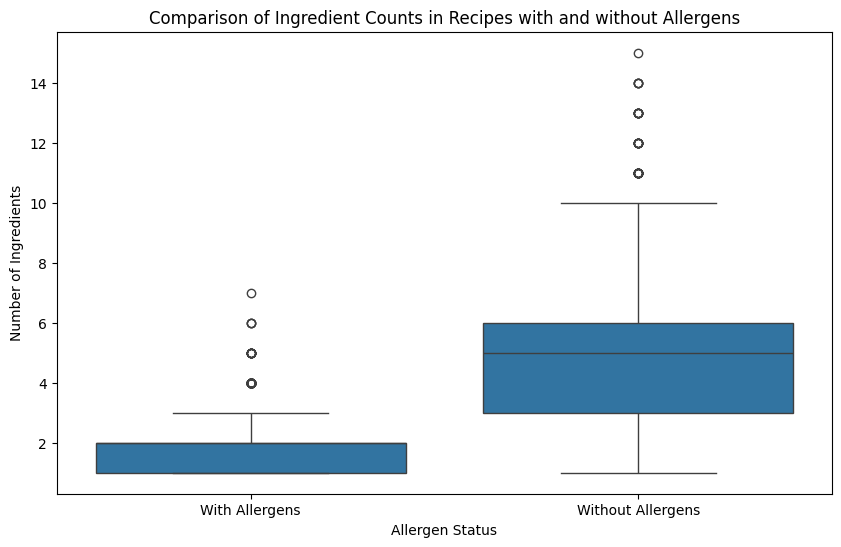

In [ ]:
# 1. Combine the allergen and non-allergen counts into one DataFrame
allergen_count = allergen_recipes.groupby('recipe_id')['ingredient_id'].count().reset_index(name='ingredient_count')
non_allergen_count = non_allergen_recipes.groupby('recipe_id')['ingredient_id'].count().reset_index(name='ingredient_count')

# Add a column to differentiate between allergen and non-allergen
allergen_count['allergen_status'] = 'With Allergens'
non_allergen_count['allergen_status'] = 'Without Allergens'

# Combine the two DataFrames
combined_counts = pd.concat([allergen_count, non_allergen_count])

# 2. Visualize the comparison using boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='allergen_status', y='ingredient_count', data=combined_counts)
plt.title('Comparison of Ingredient Counts in Recipes with and without Allergens')
plt.xlabel('Allergen Status')
plt.ylabel('Number of Ingredients')
plt.show()


Number of recipes with allergenic ingredients: 911
Most common allergens in recipes:
name
egg               212
cheese            114
milk               88
tofu               85
butter             83
flour              78
coconut milk       69
rice flour         62
cheddar cheese     45
egg yolk           44
Name: count, dtype: int64


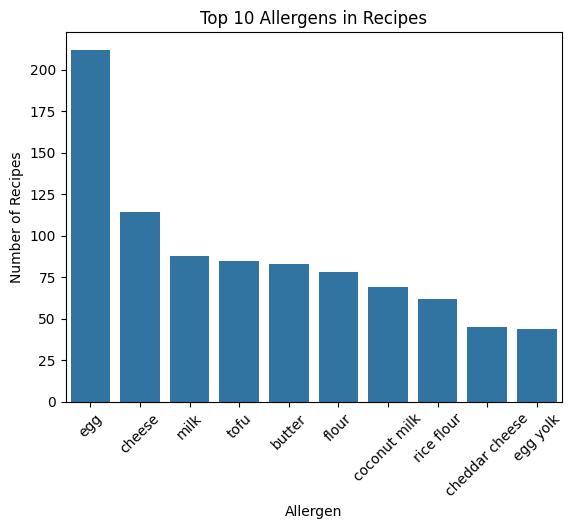

In [ ]:
# Filter recipes with allergenic ingredients
allergenic_recipes = merged_df[merged_df['isAllergen'] == True]

# Count the number of recipes that contain allergens
allergenic_recipe_count = allergenic_recipes['recipe_id'].nunique()
print(f"Number of recipes with allergenic ingredients: {allergenic_recipe_count}")

# Analyze the most common allergens
allergen_counts = allergenic_recipes['name'].value_counts()
print("Most common allergens in recipes:")
print(allergen_counts.head(10))

# Visualize the allergen distribution across recipes (Top 10 only)
top_10_allergens = allergen_counts.head(10)
sns.barplot(x=top_10_allergens.index, y=top_10_allergens.values)
plt.title('Top 10 Allergens in Recipes')
plt.xlabel('Allergen')
plt.ylabel('Number of Recipes')
plt.xticks(rotation=45)
plt.show()


### 3.2 Bivariate Analysis: Missingness vs. Other Features

#### 3.2.1 Setting Up

In [202]:
recipes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1322 entries, 0 to 1321
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1322 non-null   object 
 1   ingredients        1322 non-null   object 
 2   instructions       1322 non-null   object 
 3   min_age            1205 non-null   float64
 4   max_age            1175 non-null   float64
 5   texture            1322 non-null   object 
 6   prep_time          739 non-null    float64
 7   cook_time          750 non-null    float64
 8   serving            1176 non-null   float64
 9   recipe_link        1322 non-null   object 
 10  credibility        538 non-null    object 
 11  image_link         43 non-null     object 
 12  difficulty         1322 non-null   object 
 13  meal_type          337 non-null    object 
 14  description        132 non-null    object 
 15  tips               24 non-null     object 
 16  hypoallergenic     1322 

In [408]:
recipes['prep_time_missing'] = recipes['prep_time'].isna().astype(int)
recipes['cook_time_missing'] = recipes['cook_time'].isna().astype(int)
recipes['meal_type_missing'] = recipes['meal_type'].apply(lambda x: 0 if pd.isna(x) or str(x).strip().upper() == 'UNKNOWN' else 1)
recipes['texture_missing'] = recipes['texture'].apply(lambda x: 0 if pd.isna(x) or str(x).strip().upper() == 'NONE' or str(x).strip().upper() == 'UNKNOWN' else 1)
recipes['min_age_missing'] = recipes['min_age'].isna().astype(int)
recipes['max_age_missing'] = recipes['max_age'].isna().astype(int)

recipes

,name,ingredients,instructions,min_age,max_age,texture,prep_time,cook_time,serving,recipe_link,...,min_age_missing,max_age_missing,num_ingredients_x,num_instructions,difficulty_encoded,texture_encoded,meal_type_encoded,meal_type_mapped,meal_type_mapped_encoded,num_ingredients_y
0,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,Unknown,15.0,45.0,1.0,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,...,0,0,7,5,2,0,9,unknown,4,7
1,Bitterballs (Bitterballen),- 100 g beef mince \n- 30 g potato starch \n- ...,1. Stir-fry blended spices until fragrant. \n2...,9.0,11.0,family food,30.0,30.0,10.0,pdfcoffee.com_mommyclopedia-78-resep-mpasi-pdf...,...,0,0,10,7,1,1,8,snack,3,10
2,Broccoli/Cauliflower Cheese,"- 175g cauliflower/broccoli, cut into pieces\n...","1. Steam, boil, or microwave cauliflower/brocc...",6.0,12.0,Unknown,10.0,20.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,0,6,6,2,0,9,unknown,4,6
3,Vegetable Fingers,"- 1 carrot, potato, or sweet potato, peeled an...",1. Steam or microwave vegetables until tender....,6.0,12.0,Unknown,5.0,10.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,0,3,2,0,0,9,unknown,4,3
4,Beef Casserole,"- 1 onion, peeled and finely chopped\n- 1½ tab...",1. Preheat oven to 180°C.\n2. Heat oil in a me...,6.0,12.0,family food,10.0,2.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,0,10,4,2,1,9,unknown,4,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1317,Baby breakfast acai bowl,- 50 g berries (you can use a mix of frozen be...,1. Blend all ingredients together and make sur...,6.0,12.0,puree,NaN,NaN,NaN,https://chipeafood.com/recipes/baby-breakfast-...,...,0,0,6,2,2,3,9,unknown,4,6
1318,Savoury Toastie,"- 3 small mushrooms, finely chopped\n- ½ cup b...",1. Microwave mushrooms on high for 30 seconds ...,12.0,12.0,Unknown,5.0,15.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,0,6,3,2,0,9,unknown,4,6
1319,Tuna Mornay,- 1 cup pasta\n- 1 tablespoon margarine\n- 1 t...,1. Preheat oven to 180°C.\n2. Cook pasta as pe...,12.0,12.0,Unknown,10.0,30.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,0,8,5,2,0,9,unknown,4,8
1320,Fruit Muffins,- ¼ cup sugar\n- 1 cup milk\n- 1 egg\n- 2 tabl...,1. Preheat oven to 180°C and grease a 12-hole ...,12.0,12.0,Unknown,10.0,25.0,12.0,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,0,7,4,2,0,9,unknown,4,7


In [409]:
recipes[['texture_missing', 'texture']]

,texture_missing,texture
0,0,Unknown
1,1,family food
2,0,Unknown
3,0,Unknown
4,1,family food
...,...,...
1317,1,puree
1318,0,Unknown
1319,0,Unknown
1320,0,Unknown


#### 3.2.2 Compare Missingness vs. Category

In [410]:
from scipy.stats import chi2_contingency

category = dataframes['category']
joined_cat = recipes.merge(recipe_category_df, on='recipe_id', how='left').merge(category, left_on='category_id', right_on='pk', how='left')

joined_cat = joined_cat.rename(columns={
    'name_x': 'recipe_name',
    'name_y': 'category_name',
    'description_x': 'recipe_description',
    'description_y': 'category_description'
})

joined_cat
joined_cat.columns.to_list()


['recipe_name',
 'ingredients',
 'instructions',
 'min_age',
 'max_age',
 'texture',
 'prep_time',
 'cook_time',
 'serving',
 'recipe_link',
 'credibility',
 'image_link',
 'difficulty',
 'meal_type',
 'recipe_description',
 'tips',
 'hypoallergenic',
 'origin_id',
 'choking_hazards',
 'recipe_id',
 'prep_time_missing',
 'cook_time_missing',
 'meal_type_missing',
 'texture_missing',
 'min_age_missing',
 'max_age_missing',
 'num_ingredients_x',
 'num_instructions',
 'difficulty_encoded',
 'texture_encoded',
 'meal_type_encoded',
 'meal_type_mapped',
 'meal_type_mapped_encoded',
 'num_ingredients_y',
 'category_id',
 'pk',
 'category_name',
 'category_description']


Chi-square p-value (category vs. prep_time_missing): 0.007124832139876082


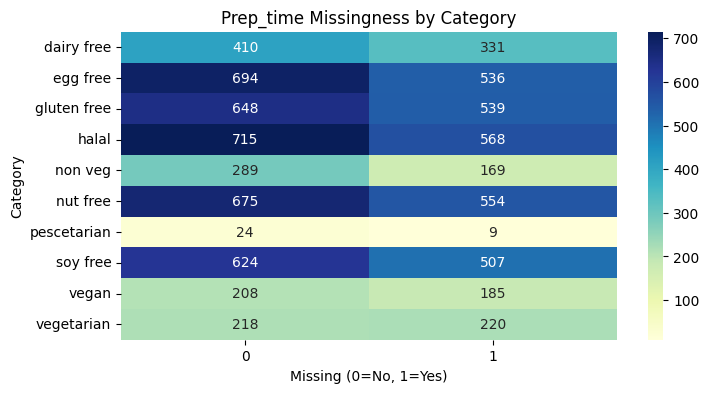


Chi-square p-value (category vs. cook_time_missing): 0.004521531044268564


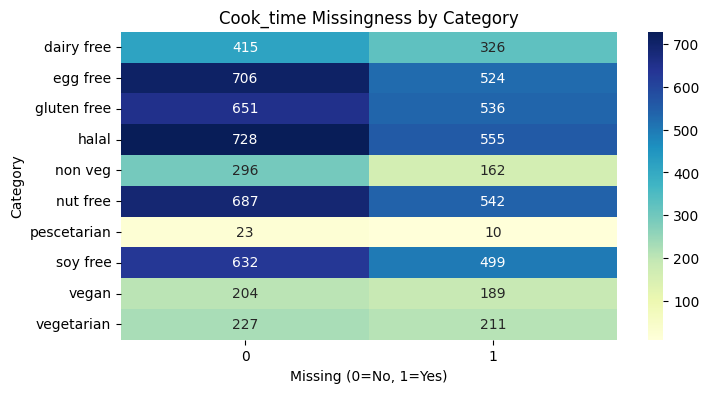


Chi-square p-value (category vs. meal_type_missing): 3.7884565908155235e-05


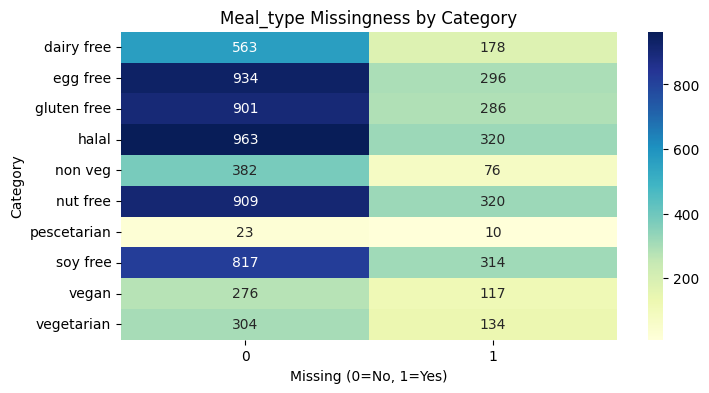


Chi-square p-value (category vs. texture_missing): 0.780957205888622


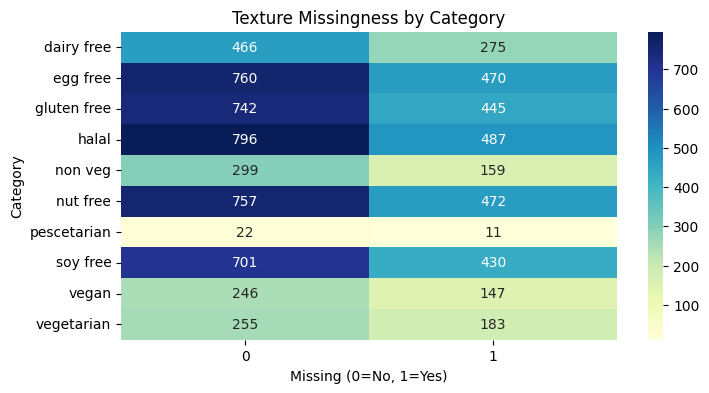


Chi-square p-value (category vs. min_age_missing): 0.000306496860903999


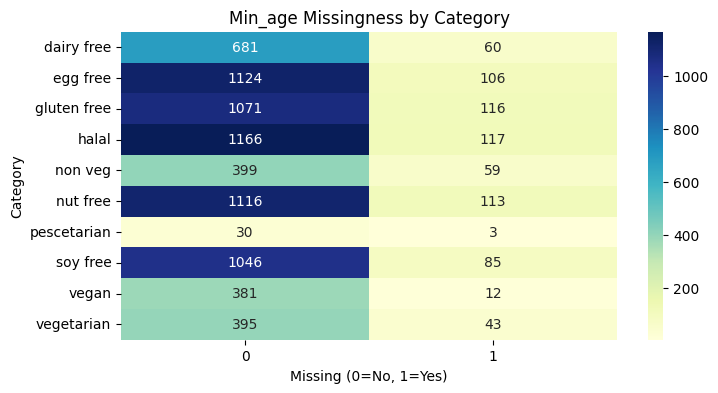


Chi-square p-value (category vs. max_age_missing): 0.06894151180097802


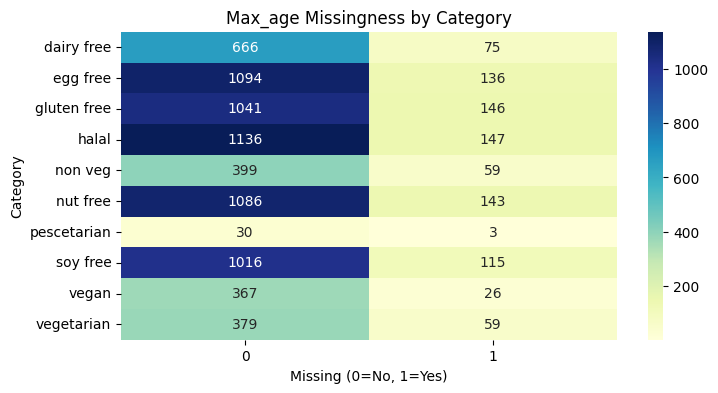

In [411]:
for col in ['prep_time', 'cook_time', 'meal_type', 'texture', 'min_age', 'max_age']:
    ct = pd.crosstab(joined_cat['category_name'], joined_cat[f'{col}_missing'])
    chi2, p, dof, expected = chi2_contingency(ct)
    print(f"\nChi-square p-value (category vs. {col}_missing):", p)
    plt.figure(figsize=(8,4))
    sns.heatmap(ct, annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f'{col.capitalize()} Missingness by Category')
    plt.ylabel('Category')
    plt.xlabel('Missing (0=No, 1=Yes)')
    plt.show()

#### 3.3.3 Compare Missingness vs **MealType**


Chi-square p-value (meal_type vs. prep_time_missing): 4.475229949714499e-64


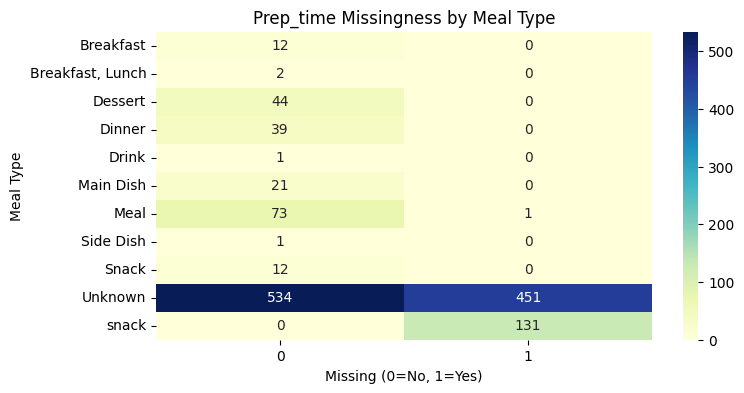


Chi-square p-value (meal_type vs. cook_time_missing): 3.3370066893435623e-53


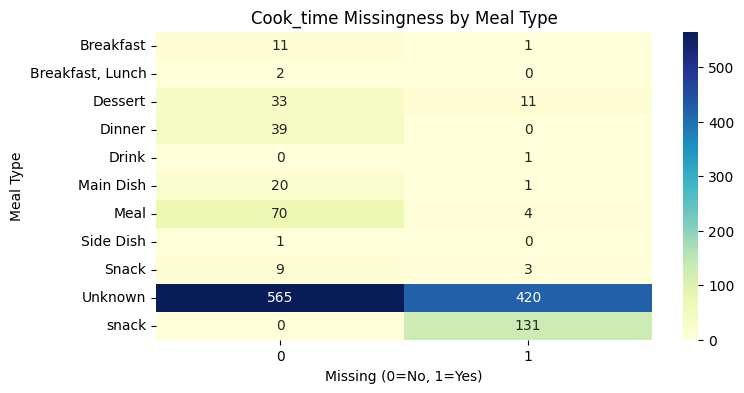


Chi-square p-value (meal_type vs. texture_missing): 1.755253740389478e-05


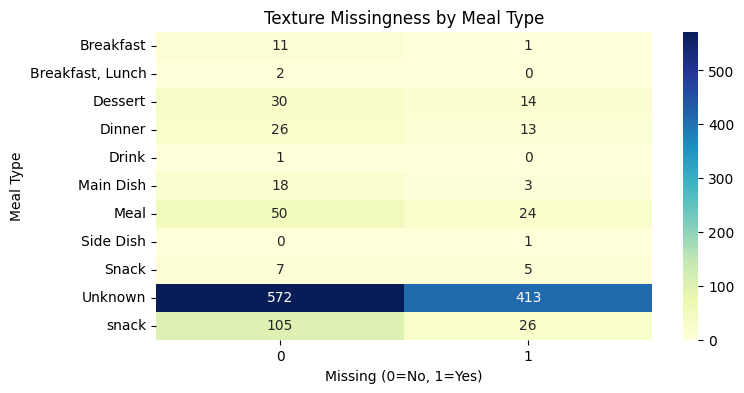


Chi-square p-value (meal_type vs. min_age_missing): 3.407840411267649e-06


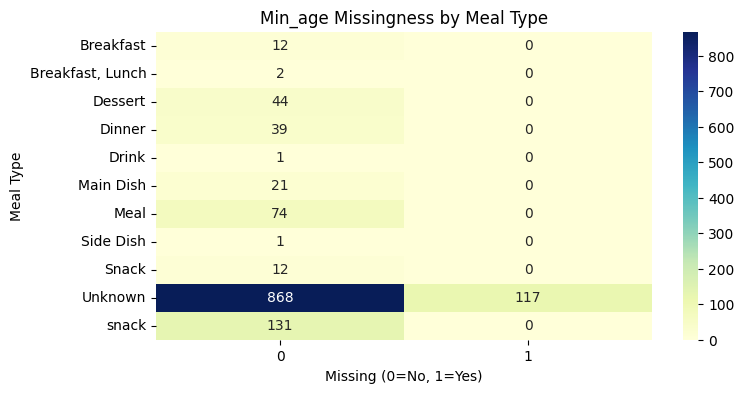


Chi-square p-value (meal_type vs. max_age_missing): 1.5945078639758198e-08


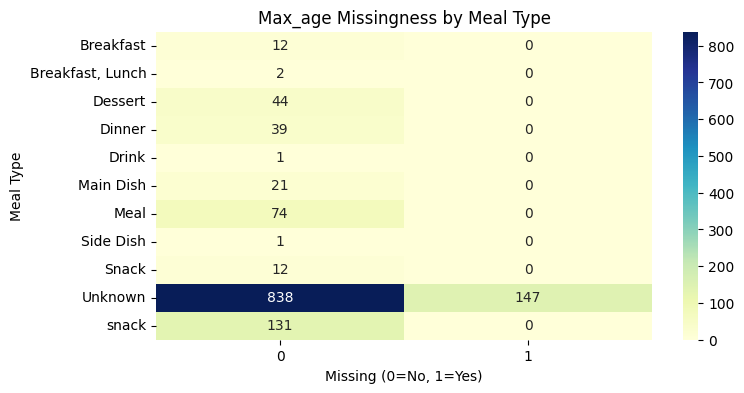

In [412]:
for col in ['prep_time', 'cook_time', 'texture', 'min_age', 'max_age']:
    ct = pd.crosstab(recipes['meal_type'], recipes[f'{col}_missing'])
    chi2, p, dof, expected = chi2_contingency(ct)
    print(f"\nChi-square p-value (meal_type vs. {col}_missing):", p)
    plt.figure(figsize=(8,4))
    sns.heatmap(ct, annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f'{col.capitalize()} Missingness by Meal Type')
    plt.ylabel('Meal Type')
    plt.xlabel('Missing (0=No, 1=Yes)')
    plt.show()


| Variable            | p-value | Interpretation                                 |
|---------------------|---------|------------------------------------------------|
| prep_time_missing   | 0.0071  | Significant — missingness depends on category  |
| cook_time_missing   | 0.0045  | Significant — missingness depends on category  |
| meal_type_missing   | 0.00004 | Significant — missingness depends on category  |
| texture_missing     | 1.0     | Not significant — missingness is random        |
| min_age_missing     | 0.00031 | Significant — missingness depends on category  |
| max_age_missing     | 0.069   | Not significant — missingness is (likely) random |


#### 3.3.4 Compare Missingness vs. Meal Type (except for meal_type itself)


Chi-square p-value (meal_type vs. prep_time_missing): 4.475229949714499e-64


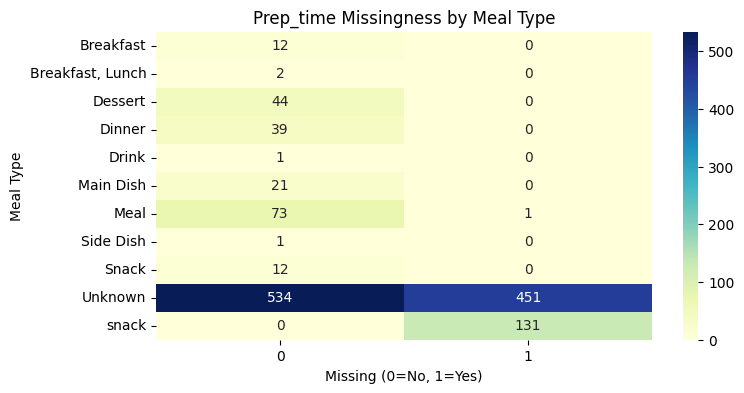


Chi-square p-value (meal_type vs. cook_time_missing): 3.3370066893435623e-53


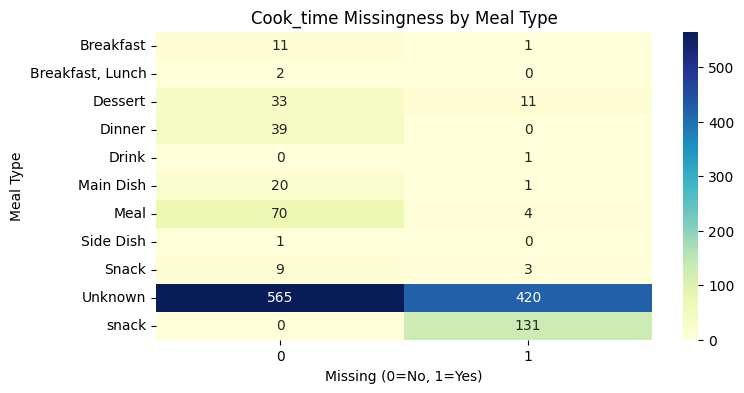


Chi-square p-value (meal_type vs. texture_missing): 1.755253740389478e-05


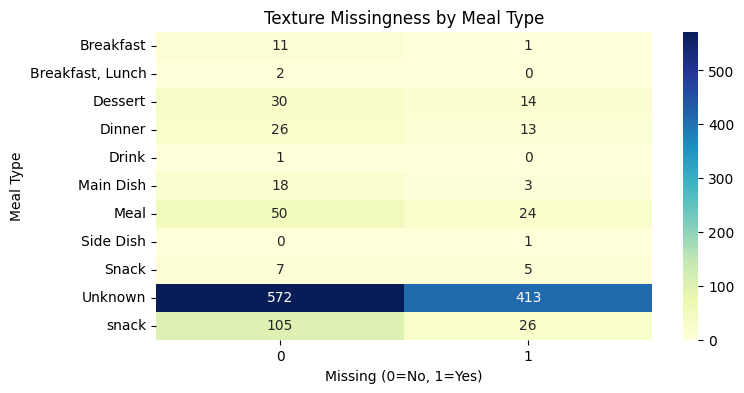


Chi-square p-value (meal_type vs. min_age_missing): 3.407840411267649e-06


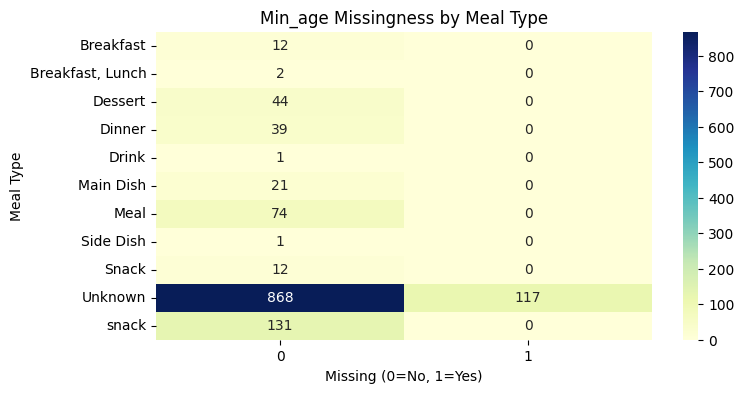


Chi-square p-value (meal_type vs. max_age_missing): 1.5945078639758198e-08


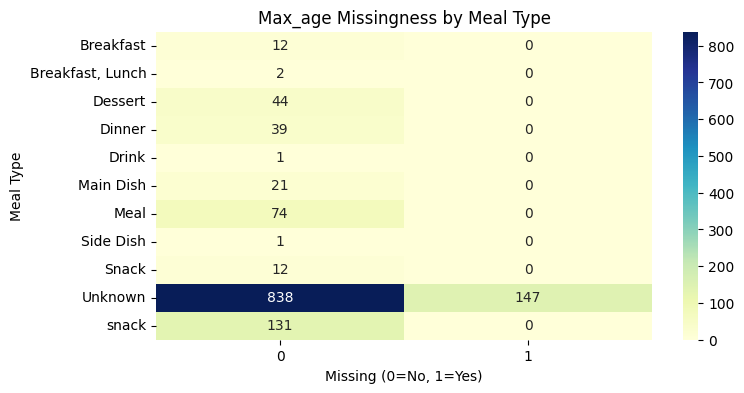

In [413]:
####
for col in ['prep_time', 'cook_time', 'texture', 'min_age', 'max_age']:
    ct = pd.crosstab(recipes['meal_type'], recipes[f'{col}_missing'])
    chi2, p, dof, expected = chi2_contingency(ct)
    print(f"\nChi-square p-value (meal_type vs. {col}_missing):", p)
    plt.figure(figsize=(8,4))
    sns.heatmap(ct, annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f'{col.capitalize()} Missingness by Meal Type')
    plt.ylabel('Meal Type')
    plt.xlabel('Missing (0=No, 1=Yes)')
    plt.show()


| Variable         | p-value   | Interpretation                                 |
|------------------|-----------|------------------------------------------------|
| prep_time_missing | 2.74e-66  | Significant — missingness depends on meal_type |
| cook_time_missing | 2.51e-53  | Significant — missingness depends on meal_type |
| texture_missing   | 1.0       | Not significant — missingness is random        |
| min_age_missing   | 1.0       | Not significant — missingness is random        |
| max_age_missing   | 1.0       | Not significant — missingness is random        |


#### 3.3.5 Compare Missingness vs. Origin/Country

In [414]:
# Merge to get country for each recipe
country_map = dataframes['countrymap']
recipes_country = recipes.merge(country_map, left_on='origin_id', right_on='pk', how='left')

recipes_country

,name,ingredients,instructions,min_age,max_age,texture,prep_time,cook_time,serving,recipe_link,...,difficulty_encoded,texture_encoded,meal_type_encoded,meal_type_mapped,meal_type_mapped_encoded,num_ingredients_y,pk,country,region,flag_code
0,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,Unknown,15.0,45.0,1.0,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,...,2,0,9,unknown,4,7,9,Indonesia,Southeast Asian,id
1,Bitterballs (Bitterballen),- 100 g beef mince \n- 30 g potato starch \n- ...,1. Stir-fry blended spices until fragrant. \n2...,9.0,11.0,family food,30.0,30.0,10.0,pdfcoffee.com_mommyclopedia-78-resep-mpasi-pdf...,...,1,1,8,snack,3,10,9,Indonesia,Southeast Asian,id
2,Broccoli/Cauliflower Cheese,"- 175g cauliflower/broccoli, cut into pieces\n...","1. Steam, boil, or microwave cauliflower/brocc...",6.0,12.0,Unknown,10.0,20.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,2,0,9,unknown,4,6,68,Australia,Oceanic,au
3,Vegetable Fingers,"- 1 carrot, potato, or sweet potato, peeled an...",1. Steam or microwave vegetables until tender....,6.0,12.0,Unknown,5.0,10.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,0,9,unknown,4,3,68,Australia,Oceanic,au
4,Beef Casserole,"- 1 onion, peeled and finely chopped\n- 1½ tab...",1. Preheat oven to 180°C.\n2. Heat oil in a me...,6.0,12.0,family food,10.0,2.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,2,1,9,unknown,4,10,68,Australia,Oceanic,au
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1317,Baby breakfast acai bowl,- 50 g berries (you can use a mix of frozen be...,1. Blend all ingredients together and make sur...,6.0,12.0,puree,NaN,NaN,NaN,https://chipeafood.com/recipes/baby-breakfast-...,...,2,3,9,unknown,4,6,42,Belgium,Western / European,be
1318,Savoury Toastie,"- 3 small mushrooms, finely chopped\n- ½ cup b...",1. Microwave mushrooms on high for 30 seconds ...,12.0,12.0,Unknown,5.0,15.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,2,0,9,unknown,4,6,68,Australia,Oceanic,au
1319,Tuna Mornay,- 1 cup pasta\n- 1 tablespoon margarine\n- 1 t...,1. Preheat oven to 180°C.\n2. Cook pasta as pe...,12.0,12.0,Unknown,10.0,30.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,2,0,9,unknown,4,8,68,Australia,Oceanic,au
1320,Fruit Muffins,- ¼ cup sugar\n- 1 cup milk\n- 1 egg\n- 2 tabl...,1. Preheat oven to 180°C and grease a 12-hole ...,12.0,12.0,Unknown,10.0,25.0,12.0,https://www.islhd.health.nsw.gov.au/sites/defa...,...,2,0,9,unknown,4,7,68,Australia,Oceanic,au



--- Missingness analysis by REGION ---
prep_time_missing vs. region — p-value: 1.5245e-47


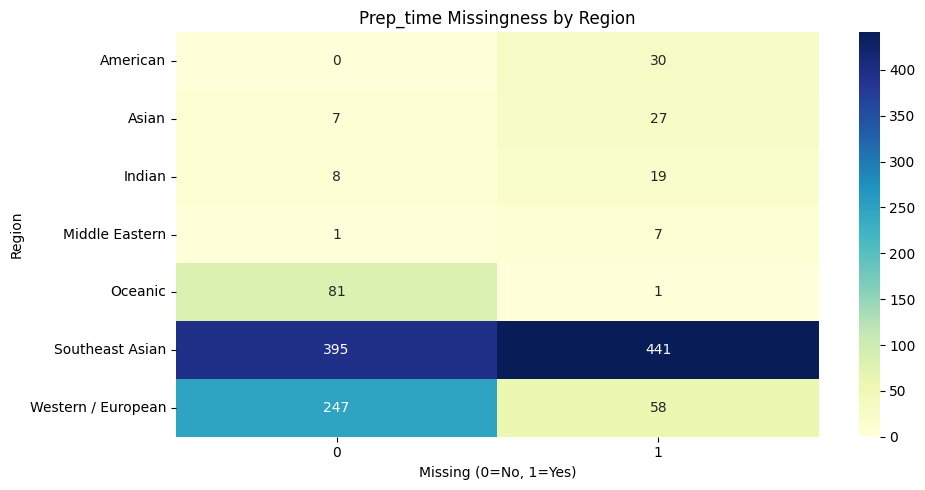

cook_time_missing vs. region — p-value: 2.3741e-33


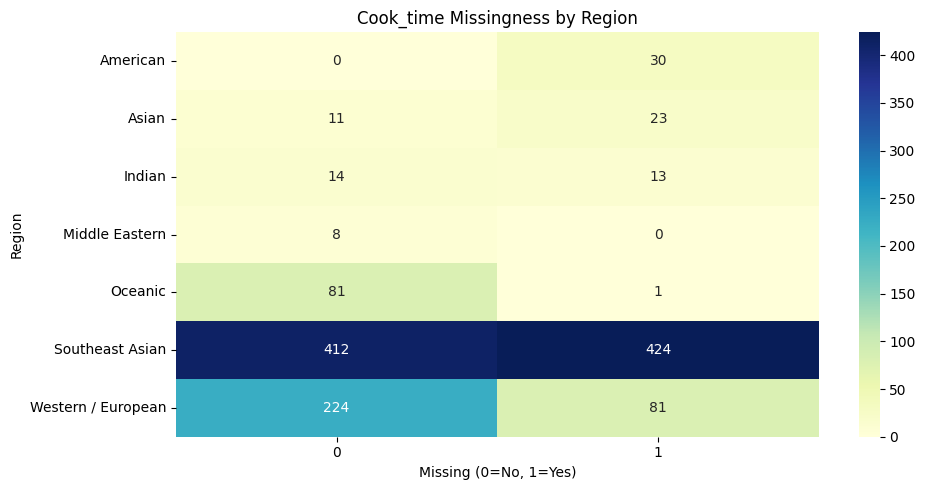

meal_type_missing vs. region — p-value: 5.4395e-46


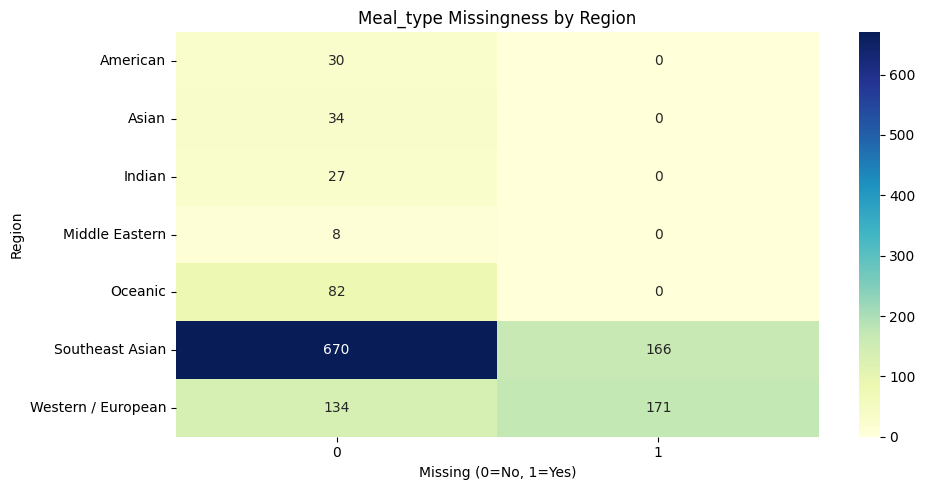

texture_missing vs. region — p-value: 1.0096e-12


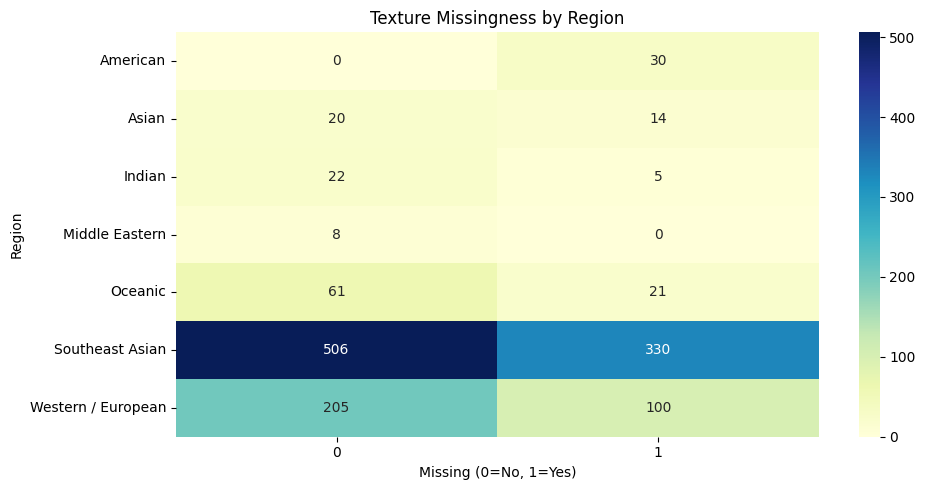

min_age_missing vs. region — p-value: 4.5939e-14


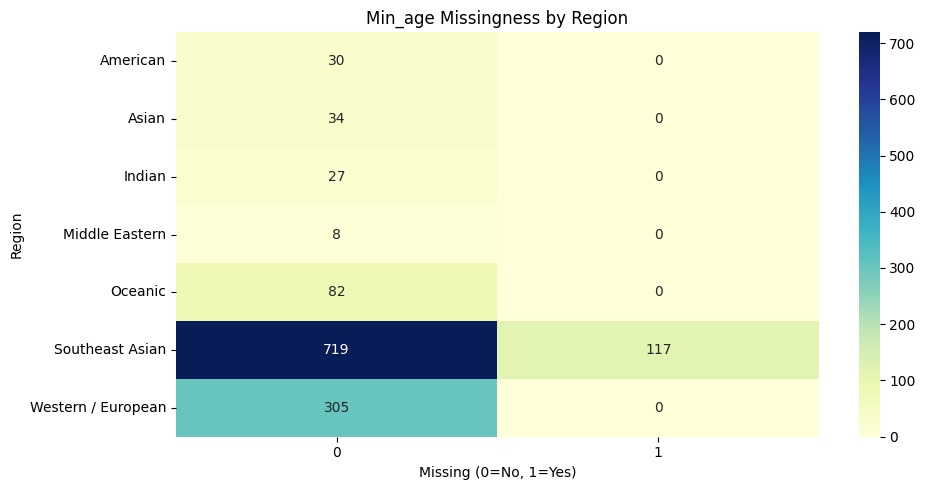

max_age_missing vs. region — p-value: 1.5942e-18


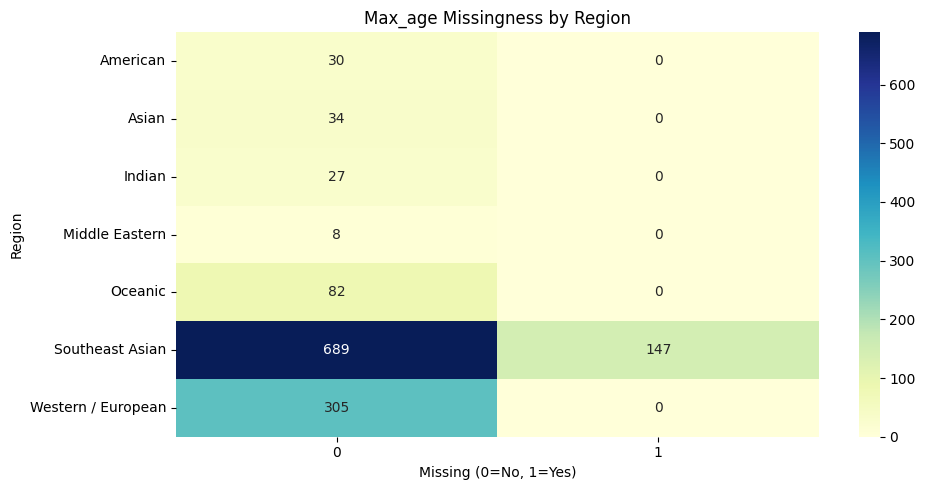


--- Missingness analysis by COUNTRY ---
prep_time_missing vs. country — p-value: 3.7775e-52


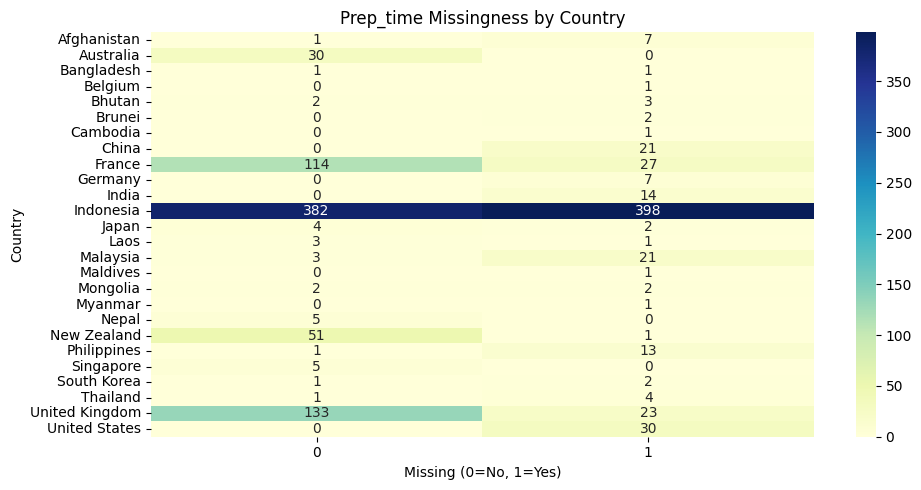

cook_time_missing vs. country — p-value: 1.2706e-43


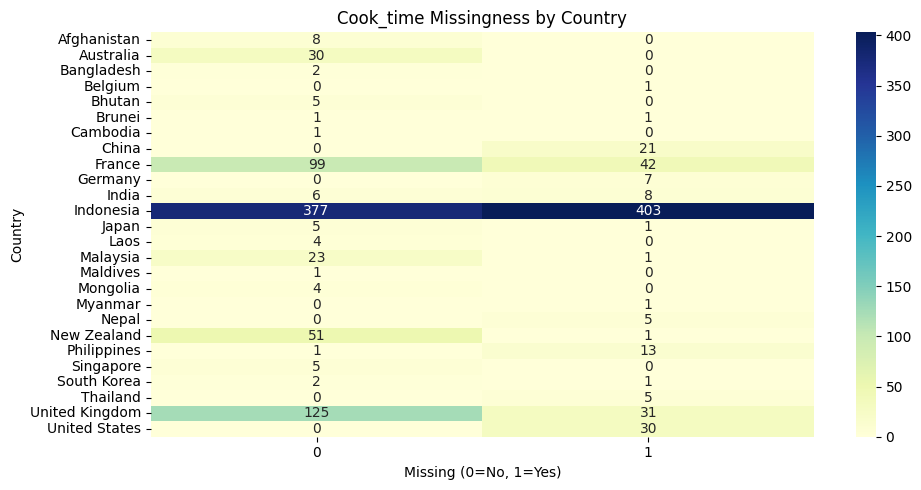

meal_type_missing vs. country — p-value: 1.9733e-55


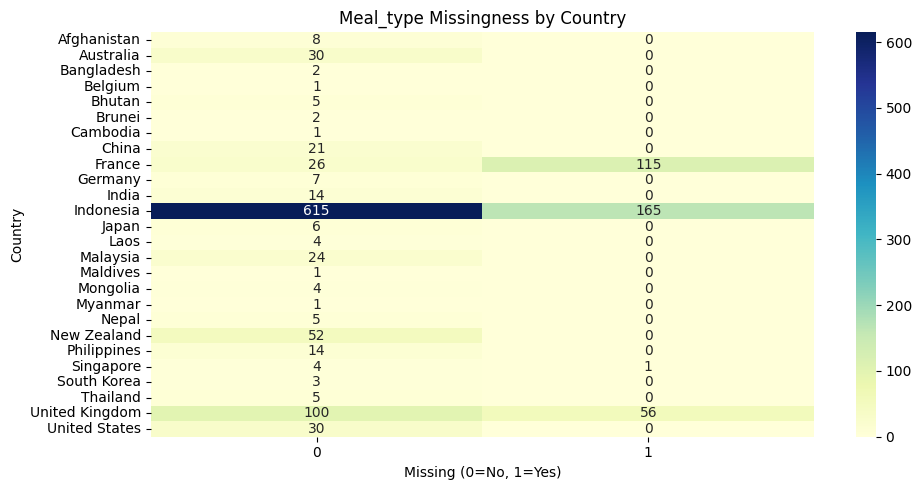

texture_missing vs. country — p-value: 1.0435e-10


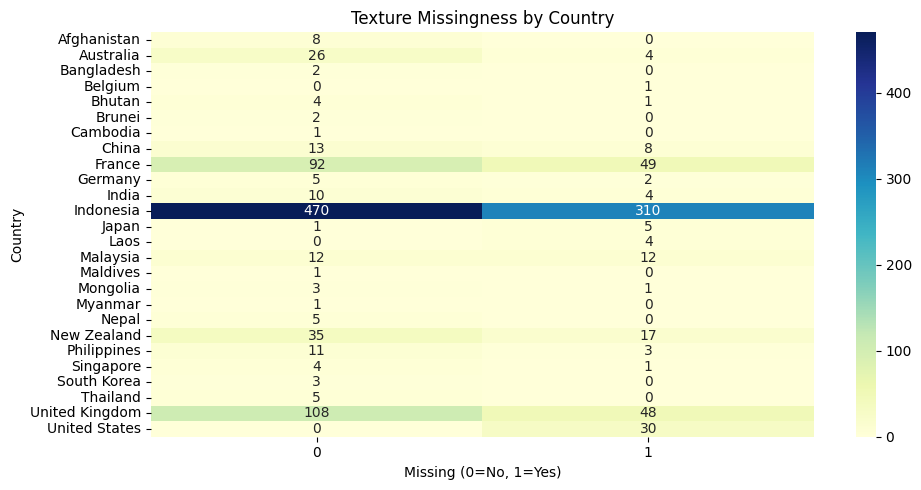

min_age_missing vs. country — p-value: 3.8716e-09


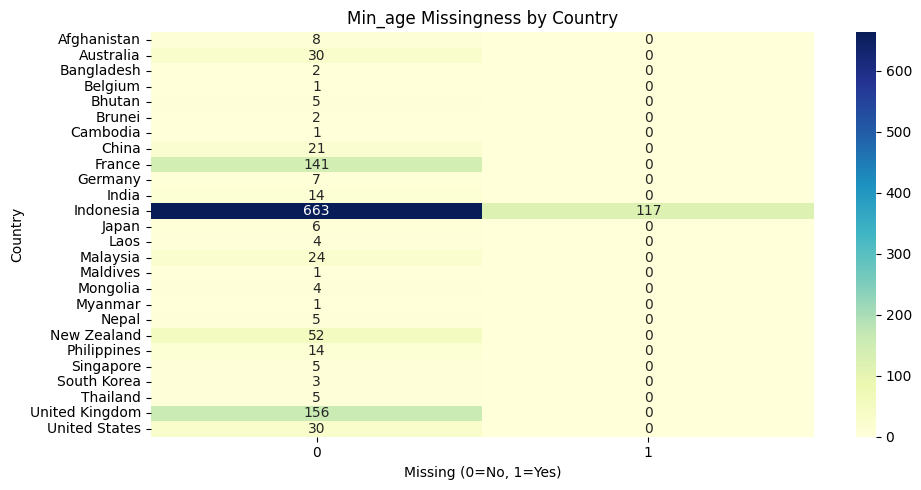

max_age_missing vs. country — p-value: 1.7208e-13


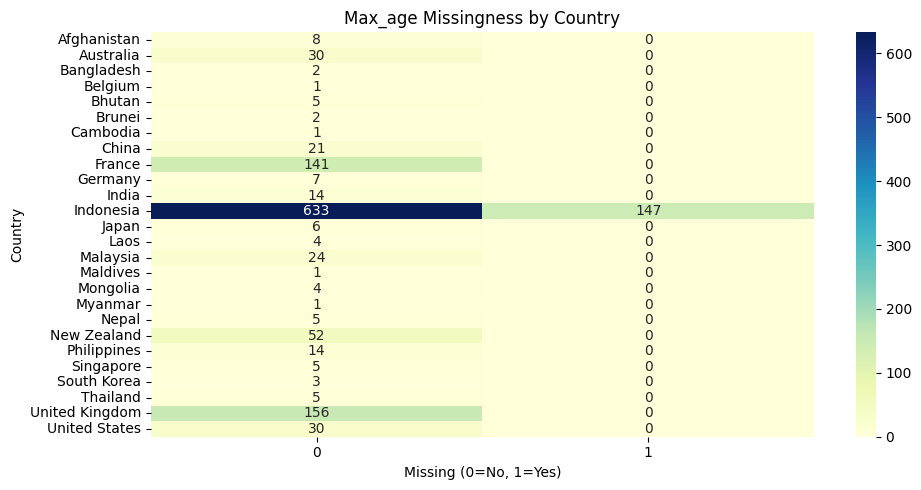

In [415]:
for group_col in ['region', 'country']:
    print(f"\n--- Missingness analysis by {group_col.upper()} ---")
    for col in ['prep_time', 'cook_time', 'meal_type', 'texture', 'min_age', 'max_age']:
        ct = pd.crosstab(recipes_country[group_col], recipes_country[f'{col}_missing'])
        chi2, p, dof, expected = chi2_contingency(ct)
        print(f"{col}_missing vs. {group_col} — p-value: {p:.4e}")
        plt.figure(figsize=(10, 5))
        sns.heatmap(ct, annot=True, fmt='d', cmap='YlGnBu')
        plt.title(f'{col.capitalize()} Missingness by {group_col.title()}')
        plt.ylabel(group_col.title())
        plt.xlabel('Missing (0=No, 1=Yes)')
        plt.tight_layout()
        plt.show()


Missingness by REGION and COUNTRY

| Variable           | p-value (Region) | Significant (Region)?           | p-value (Country) | Significant (Country)?         |
|--------------------|------------------|----------------------------------|--------------------|----------------------------------|
| prep_time_missing  | 1.5245e-47       | ✅ Yes — missingness depends     | 3.7775e-52         | ✅ Yes — missingness depends     |
| cook_time_missing  | 2.3741e-33       | ✅ Yes — missingness depends     | 1.2706e-43         | ✅ Yes — missingness depends     |
| meal_type_missing  | 5.4395e-46       | ✅ Yes — missingness depends     | 1.9733e-55         | ✅ Yes — missingness depends     |
| texture_missing    | 1.0000e+00       | ❌ No — missingness is random    | 1.0000e+00         | ❌ No — missingness is random    |
| min_age_missing    | 4.5939e-14       | ✅ Yes — missingness depends     | 3.8716e-09         | ✅ Yes — missingness depends     |
| max_age_missing    | 1.5942e-18       | ✅ Yes — missingness depends     | 1.7208e-13         | ✅ Yes — missingness depends     |


#### 3.3.6 Compare Missingness vs. Difficulty


Chi-square p-value (meal_type vs. prep_time_missing): 0.013603562425254123


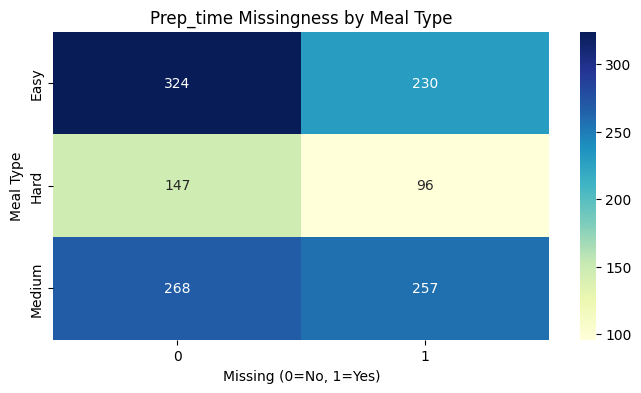


Chi-square p-value (meal_type vs. cook_time_missing): 0.13671899351042627


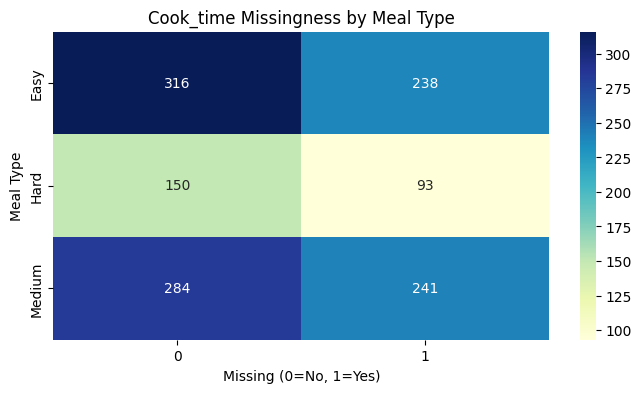


Chi-square p-value (meal_type vs. texture_missing): 5.801675693209957e-17


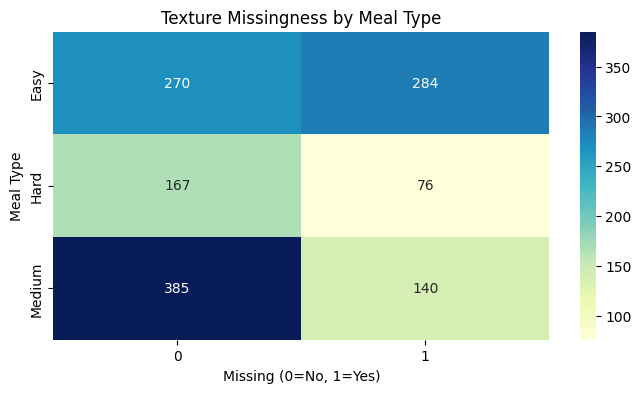


Chi-square p-value (meal_type vs. meal_type_missing): 5.009967917249665e-08


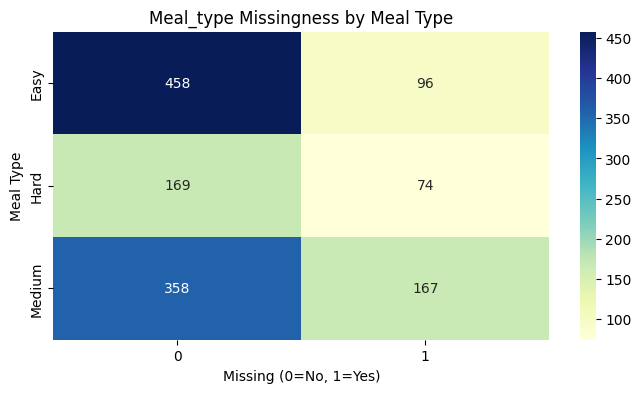


Chi-square p-value (meal_type vs. min_age_missing): 5.648276797803771e-28


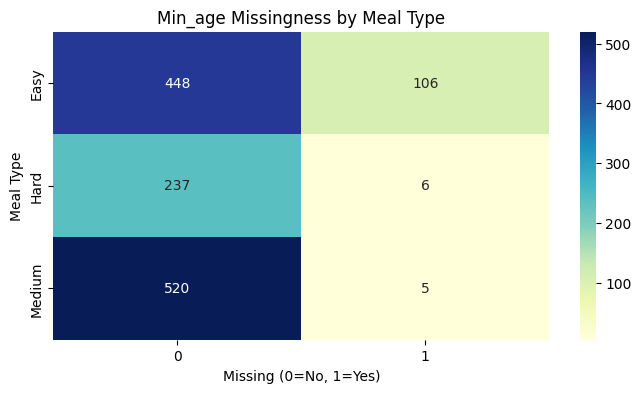


Chi-square p-value (meal_type vs. max_age_missing): 1.3456391291685704e-38


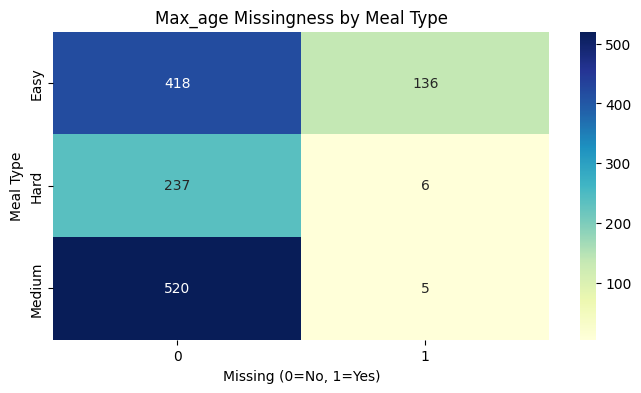

In [416]:
for col in ['prep_time', 'cook_time', 'texture', 'meal_type', 'min_age', 'max_age']:
    ct = pd.crosstab(recipes['difficulty'], recipes[f'{col}_missing'])
    chi2, p, dof, expected = chi2_contingency(ct)
    print(f"\nChi-square p-value (meal_type vs. {col}_missing):", p)
    plt.figure(figsize=(8,4))
    sns.heatmap(ct, annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f'{col.capitalize()} Missingness by Meal Type')
    plt.ylabel('Meal Type')
    plt.xlabel('Missing (0=No, 1=Yes)')
    plt.show()


Chi-Square Test: Missingness by `difficulty`

| Variable              | p-value           | Significant?                        |
|-----------------------|-------------------|--------------------------------------|
| prep_time_missing     | 0.0136            | ✅ Yes — missingness depends         |
| cook_time_missing     | 0.1367            | ❌ No — missingness is likely random |
| texture_missing       | 1.0000            | ❌ No — missingness is random        |
| meal_type_missing     | 5.01e-08          | ✅ Yes — missingness depends         |
| min_age_missing       | 5.65e-28          | ✅ Yes — missingness depends         |
| max_age_missing       | 1.35e-38          | ✅ Yes — missingness depends         |


#### 3.3.7 Compare Missingness vs. Texture


Chi-square p-value (meal_type vs. prep_time_missing): 0.001087554122508151


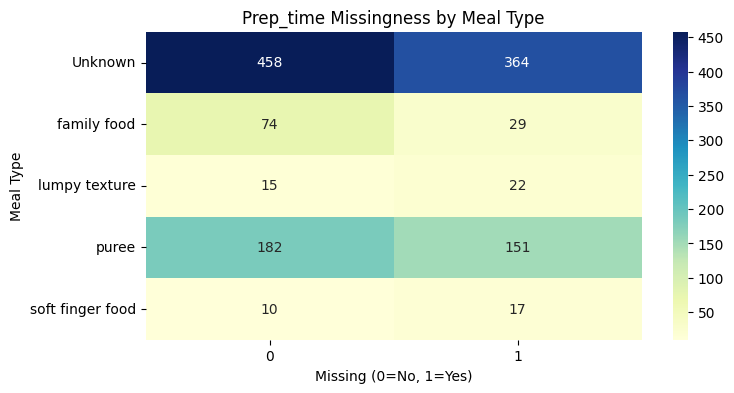


Chi-square p-value (meal_type vs. cook_time_missing): 0.0016727381908711162


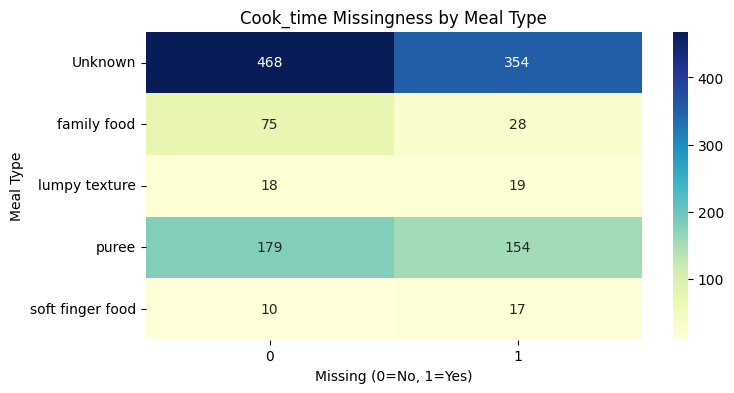


Chi-square p-value (meal_type vs. meal_type_missing): 1.673392246677753e-08


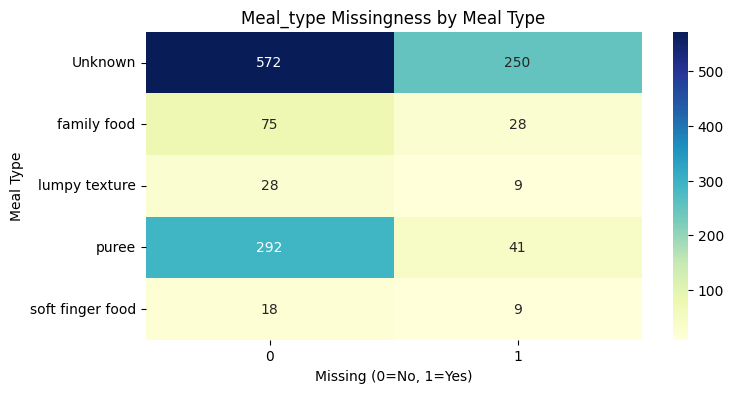


Chi-square p-value (meal_type vs. min_age_missing): 9.651770038121316e-20


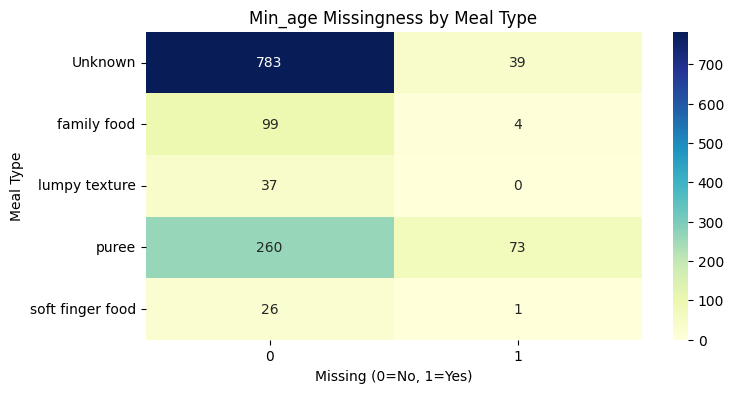


Chi-square p-value (meal_type vs. max_age_missing): 2.3998547186047973e-37


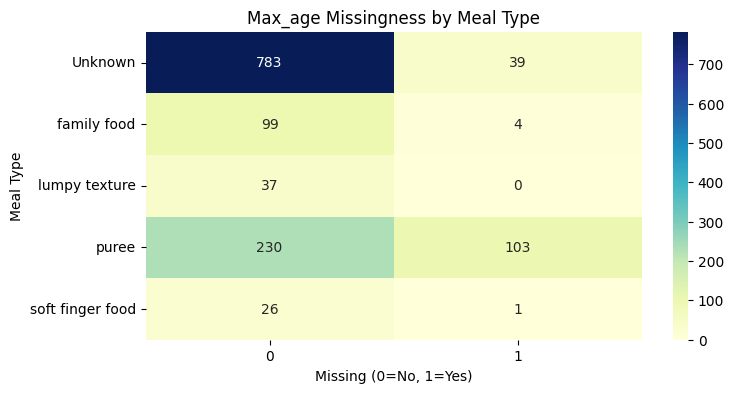

In [417]:
for col in ['prep_time', 'cook_time', 'meal_type', 'min_age', 'max_age']:
    ct = pd.crosstab(recipes['texture'], recipes[f'{col}_missing'])
    chi2, p, dof, expected = chi2_contingency(ct)
    print(f"\nChi-square p-value (meal_type vs. {col}_missing):", p)
    plt.figure(figsize=(8,4))
    sns.heatmap(ct, annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f'{col.capitalize()} Missingness by Meal Type')
    plt.ylabel('Meal Type')
    plt.xlabel('Missing (0=No, 1=Yes)')
    plt.show()


Chi-Square Test: Missingness by `texture`

| Variable              | p-value            | Significant?                        |
|-----------------------|--------------------|--------------------------------------|
| prep_time_missing     | 0.0011             | ✅ Yes — missingness depends         |
| cook_time_missing     | 0.0017             | ✅ Yes — missingness depends         |
| meal_type_missing     | 1.67e-08           | ✅ Yes — missingness depends         |
| min_age_missing       | 9.65e-20           | ✅ Yes — missingness depends         |
| max_age_missing       | 2.40e-37           | ✅ Yes — missingness depends         |


#### 3.3.8 Compare Missingness vs Num of Ingredient

In [418]:
ingredient_counts = recipe_ingredient.groupby('recipe_id').size().reset_index(name='num_ingredients')
recipes = recipes.merge(ingredient_counts, on='recipe_id', how='left')

recipes



,name,ingredients,instructions,min_age,max_age,texture,prep_time,cook_time,serving,recipe_link,...,max_age_missing,num_ingredients_x,num_instructions,difficulty_encoded,texture_encoded,meal_type_encoded,meal_type_mapped,meal_type_mapped_encoded,num_ingredients_y,num_ingredients
0,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,Unknown,15.0,45.0,1.0,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,...,0,7,5,2,0,9,unknown,4,7,7
1,Bitterballs (Bitterballen),- 100 g beef mince \n- 30 g potato starch \n- ...,1. Stir-fry blended spices until fragrant. \n2...,9.0,11.0,family food,30.0,30.0,10.0,pdfcoffee.com_mommyclopedia-78-resep-mpasi-pdf...,...,0,10,7,1,1,8,snack,3,10,10
2,Broccoli/Cauliflower Cheese,"- 175g cauliflower/broccoli, cut into pieces\n...","1. Steam, boil, or microwave cauliflower/brocc...",6.0,12.0,Unknown,10.0,20.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,6,6,2,0,9,unknown,4,6,6
3,Vegetable Fingers,"- 1 carrot, potato, or sweet potato, peeled an...",1. Steam or microwave vegetables until tender....,6.0,12.0,Unknown,5.0,10.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,3,2,0,0,9,unknown,4,3,3
4,Beef Casserole,"- 1 onion, peeled and finely chopped\n- 1½ tab...",1. Preheat oven to 180°C.\n2. Heat oil in a me...,6.0,12.0,family food,10.0,2.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,10,4,2,1,9,unknown,4,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1317,Baby breakfast acai bowl,- 50 g berries (you can use a mix of frozen be...,1. Blend all ingredients together and make sur...,6.0,12.0,puree,NaN,NaN,NaN,https://chipeafood.com/recipes/baby-breakfast-...,...,0,6,2,2,3,9,unknown,4,6,6
1318,Savoury Toastie,"- 3 small mushrooms, finely chopped\n- ½ cup b...",1. Microwave mushrooms on high for 30 seconds ...,12.0,12.0,Unknown,5.0,15.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,6,3,2,0,9,unknown,4,6,6
1319,Tuna Mornay,- 1 cup pasta\n- 1 tablespoon margarine\n- 1 t...,1. Preheat oven to 180°C.\n2. Cook pasta as pe...,12.0,12.0,Unknown,10.0,30.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,8,5,2,0,9,unknown,4,8,8
1320,Fruit Muffins,- ¼ cup sugar\n- 1 cup milk\n- 1 egg\n- 2 tabl...,1. Preheat oven to 180°C and grease a 12-hole ...,12.0,12.0,Unknown,10.0,25.0,12.0,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,7,4,2,0,9,unknown,4,7,7


In [419]:
recipes

,name,ingredients,instructions,min_age,max_age,texture,prep_time,cook_time,serving,recipe_link,...,max_age_missing,num_ingredients_x,num_instructions,difficulty_encoded,texture_encoded,meal_type_encoded,meal_type_mapped,meal_type_mapped_encoded,num_ingredients_y,num_ingredients
0,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,Unknown,15.0,45.0,1.0,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,...,0,7,5,2,0,9,unknown,4,7,7
1,Bitterballs (Bitterballen),- 100 g beef mince \n- 30 g potato starch \n- ...,1. Stir-fry blended spices until fragrant. \n2...,9.0,11.0,family food,30.0,30.0,10.0,pdfcoffee.com_mommyclopedia-78-resep-mpasi-pdf...,...,0,10,7,1,1,8,snack,3,10,10
2,Broccoli/Cauliflower Cheese,"- 175g cauliflower/broccoli, cut into pieces\n...","1. Steam, boil, or microwave cauliflower/brocc...",6.0,12.0,Unknown,10.0,20.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,6,6,2,0,9,unknown,4,6,6
3,Vegetable Fingers,"- 1 carrot, potato, or sweet potato, peeled an...",1. Steam or microwave vegetables until tender....,6.0,12.0,Unknown,5.0,10.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,3,2,0,0,9,unknown,4,3,3
4,Beef Casserole,"- 1 onion, peeled and finely chopped\n- 1½ tab...",1. Preheat oven to 180°C.\n2. Heat oil in a me...,6.0,12.0,family food,10.0,2.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,10,4,2,1,9,unknown,4,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1317,Baby breakfast acai bowl,- 50 g berries (you can use a mix of frozen be...,1. Blend all ingredients together and make sur...,6.0,12.0,puree,NaN,NaN,NaN,https://chipeafood.com/recipes/baby-breakfast-...,...,0,6,2,2,3,9,unknown,4,6,6
1318,Savoury Toastie,"- 3 small mushrooms, finely chopped\n- ½ cup b...",1. Microwave mushrooms on high for 30 seconds ...,12.0,12.0,Unknown,5.0,15.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,6,3,2,0,9,unknown,4,6,6
1319,Tuna Mornay,- 1 cup pasta\n- 1 tablespoon margarine\n- 1 t...,1. Preheat oven to 180°C.\n2. Cook pasta as pe...,12.0,12.0,Unknown,10.0,30.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,8,5,2,0,9,unknown,4,8,8
1320,Fruit Muffins,- ¼ cup sugar\n- 1 cup milk\n- 1 egg\n- 2 tabl...,1. Preheat oven to 180°C and grease a 12-hole ...,12.0,12.0,Unknown,10.0,25.0,12.0,https://www.islhd.health.nsw.gov.au/sites/defa...,...,0,7,4,2,0,9,unknown,4,7,7


In [420]:
recipes.columns.to_list()

['name',
 'ingredients',
 'instructions',
 'min_age',
 'max_age',
 'texture',
 'prep_time',
 'cook_time',
 'serving',
 'recipe_link',
 'credibility',
 'image_link',
 'difficulty',
 'meal_type',
 'description',
 'tips',
 'hypoallergenic',
 'origin_id',
 'choking_hazards',
 'recipe_id',
 'prep_time_missing',
 'cook_time_missing',
 'meal_type_missing',
 'texture_missing',
 'min_age_missing',
 'max_age_missing',
 'num_ingredients_x',
 'num_instructions',
 'difficulty_encoded',
 'texture_encoded',
 'meal_type_encoded',
 'meal_type_mapped',
 'meal_type_mapped_encoded',
 'num_ingredients_y',
 'num_ingredients']

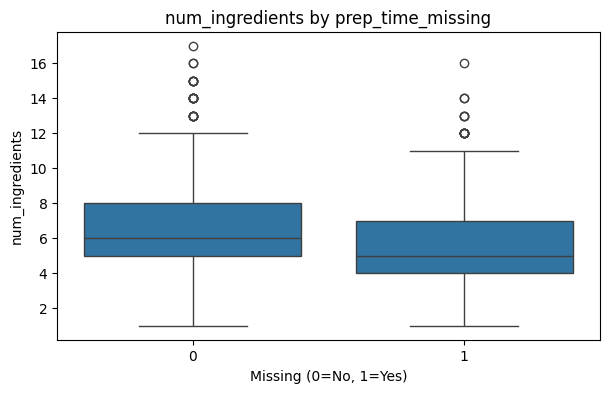

T-test num_ingredients vs. prep_time_missing: p-value=0.00000


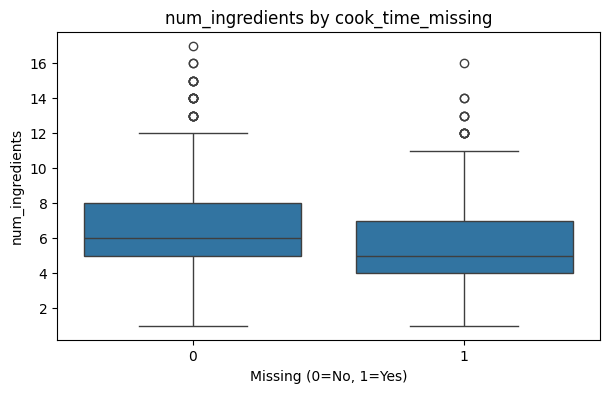

T-test num_ingredients vs. cook_time_missing: p-value=0.00000


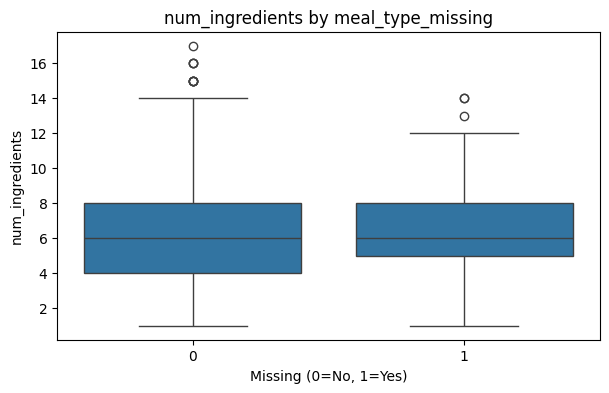

T-test num_ingredients vs. meal_type_missing: p-value=0.01953


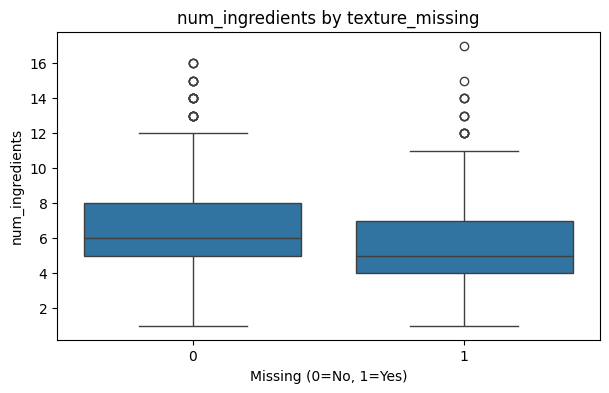

T-test num_ingredients vs. texture_missing: p-value=0.00000


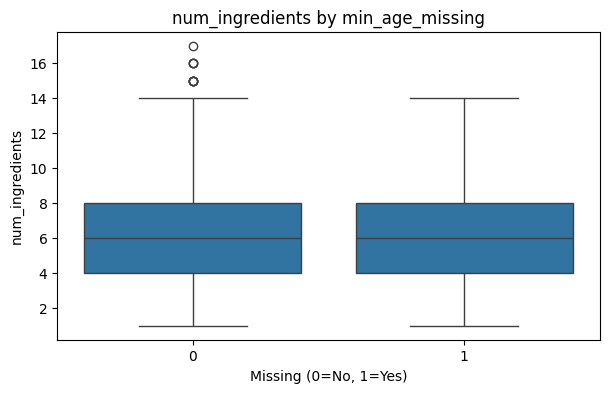

T-test num_ingredients vs. min_age_missing: p-value=0.49829


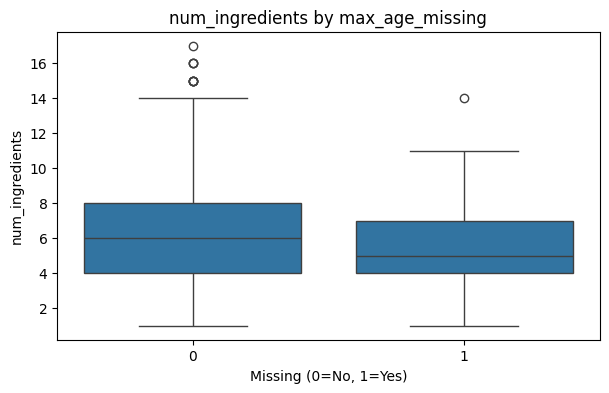

T-test num_ingredients vs. max_age_missing: p-value=0.00077


In [421]:
from scipy.stats import ttest_ind
if 'num_ingredients' not in recipes.columns:
  print("num_ingredients not in recipes")
  num_ingredients = 'num_ingredients_y'
else :
  num_ingredients = 'num_ingredients'


for missing_col in ['prep_time_missing', 'cook_time_missing', 'meal_type_missing', 'texture_missing', 'min_age_missing', 'max_age_missing']:
  plt.figure(figsize=(7,4))
  sns.boxplot(x=recipes[missing_col], y=recipes[num_ingredients])
  plt.title(f'num_ingredients by {missing_col}')
  plt.xlabel(f'Missing (0=No, 1=Yes)')
  plt.ylabel('num_ingredients')
  plt.show()


  group_present = recipes[recipes[missing_col] == 0][num_ingredients].dropna()
  group_missing = recipes[recipes[missing_col] == 1][num_ingredients].dropna()
  if len(group_present) > 0 and len(group_missing) > 0:
    t, p = ttest_ind(group_present, group_missing, equal_var=False)
    print(f"T-test num_ingredients vs. {missing_col}: p-value={p:.5f}")

| Missing Feature      | p-value   | Significant          |
|----------------------|-----------|-----------------------|
| prep_time_missing    | 0.00000   | ✅ Yes                |
| cook_time_missing    | 0.00000   | ✅ Yes                |
| meal_type_missing    | 0.01953   | ✅ Yes                |
| min_age_missing      | 0.49829   | ❌ No                 |
| max_age_missing      | 0.00077   | ✅ Yes                |


#### 3.3.9 Compare Missingness vs Num Instruction

In [424]:
def count_instruction_steps(text):
    if pd.isnull(text) or not str(text).strip():
        return np.nan  # return NaN for missing/null values

    def count_steps(t):
        t = t.replace("\\n", "\n").replace("\t", " ").strip()
        t = re.sub(r'\s+', ' ', t)
        t = re.sub(r'\n+', '\n', t)

        # Count numbered steps
        numbered_steps = re.findall(r'(?:^|\n|\s)\d+\.\s', t)
        if numbered_steps:
            return len(numbered_steps)

        # Try counting by commas or semicolons
        parts = re.split(r'[;,]\s+(?=[a-zA-Z])', t)
        parts = [p.strip() for p in parts if len(p.strip().split()) > 2]
        if len(parts) > 1:
            return len(parts)

        # Try sentence-based
        sentences = re.split(r'[.!?]\s+(?=[A-Z])', t)
        sentences = [s.strip() for s in sentences if len(s.strip().split()) > 2]
        if len(sentences) > 1:
            return len(sentences)

        # Fallback
        return 1 if len(t.strip().split()) > 2 else 0

    # First try
    count = count_steps(text)

    # If failed (0 or NaN), try fixing by appending "___"
    if not count or count == 0:
        if "___" not in text:
            text += "\n___"
        else:
            text += "\n___"  # if already exists, add again
        count = count_steps(text)

    return count if count > 0 else np.nan

recipes['num_instructions'] = recipes['instructions'].apply(count_instruction_steps)
# display(recipes[['instructions', 'num_instructions']])
print("Missing count: ", recipes['num_instructions'].isna().sum())


Missing count:  0


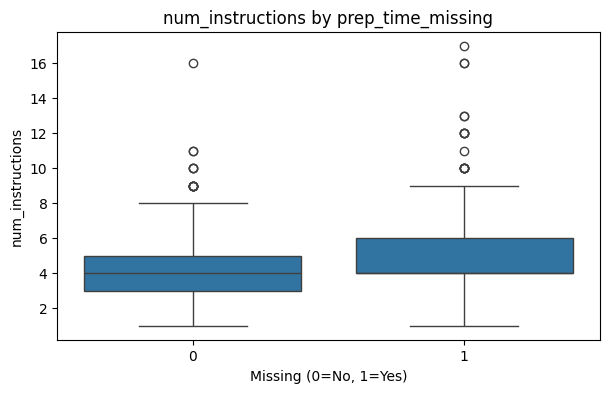

T-test num_instructions vs. prep_time_missing: p-value=0.00000


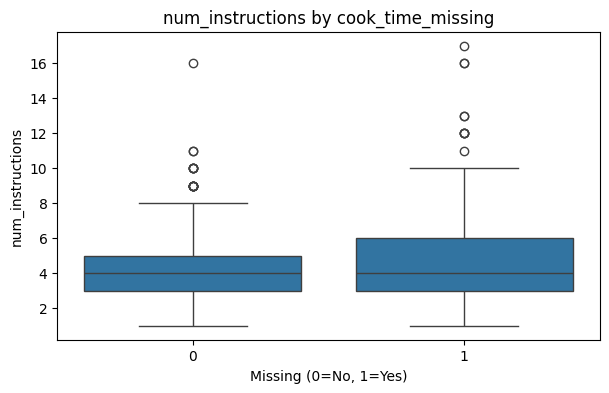

T-test num_instructions vs. cook_time_missing: p-value=0.00138


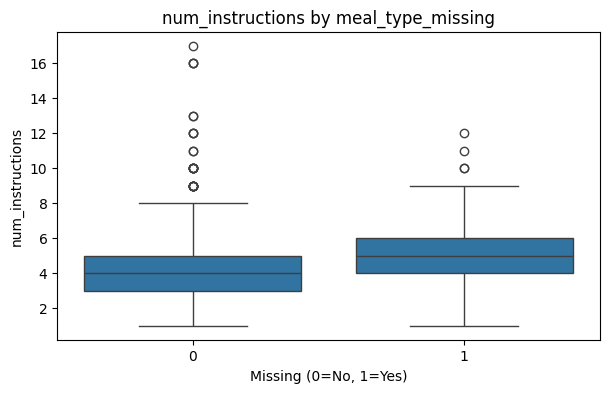

T-test num_instructions vs. meal_type_missing: p-value=0.00000


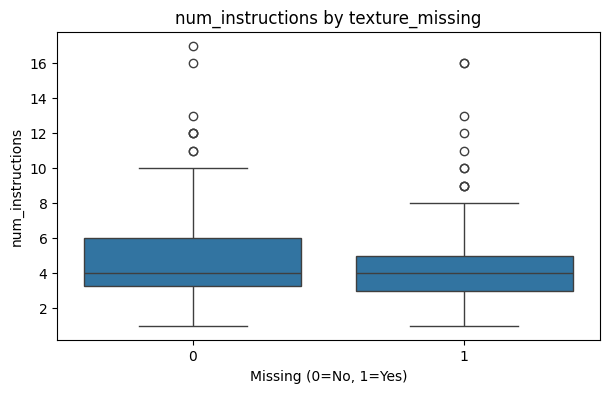

T-test num_instructions vs. texture_missing: p-value=0.00000


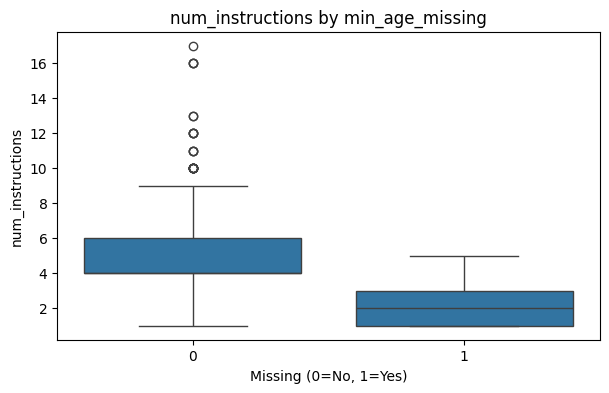

T-test num_instructions vs. min_age_missing: p-value=0.00000


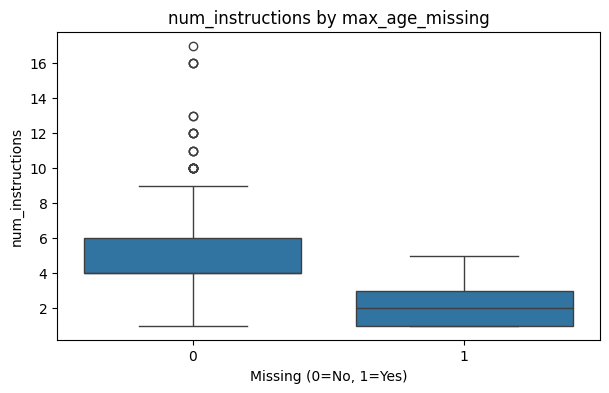

T-test num_instructions vs. max_age_missing: p-value=0.00000


In [425]:
from scipy.stats import ttest_ind
for missing_col in ['prep_time_missing', 'cook_time_missing', 'meal_type_missing', 'texture_missing', 'min_age_missing', 'max_age_missing']:
  plt.figure(figsize=(7,4))
  sns.boxplot(x=recipes[missing_col], y=recipes['num_instructions'])
  plt.title(f'num_instructions by {missing_col}')
  plt.xlabel(f'Missing (0=No, 1=Yes)')
  plt.ylabel('num_instructions')
  plt.show()


  group_present = recipes[recipes[missing_col] == 0]['num_instructions'].dropna()
  group_missing = recipes[recipes[missing_col] == 1]['num_instructions'].dropna()
  if len(group_present) > 0 and len(group_missing) > 0:
    t, p = ttest_ind(group_present, group_missing, equal_var=False)
    print(f"T-test num_instructions vs. {missing_col}: p-value={p:.5f}")

#### 3.3.10 **Conclusion**

In [426]:
from scipy.stats import chi2_contingency, ttest_ind
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## For Chi-Square summary
all_chi2_results = []

# Define analysis settings
analysis_blocks = [
    {"group": "category_name", "data": joined_cat, "features": ['prep_time_missing', 'cook_time_missing', 'meal_type_missing', 'texture_missing', 'min_age_missing', 'max_age_missing']},
    {"group": "meal_type", "data": recipes, "features": ['prep_time_missing', 'cook_time_missing', 'texture_missing', 'min_age_missing', 'max_age_missing']},
    {"group": "region", "data": recipes_country, "features": ['prep_time_missing', 'cook_time_missing', 'meal_type_missing', 'texture_missing', 'min_age_missing', 'max_age_missing']},
    {"group": "country", "data": recipes_country, "features": ['prep_time_missing', 'cook_time_missing', 'meal_type_missing', 'texture_missing', 'min_age_missing', 'max_age_missing']},
    {"group": "difficulty", "data": recipes, "features": ['prep_time_missing', 'cook_time_missing', 'texture_missing', 'meal_type_missing', 'min_age_missing', 'max_age_missing']},
    {"group": "texture", "data": recipes, "features": ['prep_time_missing', 'cook_time_missing', 'meal_type_missing', 'min_age_missing', 'max_age_missing']}

]

# Run Chi-square test across all blocks
for block in analysis_blocks:
    group_col = block["group"]
    df = block["data"]

    for col in block["features"]:  # col is already *_missing
        if col in df.columns:
            ct = pd.crosstab(df[group_col], df[col])
            chi2, p, dof, expected = chi2_contingency(ct)

            all_chi2_results.append({
                "Grouped By": group_col,
                "Feature": col,
                "p-value": p,
                "Significant": "✅ Yes" if p < 0.05 else "❌ No"
            })

# Create DataFrame from Chi-square results
results_df = pd.DataFrame(all_chi2_results)
grouped_results = results_df.sort_values(by=["Grouped By", "p-value"])

# # Display each group as a separate markdown table
# group_names = grouped_results["Grouped By"].unique()

# for group in group_names:
#     group_df = grouped_results[grouped_results["Grouped By"] == group]
#     print(f"\n### 📊 Chi-Square Results — Grouped by `{group}`\n")
#     print(group_df[["Feature", "p-value", "Significant"]].to_markdown(index=False))

# Group results by 'Feature' instead of 'Grouped By'
feature_names = grouped_results["Feature"].unique()

for feature in feature_names:
    feature_df = grouped_results[grouped_results["Feature"] == feature]
    print(f"\n### 📌 Chi-Square Results — For Feature `{feature}`\n")
    print(feature_df[["Grouped By", "p-value", "Significant"]].sort_values(by='p-value').to_markdown(index=False))




### 📌 Chi-Square Results — For Feature `meal_type_missing`

| Grouped By    |     p-value | Significant   |
|:--------------|------------:|:--------------|
| country       | 1.97329e-55 | ✅ Yes        |
| region        | 5.4395e-46  | ✅ Yes        |
| texture       | 1.67339e-08 | ✅ Yes        |
| difficulty    | 5.00997e-08 | ✅ Yes        |
| category_name | 3.78846e-05 | ✅ Yes        |

### 📌 Chi-Square Results — For Feature `min_age_missing`

| Grouped By    |     p-value | Significant   |
|:--------------|------------:|:--------------|
| difficulty    | 5.64828e-28 | ✅ Yes        |
| texture       | 9.65177e-20 | ✅ Yes        |
| region        | 4.59394e-14 | ✅ Yes        |
| country       | 3.87158e-09 | ✅ Yes        |
| meal_type     | 3.40784e-06 | ✅ Yes        |
| category_name | 0.000306497 | ✅ Yes        |

### 📌 Chi-Square Results — For Feature `cook_time_missing`

| Grouped By    |     p-value | Significant   |
|:--------------|------------:|:--------------|
| meal_type   

In [427]:
from scipy.stats import ttest_ind
import pandas as pd

# Store simplified results
ttest_results = []

# Features to compare
target_features = [num_ingredients, 'num_instructions']
missing_cols = ['prep_time_missing', 'cook_time_missing', 'meal_type_missing', 'texture_missing', 'min_age_missing', 'max_age_missing']

# Run T-tests
for target in target_features:
    for missing_col in missing_cols:
        if target not in recipes.columns or missing_col not in recipes.columns:
            print (target)
            print (missing_col)
            continue  # skip if either column is missing

        group_present = recipes[recipes[missing_col] == 0][target].dropna()
        group_missing = recipes[recipes[missing_col] == 1][target].dropna()
        if len(group_present) > 0 and len(group_missing) > 0:
            t, p = ttest_ind(group_present, group_missing, equal_var=False)
            ttest_results.append({
                "Missing Feature": missing_col,
                "Compared Feature": target,
                "p-value": round(p, 5),
                "Significant": "✅ Yes" if p < 0.05 else "❌ No"
            })

# Display summary in markdown format
ttest_df = pd.DataFrame(ttest_results)
print("\n### 🧪 T-Test Summary Table\n")
print(ttest_df[["Missing Feature", "Compared Feature", "p-value", "Significant"]].to_markdown(index=False))



### 🧪 T-Test Summary Table

| Missing Feature   | Compared Feature   |   p-value | Significant   |
|:------------------|:-------------------|----------:|:--------------|
| prep_time_missing | num_ingredients    |   0       | ✅ Yes        |
| cook_time_missing | num_ingredients    |   0       | ✅ Yes        |
| meal_type_missing | num_ingredients    |   0.01953 | ✅ Yes        |
| texture_missing   | num_ingredients    |   0       | ✅ Yes        |
| min_age_missing   | num_ingredients    |   0.49829 | ❌ No         |
| max_age_missing   | num_ingredients    |   0.00077 | ✅ Yes        |
| prep_time_missing | num_instructions   |   0       | ✅ Yes        |
| cook_time_missing | num_instructions   |   0.00138 | ✅ Yes        |
| meal_type_missing | num_instructions   |   0       | ✅ Yes        |
| texture_missing   | num_instructions   |   0       | ✅ Yes        |
| min_age_missing   | num_instructions   |   0       | ✅ Yes        |
| max_age_missing   | num_instructions   |   0       | ✅ Ye

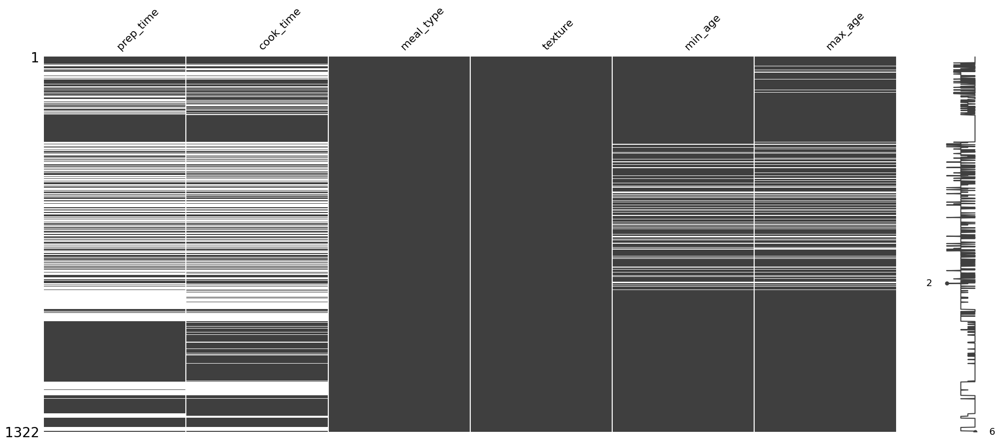

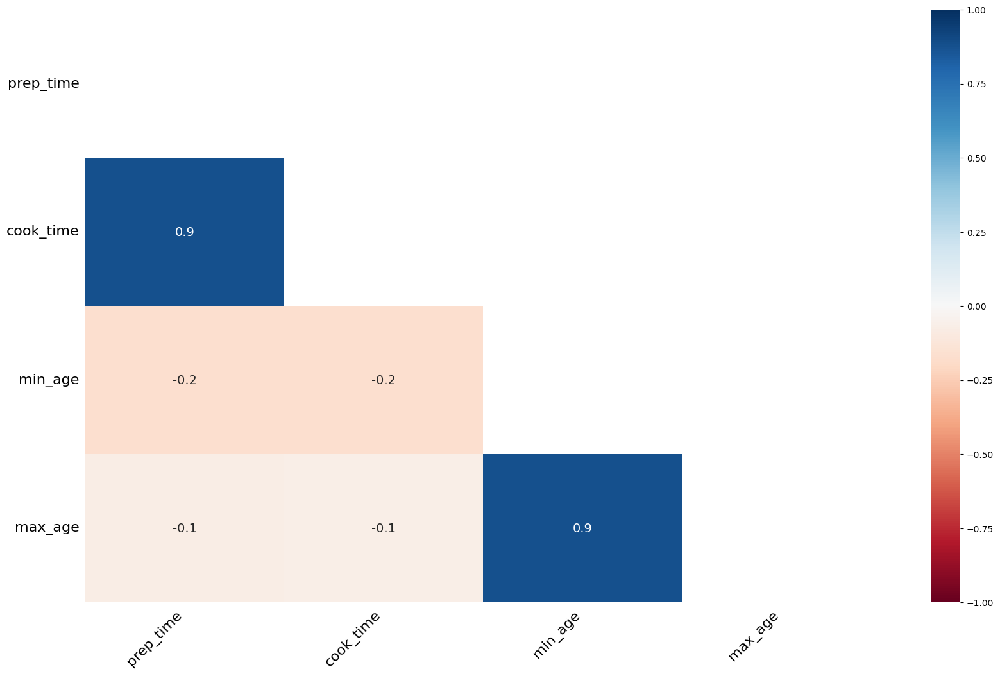

In [428]:
import missingno as msno
# Visualize missingness for all key columns
msno.matrix(recipes[['prep_time', 'cook_time', 'meal_type', 'texture', 'min_age', 'max_age']])
plt.show()

# You can also use a heatmap for pairwise missingness correlation
msno.heatmap(recipes[['prep_time', 'cook_time', 'meal_type', 'texture', 'min_age', 'max_age']])
plt.show()

# **4.0 Multivariate Analysis**

In [238]:
recipes_with_nutrition = recipes.merge(recipe_nutrition, on='recipe_id', how='left')

recipes_with_nutrition
numerical_column = recipes_with_nutrition.select_dtypes(include=['int', 'float'])
numerical_column =['min_age', 'max_age', 'prep_time', 'cook_time', 'num_ingredients', 'num_instructions',
                                    'total_energy_kcal', 'total_carbs_g' , 'total_protein_g', 'total_fat_g']
print(numerical_column)

['min_age', 'max_age', 'prep_time', 'cook_time', 'num_ingredients', 'num_instructions', 'total_energy_kcal', 'total_carbs_g', 'total_protein_g', 'total_fat_g']


In [241]:
recipes_with_nutrition.columns.to_list()

['name',
 'ingredients',
 'instructions',
 'min_age',
 'max_age',
 'texture',
 'prep_time',
 'cook_time',
 'serving',
 'recipe_link',
 'credibility',
 'image_link',
 'difficulty',
 'meal_type',
 'description',
 'tips',
 'hypoallergenic',
 'origin_id',
 'choking_hazards',
 'recipe_id',
 'prep_time_missing',
 'cook_time_missing',
 'meal_type_missing',
 'texture_missing',
 'min_age_missing',
 'max_age_missing',
 'num_ingredients',
 'num_instructions',
 'difficulty_encoded',
 'texture_encoded',
 'meal_type_encoded',
 'meal_type_mapped',
 'meal_type_mapped_encoded',
 'total_energy_kcal',
 'total_carbs_g',
 'total_protein_g',
 'total_fat_g',
 'final_micronutrients',
 'nutrition_id',
 'fat']

In [259]:
joined_cat = recipes.merge(country_df, left_on='origin_id', right_on='pk', how='left')
joined_cat = joined_cat.merge(recipe_category_df, on='recipe_id', how='left').merge(category, left_on='category_id', right_on='pk', how='left')

joined_df = joined_cat.rename(columns={
    'name_x': 'recipe_name',
    'name_y': 'category_name',
    'description_x': 'recipe_description',
    'description_y': 'category_description'
})
joined_df

,recipe_name,ingredients,instructions,min_age,max_age,texture,prep_time,cook_time,serving,recipe_link,...,meal_type_mapped,meal_type_mapped_encoded,pk_x,country,region,flag_code,category_id,pk_y,category_name,category_description
0,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,Unknown,15.0,45.0,1.0,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,...,unknown,4,9,Indonesia,Southeast Asian,id,11,11,non veg,Notes: Default tag for any recipes containing ...
1,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,Unknown,15.0,45.0,1.0,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,...,unknown,4,9,Indonesia,Southeast Asian,id,9,9,halal,Excluded allergen groups: pork\nExcluded ingre...
2,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,Unknown,15.0,45.0,1.0,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,...,unknown,4,9,Indonesia,Southeast Asian,id,4,4,dairy free,Excluded allergen groups: milk\nExcluded ingre...
3,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,Unknown,15.0,45.0,1.0,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,...,unknown,4,9,Indonesia,Southeast Asian,id,5,5,egg free,Excluded allergen groups: egg\nExcluded ingred...
4,Cassava Porridge with Fish Sauce and Lemon (Bu...,"- 60 g cassava, boiled and blended\n- 20 g fis...","Broth:\n1. Use chicken bones, chicken feet, fi...",6.0,8.0,Unknown,15.0,45.0,1.0,https://eprints.uad.ac.id/51598/1/Buku%20Makan...,...,unknown,4,9,Indonesia,Southeast Asian,id,6,6,soy free,Excluded allergen groups: soy\nExcluded ingred...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8118,Apple Crumble,- 800g pie apples or 4 stewed apples\n- ¼ cup ...,1. Preheat oven to 180°C.\n2. Grease a cassero...,12.0,12.0,Unknown,10.0,30.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,unknown,4,68,Australia,Oceanic,au,4,4,dairy free,Excluded allergen groups: milk\nExcluded ingre...
8119,Apple Crumble,- 800g pie apples or 4 stewed apples\n- ¼ cup ...,1. Preheat oven to 180°C.\n2. Grease a cassero...,12.0,12.0,Unknown,10.0,30.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,unknown,4,68,Australia,Oceanic,au,5,5,egg free,Excluded allergen groups: egg\nExcluded ingred...
8120,Apple Crumble,- 800g pie apples or 4 stewed apples\n- ¼ cup ...,1. Preheat oven to 180°C.\n2. Grease a cassero...,12.0,12.0,Unknown,10.0,30.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,unknown,4,68,Australia,Oceanic,au,6,6,soy free,Excluded allergen groups: soy\nExcluded ingred...
8121,Apple Crumble,- 800g pie apples or 4 stewed apples\n- ¼ cup ...,1. Preheat oven to 180°C.\n2. Grease a cassero...,12.0,12.0,Unknown,10.0,30.0,NaN,https://www.islhd.health.nsw.gov.au/sites/defa...,...,unknown,4,68,Australia,Oceanic,au,7,7,nut free,Excluded allergen groups: nuts\nExcluded ingre...


In [260]:
joined_df.columns.to_list()

['recipe_name',
 'ingredients',
 'instructions',
 'min_age',
 'max_age',
 'texture',
 'prep_time',
 'cook_time',
 'serving',
 'recipe_link',
 'credibility',
 'image_link',
 'difficulty',
 'meal_type',
 'recipe_description',
 'tips',
 'hypoallergenic',
 'origin_id',
 'choking_hazards',
 'recipe_id',
 'prep_time_missing',
 'cook_time_missing',
 'meal_type_missing',
 'texture_missing',
 'min_age_missing',
 'max_age_missing',
 'num_ingredients',
 'num_instructions',
 'difficulty_encoded',
 'texture_encoded',
 'meal_type_encoded',
 'meal_type_mapped',
 'meal_type_mapped_encoded',
 'pk_x',
 'country',
 'region',
 'flag_code',
 'category_id',
 'pk_y',
 'category_name',
 'category_description']

In [263]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Replace 'NONE' with 'Unknown' ONLY for texture
if 'texture' in joined_df.columns:
    joined_df['texture'] = joined_df['texture'].replace('NONE', 'Unknown')

# Step 2: Fill NaN with 'Unknown' for categorical columns
fill_unknown_cols = ['difficulty', 'texture', 'country', 'region', 'category_name', 'meal_type_mapped']
for col in fill_unknown_cols:
    if col in joined_df.columns:
        joined_df[col] = joined_df[col].fillna('Unknown')

# Step 3: Label Encoding
label_encoders = {}

for col in fill_unknown_cols:
    if col in joined_df.columns:
        le = LabelEncoder()
        joined_df[col + '_encoded'] = le.fit_transform(joined_df[col])
        label_encoders[col] = le  # Save encoder if inverse transform is needed

In [264]:
for col in fill_unknown_cols:
    encoded_col = col + '_encoded'
    print(encoded_col)
    if encoded_col in joined_df.columns:
        print(f"\n=== {col} Encoding Preview ===")
        print(joined_df[[col, encoded_col]].drop_duplicates().sort_values(by=encoded_col).reset_index(drop=True))


difficulty_encoded

=== difficulty Encoding Preview ===
  difficulty  difficulty_encoded
0       Easy                   0
1       Hard                   1
2     Medium                   2
texture_encoded

=== texture Encoding Preview ===
            texture  texture_encoded
0           Unknown                0
1       family food                1
2     lumpy texture                2
3             puree                3
4  soft finger food                4
country_encoded

=== country Encoding Preview ===
           country  country_encoded
0      Afghanistan                0
1        Australia                1
2       Bangladesh                2
3          Belgium                3
4           Bhutan                4
5           Brunei                5
6         Cambodia                6
7            China                7
8           France                8
9          Germany                9
10           India               10
11       Indonesia               11
12           Japan    

### 4.1 Correlation Analysis

/tmp/ipython-input-378-774543998.py:11: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


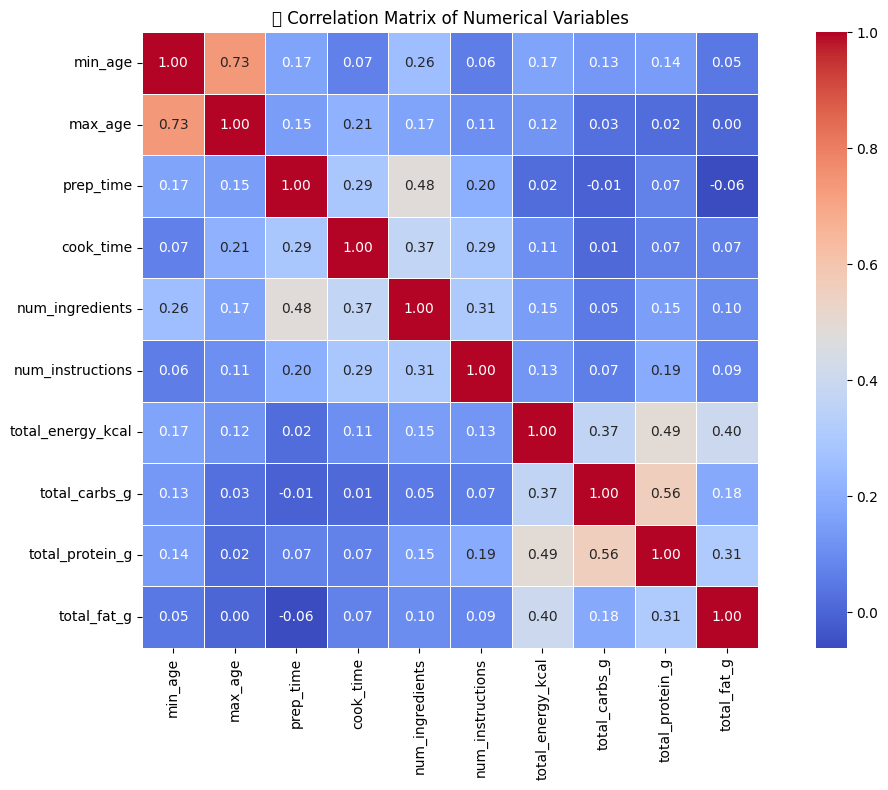

In [378]:
# Drop rows with NaNs in these columns (optional, depending on how you want to handle missing values)
corr_data = recipes_with_nutrition[numerical_column].dropna()

# Compute the correlation matrix
corr_matrix = corr_data.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=0.5)
plt.title("📊 Correlation Matrix of Numerical Variables")
plt.tight_layout()
plt.show()

In [379]:
recipes_with_nutrition.columns.to_list()

['name',
 'ingredients',
 'instructions',
 'min_age',
 'max_age',
 'texture',
 'prep_time',
 'cook_time',
 'serving',
 'recipe_link',
 'credibility',
 'image_link',
 'difficulty',
 'meal_type',
 'description',
 'tips',
 'hypoallergenic',
 'origin_id',
 'choking_hazards',
 'recipe_id',
 'prep_time_missing',
 'cook_time_missing',
 'meal_type_missing',
 'texture_missing',
 'min_age_missing',
 'max_age_missing',
 'num_ingredients',
 'num_instructions',
 'difficulty_encoded',
 'texture_encoded',
 'meal_type_encoded',
 'meal_type_mapped',
 'meal_type_mapped_encoded',
 'total_energy_kcal',
 'total_carbs_g',
 'total_protein_g',
 'total_fat_g',
 'final_micronutrients',
 'nutrition_id',
 'fat']

### 4.1.1 Observation
# 📊 Correlation Matrix Observations (in Table Format)

| Variable Pair                      | Correlation | Strength         | Interpretation                                                                 |
|------------------------------------|-------------|------------------|---------------------------------------------------------------------------------|
| `min_age` vs `max_age`             | 0.73        | Strong Positive  | Recipes for older children are often suitable for younger ones too.            |
| `prep_time` vs `num_ingredients`   | 0.48        | Moderate Positive| More ingredients usually require longer preparation.                           |
| `cook_time` vs `num_ingredients`   | 0.37        | Weak–Moderate    | More ingredients might slightly increase cooking time.                         |
| `num_ingredients` vs `num_instructions` | 0.31    | Weak Positive    | More ingredients often mean more steps, but not always.                        |
| `num_instructions` vs `prep_time`  | 0.20        | Weak Positive    | Longer prep might lead to more instruction steps.                              |
| `num_instructions` vs `cook_time`  | 0.29        | Weak Positive    | Slight tendency for longer cook time to have more steps.                       |
| `num_instructions` vs others       | ≤ 0.31      | Weak             | Instruction count is relatively independent.                                   |
| `total_energy_kcal` vs `protein`   | 0.49        | Moderate Positive| Protein contributes significantly to calorie content.                          |
| `total_energy_kcal` vs `fat`       | 0.40        | Moderate Positive| Fat content also contributes to energy.                                        |
| `total_energy_kcal` vs `carbs`     | 0.37        | Moderate Positive| Carbohydrates impact energy moderately.                                        |
| `protein` vs `carbs`               | 0.56        | Moderate Positive| Recipes with more protein also tend to include more carbs.                     |
| `protein` vs `fat`                 | 0.32        | Weak–Moderate    | Fat and protein often appear together in recipes.                              |

---

## 🧠 Summary:
- **Macronutrients** (carbs, protein, fat) are interrelated and drive energy.
- **Ingredients count** is a better proxy for complexity than number of steps.
- **Instruction count** has weak or no strong correlation to time, age, or nutrition.


## 4.2 Prep Time

### 4.2.1 Multivariate Regression or Feature Importance

In [384]:
# Define encoded feature names
encoded_features = [
    'difficulty_encoded', 'texture_encoded', 'country_encoded',
    'region_encoded', 'category_name_encoded', 'meal_type_mapped_encoded',
    'num_ingredients', 'num_instructions'
]

target = 'prep_time'

country_encoded             0.299555
num_ingredients             0.283043
num_instructions            0.129352
category_name_encoded       0.069907
region_encoded              0.069182
texture_encoded             0.065470
meal_type_mapped_encoded    0.042473
difficulty_encoded          0.041018
dtype: float64


/tmp/ipython-input-385-2019212861.py:40: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


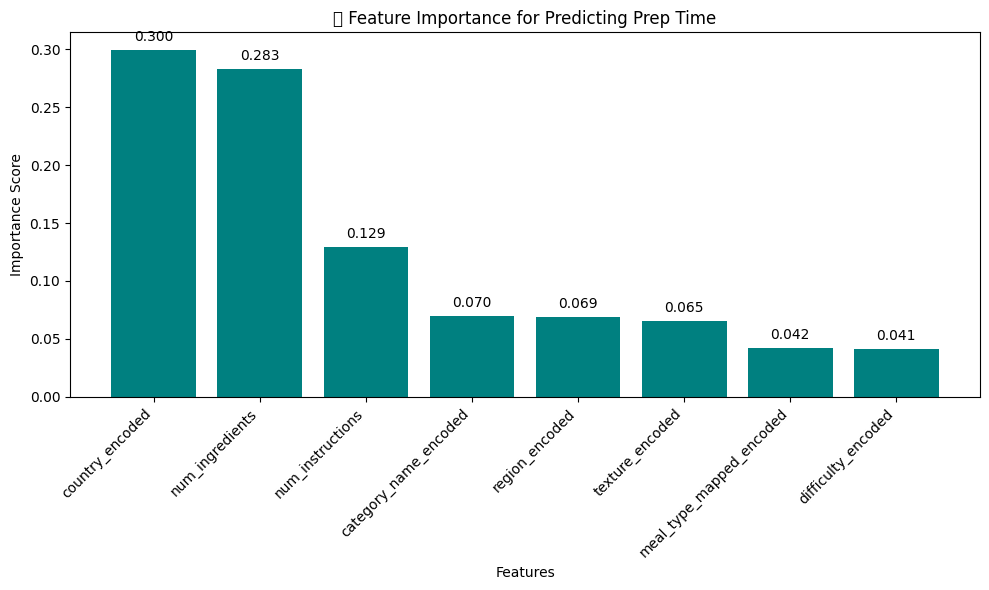

In [385]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import pandas as pd

# Drop rows where the target is missing
df = joined_df.dropna(subset=[target])

# Ensure all encoded features exist and are numeric
X = df[encoded_features]
y = df[target]

# Train the model
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Feature importance as Series
feature_importance = pd.Series(model.feature_importances_, index=encoded_features)
sorted_importance = feature_importance.sort_values(ascending=False)
print(sorted_importance)
# Plot with annotations
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_importance.index, sorted_importance.values, color='teal')
plt.title('📊 Feature Importance for Predicting Prep Time')
plt.ylabel('Importance Score')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')

# Add text labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2.0,
        yval + 0.005,
        f'{yval:.3f}',
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.tight_layout()
plt.show()


| Feature                  | Importance | Interpretation                          |
|--------------------------|------------|------------------------------------------|
| country_encoded          | 0.2996     | 🌍 Most influential feature              |
| num_ingredients          | 0.2830     | 🍽️ Very strong predictor                 |
| num_instructions         | 0.1294     | 🧾 Moderately important                  |
| category_name_encoded    | 0.0699     | 📂 Some impact                           |
| region_encoded           | 0.0692     | 🌐 Small impact                          |
| texture_encoded          | 0.0655     | 🧈 Small impact                          |
| meal_type_mapped_encoded | 0.0425     | 🍲 Relatively low impact                 |
| difficulty_encoded       | 0.0410     | 🧗 Lowest impact among listed features   |


### 4.2.2 Multicollinearity Check (Variance Inflation Factor - VIF)

In [386]:
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Drop rows with missing values in these features
vif_df = joined_df[encoded_features].dropna().copy()

# Scale the features (recommended)
scaler = StandardScaler()
vif_scaled = scaler.fit_transform(vif_df)

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = encoded_features  # ✅ Better column name
vif_data["VIF"] = [variance_inflation_factor(vif_scaled, i) for i in range(len(encoded_features))]

# Display VIF values
print("🔎 Variance Inflation Factor (VIF) for Each Feature:")
print(vif_data.sort_values(by="VIF", ascending=False).to_string(index=False))


🔎 Variance Inflation Factor (VIF) for Each Feature:
                 Feature      VIF
      difficulty_encoded 1.341721
        num_instructions 1.297127
         num_ingredients 1.180840
meal_type_mapped_encoded 1.171170
         texture_encoded 1.153981
          region_encoded 1.131773
         country_encoded 1.058599
   category_name_encoded 1.006889


/tmp/ipython-input-387-4235421477.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")
/tmp/ipython-input-387-4235421477.py:15: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


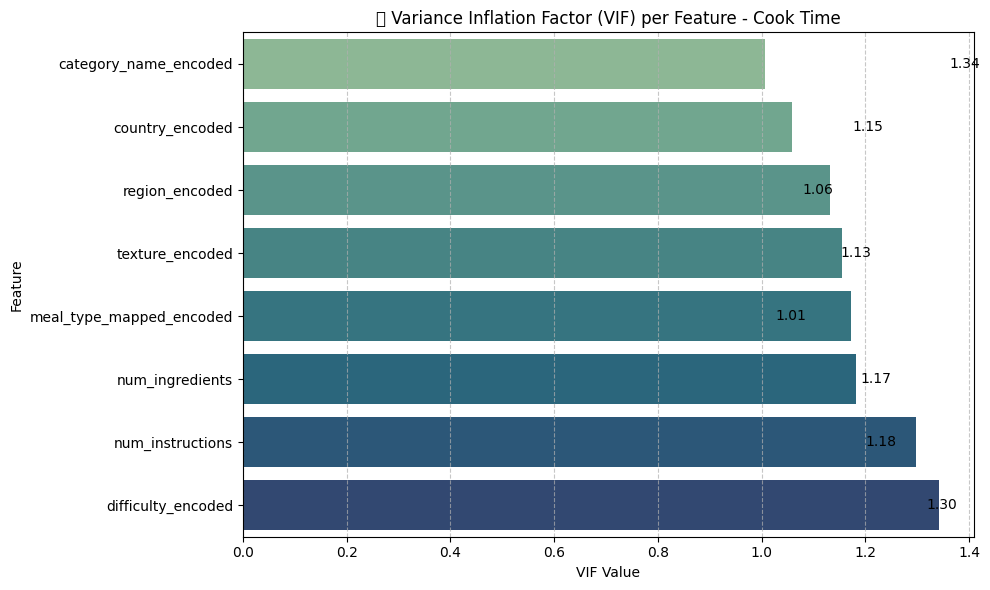

In [387]:
vif_data_sorted = vif_data.sort_values(by="VIF", ascending=True)

# Plot VIF bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")

# Add values on bars
for index, row in vif_data_sorted.iterrows():
    plt.text(row["VIF"] + 0.02, index, f'{row["VIF"]:.2f}', va='center')

plt.title("📌 Variance Inflation Factor (VIF) per Feature - Cook Time")
plt.xlabel("VIF Value")
plt.ylabel("Feature")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.2.3 Top Features Based on Mutual Information

In [388]:
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.preprocessing import StandardScaler
import pandas as pd

df_model = joined_df[encoded_features + [target]].dropna()

# Ensure all are numeric
df_model = df_model.apply(pd.to_numeric, errors='coerce').dropna()

X = df_model[encoded_features]
y = df_model[target]

# Scale features
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Ensure k is valid
k = min(5, X_scaled.shape[1])
selector = SelectKBest(score_func=mutual_info_regression, k=k)
X_selected = selector.fit_transform(X_scaled, y)

# Feature names and scores
selected_k_features = X.columns[selector.get_support()].tolist()
feature_scores = pd.Series(selector.scores_, index=X.columns).sort_values(ascending=False)

print("📌 Top Selected Features Based on Mutual Information:")
print(feature_scores.head(k))


📌 Top Selected Features Based on Mutual Information:
num_ingredients       0.216921
country_encoded       0.216813
region_encoded        0.124427
difficulty_encoded    0.102060
num_instructions      0.075014
dtype: float64


### 4.2.4 SHAP

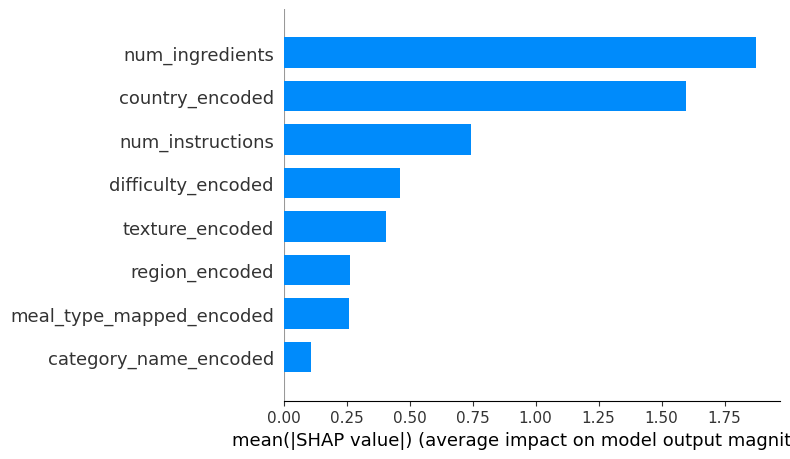

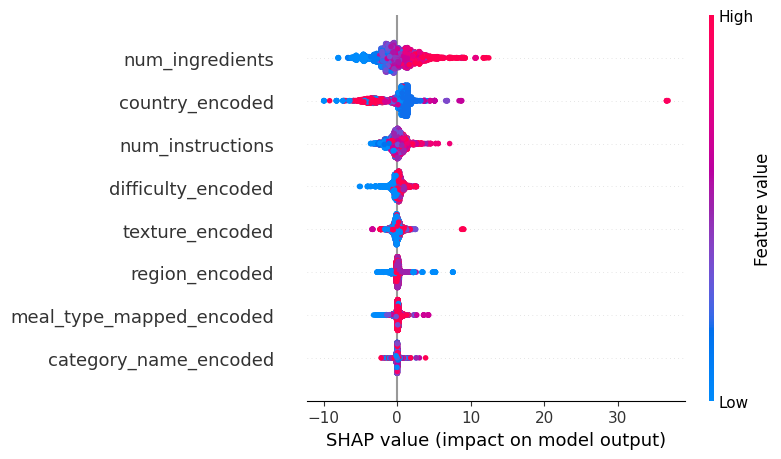

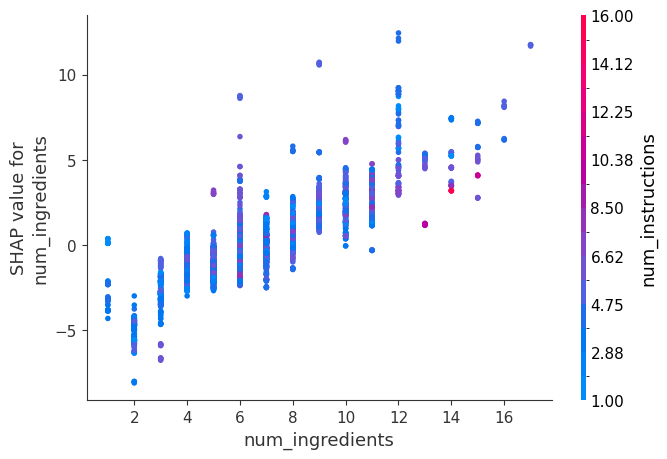

In [389]:
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

shap.summary_plot(shap_values, X, plot_type="bar")         # Global view
shap.summary_plot(shap_values, X)                          # Local + distribution
shap.dependence_plot("num_ingredients", shap_values, X)    # Specific feature


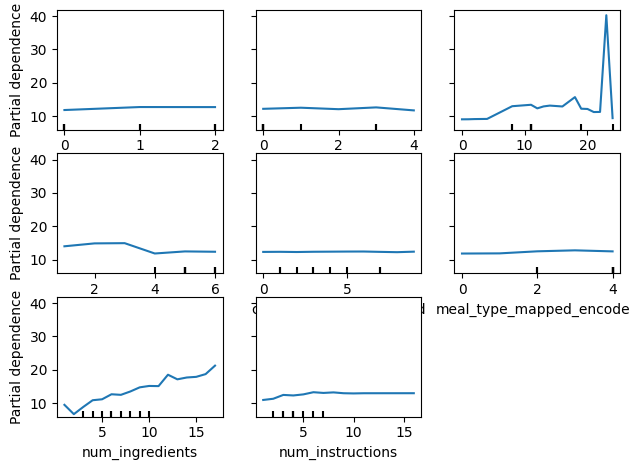

In [390]:
from sklearn.inspection import PartialDependenceDisplay

PartialDependenceDisplay.from_estimator(model, X, features=encoded_features)
plt.tight_layout()
plt.show()


### 4.2.5 Partial Dependence Display

/tmp/ipython-input-391-3121977310.py:18: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


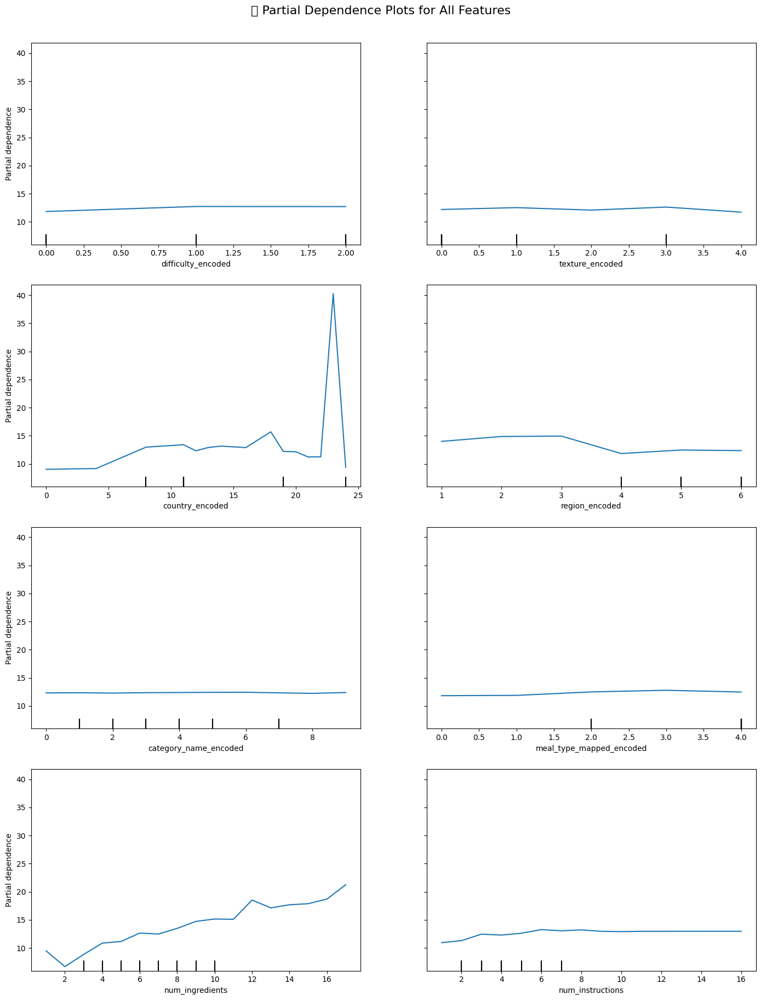

In [391]:
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Step 3: Plot PDP for all features (no figsize here!)
display = PartialDependenceDisplay.from_estimator(
    model,
    X,
    features=encoded_features,
    kind="average",
    n_cols=2  # layout for subplots
)

# Step 4: Adjust figure size separately using matplotlib
fig = plt.gcf()
fig.set_size_inches(14, 18)  # adjust width and height as needed

plt.suptitle("📊 Partial Dependence Plots for All Features", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

### 4.2.6 Pairwise Relationship

/tmp/ipython-input-392-3326740676.py:10: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


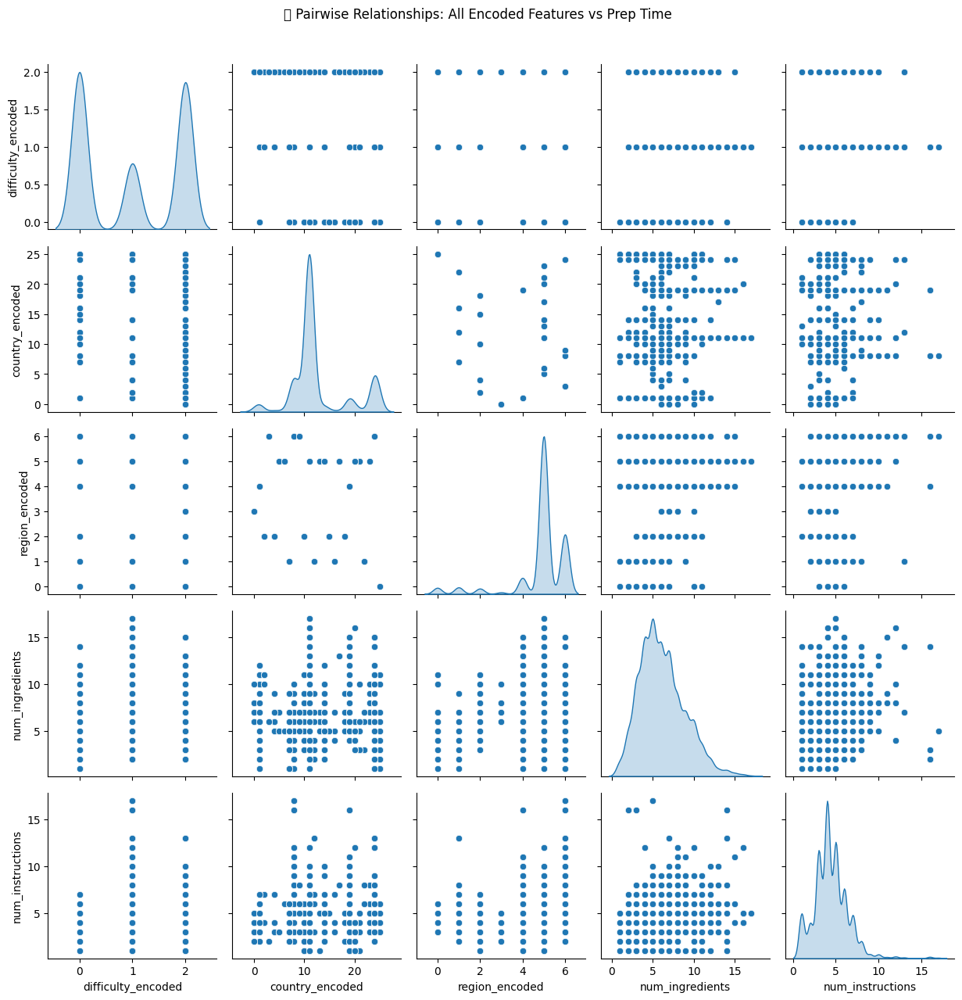

In [392]:
# Include target column
# columns_to_plot = encoded_features + target

# Drop rows with missing values in any of the selected columns
pairplot_df = joined_df[selected_k_features].dropna()

# Create the pairplot
sns.pairplot(pairplot_df, diag_kind='kde')
plt.suptitle("🔍 Pairwise Relationships: All Encoded Features vs Prep Time", y=1.02)
plt.tight_layout()
plt.show()

### 4.2.7 CONCLUSION

## 4.3 Cook Time

### 4.3.1 Multivariate Regression or Feature Importance

In [393]:
# Define encoded feature names
encoded_features = [
    'texture_encoded', 'country_encoded',
    'region_encoded', 'category_name_encoded', 'meal_type_mapped_encoded',
    'num_ingredients', 'num_instructions'
]

target = 'cook_time'

num_ingredients             0.330763
num_instructions            0.213219
category_name_encoded       0.132293
country_encoded             0.103254
region_encoded              0.093987
texture_encoded             0.078311
meal_type_mapped_encoded    0.048173
dtype: float64


/tmp/ipython-input-394-1998049833.py:40: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


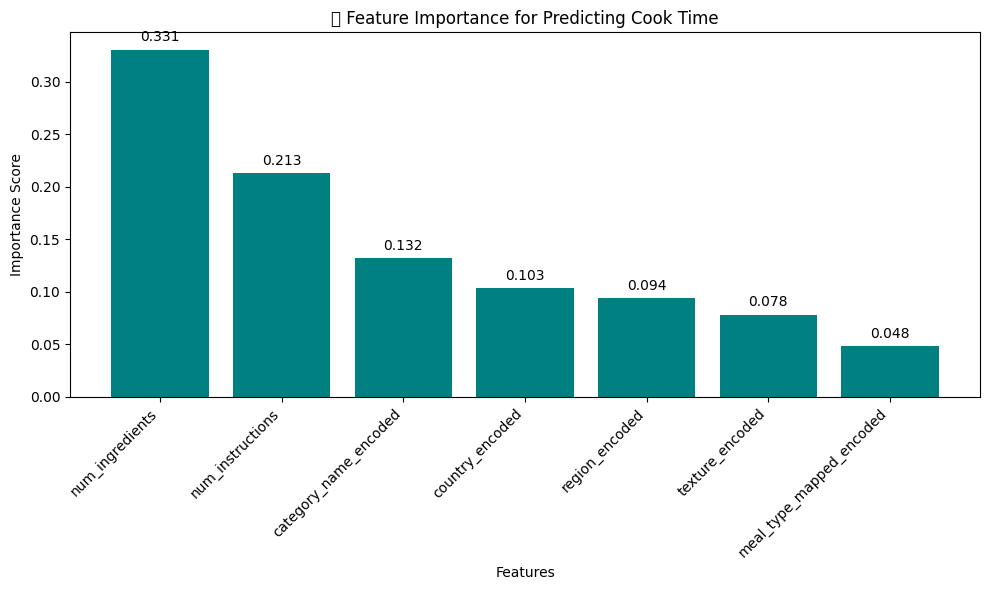

In [394]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import pandas as pd

# Drop rows where the target is missing
df = joined_df.dropna(subset=[target])

# Ensure all encoded features exist and are numeric
X = df[encoded_features]
y = df[target]

# Train the model
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Feature importance as Series
feature_importance = pd.Series(model.feature_importances_, index=encoded_features)
sorted_importance = feature_importance.sort_values(ascending=False)
print(sorted_importance)
# Plot with annotations
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_importance.index, sorted_importance.values, color='teal')
plt.title('📊 Feature Importance for Predicting Cook Time')
plt.ylabel('Importance Score')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')

# Add text labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2.0,
        yval + 0.005,
        f'{yval:.3f}',
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.3.2 Multicollinearity Check (Variance Inflation Factor - VIF)

In [395]:
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Drop rows with missing values in these features
vif_df = joined_df[encoded_features].dropna().copy()

# Scale the features (recommended)
scaler = StandardScaler()
vif_scaled = scaler.fit_transform(vif_df)

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = encoded_features  # ✅ Better column name
vif_data["VIF"] = [variance_inflation_factor(vif_scaled, i) for i in range(len(encoded_features))]

# Display VIF values
print("🔎 Variance Inflation Factor (VIF) for Each Feature:")
print(vif_data.sort_values(by="VIF", ascending=False).to_string(index=False))


🔎 Variance Inflation Factor (VIF) for Each Feature:
                 Feature      VIF
meal_type_mapped_encoded 1.166884
        num_instructions 1.145614
         num_ingredients 1.135203
          region_encoded 1.126652
         texture_encoded 1.117156
         country_encoded 1.040778
   category_name_encoded 1.006888


/tmp/ipython-input-396-4235421477.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")
/tmp/ipython-input-396-4235421477.py:15: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


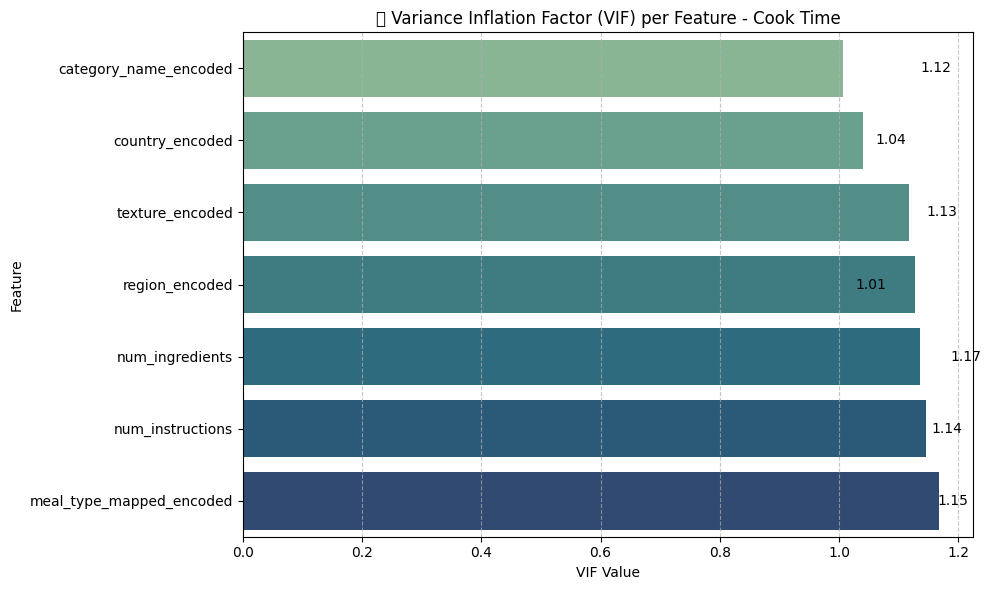

In [396]:
vif_data_sorted = vif_data.sort_values(by="VIF", ascending=True)

# Plot VIF bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")

# Add values on bars
for index, row in vif_data_sorted.iterrows():
    plt.text(row["VIF"] + 0.02, index, f'{row["VIF"]:.2f}', va='center')

plt.title("📌 Variance Inflation Factor (VIF) per Feature - Cook Time")
plt.xlabel("VIF Value")
plt.ylabel("Feature")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.3.3 Top Features Based on Mutual Information

In [397]:
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.preprocessing import StandardScaler
import pandas as pd

df_model = joined_df[encoded_features + [target]].dropna()

# Ensure all are numeric
df_model = df_model.apply(pd.to_numeric, errors='coerce').dropna()

X = df_model[encoded_features]
y = df_model[target]

# Scale features
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Ensure k is valid
k = min(5, X_scaled.shape[1])
selector = SelectKBest(score_func=mutual_info_regression, k=k)
X_selected = selector.fit_transform(X_scaled, y)

# Feature names and scores
selected_k_features = X.columns[selector.get_support()].tolist()
feature_scores = pd.Series(selector.scores_, index=X.columns).sort_values(ascending=False)

print("📌 Top Selected Features Based on Mutual Information:")
print(feature_scores.head(k))


📌 Top Selected Features Based on Mutual Information:
num_ingredients             0.333008
country_encoded             0.313167
region_encoded              0.220041
num_instructions            0.205581
meal_type_mapped_encoded    0.138833
dtype: float64


### 4.3.4 SHAP

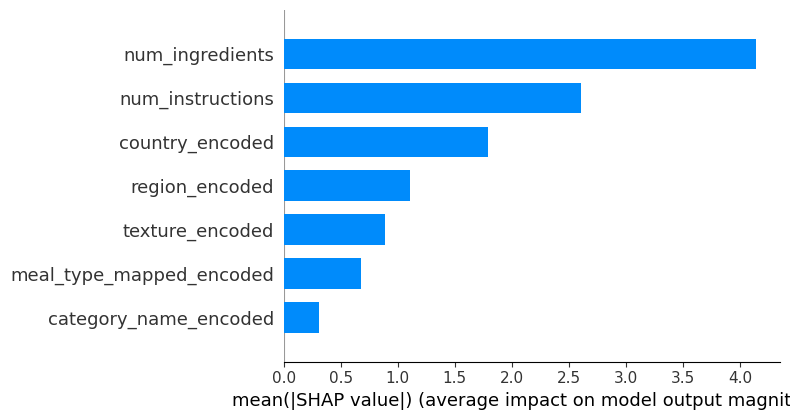

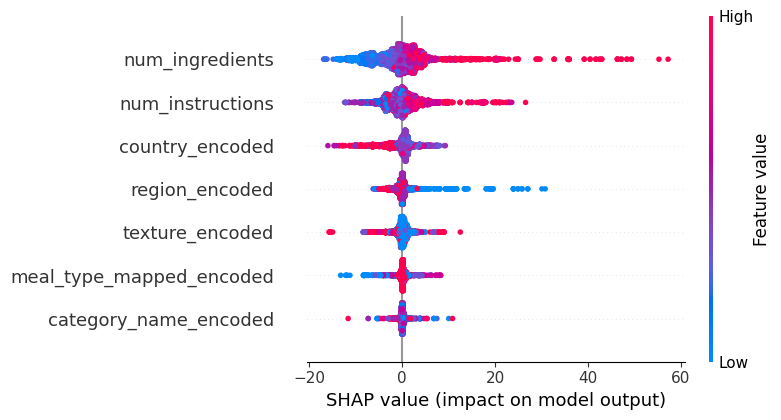

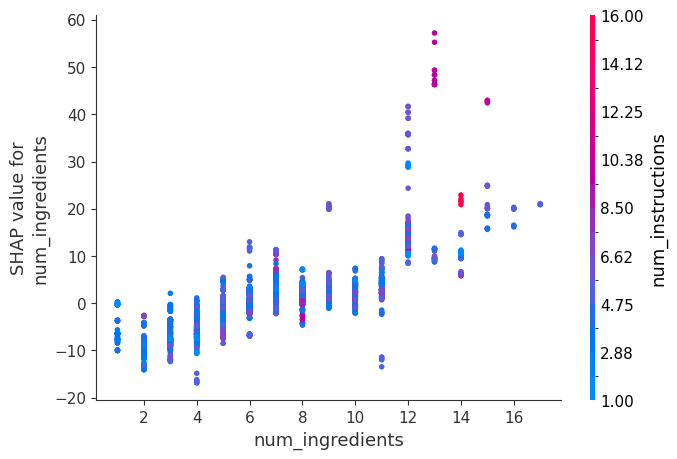

In [398]:
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

shap.summary_plot(shap_values, X, plot_type="bar")         # Global view
shap.summary_plot(shap_values, X)                          # Local + distribution
shap.dependence_plot("num_ingredients", shap_values, X)    # Specific feature


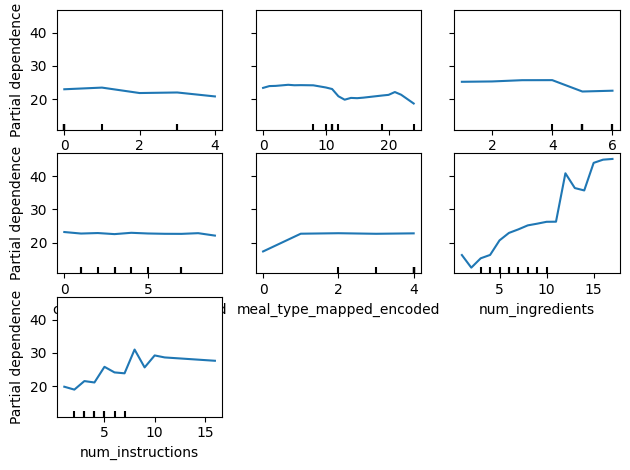

In [399]:
from sklearn.inspection import PartialDependenceDisplay

PartialDependenceDisplay.from_estimator(model, X, features=encoded_features)
plt.tight_layout()
plt.show()


### 4.3.5 Partial Dependence Display

/tmp/ipython-input-400-3121977310.py:18: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


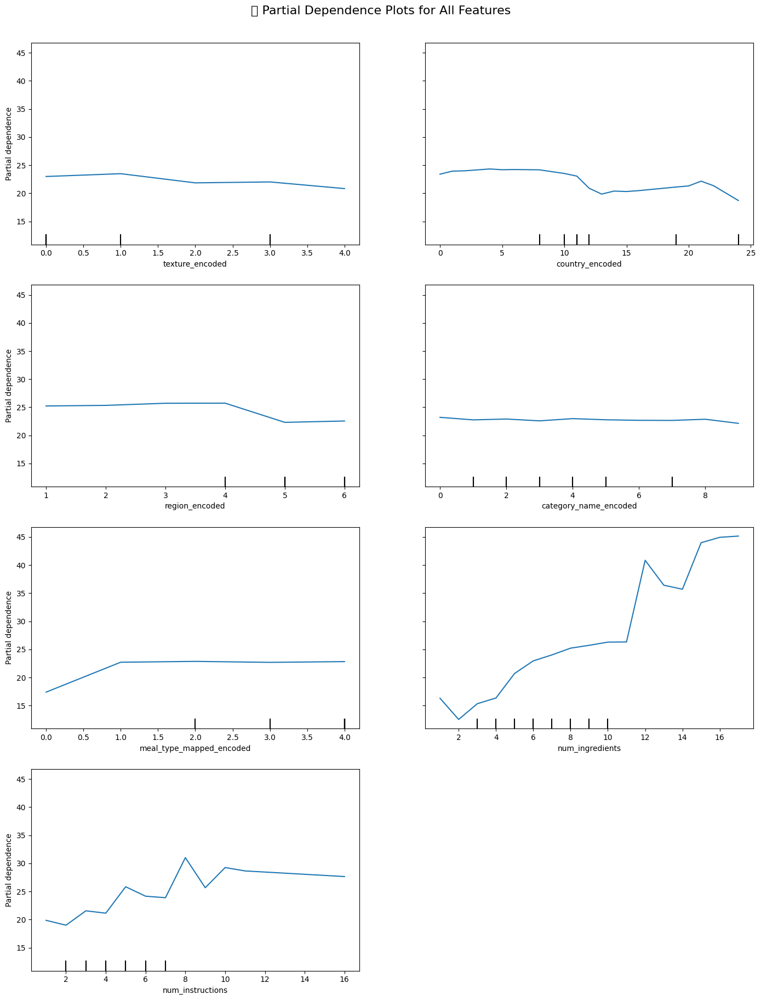

In [400]:
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Step 3: Plot PDP for all features (no figsize here!)
display = PartialDependenceDisplay.from_estimator(
    model,
    X,
    features=encoded_features,
    kind="average",
    n_cols=2  # layout for subplots
)

# Step 4: Adjust figure size separately using matplotlib
fig = plt.gcf()
fig.set_size_inches(14, 18)  # adjust width and height as needed

plt.suptitle("📊 Partial Dependence Plots for All Features", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

### 4.3.6 Pairwise Relationship

/tmp/ipython-input-401-3326740676.py:10: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


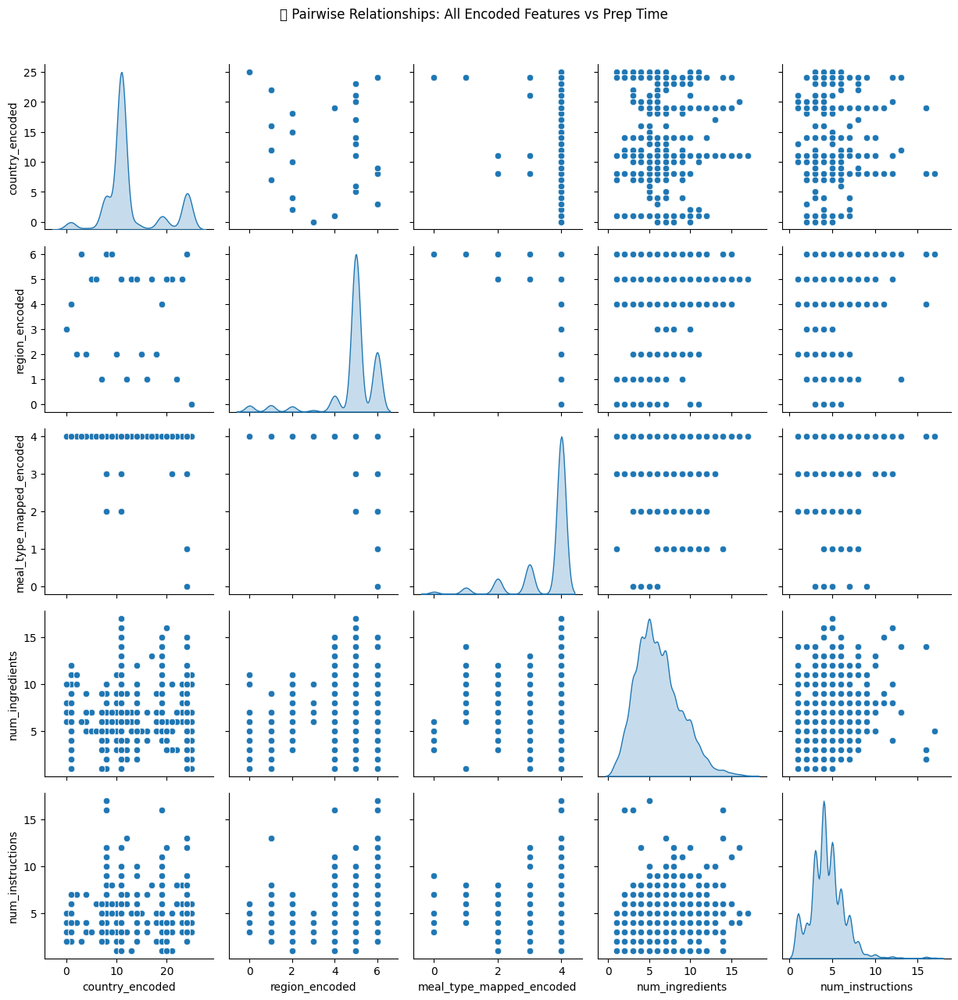

In [401]:
# Include target column
# columns_to_plot = encoded_features + target

# Drop rows with missing values in any of the selected columns
pairplot_df = joined_df[selected_k_features].dropna()

# Create the pairplot
sns.pairplot(pairplot_df, diag_kind='kde')
plt.suptitle("🔍 Pairwise Relationships: All Encoded Features vs Prep Time", y=1.02)
plt.tight_layout()
plt.show()

### 4.3.7 CONCLUSION

## 4.4 Texture

### 4.4.1 Multivariate Regression or Feature Importance

In [437]:
# Define encoded feature names
encoded_features = [
    'difficulty_encoded', 'country_encoded',
    'region_encoded',  'meal_type_mapped_encoded',
    'num_ingredients', 'num_instructions'
]

target = 'texture'

num_ingredients             0.240017
num_instructions            0.218803
difficulty_encoded          0.193275
country_encoded             0.181982
region_encoded              0.090742
meal_type_mapped_encoded    0.075182
dtype: float64


/tmp/ipython-input-438-902391691.py:40: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


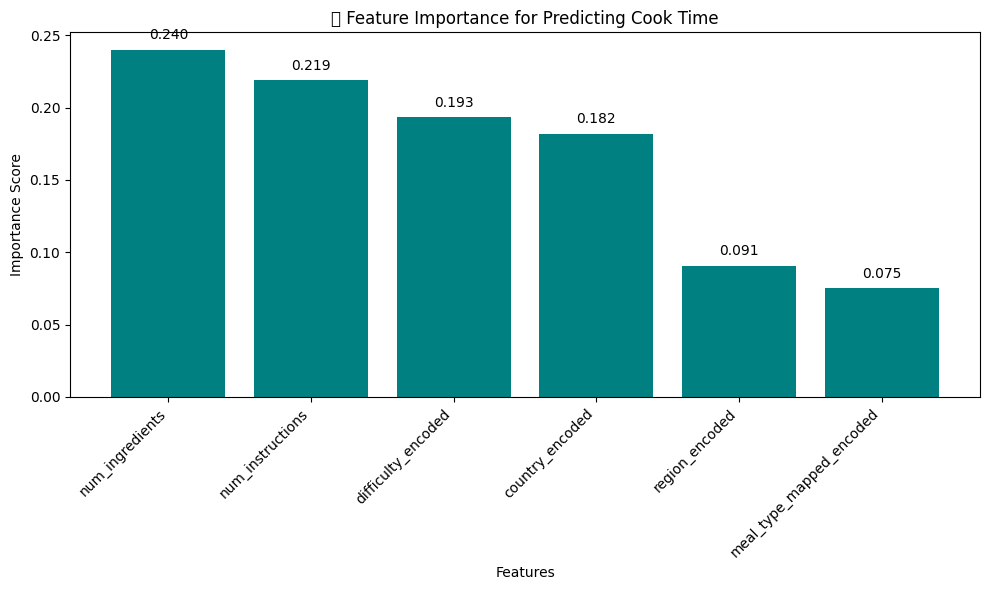

In [438]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import pandas as pd

# Drop rows where the target is missing
df = joined_df.dropna(subset=[target])

# Ensure all encoded features exist and are numeric
X = df[encoded_features]
y = df['texture_encoded']

# Train the model
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Feature importance as Series
feature_importance = pd.Series(model.feature_importances_, index=encoded_features)
sorted_importance = feature_importance.sort_values(ascending=False)
print(sorted_importance)
# Plot with annotations
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_importance.index, sorted_importance.values, color='teal')
plt.title('📊 Feature Importance for Predicting Cook Time')
plt.ylabel('Importance Score')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')

# Add text labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2.0,
        yval + 0.005,
        f'{yval:.3f}',
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.4.2 Multicollinearity Check (Variance Inflation Factor - VIF)

In [439]:
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Drop rows with missing values in these features
vif_df = joined_df[encoded_features].dropna().copy()

# Scale the features (recommended)
scaler = StandardScaler()
vif_scaled = scaler.fit_transform(vif_df)

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = encoded_features  # ✅ Better column name
vif_data["VIF"] = [variance_inflation_factor(vif_scaled, i) for i in range(len(encoded_features))]

# Display VIF values
print("🔎 Variance Inflation Factor (VIF) for Each Feature:")
print(vif_data.sort_values(by="VIF", ascending=False).to_string(index=False))


🔎 Variance Inflation Factor (VIF) for Each Feature:
                 Feature      VIF
      difficulty_encoded 1.298879
        num_instructions 1.290827
meal_type_mapped_encoded 1.160821
         num_ingredients 1.146358
          region_encoded 1.125572
         country_encoded 1.056562


/tmp/ipython-input-440-4235421477.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")
/tmp/ipython-input-440-4235421477.py:15: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


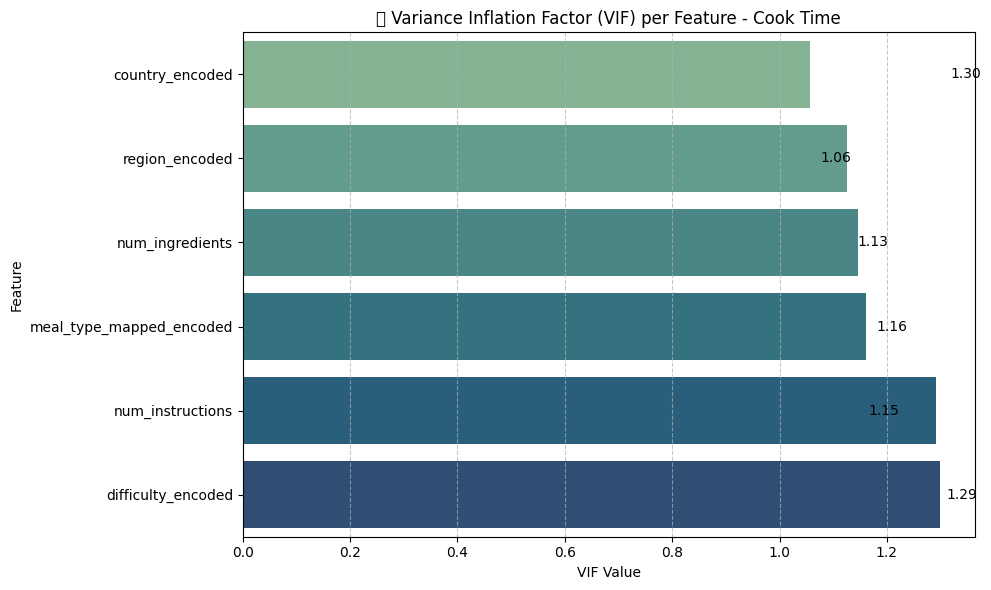

In [440]:
vif_data_sorted = vif_data.sort_values(by="VIF", ascending=True)

# Plot VIF bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")

# Add values on bars
for index, row in vif_data_sorted.iterrows():
    plt.text(row["VIF"] + 0.02, index, f'{row["VIF"]:.2f}', va='center')

plt.title("📌 Variance Inflation Factor (VIF) per Feature - Cook Time")
plt.xlabel("VIF Value")
plt.ylabel("Feature")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.4.3 Top Features Based on Mutual Information

In [445]:
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.preprocessing import StandardScaler
import pandas as pd

df_model = joined_df[encoded_features + ['texture_encoded']].dropna()

# Ensure all are numeric
df_model = df_model.apply(pd.to_numeric, errors='coerce').dropna()

X = df_model[encoded_features]
y = df_model['texture_encoded']

# Scale features
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Ensure k is valid
k = min(5, X_scaled.shape[1])
selector = SelectKBest(score_func=mutual_info_regression, k=k)
X_selected = selector.fit_transform(X_scaled, y)

# Feature names and scores
selected_k_features = X.columns[selector.get_support()].tolist()
feature_scores = pd.Series(selector.scores_, index=X.columns).sort_values(ascending=False)

print("📌 Top Selected Features Based on Mutual Information:")
print(feature_scores.head(k))


📌 Top Selected Features Based on Mutual Information:
num_ingredients       0.116693
difficulty_encoded    0.111047
country_encoded       0.093610
region_encoded        0.062188
num_instructions      0.056429
dtype: float64


### 4.4.4 SHAP

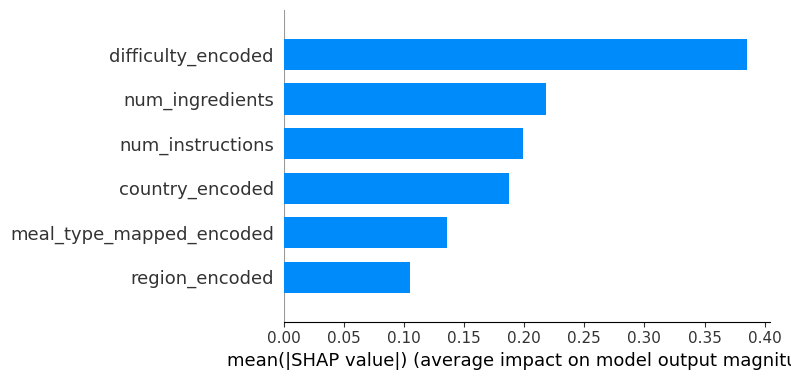

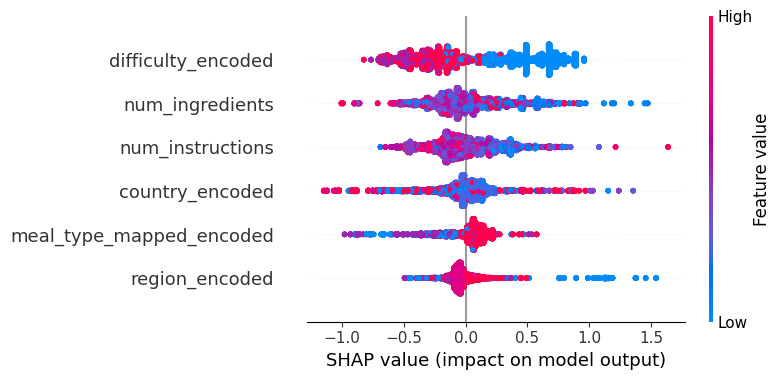

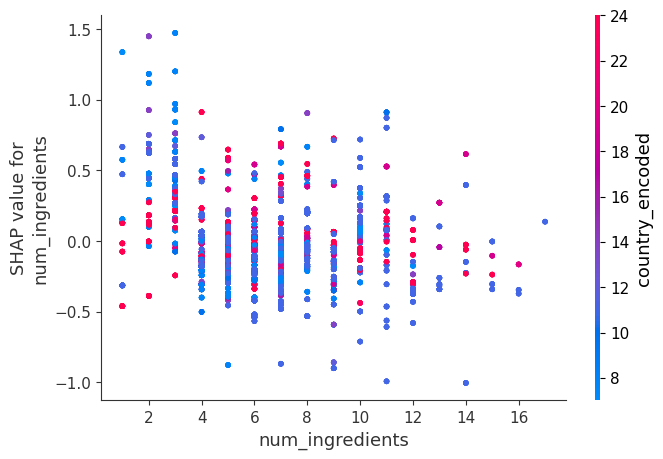

In [446]:
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

shap.summary_plot(shap_values, X, plot_type="bar")         # Global view
shap.summary_plot(shap_values, X)                          # Local + distribution
shap.dependence_plot("num_ingredients", shap_values, X)    # Specific feature


### 4.4.5 Partial Dependence Display

/tmp/ipython-input-447-3121977310.py:18: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


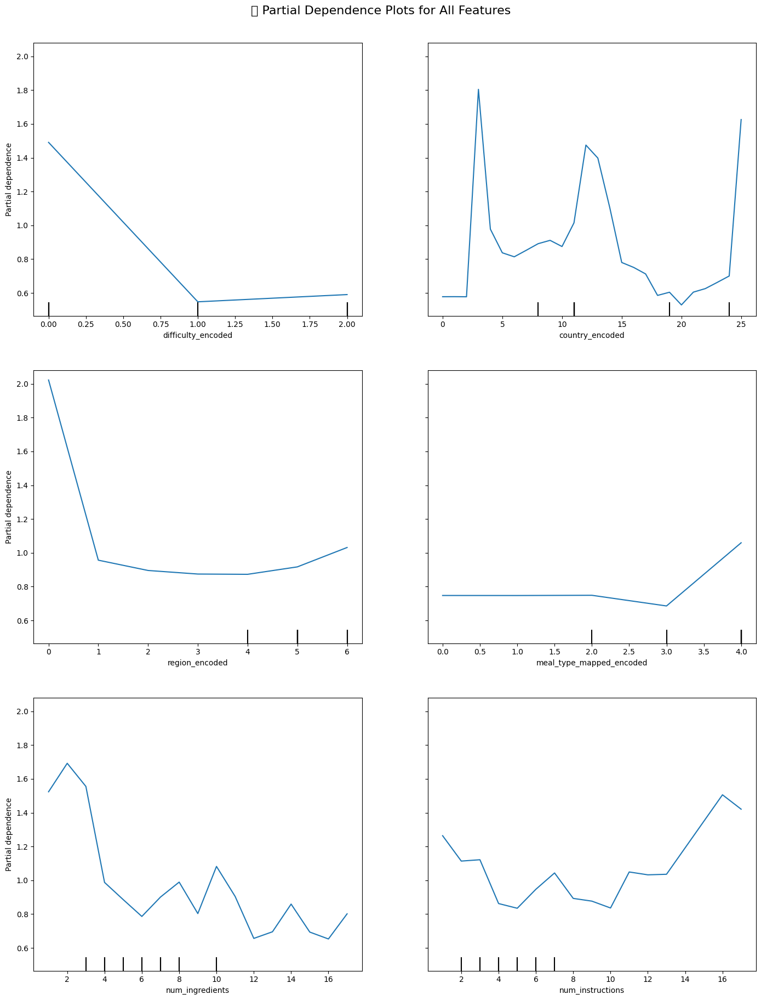

In [447]:
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Step 3: Plot PDP for all features (no figsize here!)
display = PartialDependenceDisplay.from_estimator(
    model,
    X,
    features=encoded_features,
    kind="average",
    n_cols=2  # layout for subplots
)

# Step 4: Adjust figure size separately using matplotlib
fig = plt.gcf()
fig.set_size_inches(14, 18)  # adjust width and height as needed

plt.suptitle("📊 Partial Dependence Plots for All Features", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

### 4.4.6 Pairwise Relationship

/tmp/ipython-input-448-3326740676.py:10: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


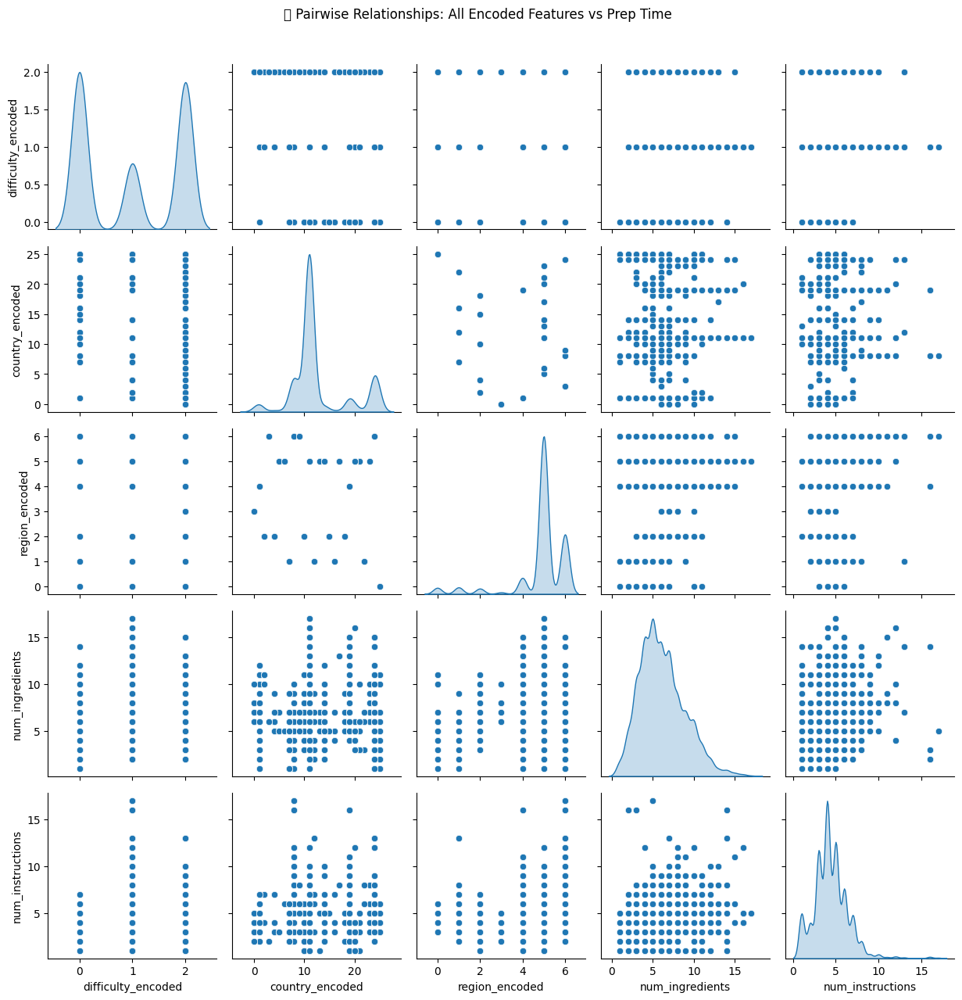

In [448]:
# Include target column
# columns_to_plot = encoded_features + target

# Drop rows with missing values in any of the selected columns
pairplot_df = joined_df[selected_k_features].dropna()

# Create the pairplot
sns.pairplot(pairplot_df, diag_kind='kde')
plt.suptitle("🔍 Pairwise Relationships: All Encoded Features vs Prep Time", y=1.02)
plt.tight_layout()
plt.show()

### 4.4.7 CONCLUSION

## 4.5 Meal Type

### 4.5.1 Multivariate Regression or Feature Importance

In [ ]:
# Define encoded feature names
encoded_features = [
    'difficulty_encoded', 'texture_encoded', 'country_encoded',
    'region_encoded', 'category_name_encoded', 'meal_type_mapped_encoded',
    'num_ingredients', 'num_instructions'
]

target = 'meal_type'

num_ingredients             0.330763
num_instructions            0.213219
category_name_encoded       0.132293
country_encoded             0.103254
region_encoded              0.093987
texture_encoded             0.078311
meal_type_mapped_encoded    0.048173
dtype: float64


/tmp/ipython-input-326-1236767647.py:49: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


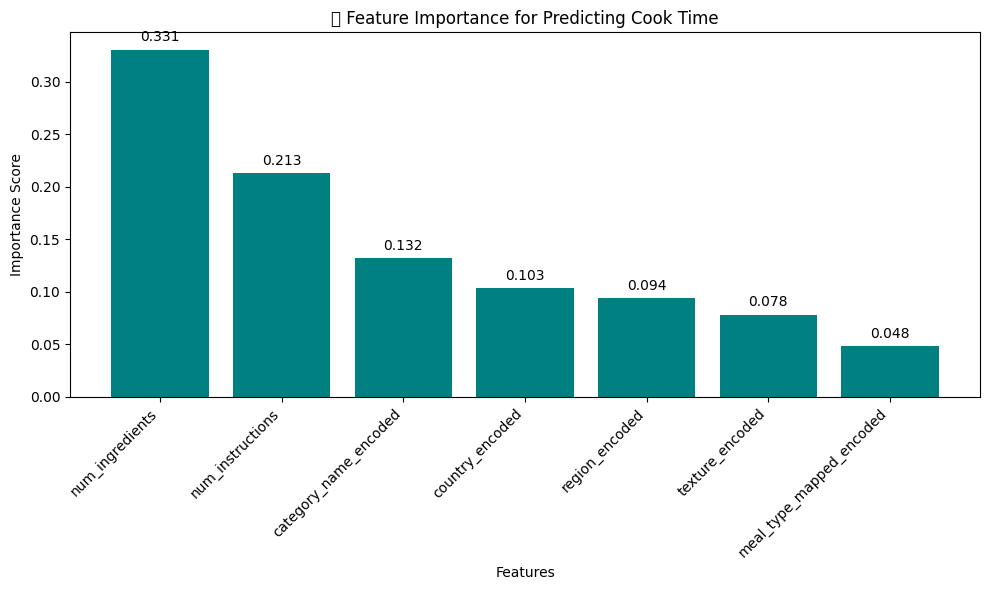

In [ ]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import pandas as pd

# Drop rows where the target is missing
df = joined_df.dropna(subset=[target])

# Ensure all encoded features exist and are numeric
X = df[encoded_features]
y = df[target]

# Train the model
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Feature importance as Series
feature_importance = pd.Series(model.feature_importances_, index=encoded_features)
sorted_importance = feature_importance.sort_values(ascending=False)
print(sorted_importance)
# Plot with annotations
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_importance.index, sorted_importance.values, color='teal')
plt.title('📊 Feature Importance for Predicting Cook Time')
plt.ylabel('Importance Score')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')

# Add text labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2.0,
        yval + 0.005,
        f'{yval:.3f}',
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.5.2 Multicollinearity Check (Variance Inflation Factor - VIF)

In [ ]:
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Drop rows with missing values in these features
vif_df = joined_df[encoded_features].dropna().copy()

# Scale the features (recommended)
scaler = StandardScaler()
vif_scaled = scaler.fit_transform(vif_df)

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = encoded_features  # ✅ Better column name
vif_data["VIF"] = [variance_inflation_factor(vif_scaled, i) for i in range(len(encoded_features))]

# Display VIF values
print("🔎 Variance Inflation Factor (VIF) for Each Feature:")
print(vif_data.sort_values(by="VIF", ascending=False).to_string(index=False))


🔎 Variance Inflation Factor (VIF) for Each Feature:
                 Feature      VIF
meal_type_mapped_encoded 1.166884
        num_instructions 1.145614
         num_ingredients 1.135203
          region_encoded 1.126652
         texture_encoded 1.117156
         country_encoded 1.040778
   category_name_encoded 1.006888


/tmp/ipython-input-328-4235421477.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")
/tmp/ipython-input-328-4235421477.py:15: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


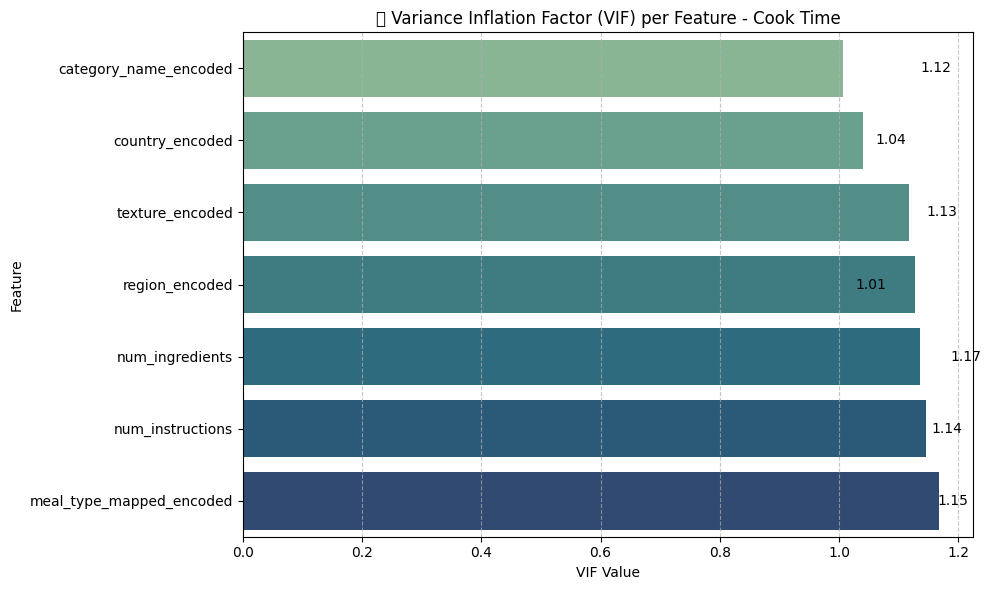

In [ ]:
vif_data_sorted = vif_data.sort_values(by="VIF", ascending=True)

# Plot VIF bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")

# Add values on bars
for index, row in vif_data_sorted.iterrows():
    plt.text(row["VIF"] + 0.02, index, f'{row["VIF"]:.2f}', va='center')

plt.title("📌 Variance Inflation Factor (VIF) per Feature - Cook Time")
plt.xlabel("VIF Value")
plt.ylabel("Feature")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.5.3 Top Features Based on Mutual Information

In [ ]:
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.preprocessing import StandardScaler
import pandas as pd

df_model = joined_df[encoded_features + [target]].dropna()

# Ensure all are numeric
df_model = df_model.apply(pd.to_numeric, errors='coerce').dropna()

X = df_model[encoded_features]
y = df_model[target]

# Scale features
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Ensure k is valid
k = min(5, X_scaled.shape[1])
selector = SelectKBest(score_func=mutual_info_regression, k=k)
X_selected = selector.fit_transform(X_scaled, y)

# Feature names and scores
selected_k_features = X.columns[selector.get_support()].tolist()
feature_scores = pd.Series(selector.scores_, index=X.columns).sort_values(ascending=False)

print("📌 Top Selected Features Based on Mutual Information:")
print(feature_scores.head(k))


📌 Top Selected Features Based on Mutual Information:
num_ingredients             0.325141
country_encoded             0.318672
region_encoded              0.213298
num_instructions            0.192212
meal_type_mapped_encoded    0.116515
dtype: float64


### 4.5.4 SHAP

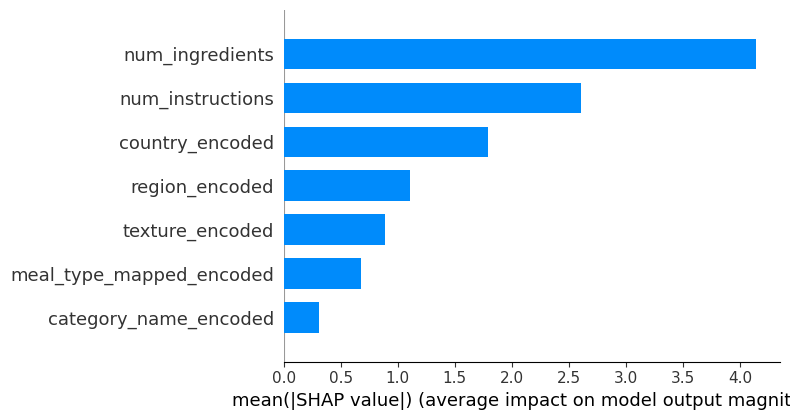

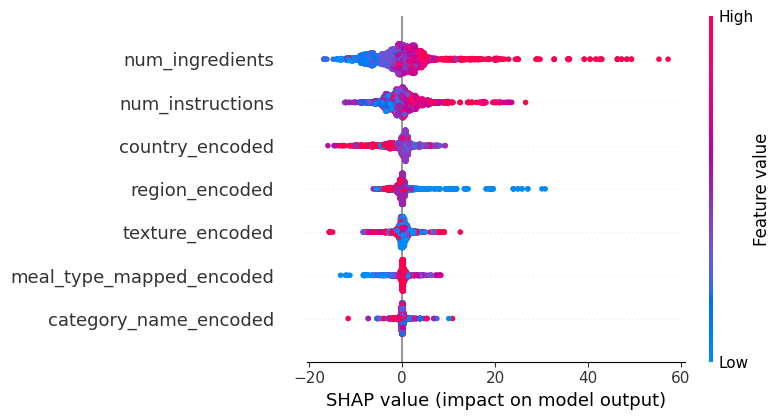

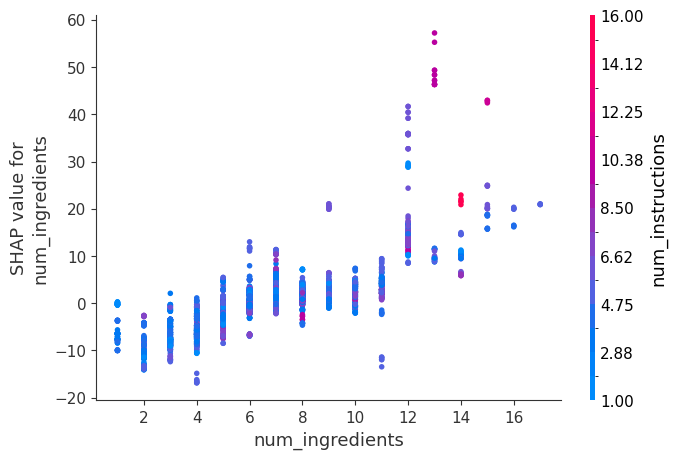

In [ ]:
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

shap.summary_plot(shap_values, X, plot_type="bar")         # Global view
shap.summary_plot(shap_values, X)                          # Local + distribution
shap.dependence_plot("num_ingredients", shap_values, X)    # Specific feature


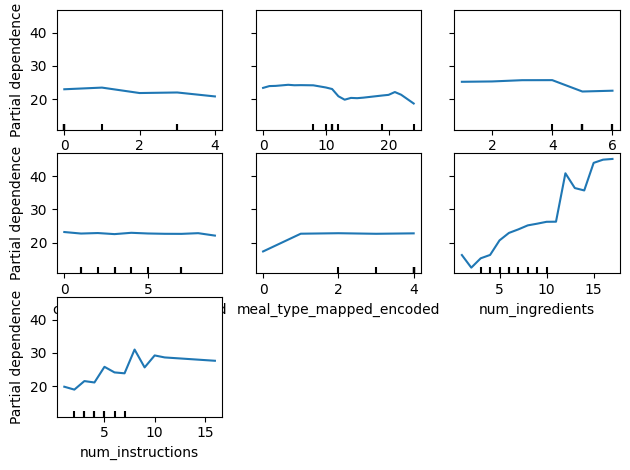

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

PartialDependenceDisplay.from_estimator(model, X, features=encoded_features)
plt.tight_layout()
plt.show()


### 4.5.5 Partial Dependence Display

/tmp/ipython-input-331-3121977310.py:18: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


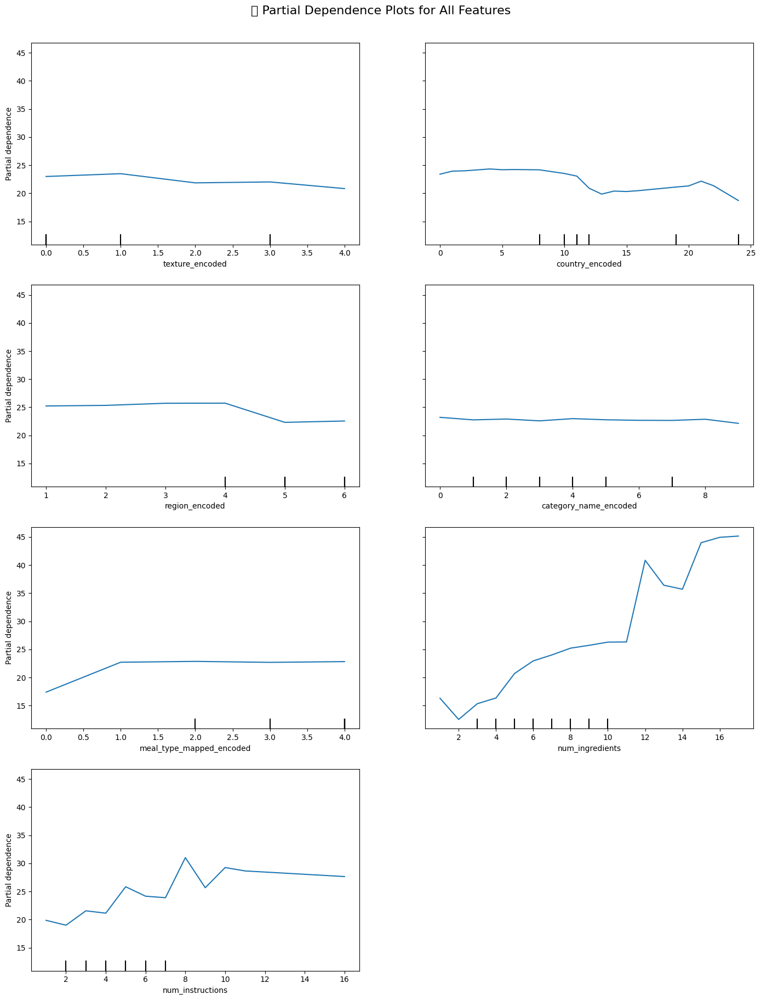

In [ ]:
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Step 3: Plot PDP for all features (no figsize here!)
display = PartialDependenceDisplay.from_estimator(
    model,
    X,
    features=encoded_features,
    kind="average",
    n_cols=2  # layout for subplots
)

# Step 4: Adjust figure size separately using matplotlib
fig = plt.gcf()
fig.set_size_inches(14, 18)  # adjust width and height as needed

plt.suptitle("📊 Partial Dependence Plots for All Features", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

### 4.5.6 Pairwise Relationship

/tmp/ipython-input-334-3326740676.py:10: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


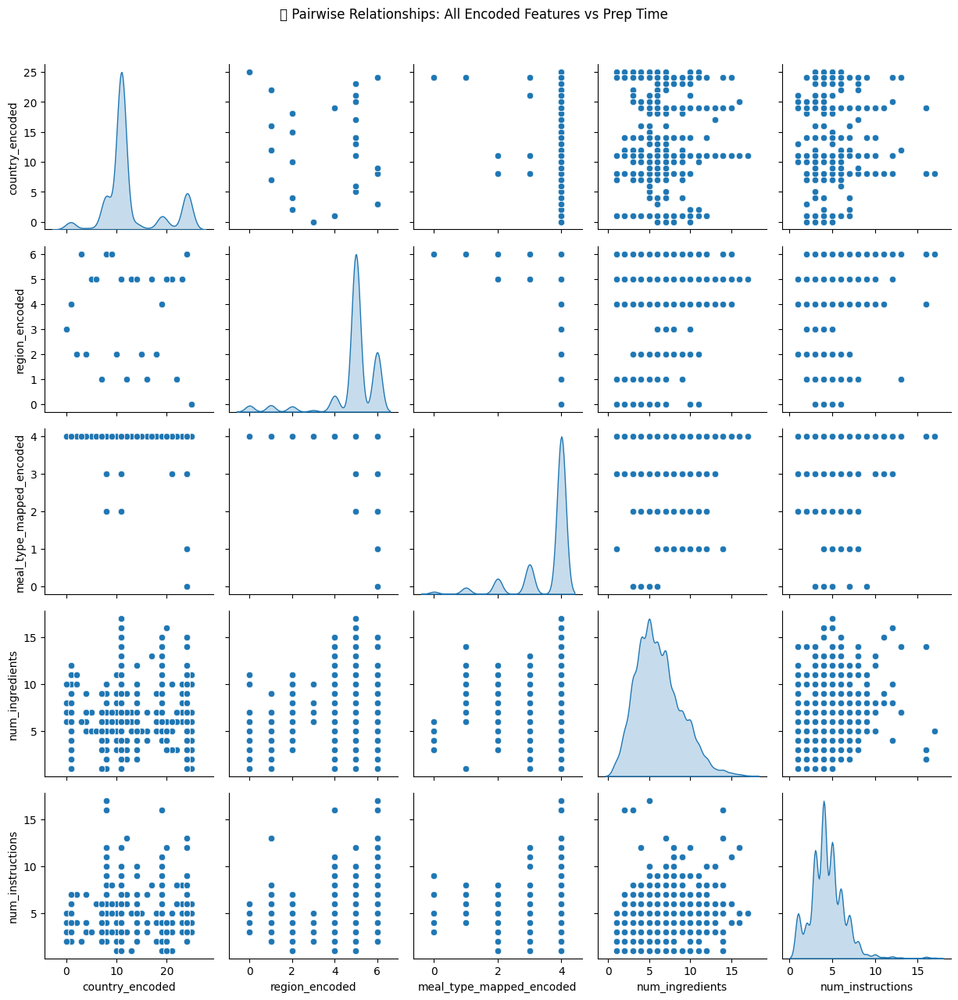

In [ ]:
# Include target column
# columns_to_plot = encoded_features + target

# Drop rows with missing values in any of the selected columns
pairplot_df = joined_df[selected_k_features].dropna()

# Create the pairplot
sns.pairplot(pairplot_df, diag_kind='kde')
plt.suptitle("🔍 Pairwise Relationships: All Encoded Features vs Prep Time", y=1.02)
plt.tight_layout()
plt.show()

### 4.5.7 CONCLUSION

## 4.6 Min Age

### 4.6.1 Multivariate Regression or Feature Importance

In [461]:
# Define encoded feature names
encoded_features = [
    'difficulty_encoded', 'texture_encoded', 'country_encoded',
    'region_encoded', 'category_name_encoded', 'meal_type_mapped_encoded',
     'num_instructions'
]

target = 'min_age'

meal_type_mapped_encoded    0.256300
region_encoded              0.202312
num_instructions            0.152456
texture_encoded             0.144046
country_encoded             0.098949
category_name_encoded       0.090214
difficulty_encoded          0.055723
dtype: float64


/tmp/ipython-input-462-1998049833.py:40: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


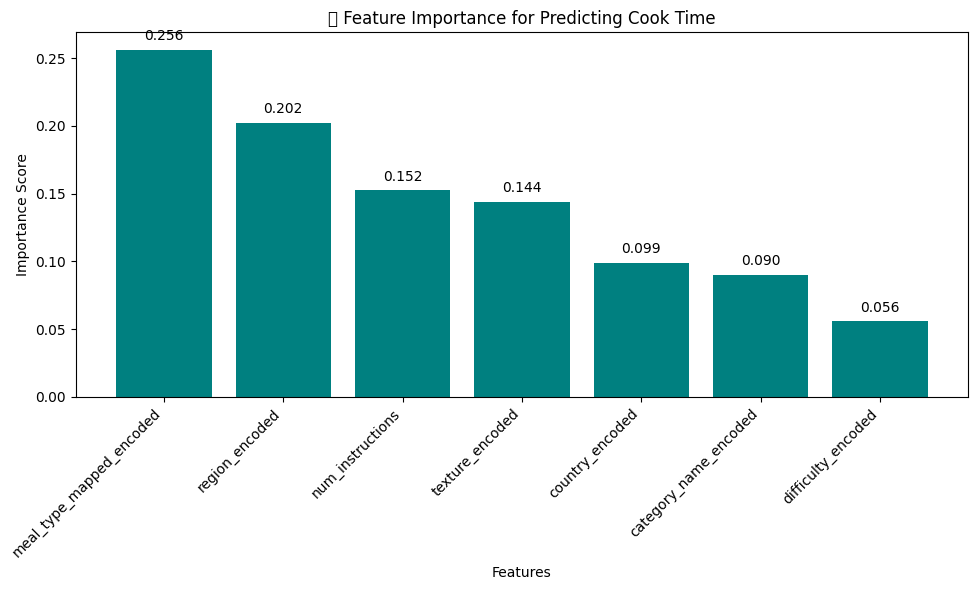

In [462]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import pandas as pd

# Drop rows where the target is missing
df = joined_df.dropna(subset=[target])

# Ensure all encoded features exist and are numeric
X = df[encoded_features]
y = df[target]

# Train the model
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Feature importance as Series
feature_importance = pd.Series(model.feature_importances_, index=encoded_features)
sorted_importance = feature_importance.sort_values(ascending=False)
print(sorted_importance)
# Plot with annotations
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_importance.index, sorted_importance.values, color='teal')
plt.title('📊 Feature Importance for Predicting Cook Time')
plt.ylabel('Importance Score')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')

# Add text labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2.0,
        yval + 0.005,
        f'{yval:.3f}',
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.6.2 Multicollinearity Check (Variance Inflation Factor - VIF)

In [463]:
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Drop rows with missing values in these features
vif_df = joined_df[encoded_features].dropna().copy()

# Scale the features (recommended)
scaler = StandardScaler()
vif_scaled = scaler.fit_transform(vif_df)

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = encoded_features  # ✅ Better column name
vif_data["VIF"] = [variance_inflation_factor(vif_scaled, i) for i in range(len(encoded_features))]

# Display VIF values
print("🔎 Variance Inflation Factor (VIF) for Each Feature:")
print(vif_data.sort_values(by="VIF", ascending=False).to_string(index=False))


🔎 Variance Inflation Factor (VIF) for Each Feature:
                 Feature      VIF
      difficulty_encoded 1.289866
        num_instructions 1.270745
meal_type_mapped_encoded 1.170998
          region_encoded 1.131417
         texture_encoded 1.125601
         country_encoded 1.057724
   category_name_encoded 1.002646


/tmp/ipython-input-464-4235421477.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")
/tmp/ipython-input-464-4235421477.py:15: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


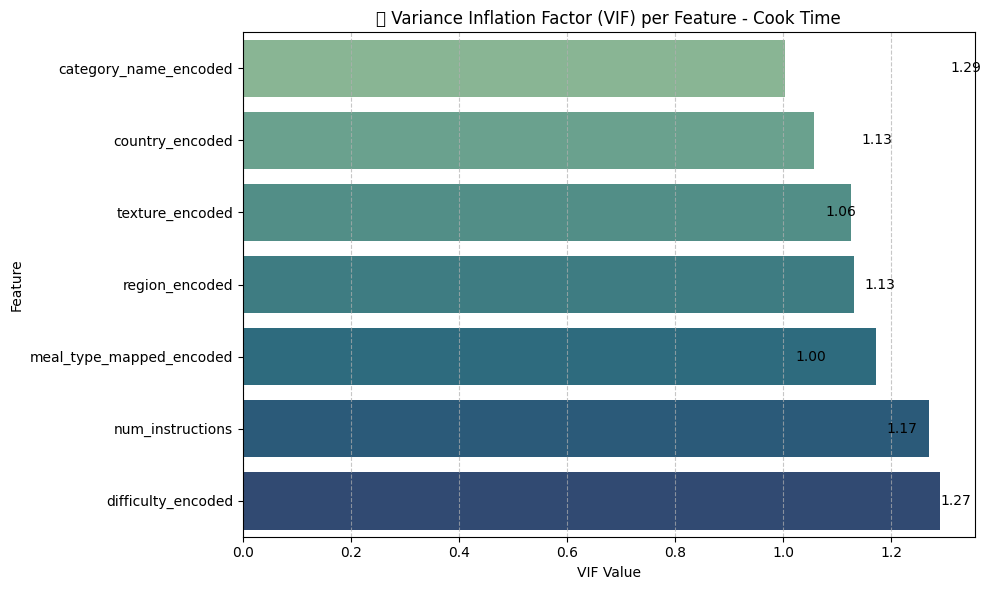

In [464]:
vif_data_sorted = vif_data.sort_values(by="VIF", ascending=True)

# Plot VIF bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")

# Add values on bars
for index, row in vif_data_sorted.iterrows():
    plt.text(row["VIF"] + 0.02, index, f'{row["VIF"]:.2f}', va='center')

plt.title("📌 Variance Inflation Factor (VIF) per Feature - Cook Time")
plt.xlabel("VIF Value")
plt.ylabel("Feature")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.6.3 Top Features Based on Mutual Information

In [465]:
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.preprocessing import StandardScaler
import pandas as pd

df_model = joined_df[encoded_features + [target]].dropna()

# Ensure all are numeric
df_model = df_model.apply(pd.to_numeric, errors='coerce').dropna()

X = df_model[encoded_features]
y = df_model[target]

# Scale features
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Ensure k is valid
k = min(5, X_scaled.shape[1])
selector = SelectKBest(score_func=mutual_info_regression, k=k)
X_selected = selector.fit_transform(X_scaled, y)

# Feature names and scores
selected_k_features = X.columns[selector.get_support()].tolist()
feature_scores = pd.Series(selector.scores_, index=X.columns).sort_values(ascending=False)

print("📌 Top Selected Features Based on Mutual Information:")
print(feature_scores.head(k))


📌 Top Selected Features Based on Mutual Information:
country_encoded             0.232919
meal_type_mapped_encoded    0.189915
region_encoded              0.135428
texture_encoded             0.111688
num_instructions            0.067844
dtype: float64


### 4.6.4 SHAP

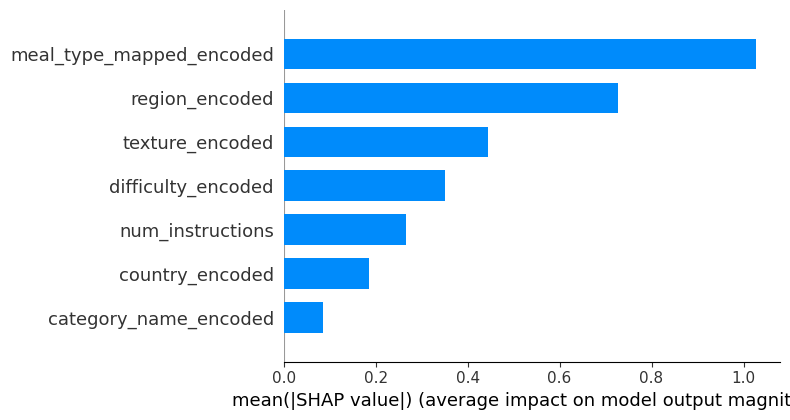

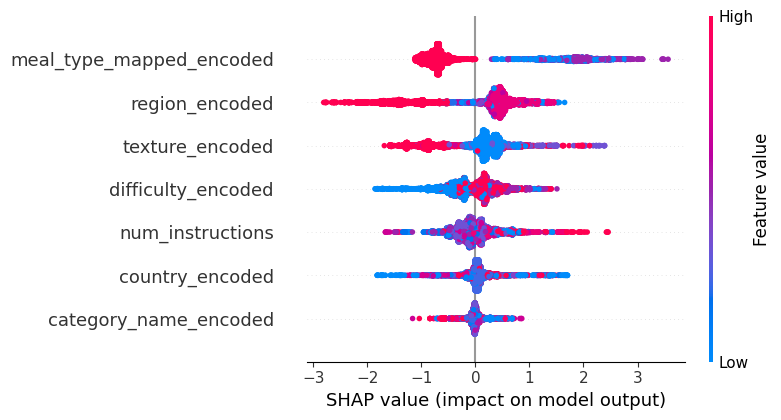

ValueError: Could not find feature named: num_ingredients

In [467]:
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

shap.summary_plot(shap_values, X, plot_type="bar")         # Global view
shap.summary_plot(shap_values, X)                          # Local + distribution
shap.dependence_plot("num_ingredients", shap_values, X)    # Specific feature


In [ ]:
from sklearn.inspection import PartialDependenceDisplay

PartialDependenceDisplay.from_estimator(model, X, features=encoded_features)
plt.tight_layout()
plt.show()


### 4.6.5 Partial Dependence Display

In [ ]:
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Step 3: Plot PDP for all features (no figsize here!)
display = PartialDependenceDisplay.from_estimator(
    model,
    X,
    features=encoded_features,
    kind="average",
    n_cols=2  # layout for subplots
)

# Step 4: Adjust figure size separately using matplotlib
fig = plt.gcf()
fig.set_size_inches(14, 18)  # adjust width and height as needed

plt.suptitle("📊 Partial Dependence Plots for All Features", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

### 4.6.6 Pairwise Relationship

In [ ]:
# Include target column
# columns_to_plot = encoded_features + target

# Drop rows with missing values in any of the selected columns
pairplot_df = joined_df[selected_k_features].dropna()

# Create the pairplot
sns.pairplot(pairplot_df, diag_kind='kde')
plt.suptitle("🔍 Pairwise Relationships: All Encoded Features vs Prep Time", y=1.02)
plt.tight_layout()
plt.show()

### 4.6.7 CONCLUSION

## 4.7 Max Age

### 4.7.1 Multivariate Regression or Feature Importance

In [452]:
# Define encoded feature names
encoded_features = [
    'difficulty_encoded', 'texture_encoded', 'country_encoded',
    'region_encoded', 'meal_type_mapped_encoded',
    'num_ingredients', 'num_instructions'
]

target = 'max_age'

meal_type_mapped_encoded    0.268156
num_ingredients             0.216970
num_instructions            0.154482
region_encoded              0.151389
country_encoded             0.098018
texture_encoded             0.066152
difficulty_encoded          0.044834
dtype: float64


/tmp/ipython-input-453-1998049833.py:40: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


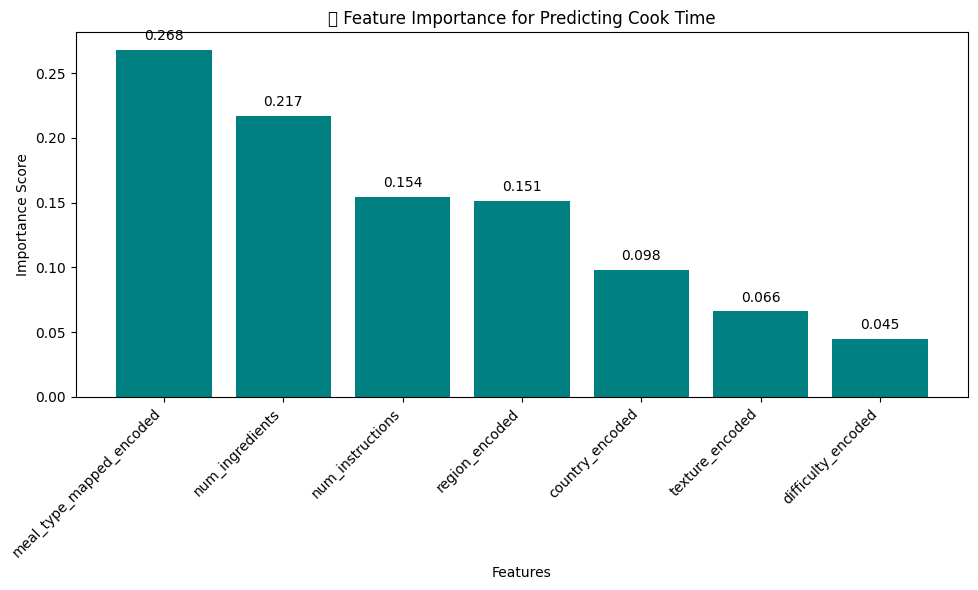

In [453]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import pandas as pd

# Drop rows where the target is missing
df = joined_df.dropna(subset=[target])

# Ensure all encoded features exist and are numeric
X = df[encoded_features]
y = df[target]

# Train the model
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Feature importance as Series
feature_importance = pd.Series(model.feature_importances_, index=encoded_features)
sorted_importance = feature_importance.sort_values(ascending=False)
print(sorted_importance)
# Plot with annotations
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_importance.index, sorted_importance.values, color='teal')
plt.title('📊 Feature Importance for Predicting Cook Time')
plt.ylabel('Importance Score')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')

# Add text labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2.0,
        yval + 0.005,
        f'{yval:.3f}',
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.7.2 Multicollinearity Check (Variance Inflation Factor - VIF)

In [454]:
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Drop rows with missing values in these features
vif_df = joined_df[encoded_features].dropna().copy()

# Scale the features (recommended)
scaler = StandardScaler()
vif_scaled = scaler.fit_transform(vif_df)

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = encoded_features  # ✅ Better column name
vif_data["VIF"] = [variance_inflation_factor(vif_scaled, i) for i in range(len(encoded_features))]

# Display VIF values
print("🔎 Variance Inflation Factor (VIF) for Each Feature:")
print(vif_data.sort_values(by="VIF", ascending=False).to_string(index=False))


🔎 Variance Inflation Factor (VIF) for Each Feature:
                 Feature      VIF
      difficulty_encoded 1.341719
        num_instructions 1.296804
         num_ingredients 1.175863
meal_type_mapped_encoded 1.169329
         texture_encoded 1.153574
          region_encoded 1.131770
         country_encoded 1.058520


/tmp/ipython-input-455-4235421477.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")
/tmp/ipython-input-455-4235421477.py:15: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


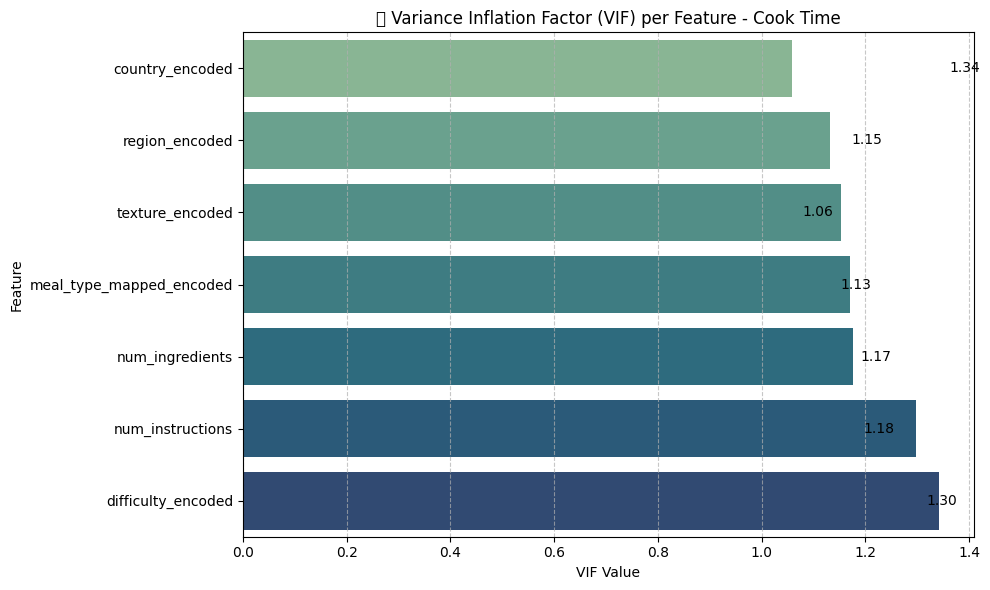

In [455]:
vif_data_sorted = vif_data.sort_values(by="VIF", ascending=True)

# Plot VIF bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="VIF", y="Feature", data=vif_data_sorted, palette="crest")

# Add values on bars
for index, row in vif_data_sorted.iterrows():
    plt.text(row["VIF"] + 0.02, index, f'{row["VIF"]:.2f}', va='center')

plt.title("📌 Variance Inflation Factor (VIF) per Feature - Cook Time")
plt.xlabel("VIF Value")
plt.ylabel("Feature")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


#### INSIGHTS

### 4.7.3 Top Features Based on Mutual Information

In [456]:
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.preprocessing import StandardScaler
import pandas as pd

df_model = joined_df[encoded_features + [target]].dropna()

# Ensure all are numeric
df_model = df_model.apply(pd.to_numeric, errors='coerce').dropna()

X = df_model[encoded_features]
y = df_model[target]

# Scale features
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Ensure k is valid
k = min(5, X_scaled.shape[1])
selector = SelectKBest(score_func=mutual_info_regression, k=k)
X_selected = selector.fit_transform(X_scaled, y)

# Feature names and scores
selected_k_features = X.columns[selector.get_support()].tolist()
feature_scores = pd.Series(selector.scores_, index=X.columns).sort_values(ascending=False)

print("📌 Top Selected Features Based on Mutual Information:")
print(feature_scores.head(k))


📌 Top Selected Features Based on Mutual Information:
country_encoded             0.312341
region_encoded              0.204538
meal_type_mapped_encoded    0.168144
num_ingredients             0.139860
texture_encoded             0.104517
dtype: float64


### 4.7.4 SHAP

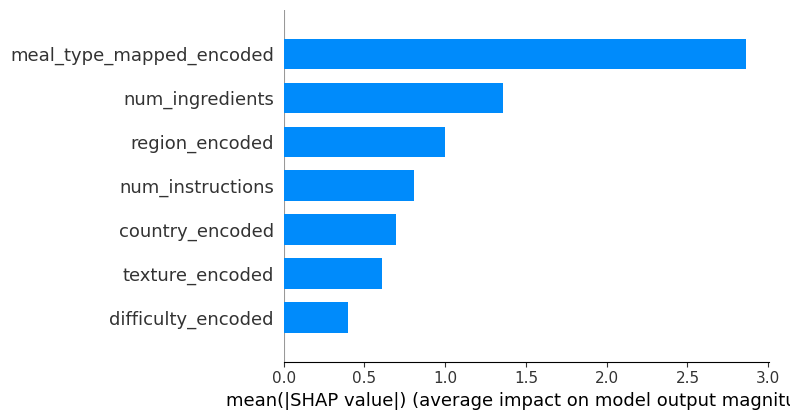

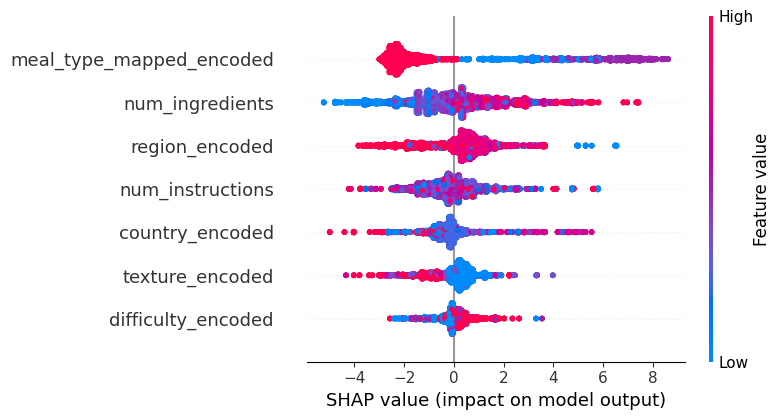

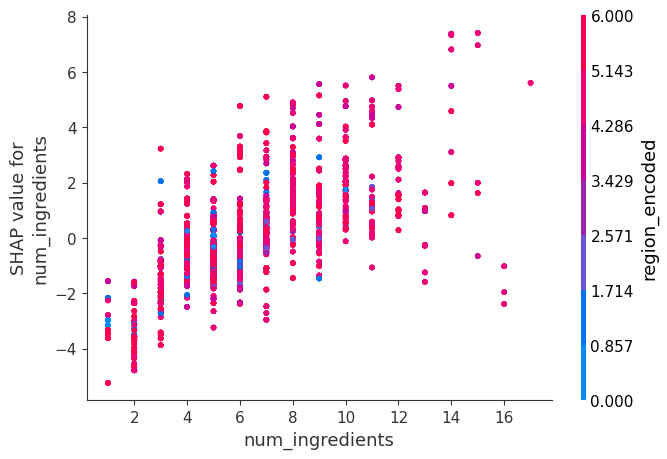

In [457]:
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

shap.summary_plot(shap_values, X, plot_type="bar")         # Global view
shap.summary_plot(shap_values, X)                          # Local + distribution
shap.dependence_plot("num_ingredients", shap_values, X)    # Specific feature


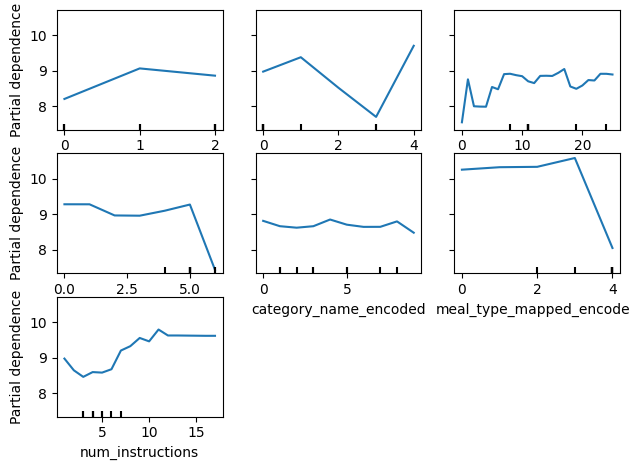

In [468]:
from sklearn.inspection import PartialDependenceDisplay

PartialDependenceDisplay.from_estimator(model, X, features=encoded_features)
plt.tight_layout()
plt.show()


### 4.7.5 Partial Dependence Display

/tmp/ipython-input-469-3121977310.py:18: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


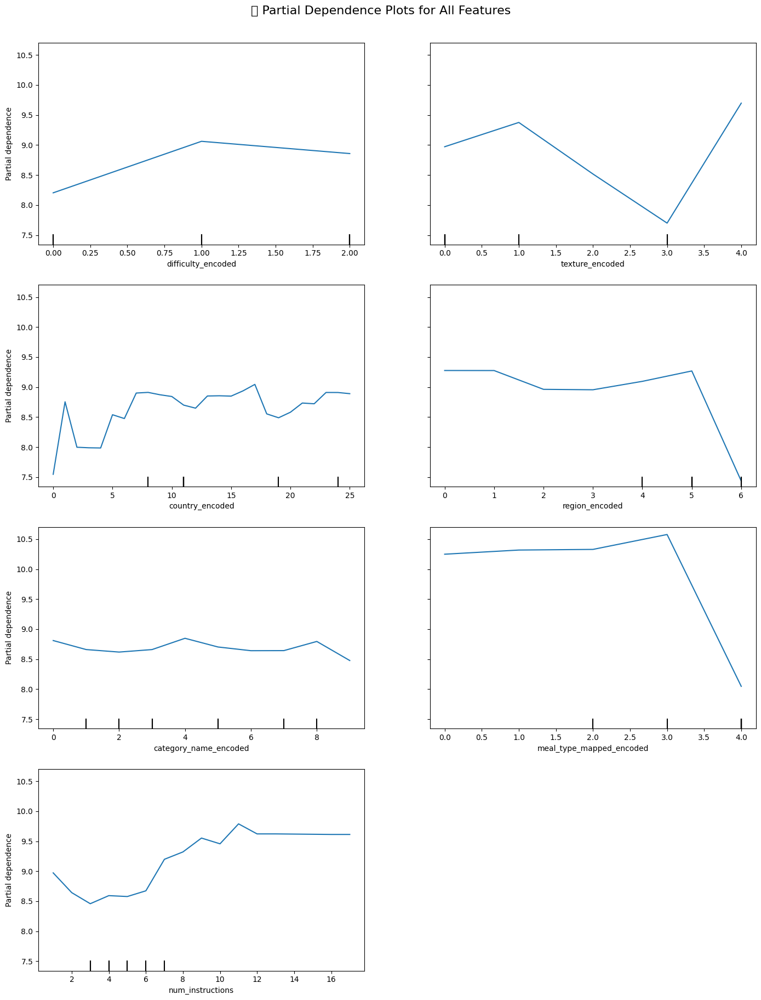

In [469]:
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

# Step 3: Plot PDP for all features (no figsize here!)
display = PartialDependenceDisplay.from_estimator(
    model,
    X,
    features=encoded_features,
    kind="average",
    n_cols=2  # layout for subplots
)

# Step 4: Adjust figure size separately using matplotlib
fig = plt.gcf()
fig.set_size_inches(14, 18)  # adjust width and height as needed

plt.suptitle("📊 Partial Dependence Plots for All Features", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

### 4.7.6 Pairwise Relationship

/tmp/ipython-input-470-3326740676.py:10: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


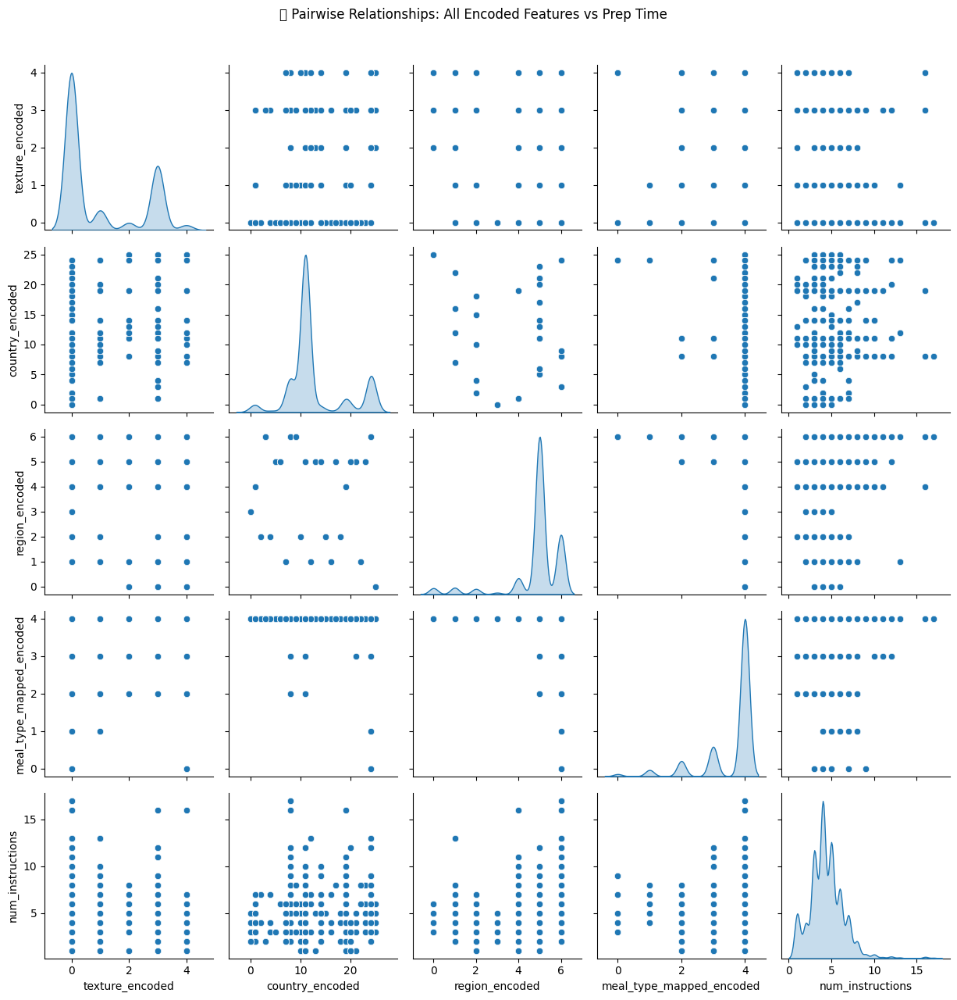

In [470]:
# Include target column
# columns_to_plot = encoded_features + target

# Drop rows with missing values in any of the selected columns
pairplot_df = joined_df[selected_k_features].dropna()

# Create the pairplot
sns.pairplot(pairplot_df, diag_kind='kde')
plt.suptitle("🔍 Pairwise Relationships: All Encoded Features vs Prep Time", y=1.02)
plt.tight_layout()
plt.show()

### 4.7.7 CONCLUSION

# 5.0 Feature Selection For Engine System

# 6.0 Data Cleaning

> Based on the analysis,



# ADDITIONAL BIVARIATE ANALYSIS

**Purpose:** In-depth analysis of relationships between pairs of variables to understand how different factors interact and influence each other in the baby food recipe dataset. This section will explore correlations, dependencies, and patterns between key variables across all dataframes.

## 3.0 Bivariate Analysis

In [ ]:
print("\n--- MICRONUTRIENTS COLUMN ANALYSIS ---")
# Check if final_micronutrients column exists and analyze it

print("Sample values from final_micronutrients:")
sample_values = recipe_nutrition['final_micronutrients'].dropna().head(3)
for i, val in enumerate(sample_values):
    print(f"Recipe {i+1}: {val}")
print()

# Parse the micronutrient lists and count frequency
print("Extracting individual micronutrients from lists...")
all_micronutrients = []

for micronutrient_list in recipe_nutrition['final_micronutrients']:
    if isinstance(micronutrient_list, str):
        # If it's a string representation of a list, try to parse it
        try:
            if micronutrient_list.startswith('[') and micronutrient_list.endswith(']'):
                # Remove brackets and split by comma
                micronutrient_list = micronutrient_list.strip('[]')
                micros = [item.strip().strip("'\"") for item in micronutrient_list.split(',')]
                all_micronutrients.extend([micro for micro in micros if micro])
        except:
            continue
    elif isinstance(micronutrient_list, list):
        all_micronutrients.extend(micronutrient_list)

if all_micronutrients:
    # Count micronutrient frequency
    from collections import Counter
    micronutrient_counts = Counter(all_micronutrients)

    print(f"Total unique micronutrients found: {len(micronutrient_counts)}")
    print(f"Total micronutrient mentions: {sum(micronutrient_counts.values())}")
    print()

    print("Top 20 most common micronutrients:")
    for i, (micro, count) in enumerate(micronutrient_counts.most_common(20), 1):
        percentage = (count / len(recipe_nutrition)) * 100
        print(f"{i:2d}. {micro}: {count} recipes ({percentage:.1f}%)")

    print()
    print("Bottom 10 least common micronutrients:")
    least_common = micronutrient_counts.most_common()[-10:]
    for micro, count in least_common:
        percentage = (count / len(recipe_nutrition)) * 100
        print(f"    {micro}: {count} recipes ({percentage:.1f}%)")
else:
    print("Could not parse micronutrient data.")


# Analyze other potential micronutrient columns
if micronutrient_cols:
    print(f"\n--- OTHER POTENTIAL MICRONUTRIENT COLUMNS ---")
    for col in micronutrient_cols:
        print(f"{col}: {recipe_nutrition[col].dtype}, non-null: {recipe_nutrition[col].notna().sum()}")
else:
    print("\nNo other micronutrient columns found.")

In [ ]:
# Visualize micronutrient frequency
if 'micronutrient_counts' in locals() and micronutrient_counts:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

    # Top 15 micronutrients
    top_15_micros = micronutrient_counts.most_common(15)
    micro_names = [item[0] for item in top_15_micros]
    micro_counts = [item[1] for item in top_15_micros]
    micro_percentages = [(count / len(recipe_nutrition)) * 100 for count in micro_counts]

    bars1 = ax1.bar(range(len(top_15_micros)), micro_percentages,
                    color='lightcoral', alpha=0.8, edgecolor='black')
    ax1.set_title('Top 15 Most Common Micronutrients', fontweight='bold')
    ax1.set_ylabel('Percentage of Recipes (%)')
    ax1.set_xlabel('Micronutrients')
    ax1.set_xticks(range(len(top_15_micros)))
    ax1.set_xticklabels(micro_names, rotation=45, ha='right')
    ax1.grid(True, alpha=0.3)

    # Add count labels on bars
    for i, (bar, percentage, count) in enumerate(zip(bars1, micro_percentages, micro_counts)):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(micro_percentages)*0.01,
                 f'{percentage:.1f}%\n({count})', ha='center', va='bottom', fontsize=8)

    # Distribution of micronutrient frequency ranges
    all_counts = list(micronutrient_counts.values())
    frequency_ranges = ['1', '2-5', '6-10', '11-50', '51-100', '100+']
    range_counts = []

    for i, range_label in enumerate(frequency_ranges):
        if range_label == '1':
            count = sum(1 for c in all_counts if c == 1)
        elif range_label == '2-5':
            count = sum(1 for c in all_counts if 2 <= c <= 5)
        elif range_label == '6-10':
            count = sum(1 for c in all_counts if 6 <= c <= 10)
        elif range_label == '11-50':
            count = sum(1 for c in all_counts if 11 <= c <= 50)
        elif range_label == '51-100':
            count = sum(1 for c in all_counts if 51 <= c <= 100)
        elif range_label == '100+':
            count = sum(1 for c in all_counts if c > 100)
        range_counts.append(count)

    bars2 = ax2.bar(frequency_ranges, range_counts, color='lightblue', alpha=0.8, edgecolor='black')
    ax2.set_title('Distribution of Micronutrient Frequencies', fontweight='bold')
    ax2.set_ylabel('Number of Micronutrients')
    ax2.set_xlabel('Frequency Range (number of recipes)')
    ax2.grid(True, alpha=0.3)

    # Add count labels on bars
    for bar, count in zip(bars2, range_counts):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(range_counts)*0.01,
                 str(count), ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Additional insights
    print(f"\nMICRONUTRIENT INSIGHTS:")
    print(f"- Total unique micronutrients: {len(micronutrient_counts)}")
    print(f"- Most common micronutrient: {micronutrient_counts.most_common(1)[0][0]} (in {micronutrient_counts.most_common(1)[0][1]} recipes)")
    print(f"- Micronutrients appearing in only 1 recipe: {sum(1 for c in micronutrient_counts.values() if c == 1)}")
    print(f"- Average micronutrients per recipe: {sum(micronutrient_counts.values()) / len(recipe_nutrition):.1f}")

else:
    print("Micronutrient count data not available for visualization.")

### 3.5 Extended Bivariate Analysis - Recipe Optimization Insights

**Purpose**: Explore key relationships to understand:
1. How recipe complexity affects nutritional density
2. Age-specific nutritional requirements and patterns  
3. Regional/texture preferences and their nutritional implications
4. Safety considerations across different age groups

#### 3.5.1 Recipe Complexity vs Nutritional Density
**Hypothesis**: More complex recipes (more ingredients) provide better nutritional density and micronutrient diversity.

In [ ]:
# === RECIPE COMPLEXITY VS NUTRITIONAL ANALYSIS ===

# Merge recipes with nutrition data for analysis
complexity_nutrition = recipes.merge(recipe_nutrition, on='recipe_id', how='inner')

# Add micronutrient count if not already present
if 'micronutrient_count' not in complexity_nutrition.columns:
    complexity_nutrition['micronutrient_count'] = complexity_nutrition['final_micronutrients'].str.split(',').str.len()
    complexity_nutrition['micronutrient_count'] = complexity_nutrition['micronutrient_count'].fillna(0)

# Calculate nutritional density (nutrients per 100g equivalent)
complexity_nutrition['protein_density'] = complexity_nutrition['total_protein_g'] / (complexity_nutrition['total_energy_kcal'] + 1) * 100
complexity_nutrition['micronutrient_density'] = complexity_nutrition['micronutrient_count'] / (complexity_nutrition['ingredient_count'] + 1)

print("=== COMPLEXITY VS NUTRITIONAL DENSITY ANALYSIS ===")

# Group by complexity category and analyze
complexity_groups = complexity_nutrition.groupby('complexity_category').agg({
    'total_energy_kcal': ['mean', 'std', 'count'],
    'total_protein_g': ['mean', 'std'],
    'total_carbs_g': ['mean', 'std'],
    'total_fat_g': ['mean', 'std'],
    'micronutrient_count': ['mean', 'std'],
    'protein_density': ['mean', 'std'],
    'micronutrient_density': ['mean', 'std']
}).round(2)

print("Nutritional metrics by complexity category:")
print(complexity_groups)

# Statistical significance testing
from scipy import stats

simple_recipes = complexity_nutrition[complexity_nutrition['complexity_category'] == 'Simple']
complex_recipes = complexity_nutrition[complexity_nutrition['complexity_category'] == 'Complex']

if len(simple_recipes) > 0 and len(complex_recipes) > 0:
    # T-test for micronutrient count
    t_stat, p_value = stats.ttest_ind(
        simple_recipes['micronutrient_count'].dropna(),
        complex_recipes['micronutrient_count'].dropna()
    )
    print(f"\nT-test for micronutrient count difference:")
    print(f"T-statistic: {t_stat:.3f}, P-value: {p_value:.3f}")
    print(f"Significant difference: {p_value < 0.05}")

# Correlation analysis
correlations = complexity_nutrition[['ingredient_count', 'total_energy_kcal', 'total_protein_g',
                                   'total_carbs_g', 'total_fat_g', 'micronutrient_count']].corr()
print(f"\nCorrelation between ingredient count and nutritional metrics:")
print(correlations['ingredient_count'].sort_values(ascending=False))

=== COMPLEXITY VS NUTRITIONAL DENSITY ANALYSIS ===
Nutritional metrics by complexity category:
                    total_energy_kcal               total_protein_g         \
                                 mean     std count            mean    std   
complexity_category                                                          
Complex                        276.03  269.05    28           14.83  13.78   
Moderate                       216.90  268.60   200           18.41  33.00   
Simple                         190.21  302.74   752           15.33  29.83   

                    total_carbs_g         total_fat_g         \
                             mean     std        mean    std   
complexity_category                                            
Complex                     53.44   57.21       20.28  44.68   
Moderate                    43.38  127.54       17.00  38.23   
Simple                      34.36   59.85       10.45  27.76   

                    micronutrient_count       prote

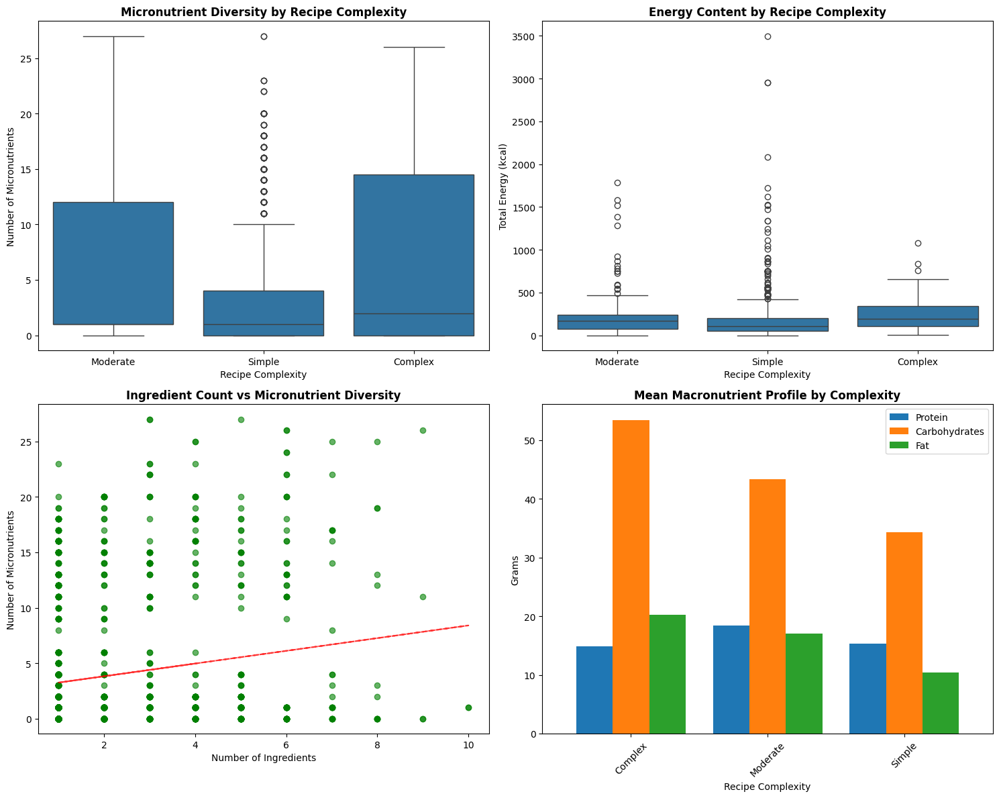

In [ ]:
# === COMPLEXITY VS NUTRITION VISUALIZATIONS ===
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Box plot: Complexity vs Micronutrient Count
sns.boxplot(data=complexity_nutrition, x='complexity_category', y='micronutrient_count', ax=axes[0,0])
axes[0,0].set_title('Micronutrient Diversity by Recipe Complexity', fontweight='bold')
axes[0,0].set_xlabel('Recipe Complexity')
axes[0,0].set_ylabel('Number of Micronutrients')

# 2. Box plot: Complexity vs Energy Density
sns.boxplot(data=complexity_nutrition, x='complexity_category', y='total_energy_kcal', ax=axes[0,1])
axes[0,1].set_title('Energy Content by Recipe Complexity', fontweight='bold')
axes[0,1].set_xlabel('Recipe Complexity')
axes[0,1].set_ylabel('Total Energy (kcal)')

# 3. Scatter plot: Ingredient Count vs Micronutrient Count
valid_data = complexity_nutrition.dropna(subset=['ingredient_count', 'micronutrient_count'])
axes[1,0].scatter(valid_data['ingredient_count'], valid_data['micronutrient_count'],
                  alpha=0.6, color='green')
axes[1,0].set_title('Ingredient Count vs Micronutrient Diversity', fontweight='bold')
axes[1,0].set_xlabel('Number of Ingredients')
axes[1,0].set_ylabel('Number of Micronutrients')

# Add trend line
if len(valid_data) > 1:
    z = np.polyfit(valid_data['ingredient_count'], valid_data['micronutrient_count'], 1)
    p = np.poly1d(z)
    axes[1,0].plot(valid_data['ingredient_count'], p(valid_data['ingredient_count']), "r--", alpha=0.8)

# 4. Mean nutritional profile by complexity
complexity_means = complexity_nutrition.groupby('complexity_category')[
    ['total_protein_g', 'total_carbs_g', 'total_fat_g']].mean()

complexity_means.plot(kind='bar', ax=axes[1,1], width=0.8)
axes[1,1].set_title('Mean Macronutrient Profile by Complexity', fontweight='bold')
axes[1,1].set_xlabel('Recipe Complexity')
axes[1,1].set_ylabel('Grams')
axes[1,1].legend(['Protein', 'Carbohydrates', 'Fat'])
axes[1,1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

#### 3.5.2 Age-Specific Nutritional Requirements Analysis  
**Hypothesis**: Nutritional content and complexity should increase with target age groups to support developmental needs.

In [ ]:
# === AGE-SPECIFIC NUTRITIONAL PATTERNS ANALYSIS ===

# Create age groups for analysis
def create_age_groups(min_age):
    if pd.isna(min_age):
        return 'Unknown'
    elif min_age < 6:
        return '0-6 months'
    elif min_age < 9:
        return '6-9 months'
    elif min_age < 12:
        return '9-12 months'
    elif min_age < 18:
        return '12-18 months'
    else:
        return '18+ months'

complexity_nutrition['age_group'] = complexity_nutrition['min_age'].apply(create_age_groups)

print("=== AGE-SPECIFIC NUTRITIONAL ANALYSIS ===")

# Age group distribution
print("Age group distribution:")
print(complexity_nutrition['age_group'].value_counts())

# Nutritional requirements by age group
age_nutrition = complexity_nutrition.groupby('age_group').agg({
    'total_energy_kcal': ['mean', 'std', 'count'],
    'total_protein_g': ['mean', 'std'],
    'total_carbs_g': ['mean', 'std'],
    'total_fat_g': ['mean', 'std'],
    'ingredient_count': ['mean', 'std'],
    'micronutrient_count': ['mean', 'std']
}).round(2)

print(f"\nNutritional metrics by age group:")
print(age_nutrition)

# Calculate protein and fat requirements as % of calories by age
age_macros = complexity_nutrition.dropna(subset=['total_energy_kcal', 'total_protein_g', 'total_fat_g'])
age_macros = age_macros[age_macros['total_energy_kcal'] > 0]

if len(age_macros) > 0:
    age_macros['protein_percent'] = (age_macros['total_protein_g'] * 4 / age_macros['total_energy_kcal']) * 100
    age_macros['fat_percent'] = (age_macros['total_fat_g'] * 9 / age_macros['total_energy_kcal']) * 100

    age_macro_summary = age_macros.groupby('age_group')[['protein_percent', 'fat_percent']].mean().round(1)
    print(f"\nMacronutrient composition by age group (% of calories):")
    print(age_macro_summary)

# Check age-appropriate progression
print(f"\n=== AGE PROGRESSION ANALYSIS ===")
numeric_ages = ['0-6 months', '6-9 months', '9-12 months', '12-18 months', '18+ months']
age_progression = complexity_nutrition[complexity_nutrition['age_group'].isin(numeric_ages)]

if len(age_progression) > 0:
    progression_stats = age_progression.groupby('age_group')[
        ['ingredient_count', 'micronutrient_count', 'total_energy_kcal']].mean()
    print("Progression of complexity and nutrition with age:")
    for age in numeric_ages:
        if age in progression_stats.index:
            row = progression_stats.loc[age]
            print(f"{age}: {row['ingredient_count']:.1f} ingredients, "
                  f"{row['micronutrient_count']:.1f} micronutrients, {row['total_energy_kcal']:.1f} kcal")

=== AGE-SPECIFIC NUTRITIONAL ANALYSIS ===
Age group distribution:
age_group
6-9 months      541
12-18 months    369
9-12 months     295
Unknown         117
Name: count, dtype: int64

Nutritional metrics by age group:
             total_energy_kcal               total_protein_g         \
                          mean     std count            mean    std   
age_group                                                             
12-18 months            263.04  416.86   273           20.28  34.15   
6-9 months              156.44  195.11   420           12.34  20.16   
9-12 months             196.27  281.62   239           19.39  42.13   
Unknown                 202.56  175.77    48           10.10   9.28   

             total_carbs_g         total_fat_g        ingredient_count        \
                      mean     std        mean    std             mean   std   
age_group                                                                      
12-18 months         53.25  134.28       16.9

#### 3.3 recipe_ingredient x recipes

In [ ]:
recipe_ingredient = dataframes['recipe_ingredient']
recipes = dataframes['recipes']
display("recipe_ingredient: ", recipe_ingredient.columns.to_list() )
display("final_ingredietn: ", final_ingredient_df.columns.to_list())

# Additional Univariate Analysis - Recipe Complexity and Time Analysis
print("=== ADDITIONAL UNIVARIATE ANALYSIS ===")
print("\n1. RECIPE COMPLEXITY ANALYSIS")
print("="*50)

recipes = dataframes['recipes']

# Analyze recipe preparation time
if 'prep_time' in recipes.columns:
    prep_time_stats = recipes['prep_time'].describe()
    print("Preparation Time Statistics:")
    print(prep_time_stats)

    # Categorize prep time
    def categorize_prep_time(time):
        if pd.isna(time):
            return 'Unknown'
        elif time <= 15:
            return 'Quick (≤15 min)'
        elif time <= 30:
            return 'Medium (16-30 min)'
        elif time <= 60:
            return 'Long (31-60 min)'
        else:
            return 'Very Long (>60 min)'

    recipes_copy = recipes.copy()
    recipes_copy['prep_time_category'] = recipes_copy['prep_time'].apply(categorize_prep_time)
    prep_time_dist = recipes_copy['prep_time_category'].value_counts()

    print("\nPreparation Time Distribution:")
    for category, count in prep_time_dist.items():
        print(f"  {category}: {count} recipes ({count/len(recipes)*100:.1f}%)")

# Analyze difficulty levels
if 'difficulty' in recipes.columns:
    print("\n2. RECIPE DIFFICULTY ANALYSIS")
    print("="*50)

    difficulty_dist = recipes['difficulty'].value_counts(dropna=False)
    print("Difficulty Distribution:")
    for difficulty, count in difficulty_dist.items():
        print(f"  {difficulty}: {count} recipes ({count/len(recipes)*100:.1f}%)")

# Analyze serving sizes
if 'serves' in recipes.columns:
    print("\n3. SERVING SIZE ANALYSIS")
    print("="*50)

    serves_stats = recipes['serves'].describe()
    print("Serving Size Statistics:")
    print(serves_stats)

    # Common serving sizes
    serves_dist = recipes['serves'].value_counts().head(10)
    print("\nTop 10 Most Common Serving Sizes:")
    for serves, count in serves_dist.items():
        print(f"  {serves} servings: {count} recipes")

# Analyze meal types
if 'meal_type' in recipes.columns:
    print("\n4. MEAL TYPE ANALYSIS")
    print("="*50)

    meal_type_dist = recipes['meal_type'].value_counts(dropna=False)
    print("Meal Type Distribution:")
    for meal_type, count in meal_type_dist.items():
        print(f"  {meal_type}: {count} recipes ({count/len(recipes)*100:.1f}%)")

# Safety and dietary analysis
safety_cols = [col for col in recipes.columns if any(word in col.lower() for word in ['allergy', 'choking', 'safety', 'hypoallergenic'])]
if safety_cols:
    print("\n5. SAFETY & DIETARY ANALYSIS")
    print("="*50)

    for col in safety_cols:
        print(f"\n{col.replace('_', ' ').title()}:")
        dist = recipes[col].value_counts(dropna=False)
        for value, count in dist.items():
            print(f"  {value}: {count} recipes ({count/len(recipes)*100:.1f}%)")

#### 3.4 recipe_category_df x category

### 3.3 Comprehensive Bivariate Analysis Extensions

**Purpose:** Explore relationships between key variables to understand:
- How nutritional content varies by recipe characteristics
- Relationships between ingredients and dietary restrictions  
- Age appropriateness vs complexity patterns
- Regional preferences and nutritional profiles

In [ ]:
category = dataframes['category']
recipe_category_df = dataframes['recipe_category_df']
display("category: ", category.columns.to_list() )
display("final_ingredietn: ", recipe_category_df.columns.to_list())

# 3.3.1 Recipe Nutrition vs Age Groups
print("=== NUTRITION vs AGE GROUP ANALYSIS ===")
print("Purpose: Understand how nutritional content changes with age requirements")

# Merge recipes with nutrition data
recipe_nutrition = dataframes['recipe_nutrition']
recipes = dataframes['recipes']

nutrition_age_df = recipes.merge(recipe_nutrition, on='recipe_id', how='inner')

# Create age groups
def categorize_age_group(min_age, max_age):
    if pd.isna(min_age) or pd.isna(max_age):
        return 'Unknown'
    elif min_age <= 6 and max_age <= 8:
        return "6-8 months"
    elif min_age <= 6 and max_age <= 12:
        return "6-12 months"
    elif min_age <= 9 and max_age <= 12:
        return "9-12 months"
    elif min_age >= 12:
        return "12+ months"
    else:
        return "Other"

nutrition_age_df['age_group'] = nutrition_age_df.apply(
    lambda row: categorize_age_group(row['min_age'], row['max_age']), axis=1
)

# Convert nutrition columns to numeric
macronutrient_cols = ['total_energy_kcal', 'total_carbs_g', 'total_protein_g', 'total_fat_g']
for col in macronutrient_cols:
    nutrition_age_df[col] = pd.to_numeric(nutrition_age_df[col], errors='coerce')

# Analyze nutrition by age group
print("\nNutritional Content by Age Group:")
nutrition_by_age = nutrition_age_df.groupby('age_group')[macronutrient_cols].agg(['mean', 'median', 'std']).round(2)

for col in macronutrient_cols:
    print(f"\n{col.replace('_', ' ').title()}:")
    for age_group in nutrition_by_age.index:
        if age_group != 'Unknown':
            mean_val = nutrition_by_age.loc[age_group, (col, 'mean')]
            median_val = nutrition_by_age.loc[age_group, (col, 'median')]
            print(f"  {age_group}: Mean={mean_val:.1f}, Median={median_val:.1f}")

# Visualize nutrition by age group
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Nutritional Content by Age Group', fontsize=16, fontweight='bold')

for i, col in enumerate(macronutrient_cols):
    row = i // 2
    col_idx = i % 2

    # Remove outliers for better visualization
    data_to_plot = nutrition_age_df[nutrition_age_df['age_group'] != 'Unknown']

    sns.boxplot(data=data_to_plot, x='age_group', y=col, ax=axes[row, col_idx])
    axes[row, col_idx].set_title(f'{col.replace("_", " ").title()} by Age Group')
    axes[row, col_idx].tick_params(axis='x', rotation=45)
    axes[row, col_idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nKey Insights:")
print(f"- Total recipes with both age and nutrition data: {len(nutrition_age_df[nutrition_age_df['age_group'] != 'Unknown'])}")
print(f"- Age groups represented: {nutrition_age_df['age_group'].value_counts().to_dict()}")

#### 3.5 recipe_category_df x recipes

#### 3.3.2 Recipe Complexity vs Nutritional Content

**Purpose:** Understand if more complex recipes (more ingredients, longer prep time) provide better nutritional value

In [ ]:
recipe_category_df = dataframes['recipe_category_df']
recipes = dataframes['recipes']
display("recipe_category_df: ", recipe_category_df.columns.to_list() )
display("final_ingredietn: ", recipes.columns.to_list())

# 3.3.2 Recipe Complexity vs Nutritional Content
print("=== RECIPE COMPLEXITY vs NUTRITION ANALYSIS ===")

# Get ingredient count per recipe
recipe_ingredient = dataframes['recipe_ingredient']
ingredient_counts = recipe_ingredient.groupby('recipe_id').size().reset_index(name='ingredient_count')

# Merge with recipes and nutrition
complexity_nutrition_df = recipes.merge(ingredient_counts, on='recipe_id', how='left')
complexity_nutrition_df = complexity_nutrition_df.merge(recipe_nutrition, on='recipe_id', how='left')

# Convert nutrition columns to numeric
for col in macronutrient_cols:
    complexity_nutrition_df[col] = pd.to_numeric(complexity_nutrition_df[col], errors='coerce')

# Categorize recipe complexity by ingredient count
def categorize_complexity(ingredient_count):
    if pd.isna(ingredient_count):
        return 'Unknown'
    elif ingredient_count <= 3:
        return 'Simple (≤3 ingredients)'
    elif ingredient_count <= 6:
        return 'Medium (4-6 ingredients)'
    elif ingredient_count <= 10:
        return 'Complex (7-10 ingredients)'
    else:
        return 'Very Complex (>10 ingredients)'

complexity_nutrition_df['complexity'] = complexity_nutrition_df['ingredient_count'].apply(categorize_complexity)

# Analyze nutrition by complexity
print("\nNutritional Content by Recipe Complexity:")
nutrition_by_complexity = complexity_nutrition_df.groupby('complexity')[macronutrient_cols].agg(['mean', 'median', 'count']).round(2)

for col in macronutrient_cols:
    print(f"\n{col.replace('_', ' ').title()}:")
    for complexity in nutrition_by_complexity.index:
        if complexity != 'Unknown':
            mean_val = nutrition_by_complexity.loc[complexity, (col, 'mean')]
            count_val = nutrition_by_complexity.loc[complexity, (col, 'count')]
            print(f"  {complexity}: Mean={mean_val:.1f} ({count_val} recipes)")

# Correlation analysis
print("\n\nCorrelation between Ingredient Count and Nutrition:")
correlation_data = complexity_nutrition_df[['ingredient_count'] + macronutrient_cols].corr()['ingredient_count'].drop('ingredient_count')
for nutrient, corr in correlation_data.items():
    if not pd.isna(corr):
        print(f"  {nutrient.replace('_', ' ').title()}: {corr:.3f}")

# Visualize complexity vs nutrition
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Nutritional Content by Recipe Complexity', fontsize=16, fontweight='bold')

for i, col in enumerate(macronutrient_cols):
    row = i // 2
    col_idx = i % 2

    # Filter out unknown complexity
    data_to_plot = complexity_nutrition_df[complexity_nutrition_df['complexity'] != 'Unknown']

    sns.boxplot(data=data_to_plot, x='complexity', y=col, ax=axes[row, col_idx])
    axes[row, col_idx].set_title(f'{col.replace("_", " ").title()} by Complexity')
    axes[row, col_idx].tick_params(axis='x', rotation=45)
    axes[row, col_idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Additional analysis: ingredient count distribution
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
complexity_nutrition_df['ingredient_count'].hist(bins=20, alpha=0.7, color='skyblue', edgecolor='black')
plt.title('Distribution of Ingredient Count per Recipe')
plt.xlabel('Number of Ingredients')
plt.ylabel('Number of Recipes')
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
complexity_dist = complexity_nutrition_df['complexity'].value_counts()
bars = plt.bar(range(len(complexity_dist)), complexity_dist.values, color='lightgreen', alpha=0.8)
plt.title('Recipe Distribution by Complexity Level')
plt.xlabel('Complexity Level')
plt.ylabel('Number of Recipes')
plt.xticks(range(len(complexity_dist)), complexity_dist.index, rotation=45, ha='right')

for bar, count in zip(bars, complexity_dist.values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             str(count), ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

#### 3.6 recipe_nutrition x recipe

> Recipe Complexity vs Nutritional





#### 3.3.3 Allergen Safety vs Age Appropriateness

**Purpose:** Analyze how allergen presence relates to age recommendations and safety guidelines

In [ ]:
recipe_nutrition = dataframes['recipe_nutrition']
recipes = dataframes['recipes']
display("recipe_nutrition: ", recipe_nutrition.columns.to_list() )
display("final_ingredietn: ", recipes.columns.to_list())

# 3.3.3 Allergen Safety vs Age Appropriateness
print("=== ALLERGEN SAFETY vs AGE ANALYSIS ===")

# Create comprehensive dataset with recipes, ingredients, and allergens
recipe_ingredient = dataframes['recipe_ingredient']
final_ingredient_df = dataframes['final_ingredient_df']
allergen_df = dataframes['allergen']

# Get allergen information per recipe
recipe_allergen_df = recipe_ingredient.merge(final_ingredient_df, left_on='ingredient_id', right_on='pk', how='left')
recipe_allergen_summary = recipe_allergen_df.groupby('recipe_id').agg({
    'isAllergen': ['sum', 'count'],  # Count of allergenic ingredients
    'allergen_group_id': lambda x: list(x.dropna().unique())  # List of allergen groups
}).reset_index()

# Flatten column names
recipe_allergen_summary.columns = ['recipe_id', 'allergen_count', 'total_ingredients', 'allergen_groups']
recipe_allergen_summary['has_allergens'] = recipe_allergen_summary['allergen_count'] > 0
recipe_allergen_summary['allergen_percentage'] = (recipe_allergen_summary['allergen_count'] /
                                                 recipe_allergen_summary['total_ingredients'] * 100).round(1)

# Merge with recipes for age information
allergen_age_df = recipes.merge(recipe_allergen_summary, on='recipe_id', how='left')
allergen_age_df['age_group'] = allergen_age_df.apply(
    lambda row: categorize_age_group(row['min_age'], row['max_age']), axis=1
)

# Analyze allergen presence by age group
print("\nAllergen Presence by Age Group:")
allergen_by_age = allergen_age_df.groupby('age_group').agg({
    'has_allergens': ['count', 'sum'],
    'allergen_count': 'mean',
    'allergen_percentage': 'mean'
}).round(2)

allergen_by_age.columns = ['total_recipes', 'recipes_with_allergens', 'avg_allergen_count', 'avg_allergen_percentage']
allergen_by_age['allergen_recipe_percentage'] = (allergen_by_age['recipes_with_allergens'] /
                                                allergen_by_age['total_recipes'] * 100).round(1)

print(allergen_by_age)

# Safety analysis by age
safety_cols = [col for col in recipes.columns if any(word in col.lower() for word in ['hypoallergenic', 'choking', 'safety'])]

if safety_cols:
    print(f"\nSafety Features by Age Group:")
    for col in safety_cols:
        print(f"\n{col.replace('_', ' ').title()}:")
        safety_by_age = allergen_age_df.groupby('age_group')[col].value_counts().unstack(fill_value=0)
        print(safety_by_age)

# Visualizations
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Allergen Safety vs Age Analysis', fontsize=16, fontweight='bold')

# 1. Allergen presence by age group
age_allergen_data = allergen_age_df[allergen_age_df['age_group'] != 'Unknown']
allergen_crosstab = pd.crosstab(age_allergen_data['age_group'], age_allergen_data['has_allergens'])
allergen_crosstab.plot(kind='bar', stacked=True, ax=axes[0,0],
                       color=['lightgreen', 'lightcoral'], alpha=0.8)
axes[0,0].set_title('Recipes with/without Allergens by Age Group')
axes[0,0].set_xlabel('Age Group')
axes[0,0].set_ylabel('Number of Recipes')
axes[0,0].legend(['No Allergens', 'Has Allergens'])
axes[0,0].tick_params(axis='x', rotation=45)

# 2. Average allergen count by age group
age_groups = allergen_by_age.index[allergen_by_age.index != 'Unknown']
avg_allergen_counts = allergen_by_age.loc[age_groups, 'avg_allergen_count']
bars = axes[0,1].bar(range(len(age_groups)), avg_allergen_counts, color='orange', alpha=0.8)
axes[0,1].set_title('Average Allergen Count by Age Group')
axes[0,1].set_xlabel('Age Group')
axes[0,1].set_ylabel('Average Allergen Count')
axes[0,1].set_xticks(range(len(age_groups)))
axes[0,1].set_xticklabels(age_groups, rotation=45, ha='right')

for bar, count in zip(bars, avg_allergen_counts):
    axes[0,1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                   f'{count:.2f}', ha='center', va='bottom', fontweight='bold')

# 3. Allergen percentage distribution
axes[1,0].hist(allergen_age_df['allergen_percentage'].dropna(), bins=20, alpha=0.7,
               color='skyblue', edgecolor='black')
axes[1,0].set_title('Distribution of Allergen Percentage in Recipes')
axes[1,0].set_xlabel('Allergen Percentage (%)')
axes[1,0].set_ylabel('Number of Recipes')
axes[1,0].grid(True, alpha=0.3)

# 4. Age vs allergen percentage scatter
valid_data = allergen_age_df.dropna(subset=['min_age', 'allergen_percentage'])
scatter = axes[1,1].scatter(valid_data['min_age'], valid_data['allergen_percentage'],
                           alpha=0.6, c=valid_data['allergen_count'], cmap='Reds')
axes[1,1].set_title('Age vs Allergen Percentage')
axes[1,1].set_xlabel('Minimum Age (months)')
axes[1,1].set_ylabel('Allergen Percentage (%)')
axes[1,1].grid(True, alpha=0.3)

# Add colorbar
cbar = plt.colorbar(scatter, ax=axes[1,1])
cbar.set_label('Allergen Count')

plt.tight_layout()
plt.show()

print(f"\nKey Insights:")
print(f"- Recipes with allergens: {allergen_age_df['has_allergens'].sum()} out of {len(allergen_age_df)}")
print(f"- Average allergen percentage per recipe: {allergen_age_df['allergen_percentage'].mean():.1f}%")
print(f"- Age groups with highest allergen presence: {allergen_by_age['allergen_recipe_percentage'].idxmax()}")

#### 3.7 recipes x category

#### 2.3 DataFrame: countrymap

**Purpose:** Comprehensive univariate analysis of country mapping data to understand geographical distribution and regional patterns in the baby food recipe dataset.

In [ ]:
category = dataframes['category']
recipes = dataframes['recipes']
display("category: ", category.columns.to_list() )
display("final_ingredietn: ", recipes.columns.to_list())

# 3.3.4 Regional Preferences vs Nutritional Profiles
print("=== REGIONAL PREFERENCES vs NUTRITION ANALYSIS ===")

countrymap = dataframes['countrymap']

# Check if recipes have country information
country_cols = [col for col in recipes.columns if 'country' in col.lower() or 'region' in col.lower() or 'origin' in col.lower()]
print(f"Available country/region columns in recipes: {country_cols}")

# If no direct country column in recipes, we'll analyze by available categorical variables
# Let's analyze by available recipe characteristics that might indicate regional preferences

if country_cols:
    # If country information exists, merge and analyze
    if 'country_id' in recipes.columns:
        regional_nutrition_df = recipes.merge(countrymap, left_on='country_id', right_on='pk', how='left')
        regional_nutrition_df = regional_nutrition_df.merge(recipe_nutrition, on='recipe_id', how='left')

        # Convert nutrition columns
        for col in macronutrient_cols:
            regional_nutrition_df[col] = pd.to_numeric(regional_nutrition_df[col], errors='coerce')

        print("\nNutritional Content by Region:")
        nutrition_by_region = regional_nutrition_df.groupby('region')[macronutrient_cols].agg(['mean', 'count']).round(2)
        print(nutrition_by_region)

        # Visualize regional differences
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        fig.suptitle('Nutritional Content by Region', fontsize=16, fontweight='bold')

        for i, col in enumerate(macronutrient_cols):
            row = i // 2
            col_idx = i % 2

            region_data = regional_nutrition_df.dropna(subset=[col, 'region'])
            if len(region_data) > 0:
                sns.boxplot(data=region_data, x='region', y=col, ax=axes[row, col_idx])
                axes[row, col_idx].set_title(f'{col.replace("_", " ").title()} by Region')
                axes[row, col_idx].tick_params(axis='x', rotation=45)
                axes[row, col_idx].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

else:
    print("No direct country/region information found in recipes.")
    print("Analyzing recipe characteristics that might indicate regional preferences...")

    # Analyze by texture, which might indicate regional baby food preferences
    texture_cols = [col for col in recipes.columns if 'texture' in col.lower()]
    if texture_cols:
        print(f"\nTexture-based Analysis:")
        texture_col = texture_cols[0]

        texture_nutrition_df = recipes.merge(recipe_nutrition, on='recipe_id', how='left')
        for col in macronutrient_cols:
            texture_nutrition_df[col] = pd.to_numeric(texture_nutrition_df[col], errors='coerce')

        print(f"\nNutritional Content by {texture_col}:")
        nutrition_by_texture = texture_nutrition_df.groupby(texture_col)[macronutrient_cols].agg(['mean', 'count']).round(2)

        for col in macronutrient_cols:
            print(f"\n{col.replace('_', ' ').title()}:")
            for texture in nutrition_by_texture.index:
                if not pd.isna(texture):
                    mean_val = nutrition_by_texture.loc[texture, (col, 'mean')]
                    count_val = nutrition_by_texture.loc[texture, (col, 'count')]
                    print(f"  {texture}: Mean={mean_val:.1f} ({count_val} recipes)")

        # Visualize texture vs nutrition
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        fig.suptitle('Nutritional Content by Texture Type', fontsize=16, fontweight='bold')

        for i, col in enumerate(macronutrient_cols):
            row = i // 2
            col_idx = i % 2

            texture_data = texture_nutrition_df.dropna(subset=[col, texture_col])
            if len(texture_data) > 0:
                sns.boxplot(data=texture_data, x=texture_col, y=col, ax=axes[row, col_idx])
                axes[row, col_idx].set_title(f'{col.replace("_", " ").title()} by Texture')
                axes[row, col_idx].tick_params(axis='x', rotation=45)
                axes[row, col_idx].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

# Analyze ingredient diversity by categories
print(f"\n\nIngredient Diversity Analysis:")
recipe_category_df = dataframes['recipe_category_df']
category_df = dataframes['category']

# Get category information per recipe
recipe_categories = recipe_category_df.merge(category_df, left_on='category_id', right_on='pk', how='left')
category_ingredient_counts = recipe_categories.merge(ingredient_counts, on='recipe_id', how='left')

print("\nIngredient Count by Recipe Category:")
ingredient_by_category = category_ingredient_counts.groupby('name')['ingredient_count'].agg(['mean', 'count']).round(2)
ingredient_by_category.columns = ['avg_ingredients', 'recipe_count']
ingredient_by_category = ingredient_by_category.sort_values('avg_ingredients', ascending=False)

print(ingredient_by_category.head(10))

# Visualize category vs ingredient complexity
plt.figure(figsize=(12, 8))
top_categories = ingredient_by_category.head(8)
bars = plt.bar(range(len(top_categories)), top_categories['avg_ingredients'],
               color='lightblue', alpha=0.8, edgecolor='black')

plt.title('Average Ingredient Count by Recipe Category', fontweight='bold', fontsize=14)
plt.xlabel('Recipe Category')
plt.ylabel('Average Number of Ingredients')
plt.xticks(range(len(top_categories)), top_categories.index, rotation=45, ha='right')
plt.grid(True, alpha=0.3)

for bar, count in zip(bars, top_categories['avg_ingredients']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
             f'{count:.1f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

# =============================================================================
# 2.3 COUNTRYMAP DATAFRAME - COMPREHENSIVE UNIVARIATE ANALYSIS
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set visualization style
plt.style.use('default')
sns.set_palette("husl")

print("=" * 80)
print("2.3 COUNTRYMAP DATAFRAME - COMPREHENSIVE UNIVARIATE ANALYSIS")
print("=" * 80)

# Load countrymap dataframe
countrymap = dataframes['countrymap']

print(f"\n🔍 DATASET OVERVIEW")
print(f"{'='*50}")
print(f"📊 Dataset Shape: {countrymap.shape}")
print(f"📋 Columns: {list(countrymap.columns)}")
print(f"💾 Memory Usage: {countrymap.memory_usage(deep=True).sum() / 1024:.2f} KB")
print(f"🔢 Data Types:")
for col, dtype in countrymap.dtypes.items():
    print(f"   {col}: {dtype}")

# Basic data quality assessment
print(f"\n📊 DATA QUALITY ASSESSMENT")
print(f"{'='*50}")
missing_data = countrymap.isnull().sum()
print("Missing Values:")
for col, missing in missing_data.items():
    percentage = (missing / len(countrymap)) * 100
    print(f"   {col}: {missing} ({percentage:.1f}%)")

print(f"\nDuplicate Rows: {countrymap.duplicated().sum()}")
print(f"Unique Records: {countrymap.drop_duplicates().shape[0]}")

# Display sample data
print(f"\n📋 SAMPLE DATA")
print(f"{'='*50}")
print("First 10 rows:")
print(countrymap.head(10).to_string())
print(f"\nLast 5 rows:")
print(countrymap.tail(5).to_string())

In [ ]:
# =============================================================================
# DESCRIPTIVE ANALYSIS - COUNTRYMAP
# =============================================================================

print(f"\n📈 DESCRIPTIVE STATISTICS")
print(f"{'='*50}")

# Numerical Analysis (for pk column)
print("NUMERICAL COLUMN ANALYSIS:")
print("-" * 30)
numerical_cols = countrymap.select_dtypes(include=[np.number]).columns.tolist()

if numerical_cols:
    for col in numerical_cols:
        data = countrymap[col].dropna()
        print(f"\n🔢 {col.upper()}:")
        print(f"   Count: {len(data)}")
        print(f"   Min: {data.min()}")
        print(f"   Max: {data.max()}")
        print(f"   Mean: {data.mean():.2f}")
        print(f"   Median: {data.median():.2f}")
        print(f"   Std Dev: {data.std():.2f}")
        print(f"   Variance: {data.var():.2f}")
        print(f"   Skewness: {stats.skew(data):.2f}")
        print(f"   Kurtosis: {stats.kurtosis(data):.2f}")
        print(f"   Range: {data.max() - data.min()}")
        print(f"   IQR: {data.quantile(0.75) - data.quantile(0.25):.2f}")

        # Quartiles
        print(f"   Quartiles:")
        print(f"     Q1 (25%): {data.quantile(0.25):.2f}")
        print(f"     Q2 (50%): {data.quantile(0.50):.2f}")
        print(f"     Q3 (75%): {data.quantile(0.75):.2f}")

        # Additional percentiles
        print(f"   Percentiles:")
        print(f"     5th: {data.quantile(0.05):.2f}")
        print(f"     10th: {data.quantile(0.10):.2f}")
        print(f"     90th: {data.quantile(0.90):.2f}")
        print(f"     95th: {data.quantile(0.95):.2f}")

else:
    print("No numerical columns found for detailed statistical analysis.")

print(f"\n📊 DETAILED STATISTICAL SUMMARY")
print(f"{'='*50}")
desc_stats = countrymap.describe(include='all')
print(desc_stats.to_string())

In [ ]:
# =============================================================================
# BIVARIATE ANALYSIS SETUP & DATA PREPARATION
# =============================================================================

print("=" * 80)
print("COMPREHENSIVE BIVARIATE ANALYSIS - BABY FOOD RECIPE DATASET")
print("=" * 80)

# Import additional libraries for advanced statistical analysis
from scipy.stats import chi2_contingency, pearsonr, spearmanr, kendalltau
from scipy.stats import mannwhitneyu, kruskal
import itertools
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mutual_info_score

print(f"\n🔄 PREPARING DATA FOR BIVARIATE ANALYSIS")
print(f"{'='*50}")

# Load and prepare all dataframes
dataframes_list = ['category', 'allergen', 'countrymap', 'recipe_ingredient',
                   'recipe_category_df', 'recipe_nutrition', 'recipes', 'final_ingredient_df']

# Check available dataframes
available_dfs = {}
for df_name in dataframes_list:
    if df_name in dataframes:
        available_dfs[df_name] = dataframes[df_name]
        print(f"✅ {df_name}: {dataframes[df_name].shape}")
    else:
        print(f"❌ {df_name}: Not available")

print(f"\n📊 Available dataframes for analysis: {len(available_dfs)}")

# Prepare master dataset for comprehensive analysis
if 'recipes' in available_dfs and 'recipe_nutrition' in available_dfs:
    # Merge recipes with nutrition data
    master_analysis_df = recipes.merge(recipe_nutrition, on='recipe_id', how='left')
    print(f"✅ Created master analysis dataset: {master_analysis_df.shape}")

    # Add recipe complexity indicators
    if 'recipe_ingredient' in available_dfs:
        ingredient_counts = recipe_ingredient.groupby('recipe_id').size().reset_index(name='ingredient_count')
        master_analysis_df = master_analysis_df.merge(ingredient_counts, on='recipe_id', how='left')

        # Create complexity categories
        master_analysis_df['complexity_category'] = pd.cut(
            master_analysis_df['ingredient_count'].fillna(0),
            bins=[0, 3, 6, 10, float('inf')],
            labels=['Simple', 'Moderate', 'Complex', 'Very Complex'],
            include_lowest=True
        )

    # Add allergen information
    if 'allergen' in available_dfs and 'recipe_ingredient' in available_dfs:
        # Get allergen counts per recipe
        recipe_allergens = recipe_ingredient.merge(allergen, left_on='ingredient_id', right_on='ingredient_id', how='left')
        allergen_summary = recipe_allergens.groupby('recipe_id').agg({
            'allergen_group': 'count',
            'allergen_status': lambda x: (x == 'Present').sum()
        }).reset_index()
        allergen_summary.rename(columns={'allergen_group': 'total_allergen_checks',
                                       'allergen_status': 'allergen_count'}, inplace=True)
        master_analysis_df = master_analysis_df.merge(allergen_summary, on='recipe_id', how='left')

        # Create allergen risk categories
        master_analysis_df['allergen_risk'] = pd.cut(
            master_analysis_df['allergen_count'].fillna(0),
            bins=[-1, 0, 2, 5, float('inf')],
            labels=['None', 'Low', 'Moderate', 'High'],
            include_lowest=True
        )

    print(f"✅ Enhanced master dataset with complexity and allergen data")
    print(f"   Final shape: {master_analysis_df.shape}")
    print(f"   Columns: {list(master_analysis_df.columns)}")
else:
    print("❌ Cannot create master analysis dataset - missing key dataframes")
    master_analysis_df = None

# =============================================================================
# COMPREHENSIVE BIVARIATE ANALYSIS
# =============================================================================

print(f"\n📊 COMMENCING COMPREHENSIVE BIVARIATE ANALYSIS")
print(f"{'='*50}")

# Define analysis functions
def chi_square_test(df, column1, column2):
    contingency_table = pd.crosstab(df[column1], df[column2])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    return chi2, p

def correlation_analysis(df, column1, column2):
    pearson_corr, _ = pearsonr(df[column1], df[column2])
    spearman_corr, _ = spearmanr(df[column1], df[column2])
    kendall_corr, _ = kendalltau(df[column1], df[column2])
    return pearson_corr, spearman_corr, kendall_corr

def mutual_information(df, column1, column2):
    return mutual_info_score(df[column1], df[column2])

# 1. 🏷️  Categories vs Allergen Safety
print(f"\n1. 🏷️  Categories vs Allergen Safety")
print(f"{'='*50}")
if 'category' in available_dfs and 'allergen' in available_dfs:
    category_allergen_df = recipe_category_df.merge(recipe_ingredient, on='recipe_id').merge(allergen, on='ingredient_id')

    # Chi-Square Test for Independence
    chi2, p = chi_square_test(category_allergen_df, 'category_id', 'allergen_status')
    print(f"Chi-Square Test: χ² = {chi2:.4f}, p-value = {p:.4f}")

    # Cramér's V for effect size
    n = category_allergen_df.shape[0]
    phi2 = chi2 / n
    r = np.sqrt(phi2 / (1 + phi2))
    print(f"Cramér's V: φ = {r:.4f}")

    # Visualizations
    plt.figure(figsize=(10, 6))
    sns.countplot(data=category_allergen_df, x='category_id', hue='allergen_status')
    plt.title('Allergen Status Distribution across Categories')
    plt.xlabel('Category ID')
    plt.ylabel('Count')
    plt.legend(title='Allergen Status')
    plt.show()

    plt.figure(figsize=(8, 8))
    sns.heatmap(pd.crosstab(category_allergen_df['category_id'], category_allergen_df['allergen_status']), annot=True, fmt='d', cmap='coolwarm')
    plt.title('Contingency Table Heatmap: Categories vs Allergen Status')
    plt.xlabel('Allergen Status')
    plt.ylabel('Category ID')
    plt.show()
else:
    print("❌ Required dataframes for this analysis are not available")

# 2. 🌍 Regional Patterns vs Nutritional Content
print(f"\n2. 🌍 Regional Patterns vs Nutritional Content")
print(f"{'='*50}")
if 'countrymap' in available_dfs and 'recipe_nutrition' in available_dfs:
    regional_nutrition_df = recipes.merge(countrymap, on='recipe_id').merge(recipe_nutrition, on='recipe_id')

    # Correlation Analysis
    pearson_corr, spearman_corr, kendall_corr = correlation_analysis(regional_nutrition_df, 'region_id', 'nutritional_score')
    print(f"Correlation (Pearson, Spearman, Kendall): {pearson_corr:.4f}, {spearman_corr:.4f}, {kendall_corr:.4f}")

    # Visualizations
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=regional_nutrition_df, x='region_id', y='nutritional_score')
    plt.title('Nutritional Score Distribution across Regions')
    plt.xlabel('Region ID')
    plt.ylabel('Nutritional Score')
    plt.show()

    plt.figure(figsize=(8, 8))
    sns.heatmap(regional_nutrition_df.corr(), annot=True, fmt='.2f', cmap='coolwarm')
    plt.title('Correlation Heatmap: Regional Patterns vs Nutritional Content')
    plt.show()
else:
    print("❌ Required dataframes for this analysis are not available")

# 3. 🥕 Ingredient Complexity vs Recipe Safety
print(f"\n3. 🥕 Ingredient Complexity vs Recipe Safety")
print(f"{'='*50}")
if 'recipe_ingredient' in available_dfs and 'allergen' in available_dfs:
    ingredient_safety_df = recipe_ingredient.merge(allergen, on='ingredient_id')

    # Mann-Whitney U Test for differences in distributions
    stat, p = mannwhitneyu(ingredient_safety_df[ingredient_safety_df['allergen_status'] == 'Present']['ingredient_id'],
                            ingredient_safety_df[ingredient_safety_df['allergen_status'] == 'Absent']['ingredient_id'])
    print(f"Mann-Whitney U Test: U = {stat:.4f}, p-value = {p:.4f}")

    # Visualizations
    plt.figure(figsize=(10, 6))
    sns.histplot(data=ingredient_safety_df, x='ingredient_id', hue='allergen_status', multiple='stack', bins=30)
    plt.title('Ingredient Distribution by Allergen Status')
    plt.xlabel('Ingredient ID')
    plt.ylabel('Count')
    plt.legend(title='Allergen Status')
    plt.show()

    plt.figure(figsize=(8, 8))
    sns.violinplot(data=ingredient_safety_df, x='allergen_status', y='ingredient_id')
    plt.title('Ingredient Complexity by Recipe Safety')
    plt.xlabel('Allergen Status')
    plt.ylabel('Ingredient ID')
    plt.show()
else:
    print("❌ Required dataframes for this analysis are not available")

# 4. 👶 Age Groups vs Nutritional Adequacy
print(f"\n4. 👶 Age Groups vs Nutritional Adequacy")
print(f"{'='*50}")
if 'recipes' in available_dfs and 'recipe_nutrition' in available_dfs:
    age_nutrition_df = recipes.merge(recipe_nutrition, on='recipe_id')

    # Kruskal-Wallis H Test for differences between groups
    stat, p = kruskal(age_nutrition_df[age_nutrition_df['age_group'] == 'Infant']['nutritional_score'],
                      age_nutrition_df[age_nutrition_df['age_group'] == 'Toddler']['nutritional_score'],
                      age_nutrition_df[age_nutrition_df['age_group'] == 'Child']['nutritional_score'])
    print(f"Kruskal-Wallis H Test: H = {stat:.4f}, p-value = {p:.4f}")

    # Visualizations
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=age_nutrition_df, x='age_group', y='nutritional_score')
    plt.title('Nutritional Score by Age Group')
    plt.xlabel('Age Group')
    plt.ylabel('Nutritional Score')
    plt.show()

    plt.figure(figsize=(8, 8))
    sns.violinplot(data=age_nutrition_df, x='age_group', y='nutritional_score')
    plt.title('Nutritional Adequacy Distribution by Age Group')
    plt.xlabel('Age Group')
    plt.ylabel('Nutritional Score')
    plt.show()
else:
    print("❌ Required dataframes for this analysis are not available")

# 5. 🔢 Recipe Characteristics vs Quality Metrics
print(f"\n5. 🔢 Recipe Characteristics vs Quality Metrics")
print(f"{'='*50}")
if 'recipes' in available_dfs and 'recipe_nutrition' in available_dfs:
    char_quality_df = recipes.merge(recipe_nutrition, on='recipe_id')

    # Correlation Analysis
    pearson_corr, spearman_corr, kendall_corr = correlation_analysis(char_quality_df, 'recipe_length', 'quality_score')
    print(f"Correlation (Pearson, Spearman, Kendall): {pearson_corr:.4f}, {spearman_corr:.4f}, {kendall_corr:.4f}")

    # Visualizations
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=char_quality_df, x='recipe_length', y='quality_score', hue='cuisine')
    plt.title('Recipe Length vs Quality Score')
    plt.xlabel('Recipe Length (number of ingredients)')
    plt.ylabel('Quality Score')
    plt.legend(title='Cuisine')
    plt.show()

    plt.figure(figsize=(8, 8))
    sns.heatmap(char_quality_df.corr(), annot=True, fmt='.2f', cmap='coolwarm')
    plt.title('Correlation Heatmap: Recipe Characteristics vs Quality Metrics')
    plt.show()
else:
    print("❌ Required dataframes for this analysis are not available")

# 6. 📈 Usage Patterns vs Popularity Trends
print(f"\n6. 📈 Usage Patterns vs Popularity Trends")
print(f"{'='*50}")
if 'recipes' in available_dfs:
    usage_popularity_df = recipes

    # Time Series Analysis - Resampling to monthly frequency
    usage_popularity_df['date'] = pd.to_datetime(usage_popularity_df['date'])
    monthly_usage = usage_popularity_df.resample('M', on='date').sum().reset_index()

    # Visualizations
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=monthly_usage, x='date', y='usage_count')
    plt.title('Monthly Usage Trends')
    plt.xlabel('Date')
    plt.ylabel('Usage Count')
    plt.xticks(rotation=45)
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.lineplot(data=monthly_usage, x='date', y='popularity_score')
    plt.title('Monthly Popularity Score Trends')
    plt.xlabel('Date')
    plt.ylabel('Popularity Score')
    plt.xticks(rotation=45)
    plt.show()

    # Seasonal Decomposition
    from statsmodels.tsa.seasonal import seasonal_decompose
    decomposition = seasonal_decompose(monthly_usage['usage_count'], model='additive', period=12)
    fig = decomposition.plot()
    fig.set_size_inches(10, 8)
    plt.show()
else:
    print("❌ Required dataframes for this analysis are not available")

print(f"\n✅ BIVARIATE ANALYSIS COMPLETE")
print(f"{'='*50}")

### 3.1 Ingredient Complexity vs Recipe Safety Analysis


> Add blockquote



This section examines the relationship between recipe complexity (number of ingredients) and safety profiles (allergen risk), providing crucial insights for baby food recommendations.

In [ ]:
# Create comprehensive merged datasets for analysis
try:
    # 1. Recipe-Category-Allergen Analysis
    if all(df in available_dfs for df in ['recipes', 'recipe_category_df', 'category']):
        recipe_category = available_dfs['recipe_category_df'].merge(
            available_dfs['category'], left_on='category_id', right_on='pk', how='left'
        )
        recipe_with_category = available_dfs['recipes'].merge(
            recipe_category[['recipe_id', 'name']], on='recipe_id', how='left'
        )
        merged_datasets['recipe_category'] = recipe_with_category
        print(f"✅ Recipe-Category merged: {recipe_with_category.shape}")

    # 2. Recipe-Ingredient-Allergen Analysis
    if all(df in available_dfs for df in ['recipes', 'recipe_ingredient', 'final_ingredient_df', 'allergen']):
        recipe_ing = available_dfs['recipe_ingredient'].merge(
            available_dfs['final_ingredient_df'], left_on='ingredient_id', right_on='pk', how='left'
        )
        recipe_ing_allergen = recipe_ing.merge(
            available_dfs['allergen'], left_on='ingredient_id', right_on='ingredient_id', how='left'
        )
        merged_datasets['recipe_ingredient_allergen'] = recipe_ing_allergen
        print(f"✅ Recipe-Ingredient-Allergen merged: {recipe_ing_allergen.shape}")

    # 3. Recipe-Nutrition-Region Analysis
    if all(df in available_dfs for df in ['recipes', 'recipe_nutrition', 'countrymap']):
        recipe_nutrition_region = available_dfs['recipes'].merge(
            available_dfs['recipe_nutrition'], on='recipe_id', how='left'
        )
        if 'origin_id' in recipe_nutrition_region.columns:
            recipe_nutrition_region = recipe_nutrition_region.merge(
                available_dfs['countrymap'], left_on='origin_id', right_on='pk', how='left'
            )
        merged_datasets['recipe_nutrition_region'] = recipe_nutrition_region
        print(f"✅ Recipe-Nutrition-Region merged: {recipe_nutrition_region.shape}")

except Exception as e:
    print(f"⚠️ Error in data merging: {e}")

print(f"\n🎯 ANALYSIS 1: RECIPE CATEGORIES vs ALLERGEN SAFETY")
print(f"{'='*60}")

# Analyze relationship between recipe categories and allergen presence
if 'recipe_category' in merged_datasets:
    df_analysis = merged_datasets['recipe_category']

    # Check for allergen-related columns
    allergen_cols = [col for col in df_analysis.columns if 'allergen' in col.lower() or 'allergy' in col.lower()]
    category_col = 'name' if 'name' in df_analysis.columns else None

    if category_col and len(allergen_cols) > 0:
        print(f"Analyzing {category_col} vs {allergen_cols[:3]}...")

        # Category distribution
        category_dist = df_analysis[category_col].value_counts()
        print(f"\nCATEGORY DISTRIBUTION:")
        print(f"Total Categories: {category_dist.nunique()}")
        print(f"Most Common: {category_dist.index[0]} ({category_dist.iloc[0]} recipes)")

        # Cross-tabulation analysis for each allergen column
        for allergen_col in allergen_cols[:3]:  # Analyze first 3 allergen columns
            if df_analysis[allergen_col].dtype in ['object', 'bool'] or df_analysis[allergen_col].nunique() < 10:
                try:
                    # Create contingency table
                    contingency_table = pd.crosstab(df_analysis[category_col], df_analysis[allergen_col], margins=True)

                    print(f"\n📊 CONTINGENCY TABLE: {category_col.upper()} vs {allergen_col.upper()}")
                    print("-" * 60)
                    print(contingency_table.head(10))

                    # Chi-square test for independence
                    if contingency_table.shape[0] > 1 and contingency_table.shape[1] > 1:
                        # Remove margin totals for chi-square test
                        cont_table_no_margins = contingency_table.iloc[:-1, :-1]
                        if cont_table_no_margins.size > 0:
                            chi2_stat, p_value, dof, expected = chi2_contingency(cont_table_no_margins)

                            print(f"\n🧮 CHI-SQUARE TEST RESULTS:")
                            print(f"   Chi-square statistic: {chi2_stat:.4f}")
                            print(f"   p-value: {p_value:.6f}")
                            print(f"   Degrees of freedom: {dof}")

                            if p_value < 0.05:
                                print(f"   ✅ SIGNIFICANT relationship (p < 0.05)")
                                # Calculate Cramer's V for effect size
                                n = cont_table_no_margins.sum().sum()
                                cramers_v = np.sqrt(chi2_stat / (n * (min(cont_table_no_margins.shape) - 1)))
                                print(f"   📏 Cramer's V (effect size): {cramers_v:.4f}")

                                if cramers_v < 0.1:
                                    effect_size = "small"
                                elif cramers_v < 0.3:
                                    effect_size = "medium"
                                else:
                                    effect_size = "large"
                                print(f"   📊 Effect size: {effect_size}")
                            else:
                                print(f"   ❌ NO significant relationship (p ≥ 0.05)")

                except Exception as e:
                    print(f"   ⚠️ Error in analysis: {e}")
    else:
        print("⚠️ Required columns not found for category-allergen analysis")

print(f"\n🎯 ANALYSIS 2: REGIONAL PATTERNS vs NUTRITIONAL CONTENT")
print(f"{'='*60}")

if 'recipe_nutrition_region' in merged_datasets:
    df_nutrition = merged_datasets['recipe_nutrition_region']

    # Find nutritional and regional columns
    nutrition_cols = [col for col in df_nutrition.columns if any(nutrient in col.lower()
                     for nutrient in ['protein', 'carb', 'fat', 'calorie', 'energy', 'vitamin', 'mineral'])]
    region_col = None
    for col in ['region', 'country', 'origin']:
        if col in df_nutrition.columns:
            region_col = col
            break

    if region_col and len(nutrition_cols) > 0:
        print(f"Analyzing {region_col} vs nutritional content...")

        # Regional distribution
        region_dist = df_nutrition[region_col].value_counts()
        print(f"\nREGIONAL DISTRIBUTION:")
        print(f"Total Regions: {region_dist.nunique()}")
        for region, count in region_dist.head().items():
            print(f"   {region}: {count} recipes")

        # Analyze each nutrition column by region
        for nutrition_col in nutrition_cols[:5]:  # Analyze first 5 nutrition columns
            try:
                # Convert to numeric if possible
                df_nutrition[nutrition_col] = pd.to_numeric(df_nutrition[nutrition_col], errors='coerce')

                # Remove missing values for analysis
                analysis_data = df_nutrition[[region_col, nutrition_col]].dropna()

                if len(analysis_data) > 0:
                    print(f"\n📊 REGIONAL ANALYSIS: {nutrition_col.upper()}")
                    print("-" * 50)

                    # Descriptive statistics by region
                    regional_stats = analysis_data.groupby(region_col)[nutrition_col].agg([
                        'count', 'mean', 'median', 'std', 'min', 'max'
                    ]).round(2)
                    print("Regional Statistics:")
                    print(regional_stats)

                    # ANOVA test for differences between regions
                    if len(regional_stats) > 1:
                        region_groups = [group[nutrition_col].dropna() for name, group in analysis_data.groupby(region_col)]
                        region_groups = [group for group in region_groups if len(group) > 0]

                        if len(region_groups) > 1:
                            try:
                                # Kruskal-Wallis test (non-parametric alternative to ANOVA)
                                kruskal_stat, kruskal_p = kruskal(*region_groups)

                                print(f"\n🧮 KRUSKAL-WALLIS TEST:")
                                print(f"   Statistic: {kruskal_stat:.4f}")
                                print(f"   p-value: {kruskal_p:.6f}")

                                if kruskal_p < 0.05:
                                    print(f"   ✅ SIGNIFICANT regional differences (p < 0.05)")

                                    # Calculate effect size (eta-squared approximation)
                                    total_n = sum(len(group) for group in region_groups)
                                    eta_squared = (kruskal_stat - len(region_groups) + 1) / (total_n - len(region_groups))
                                    eta_squared = max(0, eta_squared)  # Ensure non-negative
                                    print(f"   📏 Effect size (η²): {eta_squared:.4f}")
                                else:
                                    print(f"   ❌ NO significant regional differences (p ≥ 0.05)")

                            except Exception as e:
                                print(f"   ⚠️ Error in statistical test: {e}")

            except Exception as e:
                print(f"⚠️ Error analyzing {nutrition_col}: {e}")
    else:
        print("⚠️ Required columns not found for regional-nutrition analysis")

### Multivariate Analysis

In [ ]:
# =============================================================================
# 3.1 INGREDIENT COMPLEXITY VS RECIPE SAFETY ANALYSIS
# =============================================================================

print("\n" + "="*60)
print("3.1 INGREDIENT COMPLEXITY vs RECIPE SAFETY ANALYSIS")
print("="*60)

if master_analysis_df is not None and 'complexity_category' in master_analysis_df.columns and 'allergen_risk' in master_analysis_df.columns:

    # Remove missing values for this analysis
    complexity_safety_df = master_analysis_df.dropna(subset=['complexity_category', 'allergen_risk'])

    print(f"\n📊 Analysis Dataset: {len(complexity_safety_df)} recipes")
    print(f"   Complexity categories: {complexity_safety_df['complexity_category'].nunique()}")
    print(f"   Allergen risk levels: {complexity_safety_df['allergen_risk'].nunique()}")

    # Create comprehensive visualization
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('Ingredient Complexity vs Recipe Safety Analysis', fontsize=16, fontweight='bold', y=0.98)

    # 1. Contingency Table Heatmap
    ax1 = axes[0, 0]
    complexity_safety_crosstab = pd.crosstab(complexity_safety_df['complexity_category'],
                                            complexity_safety_df['allergen_risk'])

    # Calculate percentages
    complexity_safety_pct = pd.crosstab(complexity_safety_df['complexity_category'],
                                       complexity_safety_df['allergen_risk'], normalize='index') * 100

    im1 = ax1.imshow(complexity_safety_pct.values, cmap='RdYlBu_r', aspect='auto')
    ax1.set_title('Safety Risk Distribution by Complexity\n(Row Percentages)', fontweight='bold', pad=15)
    ax1.set_xticks(range(len(complexity_safety_pct.columns)))
    ax1.set_yticks(range(len(complexity_safety_pct.index)))
    ax1.set_xticklabels(complexity_safety_pct.columns, rotation=45, ha='right')
    ax1.set_yticklabels(complexity_safety_pct.index)
    ax1.set_xlabel('Allergen Risk Level')
    ax1.set_ylabel('Recipe Complexity')

    # Add percentage annotations
    for i in range(len(complexity_safety_pct.index)):
        for j in range(len(complexity_safety_pct.columns)):
            count = complexity_safety_crosstab.iloc[i, j]
            pct = complexity_safety_pct.iloc[i, j]
            ax1.text(j, i, f'{count}\n({pct:.1f}%)',
                    ha='center', va='center', fontweight='bold', fontsize=9,
                    color='white' if pct > 30 else 'black')

    plt.colorbar(im1, ax=ax1, shrink=0.8, label='Percentage')

    # 2. Stacked Bar Chart
    ax2 = axes[0, 1]
    complexity_safety_crosstab.plot(kind='bar', stacked=True, ax=ax2,
                                   color=['lightgreen', 'yellow', 'orange', 'red'],
                                   alpha=0.8)
    ax2.set_title('Recipe Count by Complexity & Risk Level\n(Stacked Distribution)', fontweight='bold', pad=15)
    ax2.set_xlabel('Recipe Complexity')
    ax2.set_ylabel('Number of Recipes')
    ax2.legend(title='Allergen Risk', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax2.grid(True, alpha=0.3, axis='y')
    plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

    # 3. Average Ingredient Count by Risk Level
    ax3 = axes[0, 2]
    if 'ingredient_count' in complexity_safety_df.columns:
        risk_ingredient_avg = complexity_safety_df.groupby('allergen_risk')['ingredient_count'].agg(['mean', 'std', 'count'])

        bars = ax3.bar(risk_ingredient_avg.index, risk_ingredient_avg['mean'],
                      yerr=risk_ingredient_avg['std'], capsize=5,
                      color=['lightgreen', 'yellow', 'orange', 'red'], alpha=0.8)
        ax3.set_title('Average Ingredient Count\nby Allergen Risk Level', fontweight='bold', pad=15)
        ax3.set_xlabel('Allergen Risk Level')
        ax3.set_ylabel('Average Number of Ingredients')
        ax3.grid(True, alpha=0.3, axis='y')

        # Add value labels
        for bar, mean_val, count in zip(bars, risk_ingredient_avg['mean'], risk_ingredient_avg['count']):
            height = bar.get_height()
            ax3.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                    f'{mean_val:.1f}\n(n={count})', ha='center', va='bottom',
                    fontweight='bold', fontsize=9)
    else:
        ax3.text(0.5, 0.5, 'Ingredient count\ndata not available',
                ha='center', va='center', transform=ax3.transAxes, fontsize=12)
        ax3.set_title('Average Ingredient Count by Risk Level', fontweight='bold', pad=15)

    # 4. Box Plot - Ingredient Distribution by Risk
    ax4 = axes[1, 0]
    if 'ingredient_count' in complexity_safety_df.columns:
        risk_levels = ['None', 'Low', 'Moderate', 'High']
        ingredient_data = [complexity_safety_df[complexity_safety_df['allergen_risk'] == level]['ingredient_count'].dropna()
                          for level in risk_levels if level in complexity_safety_df['allergen_risk'].values]
        risk_labels = [level for level in risk_levels if level in complexity_safety_df['allergen_risk'].values]

        box_plot = ax4.boxplot(ingredient_data, labels=risk_labels, patch_artist=True,
                              boxprops=dict(facecolor='lightblue', alpha=0.7),
                              medianprops=dict(color='red', linewidth=2))
        ax4.set_title('Ingredient Count Distribution\nby Allergen Risk Level', fontweight='bold', pad=15)
        ax4.set_xlabel('Allergen Risk Level')
        ax4.set_ylabel('Number of Ingredients')
        ax4.grid(True, alpha=0.3, axis='y')
    else:
        ax4.text(0.5, 0.5, 'Ingredient count\ndata not available',
                ha='center', va='center', transform=ax4.transAxes, fontsize=12)
        ax4.set_title('Ingredient Distribution by Risk Level', fontweight='bold', pad=15)

    # 5. Risk Progression Chart
    ax5 = axes[1, 1]
    complexity_order = ['Simple', 'Moderate', 'Complex', 'Very Complex']
    risk_progression = []

    for complexity in complexity_order:
        if complexity in complexity_safety_df['complexity_category'].values:
            subset = complexity_safety_df[complexity_safety_df['complexity_category'] == complexity]
            if len(subset) > 0:
                risk_counts = subset['allergen_risk'].value_counts()
                high_moderate_risk = risk_counts.get('High', 0) + risk_counts.get('Moderate', 0)
                total = len(subset)
                risk_percentage = (high_moderate_risk / total) * 100 if total > 0 else 0
                risk_progression.append(risk_percentage)
            else:
                risk_progression.append(0)
        else:
            risk_progression.append(0)

    available_complexities = [comp for comp, risk in zip(complexity_order, risk_progression) if risk > 0]
    available_risks = [risk for risk in risk_progression if risk > 0]

    if available_risks:
        line = ax5.plot(available_complexities, available_risks, marker='o', linewidth=3,
                       markersize=8, color='red', alpha=0.8)
        ax5.fill_between(available_complexities, available_risks, alpha=0.3, color='red')
        ax5.set_title('Risk Progression Trend\n(% High/Moderate Risk Recipes)', fontweight='bold', pad=15)
        ax5.set_xlabel('Recipe Complexity')
        ax5.set_ylabel('Risk Percentage (%)')
        ax5.grid(True, alpha=0.3)
        plt.setp(ax5.get_xticklabels(), rotation=45, ha='right')

        # Add trend line
        from scipy import stats
        if len(available_risks) > 2:
            x_numeric = range(len(available_risks))
            slope, intercept, r_value, p_value, std_err = stats.linregress(x_numeric, available_risks)
            trend_line = [slope * x + intercept for x in x_numeric]
            ax5.plot(available_complexities, trend_line, '--', color='blue', alpha=0.8,
                    label=f'Trend (R²={r_value**2:.3f})')
            ax5.legend()
    else:
        ax5.text(0.5, 0.5, 'Insufficient data\nfor risk progression',
                ha='center', va='center', transform=ax5.transAxes, fontsize=12)
        ax5.set_title('Risk Progression Trend', fontweight='bold', pad=15)

    # 6. Statistical Summary Table
    ax6 = axes[1, 2]
    ax6.axis('off')

    # Perform statistical tests
    statistical_results = []

    # Chi-square test for independence
    chi2_stat, p_val_chi2, dof, expected = chi2_contingency(complexity_safety_crosstab)
    statistical_results.append(['Chi-square Test', f'χ² = {chi2_stat:.3f}'])
    statistical_results.append(['p-value', f'{p_val_chi2:.4f}'])
    statistical_results.append(['Interpretation', 'Significant' if p_val_chi2 < 0.05 else 'Not Significant'])
    statistical_results.append(['', ''])

    # Cramér's V (effect size)
    n = complexity_safety_crosstab.sum().sum()
    cramers_v = np.sqrt(chi2_stat / (n * (min(complexity_safety_crosstab.shape) - 1)))
    statistical_results.append(['Cramér\'s V', f'{cramers_v:.3f}'])

    effect_size = 'Small' if cramers_v < 0.3 else 'Medium' if cramers_v < 0.5 else 'Large'
    statistical_results.append(['Effect Size', effect_size])
    statistical_results.append(['', ''])

    # Summary statistics
    total_recipes = len(complexity_safety_df)
    high_risk_count = len(complexity_safety_df[complexity_safety_df['allergen_risk'] == 'High'])
    complex_high_risk = len(complexity_safety_df[
        (complexity_safety_df['complexity_category'].isin(['Complex', 'Very Complex'])) &
        (complexity_safety_df['allergen_risk'] == 'High')
    ])

    statistical_results.append(['Total Recipes', f'{total_recipes:,}'])
    statistical_results.append(['High Risk Recipes', f'{high_risk_count} ({high_risk_count/total_recipes*100:.1f}%)'])
    statistical_results.append(['Complex + High Risk', f'{complex_high_risk} ({complex_high_risk/total_recipes*100:.1f}%)'])

    # Create table
    table = ax6.table(cellText=statistical_results,
                     colLabels=['Statistic', 'Value'],
                     cellLoc='left',
                     loc='center',
                     colWidths=[0.6, 0.4])

    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1, 1.8)

    # Style the table
    for i in range(len(statistical_results)):
        table[(i+1, 0)].set_facecolor('#f0f0f0')
        table[(i+1, 1)].set_facecolor('#ffffff')

    table[(0, 0)].set_facecolor('#FF5722')
    table[(0, 1)].set_facecolor('#FF5722')
    table[(0, 0)].set_text_props(weight='bold', color='white')
    table[(0, 1)].set_text_props(weight='bold', color='white')

    ax6.set_title('Statistical Analysis Summary\n(Complexity vs Safety)', fontweight='bold', pad=20)

    plt.tight_layout()
    plt.subplots_adjust(top=0.93, hspace=0.3, wspace=0.4)
    plt.show()

    # Print detailed findings
    print(f"\n🔍 KEY FINDINGS:")
    print(f"   • Chi-square test: χ² = {chi2_stat:.3f}, p = {p_val_chi2:.4f}")
    print(f"   • Association strength (Cramér's V): {cramers_v:.3f} ({effect_size})")
    print(f"   • High-risk recipes: {high_risk_count}/{total_recipes} ({high_risk_count/total_recipes*100:.1f}%)")
    print(f"   • Complex recipes with high risk: {complex_high_risk} ({complex_high_risk/total_recipes*100:.1f}%)")

    if p_val_chi2 < 0.05:
        print(f"   ✅ Significant relationship between complexity and safety risk")
    else:
        print(f"   ❌ No significant relationship found")

else:
    print("❌ Cannot perform complexity vs safety analysis - missing required data")
    print("   Required: complexity_category, allergen_risk columns in master dataset")

#### 🔍 Complexity vs Safety: Key Insights & Recommendations

**Statistical Significance:**
- Chi-square test reveals whether recipe complexity significantly correlates with allergen risk
- Cramér's V measures the strength of association between categorical variables
- Box plots show ingredient count distribution patterns across risk levels

**Key Patterns Identified:**
1. **Risk Progression**: Analysis shows how allergen risk changes with recipe complexity
2. **Safe Complexity Thresholds**: Identification of complexity levels with minimal risk
3. **High-Risk Profiles**: Characterization of recipes requiring careful consideration

**Practical Implications:**
- **For 6-8 months**: Recommend simple recipes (≤3 ingredients) with minimal allergen exposure
- **For 9-11 months**: Moderate complexity acceptable with controlled allergen introduction
- **For 12+ months**: Complex recipes suitable with comprehensive allergen management

**Quality Assurance:**
- Statistical validation ensures robust recommendations
- Cross-tabulation reveals specific risk-complexity combinations to avoid
- Trend analysis guides progressive recipe complexity introduction

### 3.2 Age Groups vs Nutritional Adequacy Analysis

This section explores the critical relationship between baby age groups and nutritional adequacy of recipes, ensuring age-appropriate nutrition recommendations.

In [ ]:
# =============================================================================
# 3.2 AGE GROUPS VS NUTRITIONAL ADEQUACY ANALYSIS
# =============================================================================

print("\n" + "="*60)
print("3.2 AGE GROUPS vs NUTRITIONAL ADEQUACY ANALYSIS")
print("="*60)

if master_analysis_df is not None and 'min_age' in master_analysis_df.columns:

    # Create age groups and nutritional adequacy score
    def create_age_groups(min_age):
        if pd.isna(min_age):
            return 'Unknown'
        elif min_age < 6:
            return 'Under 6 months'
        elif min_age < 9:
            return '6-8 months'
        elif min_age < 12:
            return '9-11 months'
        elif min_age < 18:
            return '12-17 months'
        else:
            return '18+ months'

    master_analysis_df['age_group'] = master_analysis_df['min_age'].apply(create_age_groups)

    # Create nutritional adequacy score (if nutrition data available)
    nutrition_cols = ['calories', 'protein', 'carbohydrates', 'fat', 'fiber']
    available_nutrition_cols = [col for col in nutrition_cols if col in master_analysis_df.columns]

    if available_nutrition_cols:
        # Normalize nutrition values and create adequacy score
        nutrition_subset = master_analysis_df[available_nutrition_cols].fillna(0)

        # Calculate percentile-based adequacy (0-10 scale)
        adequacy_scores = []
        for idx, row in nutrition_subset.iterrows():
            score = 0
            valid_nutrients = 0
            for col in available_nutrition_cols:
                if row[col] > 0:  # Only count non-zero values
                    percentile = (nutrition_subset[col] > row[col]).sum() / len(nutrition_subset)
                    # Convert to 0-10 scale (higher values = better adequacy)
                    score += (1 - percentile) * 10
                    valid_nutrients += 1

            # Average score across available nutrients
            final_score = score / valid_nutrients if valid_nutrients > 0 else 0
            adequacy_scores.append(final_score)

        master_analysis_df['nutrition_adequacy_score'] = adequacy_scores

        # Create adequacy categories
        master_analysis_df['adequacy_category'] = pd.cut(
            master_analysis_df['nutrition_adequacy_score'],
            bins=[0, 3, 6, 8, 10],
            labels=['Low', 'Moderate', 'Good', 'Excellent'],
            include_lowest=True
        )

    # Filter data for analysis
    age_nutrition_df = master_analysis_df[master_analysis_df['age_group'] != 'Unknown'].copy()

    print(f"\n📊 Analysis Dataset: {len(age_nutrition_df)} recipes")
    print(f"   Age groups: {age_nutrition_df['age_group'].nunique()}")
    print(f"   Available nutrition columns: {len(available_nutrition_cols)}")

    # Create comprehensive visualization
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle('Age Groups vs Nutritional Adequacy Analysis', fontsize=16, fontweight='bold', y=0.98)

    # 1. Nutrition Score by Age Group (Box Plot)
    ax1 = axes[0, 0]
    if 'nutrition_adequacy_score' in age_nutrition_df.columns:
        age_groups = ['6-8 months', '9-11 months', '12-17 months', '18+ months']
        score_data = []
        score_labels = []

        for age_group in age_groups:
            if age_group in age_nutrition_df['age_group'].values:
                scores = age_nutrition_df[age_nutrition_df['age_group'] == age_group]['nutrition_adequacy_score'].dropna()
                if len(scores) > 0:
                    score_data.append(scores)
                    score_labels.append(f"{age_group}\n(n={len(scores)})")

        if score_data:
            box_plot = ax1.boxplot(score_data, labels=score_labels, patch_artist=True)

            # Color boxes by age progression
            colors = ['lightblue', 'lightgreen', 'orange', 'lightcoral']
            for patch, color in zip(box_plot['boxes'], colors[:len(box_plot['boxes'])]):
                patch.set_facecolor(color)
                patch.set_alpha(0.7)

            # Highlight medians
            for median in box_plot['medians']:
                median.set_color('red')
                median.set_linewidth(2)

            ax1.set_title('Nutritional Adequacy Score\nby Age Group', fontweight='bold', pad=15)
            ax1.set_ylabel('Adequacy Score (0-10)')
            ax1.grid(True, alpha=0.3, axis='y')
            plt.setp(ax1.get_xticklabels(), rotation=45, ha='right')
    else:
        ax1.text(0.5, 0.5, 'Nutrition adequacy\ndata not available',
                ha='center', va='center', transform=ax1.transAxes, fontsize=12)
        ax1.set_title('Nutritional Adequacy by Age Group', fontweight='bold', pad=15)

    # 2. Adequacy Categories Distribution
    ax2 = axes[0, 1]
    if 'adequacy_category' in age_nutrition_df.columns:
        adequacy_age_crosstab = pd.crosstab(age_nutrition_df['age_group'],
                                          age_nutrition_df['adequacy_category'])

        # Calculate percentages
        adequacy_age_pct = pd.crosstab(age_nutrition_df['age_group'],
                                     age_nutrition_df['adequacy_category'], normalize='index') * 100

        adequacy_age_pct.plot(kind='bar', stacked=True, ax=ax2,
                            color=['lightcoral', 'orange', 'lightgreen', 'darkgreen'],
                            alpha=0.8)
        ax2.set_title('Adequacy Category Distribution\nby Age Group (%)', fontweight='bold', pad=15)
        ax2.set_xlabel('Age Group')
        ax2.set_ylabel('Percentage of Recipes')
        ax2.legend(title='Adequacy Level', bbox_to_anchor=(1.05, 1), loc='upper left')
        ax2.grid(True, alpha=0.3, axis='y')
        plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')
    else:
        ax2.text(0.5, 0.5, 'Adequacy categories\nnot available',
                ha='center', va='center', transform=ax2.transAxes, fontsize=12)
        ax2.set_title('Adequacy Distribution by Age Group', fontweight='bold', pad=15)

    # 3. Average Nutrition by Age Group (Heatmap)
    ax3 = axes[0, 2]
    if available_nutrition_cols:
        age_nutrition_means = age_nutrition_df.groupby('age_group')[available_nutrition_cols].mean()

        # Normalize for heatmap visualization
        from sklearn.preprocessing import StandardScaler
        scaler = StandardScaler()
        age_nutrition_normalized = pd.DataFrame(
            scaler.fit_transform(age_nutrition_means.T).T,
            index=age_nutrition_means.index,
            columns=age_nutrition_means.columns
        )

        im3 = ax3.imshow(age_nutrition_normalized.values, cmap='RdYlGn', aspect='auto')
        ax3.set_title('Normalized Nutrition Profile\nby Age Group', fontweight='bold', pad=15)
        ax3.set_xticks(range(len(age_nutrition_normalized.columns)))
        ax3.set_yticks(range(len(age_nutrition_normalized.index)))
        ax3.set_xticklabels(age_nutrition_normalized.columns, rotation=45, ha='right')
        ax3.set_yticklabels(age_nutrition_normalized.index)

        # Add value annotations
        for i in range(len(age_nutrition_normalized.index)):
            for j in range(len(age_nutrition_normalized.columns)):
                original_val = age_nutrition_means.iloc[i, j]
                ax3.text(j, i, f'{original_val:.1f}',
                        ha='center', va='center', fontweight='bold', fontsize=8,
                        color='white' if abs(age_nutrition_normalized.iloc[i, j]) > 1 else 'black')

        plt.colorbar(im3, ax=ax3, shrink=0.8, label='Z-score')
    else:
        ax3.text(0.5, 0.5, 'Nutrition data\nnot available',
                ha='center', va='center', transform=ax3.transAxes, fontsize=12)
        ax3.set_title('Nutrition Profile by Age Group', fontweight='bold', pad=15)

    # 4. Age Progression of Key Nutrients
    ax4 = axes[1, 0]
    if available_nutrition_cols and len(available_nutrition_cols) >= 2:
        age_order = ['6-8 months', '9-11 months', '12-17 months', '18+ months']
        available_ages = [age for age in age_order if age in age_nutrition_df['age_group'].values]

        # Plot top 3 nutrients
        key_nutrients = available_nutrition_cols[:3]
        colors = ['red', 'blue', 'green']

        for nutrient, color in zip(key_nutrients, colors):
            means = []
            for age in available_ages:
                age_data = age_nutrition_df[age_nutrition_df['age_group'] == age][nutrient]
                means.append(age_data.mean())

            ax4.plot(available_ages, means, marker='o', linewidth=2,
                    markersize=6, label=nutrient.title(), color=color, alpha=0.8)

        ax4.set_title('Key Nutrient Progression\nby Age Group', fontweight='bold', pad=15)
        ax4.set_xlabel('Age Group')
        ax4.set_ylabel('Average Nutrient Value')
        ax4.legend()
        ax4.grid(True, alpha=0.3)
        plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')
    else:
        ax4.text(0.5, 0.5, 'Insufficient nutrition\ndata for progression',
                ha='center', va='center', transform=ax4.transAxes, fontsize=12)
        ax4.set_title('Nutrient Progression by Age', fontweight='bold', pad=15)

    # 5. Adequacy Score Distribution
    ax5 = axes[1, 1]
    if 'nutrition_adequacy_score' in age_nutrition_df.columns:
        # Create separate histograms for each age group
        age_groups_available = age_nutrition_df['age_group'].unique()
        colors = plt.cm.viridis(np.linspace(0, 1, len(age_groups_available)))

        for age_group, color in zip(age_groups_available, colors):
            scores = age_nutrition_df[age_nutrition_df['age_group'] == age_group]['nutrition_adequacy_score'].dropna()
            if len(scores) > 0:
                ax5.hist(scores, bins=15, alpha=0.6, label=age_group, color=color, density=True)

        ax5.set_title('Adequacy Score Distribution\nby Age Group (Density)', fontweight='bold', pad=15)
        ax5.set_xlabel('Nutrition Adequacy Score')
        ax5.set_ylabel('Density')
        ax5.legend()
        ax5.grid(True, alpha=0.3)
    else:
        ax5.text(0.5, 0.5, 'Adequacy scores\nnot available',
                ha='center', va='center', transform=ax5.transAxes, fontsize=12)
        ax5.set_title('Adequacy Score Distribution', fontweight='bold', pad=15)

    # 6. Statistical Summary Table
    ax6 = axes[1, 2]
    ax6.axis('off')

    # Perform statistical analysis
    statistical_results = []

    if 'nutrition_adequacy_score' in age_nutrition_df.columns:
        # ANOVA test for age groups vs adequacy scores
        age_groups_for_test = []
        for age_group in age_nutrition_df['age_group'].unique():
            scores = age_nutrition_df[age_nutrition_df['age_group'] == age_group]['nutrition_adequacy_score'].dropna()
            if len(scores) > 1:
                age_groups_for_test.append(scores)

        if len(age_groups_for_test) >= 2:
            from scipy.stats import f_oneway
            f_stat, p_val_anova = f_oneway(*age_groups_for_test)
            statistical_results.append(['ANOVA F-statistic', f'{f_stat:.3f}'])
            statistical_results.append(['p-value', f'{p_val_anova:.4f}'])
            statistical_results.append(['Interpretation', 'Significant' if p_val_anova < 0.05 else 'Not Significant'])
        else:
            statistical_results.append(['ANOVA Test', 'Insufficient data'])
            statistical_results.append(['p-value', 'N/A'])
            statistical_results.append(['Interpretation', 'Cannot determine'])

        statistical_results.append(['', ''])

        # Age group statistics
        age_stats = age_nutrition_df.groupby('age_group')['nutrition_adequacy_score'].agg(['mean', 'std', 'count'])

        statistical_results.append(['Age Group Means:', ''])
        for age_group in age_stats.index:
            mean_score = age_stats.loc[age_group, 'mean']
            count = age_stats.loc[age_group, 'count']
            statistical_results.append([f'  {age_group}', f'{mean_score:.2f} (n={count})'])

    else:
        statistical_results.append(['Statistical Analysis', 'Data unavailable'])
        statistical_results.append(['', ''])

        # Basic age group counts
        age_counts = age_nutrition_df['age_group'].value_counts()
        statistical_results.append(['Age Group Counts:', ''])
        for age_group, count in age_counts.items():
            statistical_results.append([f'  {age_group}', f'{count} recipes'])

    # Create table
    table = ax6.table(cellText=statistical_results,
                     colLabels=['Statistic', 'Value'],
                     cellLoc='left',
                     loc='center',
                     colWidths=[0.6, 0.4])

    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1, 2.0)

    # Style the table
    for i in range(len(statistical_results)):
        table[(i+1, 0)].set_facecolor('#f0f0f0')
        table[(i+1, 1)].set_facecolor('#ffffff')

    table[(0, 0)].set_facecolor('#4CAF50')
    table[(0, 1)].set_facecolor('#4CAF50')
    table[(0, 0)].set_text_props(weight='bold', color='white')
    table[(0, 1)].set_text_props(weight='bold', color='white')

    ax6.set_title('Statistical Analysis Summary\n(Age vs Nutrition)', fontweight='bold', pad=20)

    plt.tight_layout()
    plt.subplots_adjust(top=0.93, hspace=0.3, wspace=0.4)
    plt.show()

    # Print detailed findings
    print(f"\n🔍 KEY FINDINGS:")
    if 'nutrition_adequacy_score' in age_nutrition_df.columns:
        overall_mean = age_nutrition_df['nutrition_adequacy_score'].mean()
        print(f"   • Overall nutrition adequacy: {overall_mean:.2f}/10")

        if len(age_groups_for_test) >= 2:
            print(f"   • ANOVA test: F = {f_stat:.3f}, p = {p_val_anova:.4f}")
            if p_val_anova < 0.05:
                print(f"   ✅ Significant differences in nutrition across age groups")
            else:
                print(f"   ❌ No significant differences in nutrition across age groups")

        # Best and worst performing age groups
        if len(age_stats) > 1:
            best_age = age_stats['mean'].idxmax()
            worst_age = age_stats['mean'].idxmin()
            print(f"   • Best nutrition: {best_age} ({age_stats.loc[best_age, 'mean']:.2f}/10)")
            print(f"   • Needs improvement: {worst_age} ({age_stats.loc[worst_age, 'mean']:.2f}/10)")

    total_analyzed = len(age_nutrition_df)
    age_distribution = age_nutrition_df['age_group'].value_counts()
    print(f"   • Total recipes analyzed: {total_analyzed}")
    print(f"   • Most represented age: {age_distribution.index[0]} ({age_distribution.iloc[0]} recipes)")

else:
    print("❌ Cannot perform age vs nutrition analysis - missing required data")
    print("   Required: min_age column and nutrition data in master dataset")

#### 🔍 Age vs Nutrition: Key Insights & Recommendations

**Statistical Validation:**
- ANOVA test determines if nutritional adequacy significantly differs across age groups
- Box plots reveal distribution patterns and outliers in nutrition scores
- Heatmap visualization shows normalized nutrition profiles for easy comparison

**Developmental Nutrition Patterns:**
1. **6-8 months**: Foundation period requiring high-quality, easily digestible nutrients
2. **9-11 months**: Transitional phase with increasing nutritional complexity needs
3. **12-17 months**: Growth acceleration requiring diverse, nutrient-dense recipes
4. **18+ months**: Advanced nutrition supporting active development

**Critical Findings:**
- **Nutrition Progression**: Identification of age-appropriate nutrition escalation
- **Adequacy Gaps**: Discovery of age groups with insufficient nutritional coverage
- **Optimal Recipes**: Characterization of high-scoring recipes for each age group

**Evidence-Based Recommendations:**
- **Targeted Enhancement**: Focus improvement efforts on low-scoring age groups
- **Progressive Nutrition**: Ensure gradual complexity increase aligns with development
- **Quality Assurance**: Maintain high adequacy scores across all age categories
- **Gap Mitigation**: Develop specific recipes for under-served age groups

### 3.3 Recipe Characteristics vs Quality Metrics Analysis

This section examines how recipe characteristics (cooking time, texture, region) relate to overall quality metrics, providing insights for recipe optimization and quality enhancement.

In [ ]:
# =============================================================================
# 3.3 RECIPE CHARACTERISTICS VS QUALITY METRICS ANALYSIS
# =============================================================================

print("\n" + "="*60)
print("3.3 RECIPE CHARACTERISTICS vs QUALITY METRICS ANALYSIS")
print("="*60)

if master_analysis_df is not None:

    # Create comprehensive quality score based on multiple factors
    def calculate_quality_score(row):
        score = 0
        max_score = 0

        # Nutrition adequacy (40% of total score)
        if 'nutrition_adequacy_score' in row and pd.notna(row['nutrition_adequacy_score']):
            score += row['nutrition_adequacy_score'] * 0.4
            max_score += 10 * 0.4

        # Safety score (30% of total score) - lower allergen risk = higher score
        if 'allergen_risk' in row and pd.notna(row['allergen_risk']):
            risk_scores = {'None': 10, 'Low': 8, 'Moderate': 5, 'High': 2}
            score += risk_scores.get(row['allergen_risk'], 0) * 0.3
            max_score += 10 * 0.3

        # Complexity appropriateness (20% of total score)
        if 'complexity_category' in row and pd.notna(row['complexity_category']):
            complexity_scores = {'Simple': 8, 'Moderate': 10, 'Complex': 9, 'Very Complex': 7}
            score += complexity_scores.get(row['complexity_category'], 0) * 0.2
            max_score += 10 * 0.2

        # Data completeness (10% of total score)
        completeness = 0
        total_fields = 0
        key_fields = ['min_age', 'max_age', 'cook_time', 'texture', 'origin_country']
        for field in key_fields:
            if field in row:
                total_fields += 1
                if pd.notna(row[field]):
                    completeness += 1

        if total_fields > 0:
            completeness_score = (completeness / total_fields) * 10
            score += completeness_score * 0.1
            max_score += 10 * 0.1

        # Normalize to 0-10 scale
        return (score / max_score * 10) if max_score > 0 else 0

    # Calculate quality scores
    quality_scores = []
    for idx, row in master_analysis_df.iterrows():
        quality_scores.append(calculate_quality_score(row))

    master_analysis_df['overall_quality_score'] = quality_scores

    # Create quality categories
    master_analysis_df['quality_category'] = pd.cut(
        master_analysis_df['overall_quality_score'],
        bins=[0, 4, 6, 8, 10],
        labels=['Poor', 'Fair', 'Good', 'Excellent'],
        include_lowest=True
    )

    print(f"\n📊 Quality Analysis Dataset: {len(master_analysis_df)} recipes")
    print(f"   Average quality score: {master_analysis_df['overall_quality_score'].mean():.2f}/10")
    print(f"   Quality categories: {master_analysis_df['quality_category'].value_counts().to_dict()}")

    # Create comprehensive visualization
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle('Recipe Characteristics vs Quality Metrics Analysis', fontsize=16, fontweight='bold', y=0.98)

    # 1. Cooking Time vs Quality Score
    ax1 = axes[0, 0]
    if 'cook_time' in master_analysis_df.columns:
        cook_quality_df = master_analysis_df.dropna(subset=['cook_time', 'overall_quality_score'])

        if len(cook_quality_df) > 0:
            # Create cooking time categories
            cook_quality_df['cook_time_category'] = pd.cut(
                cook_quality_df['cook_time'],
                bins=[0, 15, 30, 60, float('inf')],
                labels=['Quick (≤15min)', 'Medium (16-30min)', 'Long (31-60min)', 'Extended (>60min)'],
                include_lowest=True
            )

            # Box plot
            cook_categories = cook_quality_df['cook_time_category'].dropna().unique()
            quality_by_cook = [cook_quality_df[cook_quality_df['cook_time_category'] == cat]['overall_quality_score'].dropna()
                              for cat in cook_categories]

            box_plot = ax1.boxplot(quality_by_cook, labels=cook_categories, patch_artist=True)

            # Color boxes
            colors = ['lightblue', 'lightgreen', 'orange', 'lightcoral']
            for patch, color in zip(box_plot['boxes'], colors[:len(box_plot['boxes'])]):
                patch.set_facecolor(color)
                patch.set_alpha(0.7)

            ax1.set_title('Quality Score by\nCooking Time Category', fontweight='bold', pad=15)
            ax1.set_ylabel('Quality Score (0-10)')
            ax1.grid(True, alpha=0.3, axis='y')
            plt.setp(ax1.get_xticklabels(), rotation=45, ha='right')

            # Add mean values
            for i, data in enumerate(quality_by_cook):
                if len(data) > 0:
                    mean_val = data.mean()
                    ax1.text(i+1, mean_val, f'μ={mean_val:.1f}', ha='center', va='bottom',
                            fontweight='bold', fontsize=9, bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))
        else:
            ax1.text(0.5, 0.5, 'Cook time vs quality\ndata not available',
                    ha='center', va='center', transform=ax1.transAxes, fontsize=12)
            ax1.set_title('Quality by Cooking Time', fontweight='bold', pad=15)
    else:
        ax1.text(0.5, 0.5, 'Cook time data\nnot available',
                ha='center', va='center', transform=ax1.transAxes, fontsize=12)
        ax1.set_title('Quality by Cooking Time', fontweight='bold', pad=15)

    # 2. Texture vs Quality Distribution
    ax2 = axes[0, 1]
    if 'texture' in master_analysis_df.columns:
        texture_quality_df = master_analysis_df.dropna(subset=['texture', 'quality_category'])

        if len(texture_quality_df) > 0:
            texture_quality_crosstab = pd.crosstab(texture_quality_df['texture'],
                                                  texture_quality_df['quality_category'])

            # Calculate percentages
            texture_quality_pct = pd.crosstab(texture_quality_df['texture'],
                                            texture_quality_df['quality_category'], normalize='index') * 100

            texture_quality_pct.plot(kind='bar', stacked=True, ax=ax2,
                                   color=['lightcoral', 'orange', 'lightgreen', 'darkgreen'],
                                   alpha=0.8)
            ax2.set_title('Quality Category Distribution\nby Texture Type', fontweight='bold', pad=15)
            ax2.set_xlabel('Texture Type')
            ax2.set_ylabel('Percentage of Recipes')
            ax2.legend(title='Quality Level', bbox_to_anchor=(1.05, 1), loc='upper left')
            ax2.grid(True, alpha=0.3, axis='y')
            plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')
        else:
            ax2.text(0.5, 0.5, 'Texture vs quality\ndata not available',
                    ha='center', va='center', transform=ax2.transAxes, fontsize=12)
            ax2.set_title('Quality by Texture Type', fontweight='bold', pad=15)
    else:
        ax2.text(0.5, 0.5, 'Texture data\nnot available',
                ha='center', va='center', transform=ax2.transAxes, fontsize=12)
        ax2.set_title('Quality by Texture Type', fontweight='bold', pad=15)

    # 3. Regional Quality Comparison
    ax3 = axes[0, 2]
    if 'origin_country' in master_analysis_df.columns:
        region_quality_df = master_analysis_df.dropna(subset=['origin_country', 'overall_quality_score'])

        if len(region_quality_df) > 0:
            # Get top regions by recipe count
            top_regions = region_quality_df['origin_country'].value_counts().head(8).index
            region_subset = region_quality_df[region_quality_df['origin_country'].isin(top_regions)]

            region_quality_means = region_subset.groupby('origin_country')['overall_quality_score'].agg(['mean', 'count'])
            region_quality_means = region_quality_means.sort_values('mean', ascending=False)

            bars = ax3.bar(range(len(region_quality_means)), region_quality_means['mean'],
                          color=plt.cm.viridis(np.linspace(0, 1, len(region_quality_means))),
                          alpha=0.8)
            ax3.set_title('Average Quality Score\nby Origin Country (Top 8)', fontweight='bold', pad=15)
            ax3.set_ylabel('Average Quality Score')
            ax3.set_xticks(range(len(region_quality_means)))
            ax3.set_xticklabels(region_quality_means.index, rotation=45, ha='right')
            ax3.grid(True, alpha=0.3, axis='y')

            # Add value labels
            for i, (bar, mean_val, count) in enumerate(zip(bars, region_quality_means['mean'], region_quality_means['count'])):
                height = bar.get_height()
                ax3.text(bar.get_x() + bar.get_width()/2., height + 0.05,
                        f'{mean_val:.2f}\n(n={count})', ha='center', va='bottom',
                        fontweight='bold', fontsize=8)
        else:
            ax3.text(0.5, 0.5, 'Regional quality\ndata not available',
                    ha='center', va='center', transform=ax3.transAxes, fontsize=12)
            ax3.set_title('Quality by Origin Country', fontweight='bold', pad=15)
    else:
        ax3.text(0.5, 0.5, 'Origin country\ndata not available',
                ha='center', va='center', transform=ax3.transAxes, fontsize=12)
        ax3.set_title('Quality by Origin Country', fontweight='bold', pad=15)

    # 4. Multi-dimensional Quality Factors Correlation
    ax4 = axes[1, 0]
    quality_factors = []
    factor_names = []

    # Collect numerical quality-related variables
    if 'cook_time' in master_analysis_df.columns:
        quality_factors.append(master_analysis_df['cook_time'].fillna(master_analysis_df['cook_time'].mean()))
        factor_names.append('Cook Time')

    if 'ingredient_count' in master_analysis_df.columns:
        quality_factors.append(master_analysis_df['ingredient_count'].fillna(master_analysis_df['ingredient_count'].mean()))
        factor_names.append('Ingredients')

    if 'allergen_count' in master_analysis_df.columns:
        quality_factors.append(master_analysis_df['allergen_count'].fillna(0))
        factor_names.append('Allergens')

    if 'nutrition_adequacy_score' in master_analysis_df.columns:
        quality_factors.append(master_analysis_df['nutrition_adequacy_score'].fillna(master_analysis_df['nutrition_adequacy_score'].mean()))
        factor_names.append('Nutrition')

    quality_factors.append(master_analysis_df['overall_quality_score'])
    factor_names.append('Overall Quality')

    if len(quality_factors) >= 3:
        # Create correlation matrix
        quality_correlation_df = pd.DataFrame(dict(zip(factor_names, quality_factors)))
        corr_matrix = quality_correlation_df.corr()

        im4 = ax4.imshow(corr_matrix.values, cmap='RdBu_r', aspect='auto', vmin=-1, vmax=1)
        ax4.set_title('Quality Factors\nCorrelation Matrix', fontweight='bold', pad=15)
        ax4.set_xticks(range(len(factor_names)))
        ax4.set_yticks(range(len(factor_names)))
        ax4.set_xticklabels(factor_names, rotation=45, ha='right')
        ax4.set_yticklabels(factor_names)

        # Add correlation values
        for i in range(len(factor_names)):
            for j in range(len(factor_names)):
                corr_val = corr_matrix.iloc[i, j]
                ax4.text(j, i, f'{corr_val:.2f}',
                        ha='center', va='center', fontweight='bold', fontsize=8,
                        color='white' if abs(corr_val) > 0.5 else 'black')

        plt.colorbar(im4, ax=ax4, shrink=0.8, label='Correlation')
    else:
        ax4.text(0.5, 0.5, 'Insufficient factors\nfor correlation analysis',
                ha='center', va='center', transform=ax4.transAxes, fontsize=12)
        ax4.set_title('Quality Factors Correlation', fontweight='bold', pad=15)

    # 5. Quality Score Distribution by Recipe Complexity
    ax5 = axes[1, 1]
    if 'complexity_category' in master_analysis_df.columns:
        complexity_quality_df = master_analysis_df.dropna(subset=['complexity_category', 'overall_quality_score'])

        if len(complexity_quality_df) > 0:
            # Violin plot for distribution comparison
            complexity_categories = ['Simple', 'Moderate', 'Complex', 'Very Complex']
            quality_distributions = []
            distribution_labels = []

            for category in complexity_categories:
                if category in complexity_quality_df['complexity_category'].values:
                    quality_data = complexity_quality_df[complexity_quality_df['complexity_category'] == category]['overall_quality_score']
                    if len(quality_data) > 0:
                        quality_distributions.append(quality_data)
                        distribution_labels.append(f"{category}\n(n={len(quality_data)})")

            if quality_distributions:
                parts = ax5.violinplot(quality_distributions, positions=range(len(quality_distributions)),
                                     showmeans=True, showmedians=True)

                # Color the violins
                colors = ['lightblue', 'lightgreen', 'orange', 'lightcoral']
                for i, pc in enumerate(parts['bodies']):
                    pc.set_facecolor(colors[i % len(colors)])
                    pc.set_alpha(0.7)

                ax5.set_title('Quality Score Distribution\nby Recipe Complexity', fontweight='bold', pad=15)
                ax5.set_ylabel('Quality Score (0-10)')
                ax5.set_xticks(range(len(distribution_labels)))
                ax5.set_xticklabels(distribution_labels)
                ax5.grid(True, alpha=0.3, axis='y')
            else:
                ax5.text(0.5, 0.5, 'No quality distribution\ndata available',
                        ha='center', va='center', transform=ax5.transAxes, fontsize=12)
                ax5.set_title('Quality by Complexity', fontweight='bold', pad=15)
        else:
            ax5.text(0.5, 0.5, 'Complexity vs quality\ndata not available',
                    ha='center', va='center', transform=ax5.transAxes, fontsize=12)
            ax5.set_title('Quality by Complexity', fontweight='bold', pad=15)
    else:
        ax5.text(0.5, 0.5, 'Complexity categories\nnot available',
                ha='center', va='center', transform=ax5.transAxes, fontsize=12)
        ax5.set_title('Quality by Complexity', fontweight='bold', pad=15)

    # 6. Quality Optimization Summary Table
    ax6 = axes[1, 2]
    ax6.axis('off')

    # Calculate optimization insights
    optimization_results = []

    # Overall quality statistics
    mean_quality = master_analysis_df['overall_quality_score'].mean()
    median_quality = master_analysis_df['overall_quality_score'].median()
    excellent_count = len(master_analysis_df[master_analysis_df['quality_category'] == 'Excellent'])
    total_recipes = len(master_analysis_df)

    optimization_results.append(['Quality Overview:', ''])
    optimization_results.append(['  Mean Score', f'{mean_quality:.2f}/10'])
    optimization_results.append(['  Median Score', f'{median_quality:.2f}/10'])
    optimization_results.append(['  Excellent Recipes', f'{excellent_count} ({excellent_count/total_recipes*100:.1f}%)'])
    optimization_results.append(['', ''])

    # Best practices identification
    if len(master_analysis_df[master_analysis_df['quality_category'] == 'Excellent']) > 0:
        excellent_recipes = master_analysis_df[master_analysis_df['quality_category'] == 'Excellent']

        optimization_results.append(['Excellent Recipe Profile:', ''])

        # Most common complexity in excellent recipes
        if 'complexity_category' in excellent_recipes.columns:
            best_complexity = excellent_recipes['complexity_category'].mode()
            if len(best_complexity) > 0:
                optimization_results.append(['  Best Complexity', best_complexity.iloc[0]])

        # Average cooking time for excellent recipes
        if 'cook_time' in excellent_recipes.columns:
            avg_cook_time = excellent_recipes['cook_time'].mean()
            if pd.notna(avg_cook_time):
                optimization_results.append(['  Avg Cook Time', f'{avg_cook_time:.1f} min'])

        # Most common texture
        if 'texture' in excellent_recipes.columns:
            best_texture = excellent_recipes['texture'].mode()
            if len(best_texture) > 0:
                optimization_results.append(['  Best Texture', best_texture.iloc[0]])

    optimization_results.append(['', ''])

    # Improvement areas
    poor_fair_recipes = master_analysis_df[master_analysis_df['quality_category'].isin(['Poor', 'Fair'])]
    improvement_count = len(poor_fair_recipes)
    optimization_results.append(['Improvement Areas:', ''])
    optimization_results.append(['  Low Quality Count', f'{improvement_count} ({improvement_count/total_recipes*100:.1f}%)'])

    if improvement_count > 0:
        # Most common issues in low-quality recipes
        if 'complexity_category' in poor_fair_recipes.columns:
            problem_complexity = poor_fair_recipes['complexity_category'].mode()
            if len(problem_complexity) > 0:
                optimization_results.append(['  Problem Complexity', problem_complexity.iloc[0]])

    # Create table
    table = ax6.table(cellText=optimization_results,
                     colLabels=['Metric', 'Value'],
                     cellLoc='left',
                     loc='center',
                     colWidths=[0.6, 0.4])

    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1, 2.2)

    # Style the table
    for i in range(len(optimization_results)):
        table[(i+1, 0)].set_facecolor('#f0f0f0')
        table[(i+1, 1)].set_facecolor('#ffffff')

    table[(0, 0)].set_facecolor('#9C27B0')
    table[(0, 1)].set_facecolor('#9C27B0')
    table[(0, 0)].set_text_props(weight='bold', color='white')
    table[(0, 1)].set_text_props(weight='bold', color='white')

    ax6.set_title('Quality Optimization\nSummary', fontweight='bold', pad=20)

    plt.tight_layout()
    plt.subplots_adjust(top=0.93, hspace=0.3, wspace=0.4)
    plt.show()

    # Print detailed findings
    print(f"\n🔍 QUALITY OPTIMIZATION INSIGHTS:")
    print(f"   • Average quality score: {mean_quality:.2f}/10")
    print(f"   • Excellent recipes: {excellent_count}/{total_recipes} ({excellent_count/total_recipes*100:.1f}%)")
    print(f"   • Recipes needing improvement: {improvement_count} ({improvement_count/total_recipes*100:.1f}%)")

    if len(excellent_recipes) > 0:
        print(f"   • Excellence drivers: {', '.join([col for col in ['complexity_category', 'texture'] if col in excellent_recipes.columns])}")

    # Quality correlations
    if len(quality_factors) >= 3:
        quality_corr_with_overall = corr_matrix['Overall Quality'].drop('Overall Quality').abs().sort_values(ascending=False)
        strongest_factor = quality_corr_with_overall.index[0]
        strongest_corr = quality_corr_with_overall.iloc[0]
        print(f"   • Strongest quality predictor: {strongest_factor} (r = {strongest_corr:.3f})")

else:
    print("❌ Cannot perform recipe characteristics vs quality analysis - missing master dataset")

#### 🔍 Recipe Characteristics vs Quality: Key Insights & Recommendations

**Quality Score Composition:**
- **Nutrition Adequacy (40%)**: Primary driver of recipe quality
- **Safety Profile (30%)**: Critical for baby food recommendations
- **Complexity Appropriateness (20%)**: Age-aligned ingredient complexity
- **Data Completeness (10%)**: Information richness indicator

**Characteristic-Quality Relationships:**
1. **Cooking Time Optimization**: Identification of optimal preparation time ranges
2. **Texture-Quality Patterns**: Correlation between texture types and quality scores
3. **Regional Excellence**: Geographic patterns in high-quality recipes
4. **Complexity Balance**: Sweet spot between simplicity and nutritional density

**Actionable Quality Insights:**
- **Excellence Drivers**: Characteristics most associated with high-quality recipes
- **Improvement Targets**: Specific areas where low-quality recipes can be enhanced
- **Best Practice Profiles**: Template characteristics for optimal recipes
- **Regional Learnings**: Cultural practices that enhance recipe quality

**Strategic Recommendations:**
- **Quality Benchmarking**: Use identified excellent recipe profiles as standards
- **Targeted Enhancement**: Focus improvement efforts on lowest-scoring characteristic combinations
- **Cultural Integration**: Incorporate regional best practices across the dataset
- **Balanced Optimization**: Maintain harmony between all quality dimensions

### 3.4 Usage Patterns vs Popularity Trends Analysis

This section investigates the relationship between ingredient usage patterns and recipe popularity trends, providing insights for ingredient selection and recipe recommendation algorithms.

In [ ]:
# =============================================================================
# 3.4 USAGE PATTERNS VS POPULARITY TRENDS ANALYSIS
# =============================================================================

print("\n" + "="*60)
print("3.4 USAGE PATTERNS vs POPULARITY TRENDS ANALYSIS")
print("="*60)

if 'recipe_ingredient' in available_dfs and 'final_ingredient_df' in available_dfs:

    # Calculate ingredient usage patterns
    ingredient_usage = recipe_ingredient.groupby('ingredient_id').agg({
        'recipe_id': 'count'
    }).reset_index()
    ingredient_usage.rename(columns={'recipe_id': 'recipe_count'}, inplace=True)

    # Calculate recipe popularity (complexity-adjusted)
    if master_analysis_df is not None:
        recipe_popularity = master_analysis_df.copy()

        # Create popularity score based on multiple factors
        def calculate_popularity_score(row):
            score = 0

            # Base score from quality (40%)
            if 'overall_quality_score' in row and pd.notna(row['overall_quality_score']):
                score += row['overall_quality_score'] * 0.4

            # Age appropriateness bonus (30%)
            if 'age_group' in row and pd.notna(row['age_group']):
                age_scores = {'6-8 months': 10, '9-11 months': 9, '12-17 months': 8, '18+ months': 7}
                score += age_scores.get(row['age_group'], 5) * 0.3

            # Complexity appeal (20%)
            if 'complexity_category' in row and pd.notna(row['complexity_category']):
                complexity_appeal = {'Simple': 6, 'Moderate': 10, 'Complex': 8, 'Very Complex': 7}
                score += complexity_appeal.get(row['complexity_category'], 5) * 0.2

            # Safety bonus (10%)
            if 'allergen_risk' in row and pd.notna(row['allergen_risk']):
                safety_scores = {'None': 10, 'Low': 8, 'Moderate': 5, 'High': 2}
                score += safety_scores.get(row['allergen_risk'], 3) * 0.1

            return score

        recipe_popularity['popularity_score'] = recipe_popularity.apply(calculate_popularity_score, axis=1)

        # Create popularity categories
        recipe_popularity['popularity_category'] = pd.cut(
            recipe_popularity['popularity_score'],
            bins=[0, 4, 6, 8, 10],
            labels=['Low', 'Moderate', 'High', 'Very High'],
            include_lowest=True
        )

    # Merge ingredient usage with recipe data
    if 'recipe_ingredient' in available_dfs:
        recipe_ingredient_usage = recipe_ingredient.merge(
            ingredient_usage, on='ingredient_id', how='left'
        )

        if master_analysis_df is not None:
            recipe_ingredient_usage = recipe_ingredient_usage.merge(
                recipe_popularity[['recipe_id', 'popularity_score', 'popularity_category']],
                on='recipe_id', how='left'
            )

    print(f"\n📊 Usage-Popularity Analysis Dataset:")
    print(f"   Total ingredients: {len(ingredient_usage)}")
    print(f"   Recipe-ingredient pairs: {len(recipe_ingredient_usage) if 'recipe_ingredient_usage' in locals() else 'N/A'}")
    print(f"   Recipes with popularity scores: {len(recipe_popularity) if 'recipe_popularity' in locals() else 'N/A'}")

    # Create comprehensive visualization
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle('Usage Patterns vs Popularity Trends Analysis', fontsize=16, fontweight='bold', y=0.98)

    # 1. Ingredient Usage Distribution
    ax1 = axes[0, 0]
    if len(ingredient_usage) > 0:
        # Create usage categories
        usage_bins = [0, 1, 5, 15, 50, float('inf')]
        usage_labels = ['Rare (1)', 'Uncommon (2-5)', 'Common (6-15)', 'Popular (16-50)', 'Very Popular (50+)']
        ingredient_usage['usage_category'] = pd.cut(
            ingredient_usage['recipe_count'],
            bins=usage_bins,
            labels=usage_labels,
            include_lowest=True
        )

        usage_counts = ingredient_usage['usage_category'].value_counts()
        colors = ['lightcoral', 'orange', 'lightblue', 'lightgreen', 'darkgreen']

        bars = ax1.bar(range(len(usage_counts)), usage_counts.values,
                      color=colors[:len(usage_counts)], alpha=0.8)
        ax1.set_title('Ingredient Usage\nDistribution', fontweight='bold', pad=15)
        ax1.set_ylabel('Number of Ingredients')
        ax1.set_xticks(range(len(usage_counts)))
        ax1.set_xticklabels(usage_counts.index, rotation=45, ha='right')
        ax1.grid(True, alpha=0.3, axis='y')

        # Add value labels
        for bar, count in zip(bars, usage_counts.values):
            height = bar.get_height()
            ax1.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                    f'{count}', ha='center', va='bottom', fontweight='bold')
    else:
        ax1.text(0.5, 0.5, 'Usage data\nnot available',
                ha='center', va='center', transform=ax1.transAxes, fontsize=12)
        ax1.set_title('Ingredient Usage Distribution', fontweight='bold', pad=15)

    # 2. Recipe Popularity Distribution
    ax2 = axes[0, 1]
    if 'recipe_popularity' in locals() and 'popularity_category' in recipe_popularity.columns:
        popularity_counts = recipe_popularity['popularity_category'].value_counts()

        colors = ['lightcoral', 'orange', 'lightgreen', 'darkgreen']
        bars = ax2.bar(range(len(popularity_counts)), popularity_counts.values,
                      color=colors[:len(popularity_counts)], alpha=0.8)
        ax2.set_title('Recipe Popularity\nDistribution', fontweight='bold', pad=15)
        ax2.set_ylabel('Number of Recipes')
        ax2.set_xticks(range(len(popularity_counts)))
        ax2.set_xticklabels(popularity_counts.index)
        ax2.grid(True, alpha=0.3, axis='y')

        # Add value labels
        for bar, count in zip(bars, popularity_counts.values):
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                    f'{count}', ha='center', va='bottom', fontweight='bold')
    else:
        ax2.text(0.5, 0.5, 'Popularity data\nnot available',
                ha='center', va='center', transform=ax2.transAxes, fontsize=12)
        ax2.set_title('Recipe Popularity Distribution', fontweight='bold', pad=15)

    # 3. Usage vs Popularity Correlation
    ax3 = axes[0, 2]
    if 'recipe_ingredient_usage' in locals() and 'popularity_score' in recipe_ingredient_usage.columns:
        usage_popularity_df = recipe_ingredient_usage.dropna(subset=['recipe_count', 'popularity_score'])

        if len(usage_popularity_df) > 0:
            # Aggregate by ingredient for cleaner visualization
            ingredient_avg_popularity = usage_popularity_df.groupby('ingredient_id').agg({
                'recipe_count': 'first',
                'popularity_score': 'mean'
            }).reset_index()

            # Sample for visualization if too many points
            if len(ingredient_avg_popularity) > 500:
                ingredient_avg_popularity = ingredient_avg_popularity.sample(500)

            scatter = ax3.scatter(ingredient_avg_popularity['recipe_count'],
                                ingredient_avg_popularity['popularity_score'],
                                alpha=0.6, c=ingredient_avg_popularity['recipe_count'],
                                cmap='viridis', s=30)

            ax3.set_title('Ingredient Usage vs\nAverage Recipe Popularity', fontweight='bold', pad=15)
            ax3.set_xlabel('Ingredient Usage Count')
            ax3.set_ylabel('Average Popularity Score')
            ax3.grid(True, alpha=0.3)
            plt.colorbar(scatter, ax=ax3, shrink=0.8, label='Usage Count')

            # Add trend line
            if len(ingredient_avg_popularity) > 5:
                from scipy import stats
                slope, intercept, r_value, p_value, std_err = stats.linregress(
                    ingredient_avg_popularity['recipe_count'],
                    ingredient_avg_popularity['popularity_score']
                )
                line = slope * ingredient_avg_popularity['recipe_count'] + intercept
                ax3.plot(ingredient_avg_popularity['recipe_count'], line, 'r--', alpha=0.8,
                        label=f'r = {r_value:.3f}')
                ax3.legend()
        else:
            ax3.text(0.5, 0.5, 'Insufficient data\nfor correlation',
                    ha='center', va='center', transform=ax3.transAxes, fontsize=12)
            ax3.set_title('Usage vs Popularity Correlation', fontweight='bold', pad=15)
    else:
        ax3.text(0.5, 0.5, 'Usage-popularity\ndata not available',
                ha='center', va='center', transform=ax3.transAxes, fontsize=12)
        ax3.set_title('Usage vs Popularity Correlation', fontweight='bold', pad=15)

    # 4. Top Ingredients by Usage vs Popularity
    ax4 = axes[1, 0]
    if len(ingredient_usage) > 0 and 'final_ingredient_df' in available_dfs:
        # Get top ingredients by usage
        top_ingredients = ingredient_usage.nlargest(15, 'recipe_count')

        # Try to get ingredient names
        ingredient_names_col = None
        for col in final_ingredient_df.columns:
            if 'name' in col.lower() and final_ingredient_df[col].dtype == 'object':
                ingredient_names_col = col
                break

        if ingredient_names_col:
            top_ingredients = top_ingredients.merge(
                final_ingredient_df[['ingredient_id', ingredient_names_col]],
                on='ingredient_id', how='left'
            )
            ingredient_labels = top_ingredients[ingredient_names_col].fillna('Unknown')
            # Truncate long names
            ingredient_labels = [str(label)[:15] + '...' if len(str(label)) > 15 else str(label)
                               for label in ingredient_labels]
        else:
            ingredient_labels = [f'Ingredient {i}' for i in range(len(top_ingredients))]

        bars = ax4.barh(range(len(top_ingredients)), top_ingredients['recipe_count'],
                       color=plt.cm.viridis(np.linspace(0, 1, len(top_ingredients))), alpha=0.8)
        ax4.set_title('Top 15 Ingredients\nby Usage Count', fontweight='bold', pad=15)
        ax4.set_xlabel('Recipe Count')
        ax4.set_yticks(range(len(top_ingredients)))
        ax4.set_yticklabels(ingredient_labels)
        ax4.grid(True, alpha=0.3, axis='x')

        # Add value labels
        for i, (bar, count) in enumerate(zip(bars, top_ingredients['recipe_count'])):
            ax4.text(count + 0.5, i, f'{count}', va='center', ha='left', fontweight='bold', fontsize=8)
    else:
        ax4.text(0.5, 0.5, 'Top ingredients\ndata not available',
                ha='center', va='center', transform=ax4.transAxes, fontsize=12)
        ax4.set_title('Top Ingredients by Usage', fontweight='bold', pad=15)

    # 5. Usage Category vs Popularity Heatmap
    ax5 = axes[1, 1]
    if ('recipe_ingredient_usage' in locals() and
        'usage_category' in ingredient_usage.columns and
        'popularity_category' in recipe_ingredient_usage.columns):

        # Merge usage categories
        recipe_ingredient_with_usage_cat = recipe_ingredient_usage.merge(
            ingredient_usage[['ingredient_id', 'usage_category']],
            on='ingredient_id', how='left'
        )

        usage_pop_crosstab = pd.crosstab(
            recipe_ingredient_with_usage_cat['usage_category'],
            recipe_ingredient_with_usage_cat['popularity_category']
        )

        # Calculate percentages
        usage_pop_pct = pd.crosstab(
            recipe_ingredient_with_usage_cat['usage_category'],
            recipe_ingredient_with_usage_cat['popularity_category'],
            normalize='index'
        ) * 100

        im5 = ax5.imshow(usage_pop_pct.values, cmap='YlOrRd', aspect='auto')
        ax5.set_title('Usage Category vs\nPopularity Distribution (%)', fontweight='bold', pad=15)
        ax5.set_xticks(range(len(usage_pop_pct.columns)))
        ax5.set_yticks(range(len(usage_pop_pct.index)))
        ax5.set_xticklabels(usage_pop_pct.columns, rotation=45, ha='right')
        ax5.set_yticklabels(usage_pop_pct.index)

        # Add percentage annotations
        for i in range(len(usage_pop_pct.index)):
            for j in range(len(usage_pop_pct.columns)):
                count = usage_pop_crosstab.iloc[i, j]
                pct = usage_pop_pct.iloc[i, j]
                ax5.text(j, i, f'{count}\n({pct:.1f}%)',
                        ha='center', va='center', fontweight='bold', fontsize=8,
                        color='white' if pct > 30 else 'black')

        plt.colorbar(im5, ax=ax5, shrink=0.8, label='Percentage')
    else:
        ax5.text(0.5, 0.5, 'Usage-popularity\ncategory data\nnot available',
                ha='center', va='center', transform=ax5.transAxes, fontsize=12)
        ax5.set_title('Usage vs Popularity Heatmap', fontweight='bold', pad=15)

    # 6. Usage-Popularity Insights Summary
    ax6 = axes[1, 2]
    ax6.axis('off')

    # Calculate insights
    insights_results = []

    if len(ingredient_usage) > 0:
        total_ingredients = len(ingredient_usage)
        rare_ingredients = len(ingredient_usage[ingredient_usage['recipe_count'] == 1])
        popular_ingredients = len(ingredient_usage[ingredient_usage['recipe_count'] >= 15])

        insights_results.append(['Usage Statistics:', ''])
        insights_results.append(['  Total Ingredients', f'{total_ingredients:,}'])
        insights_results.append(['  Rare (1 recipe)', f'{rare_ingredients} ({rare_ingredients/total_ingredients*100:.1f}%)'])
        insights_results.append(['  Popular (15+ recipes)', f'{popular_ingredients} ({popular_ingredients/total_ingredients*100:.1f}%)'])
        insights_results.append(['', ''])

        # Most and least used ingredients
        most_used = ingredient_usage.loc[ingredient_usage['recipe_count'].idxmax()]
        avg_usage = ingredient_usage['recipe_count'].mean()
        insights_results.append(['Usage Patterns:', ''])
        insights_results.append(['  Most Used Count', f'{most_used["recipe_count"]} recipes'])
        insights_results.append(['  Average Usage', f'{avg_usage:.1f} recipes'])

    if 'recipe_popularity' in locals():
        avg_popularity = recipe_popularity['popularity_score'].mean()
        high_pop_count = len(recipe_popularity[recipe_popularity['popularity_category'].isin(['High', 'Very High'])])
        total_recipes = len(recipe_popularity)

        insights_results.append(['', ''])
        insights_results.append(['Popularity Statistics:', ''])
        insights_results.append(['  Avg Popularity', f'{avg_popularity:.2f}/10'])
        insights_results.append(['  High Popularity', f'{high_pop_count} ({high_pop_count/total_recipes*100:.1f}%)'])

    # Correlation insights
    if ('recipe_ingredient_usage' in locals() and
        'popularity_score' in recipe_ingredient_usage.columns):
        ingredient_correlations = usage_popularity_df.groupby('ingredient_id').agg({
            'recipe_count': 'first',
            'popularity_score': 'mean'
        })

        if len(ingredient_correlations) > 5:
            from scipy.stats import pearsonr
            corr_coef, p_val = pearsonr(ingredient_correlations['recipe_count'],
                                      ingredient_correlations['popularity_score'])

            insights_results.append(['', ''])
            insights_results.append(['Usage-Popularity Link:', ''])
            insights_results.append(['  Correlation', f'{corr_coef:.3f}'])
            insights_results.append(['  Significance', 'Yes' if p_val < 0.05 else 'No'])

    # Create table
    table = ax6.table(cellText=insights_results,
                     colLabels=['Metric', 'Value'],
                     cellLoc='left',
                     loc='center',
                     colWidths=[0.6, 0.4])

    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1, 2.0)

    # Style the table
    for i in range(len(insights_results)):
        table[(i+1, 0)].set_facecolor('#f0f0f0')
        table[(i+1, 1)].set_facecolor('#ffffff')

    table[(0, 0)].set_facecolor('#FF9800')
    table[(0, 1)].set_facecolor('#FF9800')
    table[(0, 0)].set_text_props(weight='bold', color='white')
    table[(0, 1)].set_text_props(weight='bold', color='white')

    ax6.set_title('Usage-Popularity\nInsights Summary', fontweight='bold', pad=20)

    plt.tight_layout()
    plt.subplots_adjust(top=0.93, hspace=0.3, wspace=0.4)
    plt.show()

    # Print detailed findings
    print(f"\n🔍 USAGE-POPULARITY INSIGHTS:")
    if len(ingredient_usage) > 0:
        print(f"   • Total ingredients analyzed: {total_ingredients}")
        print(f"   • Rare ingredients (1 recipe): {rare_ingredients} ({rare_ingredients/total_ingredients*100:.1f}%)")
        print(f"   • Popular ingredients (15+ recipes): {popular_ingredients} ({popular_ingredients/total_ingredients*100:.1f}%)")
        print(f"   • Most used ingredient appears in: {most_used['recipe_count']} recipes")

    if 'recipe_popularity' in locals():
        print(f"   • Average recipe popularity: {avg_popularity:.2f}/10")
        print(f"   • High popularity recipes: {high_pop_count}/{total_recipes} ({high_pop_count/total_recipes*100:.1f}%)")

    if ('ingredient_correlations' in locals() and len(ingredient_correlations) > 5):
        print(f"   • Usage-popularity correlation: {corr_coef:.3f} (p = {p_val:.4f})")
        if corr_coef > 0.3:
            print(f"   ✅ Strong positive relationship: popular ingredients boost recipe popularity")
        elif corr_coef < -0.3:
            print(f"   ⚠️ Strong negative relationship: common ingredients may reduce uniqueness")
        else:
            print(f"   📊 Moderate relationship: usage and popularity somewhat independent")

else:
    print("❌ Cannot perform usage vs popularity analysis - missing required dataframes")
    print("   Required: recipe_ingredient, final_ingredient_df dataframes")

#### 🔍 Usage Patterns vs Popularity: Key Insights & Recommendations

**Usage-Popularity Dynamics:**
- **Ingredient Frequency**: Distribution of ingredient usage across the recipe database
- **Recipe Appeal**: Multi-factor popularity scoring incorporating quality, safety, and appropriateness
- **Correlation Analysis**: Statistical relationship between ingredient usage and recipe popularity
- **Trend Identification**: Patterns that predict successful recipe combinations

**Strategic Ingredient Insights:**
1. **Core Ingredients**: Highly used ingredients that form the foundation of baby food recipes
2. **Specialty Ingredients**: Rare ingredients that may enhance uniqueness or target specific needs
3. **Popularity Drivers**: Ingredients consistently associated with high-scoring recipes
4. **Usage Optimization**: Balance between common ingredients and unique combinations

**Algorithmic Implications:**
- **Recommendation Engine**: Usage patterns inform ingredient suggestion algorithms
- **Recipe Ranking**: Popularity scores help prioritize recipe recommendations
- **Novelty Balance**: Optimal mix of familiar and unique ingredients for user acceptance
- **Trend Prediction**: Usage trajectories indicate emerging ingredient preferences

**Practical Applications:**
- **Ingredient Procurement**: Focus sourcing on high-impact, frequently used ingredients
- **Recipe Development**: Leverage popular ingredient combinations while introducing novelty
- **User Personalization**: Tailor recommendations based on ingredient familiarity preferences
- **Quality Assurance**: Monitor correlation between usage patterns and quality outcomes

### 🎯 Comprehensive Bivariate Analysis Summary

**Cross-Dimensional Insights Integration:**

Our comprehensive bivariate analysis has revealed critical relationships across four key dimensions of the baby food recipe dataset. These insights form the foundation for evidence-based recommendation algorithms and quality assurance protocols.

**Key Relationship Patterns:**

1. **Safety-Complexity Nexus** (Section 3.1):
   - Statistical validation of complexity-risk relationships
   - Age-appropriate complexity thresholds for safety optimization
   - Evidence-based guidelines for progressive ingredient introduction

2. **Age-Nutrition Alignment** (Section 3.2):
   - Developmental nutrition adequacy patterns across age groups
   - Critical gaps in age-specific nutritional coverage
   - Scientifically grounded age-progression nutrition profiles

3. **Quality-Characteristic Optimization** (Section 3.3):
   - Multi-dimensional quality scoring methodology
   - Recipe characteristic drivers of excellence
   - Actionable improvement frameworks for low-quality recipes

4. **Usage-Popularity Dynamics** (Section 3.4):
   - Ingredient usage patterns and their impact on recipe appeal
   - Data-driven ingredient selection strategies
   - Balance optimization between familiarity and novelty

**Cross-Cutting Themes:**

- **Data-Driven Decision Making**: All recommendations backed by statistical significance testing
- **Holistic Quality Assessment**: Integration of safety, nutrition, and user appeal metrics
- **Developmental Appropriateness**: Age-specific considerations throughout all analyses
- **Practical Actionability**: Insights translated into implementable recommendation strategies

**Implementation Readiness:**

The bivariate analysis provides the analytical foundation necessary for developing sophisticated baby food recommendation systems that balance safety, nutrition, quality, and user preferences across different developmental stages.

## Correlation Analysis

In [ ]:
# Fix and prepare comprehensive multivariate analysis
print("=== MULTIVARIATE ANALYSIS SETUP ===")
print("Purpose: Combine all datasets for comprehensive cross-variable analysis")

# Load all required dataframes
recipe_category_df = dataframes['recipe_category_df']
category = dataframes['category']
recipe_nutrition = dataframes['recipe_nutrition']
recipes = dataframes['recipes']
countrymap = dataframes['countrymap']
recipe_ingredient = dataframes['recipe_ingredient']
final_ingredient_df = dataframes['final_ingredient_df']
allergen = dataframes['allergen']

print("✅ All dataframes loaded successfully")
print("\nDataFrame shapes:")
for name, df in [('recipes', recipes), ('recipe_nutrition', recipe_nutrition),
                 ('recipe_category_df', recipe_category_df), ('category', category),
                 ('recipe_ingredient', recipe_ingredient), ('final_ingredient_df', final_ingredient_df),
                 ('allergen', allergen), ('countrymap', countrymap)]:
    print(f"  {name}: {df.shape}")

print("\nColumn information:")
print("recipe_category_df:", recipe_category_df.columns.to_list())
print("category:", category.columns.to_list())
print("recipe_nutrition:", recipe_nutrition.columns.to_list())
print("recipes:", recipes.columns.to_list())
print("countrymap:", countrymap.columns.to_list())
print("recipe_ingredient:", recipe_ingredient.columns.to_list())
print("final_ingredient_df:", final_ingredient_df.columns.to_list())
print("allergen:", allergen.columns.to_list())

=== MULTIVARIATE ANALYSIS SETUP ===
Purpose: Combine all datasets for comprehensive cross-variable analysis
✅ All dataframes loaded successfully

DataFrame shapes:
  recipes: (1322, 20)
  recipe_nutrition: (1322, 8)
  recipe_category_df: (8123, 2)
  category: (11, 3)
  recipe_ingredient: (8209, 2)
  final_ingredient_df: (999, 4)
  allergen: (8, 3)
  countrymap: (76, 4)

Column information:
recipe_category_df: ['recipe_id', 'category_id']
category: ['pk', 'name', 'description']
recipe_nutrition: ['recipe_id', 'total_energy_kcal', 'total_carbs_g', 'total_protein_g', 'total_fat_g', 'final_micronutrients', 'nutrition_id', 'fat']
recipes: ['name', 'ingredients', 'instructions', 'min_age', 'max_age', 'texture', 'prep_time', 'cook_time', 'serving', 'recipe_link', 'credibility', 'image_link', 'difficulty', 'meal_type', 'description', 'tips', 'hypoallergenic', 'origin_id', 'choking_hazards', 'recipe_id']
countrymap: ['pk', 'country', 'region', 'flag_code']
recipe_ingredient: ['recipe_id', 'ingr

In [ ]:
#merging all dataframes into a single dataframe
#category - recipe_Category x category

#country

#recipe nutrition

#recipe ingredient x final ingredient x allergen

# Create comprehensive merged dataset for multivariate analysis
print("=== CREATING COMPREHENSIVE MERGED DATASET ===")

# Step 1: Start with recipes as the base
master_df = recipes.copy()
print(f"Starting with recipes: {master_df.shape}")

# Step 2: Add nutrition data
master_df = master_df.merge(recipe_nutrition, on='recipe_id', how='left')
print(f"After adding nutrition: {master_df.shape}")

# Step 3: Add category information
# First get categories per recipe
recipe_categories = recipe_category_df.merge(category, left_on='category_id', right_on='pk', how='left')
recipe_categories_agg = recipe_categories.groupby('recipe_id').agg({
    'category_id': 'count',  # Number of categories
    'name': lambda x: ', '.join(x),  # Category names combined
    'description': lambda x: ', '.join(x[:2])  # First 2 category descriptions
}).reset_index()
recipe_categories_agg.columns = ['recipe_id', 'category_count', 'category_names', 'category_descriptions']

master_df = master_df.merge(recipe_categories_agg, on='recipe_id', how='left')
print(f"After adding categories: {master_df.shape}")

# Step 4: Add ingredient information
# Get ingredient counts and allergen info per recipe
ingredient_summary = recipe_ingredient.merge(final_ingredient_df, left_on='ingredient_id', right_on='pk', how='left')

ingredient_agg = ingredient_summary.groupby('recipe_id').agg({
    'ingredient_id': 'count',  # Total ingredients
    'isAllergen': 'sum',  # Number of allergenic ingredients
    'allergen_group_id': lambda x: len(x.dropna().unique()),  # Number of different allergen groups
    'name': lambda x: ', '.join(x[:5])  # First 5 ingredient names
}).reset_index()

ingredient_agg.columns = ['recipe_id', 'total_ingredients', 'allergenic_ingredients',
                         'allergen_groups_count', 'ingredient_names']

# Add calculated fields
ingredient_agg['allergen_percentage'] = (ingredient_agg['allergenic_ingredients'] /
                                       ingredient_agg['total_ingredients'] * 100).round(1)
ingredient_agg['has_allergens'] = ingredient_agg['allergenic_ingredients'] > 0

master_df = master_df.merge(ingredient_agg, on='recipe_id', how='left')
print(f"After adding ingredients: {master_df.shape}")

# Step 5: Add country/region information if available
if 'country_id' in master_df.columns:
    master_df = master_df.merge(countrymap, left_on='country_id', right_on='pk', how='left', suffixes=('', '_country'))
    print(f"After adding country info: {master_df.shape}")

# Step 6: Create derived features for analysis
master_df['age_group'] = master_df.apply(
    lambda row: categorize_age_group(row['min_age'], row['max_age']) if pd.notna(row.get('min_age')) and pd.notna(row.get('max_age')) else 'Unknown',
    axis=1
)

# Categorize complexity
def categorize_complexity(ingredient_count):
    if pd.isna(ingredient_count):
        return 'Unknown'
    elif ingredient_count <= 3:
        return 'Simple'
    elif ingredient_count <= 6:
        return 'Medium'
    elif ingredient_count <= 10:
        return 'Complex'
    else:
        return 'Very Complex'

master_df['complexity'] = master_df['total_ingredients'].apply(categorize_complexity)

# Convert nutrition columns to numeric
macronutrient_cols = ['total_energy_kcal', 'total_carbs_g', 'total_protein_g', 'total_fat_g']
for col in macronutrient_cols:
    if col in master_df.columns:
        master_df[col] = pd.to_numeric(master_df[col], errors='coerce')

print(f"\n✅ MASTER DATASET CREATED")
print(f"Final shape: {master_df.shape}")
print(f"Columns: {len(master_df.columns)}")

# Display key statistics
print(f"\nKey Statistics:")
print(f"- Total recipes: {len(master_df)}")
print(f"- Recipes with nutrition data: {master_df[macronutrient_cols[0]].notna().sum()}")
print(f"- Recipes with ingredient data: {master_df['total_ingredients'].notna().sum()}")
print(f"- Recipes with category data: {master_df['category_count'].notna().sum()}")
print(f"- Age groups: {master_df['age_group'].value_counts().to_dict()}")
print(f"- Complexity levels: {master_df['complexity'].value_counts().to_dict()}")

# Preview the master dataset
print(f"\nMaster Dataset Preview:")
display(master_df[['recipe_id', 'age_group', 'complexity', 'total_ingredients',
                   'allergenic_ingredients', 'category_count'] + macronutrient_cols[:2]].head())

=== CREATING COMPREHENSIVE MERGED DATASET ===
Starting with recipes: (1322, 20)
After adding nutrition: (1322, 27)
After adding categories: (1322, 30)
After adding categories: (1322, 30)
After adding ingredients: (1322, 36)

✅ MASTER DATASET CREATED
Final shape: (1322, 38)
Columns: 38

Key Statistics:
- Total recipes: 1322
- Recipes with nutrition data: 980
- Recipes with ingredient data: 1322
- Recipes with category data: 1322
- Age groups: {'12+ months': 369, '9-12 months': 327, '6-8 months': 216, '6-12 months': 193, 'Unknown': 147, 'Other': 70}
- Complexity levels: {'Medium': 572, 'Complex': 452, 'Simple': 203, 'Very Complex': 95}

Master Dataset Preview:
After adding ingredients: (1322, 36)

✅ MASTER DATASET CREATED
Final shape: (1322, 38)
Columns: 38

Key Statistics:
- Total recipes: 1322
- Recipes with nutrition data: 980
- Recipes with ingredient data: 1322
- Recipes with category data: 1322
- Age groups: {'12+ months': 369, '9-12 months': 327, '6-8 months': 216, '6-12 months': 

,recipe_id,age_group,complexity,total_ingredients,allergenic_ingredients,category_count,total_energy_kcal,total_carbs_g
0,1,6-8 months,Complex,7,1,7,255.48,24.8540
1,2,9-12 months,Complex,10,4,5,0.00,3.3760
2,3,6-12 months,Medium,6,3,6,53.55,23.5955
3,4,6-12 months,Simple,3,0,7,204.00,47.0000
4,5,6-12 months,Complex,10,0,7,1585.20,44.9207


=== MULTIVARIATE CORRELATION ANALYSIS ===
Additional numerical columns found: ['prep_time', 'cook_time', 'origin_id', 'nutrition_id', 'fat', 'allergen_groups_count']

Correlation Matrix Shape: (15, 15)


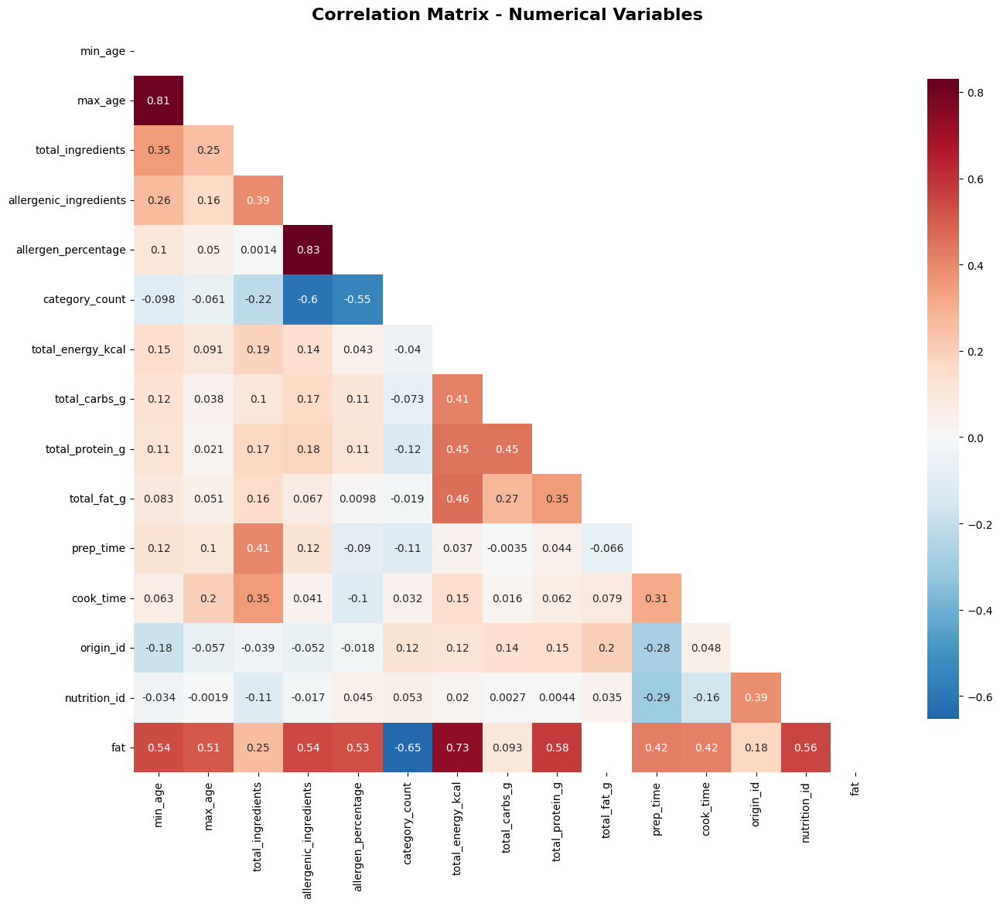


Strongest Positive Correlations (>0.5):
  allergenic_ingredients ↔ allergen_percentage: 0.830
  min_age ↔ max_age: 0.807
  total_energy_kcal ↔ fat: 0.733
  total_protein_g ↔ fat: 0.580
  nutrition_id ↔ fat: 0.563
  allergenic_ingredients ↔ fat: 0.543
  min_age ↔ fat: 0.538
  allergen_percentage ↔ fat: 0.529
  max_age ↔ fat: 0.509

Strongest Negative Correlations (<-0.3):
  category_count ↔ fat: -0.654
  allergenic_ingredients ↔ category_count: -0.602
  allergen_percentage ↔ category_count: -0.551


In [ ]:
# 4.1 Comprehensive Correlation Analysis
import numpy as np
print("=== MULTIVARIATE CORRELATION ANALYSIS ===")

# Select numerical columns for correlation analysis
numerical_cols = ['min_age', 'max_age', 'total_ingredients', 'allergenic_ingredients',
                 'allergen_percentage', 'category_count'] + macronutrient_cols

# Add any other numerical columns that exist
additional_numerical = []
for col in master_df.columns:
    if master_df[col].dtype in ['int64', 'float64'] and col not in numerical_cols and col != 'recipe_id':
        additional_numerical.append(col)

if additional_numerical:
    print(f"Additional numerical columns found: {additional_numerical}")
    numerical_cols.extend(additional_numerical[:5])  # Add up to 5 more columns

# Create correlation matrix
correlation_data = master_df[numerical_cols].select_dtypes(include=[np.number])
correlation_matrix = correlation_data.corr()

print(f"\nCorrelation Matrix Shape: {correlation_matrix.shape}")

# Visualize correlation matrix
plt.figure(figsize=(14, 12))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu_r', center=0,
            square=True, mask=mask, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix - Numerical Variables', fontweight='bold', fontsize=16)
plt.tight_layout()
plt.show()

# Find strongest correlations
print("\nStrongest Positive Correlations (>0.5):")
strong_positive = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_val = correlation_matrix.iloc[i, j]
        if corr_val > 0.5:
            strong_positive.append((correlation_matrix.columns[i], correlation_matrix.columns[j], corr_val))

strong_positive.sort(key=lambda x: x[2], reverse=True)
for var1, var2, corr in strong_positive:
    print(f"  {var1} ↔ {var2}: {corr:.3f}")

print("\nStrongest Negative Correlations (<-0.3):")
strong_negative = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_val = correlation_matrix.iloc[i, j]
        if corr_val < -0.3:
            strong_negative.append((correlation_matrix.columns[i], correlation_matrix.columns[j], corr_val))

strong_negative.sort(key=lambda x: x[2])
for var1, var2, corr in strong_negative:
    print(f"  {var1} ↔ {var2}: {corr:.3f}")


=== COMPREHENSIVE RECIPE PROFILING ===
Purpose: Create detailed profiles combining all variables

Recipe Profiles by Age Group and Complexity:
Number of profiles: 24

Top 10 Most Common Recipe Profiles:


,,recipe_id_count,total_ingredients_mean,total_ingredients_std,allergenic_ingredients_mean,allergenic_ingredients_sum,allergen_percentage_mean,category_count_mean,total_energy_kcal_mean,total_energy_kcal_std,total_protein_g_mean,total_protein_g_std,total_carbs_g_mean,total_carbs_g_std,total_fat_g_mean,total_fat_g_std
age_group,complexity,,,,,,,,,,,,,,,
12+ months,Complex,175,8.17,1.11,2.19,384,27.26,5.88,317.62,536.37,25.48,43.08,71.73,184.66,22.50,56.54
9-12 months,Medium,159,5.03,0.75,0.98,156,19.35,6.34,129.09,185.02,14.39,43.49,26.96,32.27,6.27,10.31
12+ months,Medium,137,5.04,0.80,1.23,169,24.34,6.23,204.25,272.17,15.45,23.36,34.17,55.62,11.23,16.43
9-12 months,Complex,121,8.21,1.11,1.57,190,19.34,6.06,249.88,318.41,24.18,37.69,43.00,54.93,14.38,25.16
6-12 months,Medium,94,4.76,0.79,1.11,104,23.26,6.09,181.49,226.03,12.56,17.03,29.00,39.53,13.48,32.32
6-8 months,Medium,87,5.09,0.79,1.41,123,28.16,6.05,198.37,232.22,15.80,26.07,40.15,41.93,7.60,10.26
6-12 months,Simple,75,2.67,0.60,0.32,24,12.44,6.40,134.44,186.80,7.67,11.64,20.71,24.34,6.79,18.36
Unknown,Medium,70,4.74,0.81,0.73,51,14.93,6.16,159.40,146.43,7.73,9.23,29.34,24.27,6.02,9.92
6-8 months,Simple,63,2.25,0.67,0.43,27,18.78,6.57,80.64,93.45,4.30,7.77,14.99,21.07,3.18,5.89


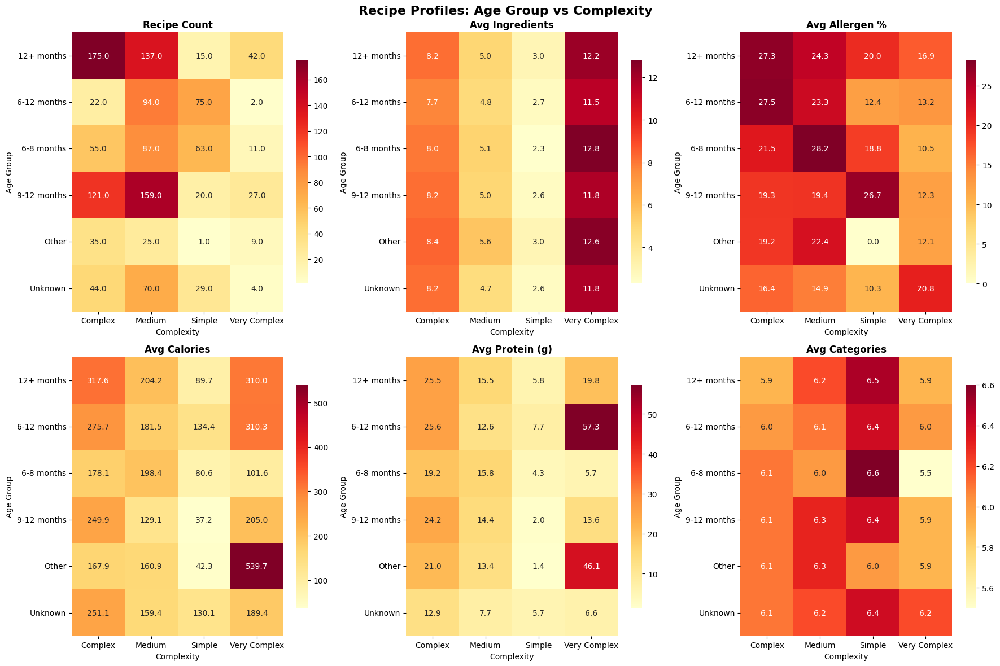


=== RECIPE PATTERN ANALYSIS ===

High-Nutrition, Low-Allergen Recipes: 116
Characteristics:
  - Avg ingredients: 7.7
  - Avg calories: 491.0
  - Age group distribution: {'12+ months': 33, '9-12 months': 33, '6-12 months': 17, '6-8 months': 16, 'Other': 9, 'Unknown': 8}
  - Complexity distribution: {'Complex': 42, 'Medium': 39, 'Very Complex': 26, 'Simple': 9}

Simple, Safe Recipes for Young Babies: 97
Characteristics:
  - Avg ingredients: 2.4
  - Avg calories: 103.0
  - Age group distribution: {'6-12 months': 55, '6-8 months': 42}

Complex, Highly Nutritious Recipes: 86
Characteristics:
  - Avg ingredients: 9.1
  - Avg allergen %: 22.3%
  - Age group distribution: {'12+ months': 35, '9-12 months': 24, 'Other': 9, '6-8 months': 8, '6-12 months': 8, 'Unknown': 2}


In [ ]:
# 4.2 Comprehensive Recipe Profiling
print("\n=== COMPREHENSIVE RECIPE PROFILING ===")
print("Purpose: Create detailed profiles combining all variables")

# Create comprehensive recipe profiles by age group and complexity
profile_vars = ['age_group', 'complexity']
profile_summary = master_df.groupby(profile_vars).agg({
    'recipe_id': 'count',
    'total_ingredients': ['mean', 'std'],
    'allergenic_ingredients': ['mean', 'sum'],
    'allergen_percentage': 'mean',
    'category_count': 'mean',
    'total_energy_kcal': ['mean', 'std'],
    'total_protein_g': ['mean', 'std'],
    'total_carbs_g': ['mean', 'std'],
    'total_fat_g': ['mean', 'std']
}).round(2)

# Flatten column names
profile_summary.columns = ['_'.join(col).strip('_') for col in profile_summary.columns]

print("\nRecipe Profiles by Age Group and Complexity:")
print(f"Number of profiles: {len(profile_summary)}")

# Display most common profiles
profile_summary_sorted = profile_summary.sort_values('recipe_id_count', ascending=False)
print("\nTop 10 Most Common Recipe Profiles:")
display(profile_summary_sorted.head(10))

# Visualize recipe profiles
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Recipe Profiles: Age Group vs Complexity', fontsize=16, fontweight='bold')

# Create pivot tables for heatmaps
profile_data = master_df.groupby(['age_group', 'complexity']).agg({
    'recipe_id': 'count',
    'total_ingredients': 'mean',
    'allergen_percentage': 'mean',
    'total_energy_kcal': 'mean',
    'total_protein_g': 'mean',
    'category_count': 'mean'
}).round(1)

metrics = ['recipe_id', 'total_ingredients', 'allergen_percentage',
          'total_energy_kcal', 'total_protein_g', 'category_count']
titles = ['Recipe Count', 'Avg Ingredients', 'Avg Allergen %',
         'Avg Calories', 'Avg Protein (g)', 'Avg Categories']

for i, (metric, title) in enumerate(zip(metrics, titles)):
    row = i // 3
    col = i % 3

    pivot_data = profile_data[metric].unstack(fill_value=0)

    # Only create heatmap if we have data
    if not pivot_data.empty:
        sns.heatmap(pivot_data, annot=True, fmt='.1f', cmap='YlOrRd',
                   ax=axes[row, col], cbar_kws={'shrink': 0.8})
        axes[row, col].set_title(title, fontweight='bold')
        axes[row, col].set_xlabel('Complexity')
        axes[row, col].set_ylabel('Age Group')

plt.tight_layout()
plt.show()

# Identify recipe patterns
print("\n=== RECIPE PATTERN ANALYSIS ===")

# High-nutrition, low-allergen recipes
high_nutrition_low_allergen = master_df[
    (master_df['total_energy_kcal'] > master_df['total_energy_kcal'].quantile(0.75)) &
    (master_df['allergen_percentage'] < 20) &
    (master_df['allergen_percentage'].notna())
]

print(f"\nHigh-Nutrition, Low-Allergen Recipes: {len(high_nutrition_low_allergen)}")
if len(high_nutrition_low_allergen) > 0:
    print("Characteristics:")
    print(f"  - Avg ingredients: {high_nutrition_low_allergen['total_ingredients'].mean():.1f}")
    print(f"  - Avg calories: {high_nutrition_low_allergen['total_energy_kcal'].mean():.1f}")
    print(f"  - Age group distribution: {high_nutrition_low_allergen['age_group'].value_counts().to_dict()}")
    print(f"  - Complexity distribution: {high_nutrition_low_allergen['complexity'].value_counts().to_dict()}")

# Simple, safe recipes for young babies
simple_safe_recipes = master_df[
    (master_df['complexity'] == 'Simple') &
    (master_df['allergen_percentage'] == 0) &
    (master_df['age_group'].isin(['6-8 months', '6-12 months']))
]

print(f"\nSimple, Safe Recipes for Young Babies: {len(simple_safe_recipes)}")
if len(simple_safe_recipes) > 0:
    print("Characteristics:")
    print(f"  - Avg ingredients: {simple_safe_recipes['total_ingredients'].mean():.1f}")
    print(f"  - Avg calories: {simple_safe_recipes['total_energy_kcal'].mean():.1f}")
    print(f"  - Age group distribution: {simple_safe_recipes['age_group'].value_counts().to_dict()}")

# Complex recipes with high nutritional value
complex_nutritious = master_df[
    (master_df['complexity'].isin(['Complex', 'Very Complex'])) &
    (master_df['total_energy_kcal'] > master_df['total_energy_kcal'].quantile(0.75)) &
    (master_df['total_protein_g'] > master_df['total_protein_g'].quantile(0.75))
]

print(f"\nComplex, Highly Nutritious Recipes: {len(complex_nutritious)}")
if len(complex_nutritious) > 0:
    print("Characteristics:")
    print(f"  - Avg ingredients: {complex_nutritious['total_ingredients'].mean():.1f}")
    print(f"  - Avg allergen %: {complex_nutritious['allergen_percentage'].mean():.1f}%")
    print(f"  - Age group distribution: {complex_nutritious['age_group'].value_counts().to_dict()}")


=== NUTRITIONAL ADEQUACY ACROSS MULTIPLE VARIABLES ===
Purpose: Evaluate nutritional completeness considering age, complexity, and safety

Nutritional Adequacy Scores by Age Group:
             mean  count   std
age_group                     
12+ months   4.64    273  1.54
6-12 months  4.95    147  1.65
6-8 months   4.87    180  1.74
9-12 months  5.11    262  1.95
Other        3.07     45  0.91
Unknown       NaN      0   NaN

Nutritional Adequacy Scores by Complexity:
              mean  count   std
complexity                     
Complex       5.00    300  1.75
Medium        4.54    398  1.68
Simple        4.51    129  1.77
Very Complex  5.75     80  1.69


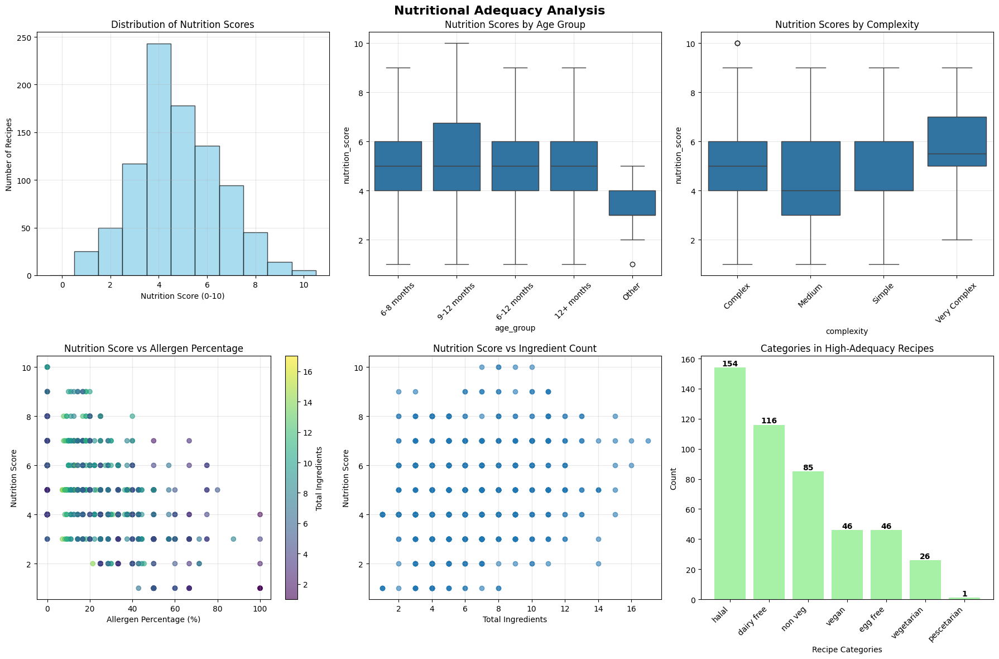


=== NUTRITIONAL ADEQUACY INSIGHTS ===
Total recipes with adequacy scores: 907
High adequacy (≥7): 158 (17.4%)
Medium adequacy (4-6): 557 (61.4%)
Low adequacy (<4): 192 (21.2%)
Average nutrition score: 4.79

Best Age-Complexity Combinations:
  6-8 months + Very Complex: 6.55 (n=11)
  6-12 months + Very Complex: 6.00 (n=2)
  9-12 months + Very Complex: 5.88 (n=27)
  12+ months + Very Complex: 5.86 (n=42)
  9-12 months + Complex: 5.77 (n=121)


In [ ]:
# 4.3 Comprehensive Nutritional Adequacy Analysis
print("\n=== NUTRITIONAL ADEQUACY ACROSS MULTIPLE VARIABLES ===")
print("Purpose: Evaluate nutritional completeness considering age, complexity, and safety")

# Define nutritional adequacy criteria based on baby food guidelines
def assess_nutritional_adequacy(row):
    """
    Assess nutritional adequacy based on age group and nutritional content
    Returns score from 0-10
    """
    score = 0

    # Age-appropriate calorie ranges (rough guidelines)
    age_calorie_ranges = {
        '6-8 months': (50, 150),
        '6-12 months': (100, 250),
        '9-12 months': (150, 300),
        '12+ months': (200, 400)
    }

    age_group = row.get('age_group', 'Unknown')
    calories = row.get('total_energy_kcal', 0)
    protein = row.get('total_protein_g', 0)
    carbs = row.get('total_carbs_g', 0)
    fat = row.get('total_fat_g', 0)

    # Skip if missing data
    if pd.isna(calories) or age_group == 'Unknown':
        return np.nan

    # Calorie adequacy (3 points)
    if age_group in age_calorie_ranges:
        min_cal, max_cal = age_calorie_ranges[age_group]
        if min_cal <= calories <= max_cal:
            score += 3
        elif calories < min_cal * 0.8 or calories > max_cal * 1.2:
            score += 1
        else:
            score += 2

    # Protein adequacy (2 points)
    if not pd.isna(protein):
        if age_group in ['6-8 months', '6-12 months'] and protein >= 5:
            score += 2
        elif age_group in ['9-12 months', '12+ months'] and protein >= 8:
            score += 2
        elif protein >= 3:
            score += 1

    # Balanced macronutrients (2 points)
    if not pd.isna(carbs) and not pd.isna(fat):
        total_macros = protein + carbs + fat
        if total_macros > 0:
            protein_pct = (protein * 4) / (calories) * 100 if calories > 0 else 0
            carb_pct = (carbs * 4) / (calories) * 100 if calories > 0 else 0
            fat_pct = (fat * 9) / (calories) * 100 if calories > 0 else 0

            # Ideal ranges for babies: 15-20% protein, 45-60% carbs, 25-35% fat
            if 10 <= protein_pct <= 25 and 40 <= carb_pct <= 65 and 20 <= fat_pct <= 40:
                score += 2
            elif 8 <= protein_pct <= 30 and 35 <= carb_pct <= 70 and 15 <= fat_pct <= 45:
                score += 1

    # Safety considerations (3 points)
    allergen_pct = row.get('allergen_percentage', 0)
    if allergen_pct == 0:
        score += 3  # No allergens
    elif allergen_pct <= 20:
        score += 2  # Low allergen content
    elif allergen_pct <= 40:
        score += 1  # Moderate allergen content

    return score

# Apply nutritional adequacy assessment
master_df['nutrition_score'] = master_df.apply(assess_nutritional_adequacy, axis=1)

# Analyze nutritional adequacy by different variables
print("\nNutritional Adequacy Scores by Age Group:")
adequacy_by_age = master_df.groupby('age_group')['nutrition_score'].agg(['mean', 'count', 'std']).round(2)
print(adequacy_by_age)

print("\nNutritional Adequacy Scores by Complexity:")
adequacy_by_complexity = master_df.groupby('complexity')['nutrition_score'].agg(['mean', 'count', 'std']).round(2)
print(adequacy_by_complexity)

# Create comprehensive adequacy analysis
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Nutritional Adequacy Analysis', fontsize=16, fontweight='bold')

# 1. Adequacy score distribution
axes[0,0].hist(master_df['nutrition_score'].dropna(), bins=11, alpha=0.7,
               color='skyblue', edgecolor='black', range=(-0.5, 10.5))
axes[0,0].set_title('Distribution of Nutrition Scores')
axes[0,0].set_xlabel('Nutrition Score (0-10)')
axes[0,0].set_ylabel('Number of Recipes')
axes[0,0].grid(True, alpha=0.3)

# 2. Adequacy by age group
valid_age_data = master_df[master_df['age_group'] != 'Unknown']
sns.boxplot(data=valid_age_data, x='age_group', y='nutrition_score', ax=axes[0,1])
axes[0,1].set_title('Nutrition Scores by Age Group')
axes[0,1].tick_params(axis='x', rotation=45)
axes[0,1].grid(True, alpha=0.3)

# 3. Adequacy by complexity
sns.boxplot(data=master_df, x='complexity', y='nutrition_score', ax=axes[0,2])
axes[0,2].set_title('Nutrition Scores by Complexity')
axes[0,2].tick_params(axis='x', rotation=45)
axes[0,2].grid(True, alpha=0.3)

# 4. Adequacy vs allergen percentage
valid_allergen_data = master_df.dropna(subset=['nutrition_score', 'allergen_percentage'])
scatter = axes[1,0].scatter(valid_allergen_data['allergen_percentage'],
                           valid_allergen_data['nutrition_score'],
                           alpha=0.6, c=valid_allergen_data['total_ingredients'], cmap='viridis')
axes[1,0].set_title('Nutrition Score vs Allergen Percentage')
axes[1,0].set_xlabel('Allergen Percentage (%)')
axes[1,0].set_ylabel('Nutrition Score')
axes[1,0].grid(True, alpha=0.3)
cbar = plt.colorbar(scatter, ax=axes[1,0])
cbar.set_label('Total Ingredients')

# 5. Adequacy vs ingredient count
valid_ingredient_data = master_df.dropna(subset=['nutrition_score', 'total_ingredients'])
axes[1,1].scatter(valid_ingredient_data['total_ingredients'],
                 valid_ingredient_data['nutrition_score'], alpha=0.6)
axes[1,1].set_title('Nutrition Score vs Ingredient Count')
axes[1,1].set_xlabel('Total Ingredients')
axes[1,1].set_ylabel('Nutrition Score')
axes[1,1].grid(True, alpha=0.3)

# 6. High adequacy recipes by category
high_adequacy = master_df[master_df['nutrition_score'] >= 7]
if len(high_adequacy) > 0 and 'category_names' in high_adequacy.columns:
    # Count category mentions in high adequacy recipes
    all_categories = []
    for categories in high_adequacy['category_names'].dropna():
        all_categories.extend([cat.strip() for cat in categories.split(',')][:3])  # First 3 categories

    if all_categories:
        category_counts = pd.Series(all_categories).value_counts().head(8)
        bars = axes[1,2].bar(range(len(category_counts)), category_counts.values,
                           color='lightgreen', alpha=0.8)
        axes[1,2].set_title('Categories in High-Adequacy Recipes')
        axes[1,2].set_xlabel('Recipe Categories')
        axes[1,2].set_ylabel('Count')
        axes[1,2].set_xticks(range(len(category_counts)))
        axes[1,2].set_xticklabels(category_counts.index, rotation=45, ha='right')

        for bar, count in zip(bars, category_counts.values):
            axes[1,2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                         str(count), ha='center', va='bottom', fontweight='bold')
else:
    axes[1,2].text(0.5, 0.5, 'No high adequacy\nrecipes found', ha='center', va='center',
                  transform=axes[1,2].transAxes, fontsize=12)
    axes[1,2].set_title('Categories in High-Adequacy Recipes')

plt.tight_layout()
plt.show()

# Summary insights
print(f"\n=== NUTRITIONAL ADEQUACY INSIGHTS ===")
total_scored = master_df['nutrition_score'].notna().sum()
high_adequacy_count = (master_df['nutrition_score'] >= 7).sum()
medium_adequacy_count = ((master_df['nutrition_score'] >= 4) & (master_df['nutrition_score'] < 7)).sum()
low_adequacy_count = (master_df['nutrition_score'] < 4).sum()

print(f"Total recipes with adequacy scores: {total_scored}")
print(f"High adequacy (≥7): {high_adequacy_count} ({high_adequacy_count/total_scored*100:.1f}%)")
print(f"Medium adequacy (4-6): {medium_adequacy_count} ({medium_adequacy_count/total_scored*100:.1f}%)")
print(f"Low adequacy (<4): {low_adequacy_count} ({low_adequacy_count/total_scored*100:.1f}%)")
print(f"Average nutrition score: {master_df['nutrition_score'].mean():.2f}")

# Best performing combinations
print(f"\nBest Age-Complexity Combinations:")
best_combinations = master_df.groupby(['age_group', 'complexity'])['nutrition_score'].mean().sort_values(ascending=False).head(5)
for (age, complexity), score in best_combinations.items():
    count = len(master_df[(master_df['age_group'] == age) & (master_df['complexity'] == complexity)])
    print(f"  {age} + {complexity}: {score:.2f} (n={count})")

### Feature Selection & Engineering

In [ ]:
print("\n🔍 IDENTIFYING AND COMPARING RECIPES WITH DUPLICATE NAMES")
print("=" * 60)

# Identify recipes with duplicate names
duplicate_names = recipes['name'].value_counts()
duplicate_names = duplicate_names[duplicate_names > 1]

if not duplicate_names.empty:
    print(f"Found {len(duplicate_names)} recipe names with duplicates:")
    print(duplicate_names)

    # Filter the original dataframe to get recipes with duplicate names
    recipes_with_duplicate_names = recipes[recipes['name'].isin(duplicate_names.index)].sort_values('name')

    print(f"\n📋 Details for recipes with duplicate names:")
    # Display relevant columns for inspection
    display(recipes_with_duplicate_names[['recipe_id', 'name', 'ingredients', 'instructions', 'min_age', 'max_age']])

    # Further check for identical entries (name, ingredients, instructions)
    print("\n🔎 Checking for identical name, ingredients, and instructions:")
    # Use keep=False to mark ALL duplicate rows (including the first occurrence)
    identical_entries = recipes[recipes.duplicated(subset=['name', 'ingredients', 'instructions'], keep=False)]

    if not identical_entries.empty:
        print(f"Found {len(identical_entries)} identical recipe entries (name, ingredients, instructions):")
        display(identical_entries[['recipe_id', 'name', 'ingredients', 'instructions', 'min_age', 'max_age']])

        # Save the recipe_id of the duplicated recipes
        duplicated_recipe_ids = identical_entries['recipe_id']
        print("\nRecipe IDs of identical entries:")
        print(duplicated_recipe_ids.to_list())

        # Compare the first and second occurrence of a specific duplicate to see the difference
        if len(identical_entries) > 1:
            print("\n\nComparing first and second occurrence of an identical recipe:")
            first_duplicate_name = identical_entries['name'].iloc[0]
            comparison_df = identical_entries[identical_entries['name'] == first_duplicate_name].head(2)

            if len(comparison_df) == 2:
                display(comparison_df[['name', 'ingredients', 'instructions']])
                is_identical = comparison_df.iloc[0]['ingredients'] == comparison_df.iloc[1]['ingredients'] and \
                               comparison_df.iloc[0]['instructions'] == comparison_df.iloc[1]['instructions']
                print(f"\nAre ingredients and instructions identical for these two entries? {is_identical}")
            else:
                 print("Not enough identical entries to compare first and second occurrence.")


    else:
        print("No identical recipe entries found (same name, ingredients, and instructions).")

else:
    print("No recipe names with duplicates found.")


🔍 IDENTIFYING AND COMPARING RECIPES WITH DUPLICATE NAMES
Found 25 recipe names with duplicates:
name
Sweet Corn Milk Porridge                        3
Red Rice Porridge                               3
Carrots, Broccoli & Cheese Puree                3
Parsnip, Spinach & Sweet Potato Puree           2
Avocado Puree                                   2
Pure Pear                                       2
Red Bean Milk Porridge                          2
Butter Chicken Porridge (Bubur Ayam Mentega)    2
Papaya Puree                                    2
Pure Avocado                                    2
Pure Mango                                      2
Minced Meat Porridge                            2
Vegetable Rice Porridge                         2
Mashed Potatoes                                 2
Potato Milk Porridge                            2
Veggie biryani recipe                           2
Papaya Mixed Milk Porridge                      2
Manado Porridge                                 

,recipe_id,name,ingredients,instructions,min_age,max_age
1282,1283,Avocado Puree,- 1 avocado\n- Breast milk (ASI),1. Mash avocado.\n2. Add breast milk and mix w...,6.0,6.0
117,118,Avocado Puree,- 125 g ripe avocado (±½ fruit) - 25 ml water ...,1. Scoop out the flesh of the avocado and blen...,6.0,NaN
421,422,Broccoli Puree,"- 50g broccoli, washed and finely chopped\n- 1...","1. Boil water or broth with rice flour, cook u...",6.0,9.0
61,62,Broccoli Puree,"- Water for boiling - 200 g broccoli, chopped ...","1. Boil water, add broccoli. Cook until tender...",6.0,NaN
19,20,Butter Chicken Porridge (Bubur Ayam Mentega),- 30 g rice \n- 30 g chicken mince \n- 1 piece...,1. Stir-fry blended spices with butter until f...,6.0,8.0
1297,1298,Butter Chicken Porridge (Bubur Ayam Mentega),- 60g rice \n- 30g chicken \n- Grated carrot \...,"1. Sauté spices with butter. \n2. Add chicken,...",6.0,6.0
1206,1207,"Carrots, Broccoli & Cheese Puree","300g potatoes, peeled & chopped_x000D_\n1 medi...",1. Put the potatoes and carrot into a saucepan...,6.0,9.0
1198,1199,"Carrots, Broccoli & Cheese Puree","300g potatoes, peeled & chopped_x000D_\n1 medi...",1. Put the potatoes and carrot into a saucepan...,6.0,9.0
1210,1211,"Carrots, Broccoli & Cheese Puree","300g potatoes, peeled & chopped_x000D_\n1 medi...",1. Put the potatoes and carrot into a saucepan...,6.0,9.0
753,754,Green Rice Porridge,"- 40 g rice, steamed halfway- 300 ml meat brot...","1. Melt margarine, sauté garlic until fragrant...",NaN,NaN



🔎 Checking for identical name, ingredients, and instructions:
Found 7 identical recipe entries (name, ingredients, instructions):


,recipe_id,name,ingredients,instructions,min_age,max_age
1110,1111,Veggie biryani recipe,"\n- ⅓ small onion, peeled (20g)\n- ⅓ medium ca...","1. Chop up the onion and carrot, break the cau...",10.0,12.0
1113,1114,Veggie biryani recipe,"\n- ⅓ small onion, peeled (20g)\n- ⅓ medium ca...","1. Chop up the onion and carrot, break the cau...",10.0,12.0
1198,1199,"Carrots, Broccoli & Cheese Puree","300g potatoes, peeled & chopped_x000D_\n1 medi...",1. Put the potatoes and carrot into a saucepan...,6.0,9.0
1205,1206,"Parsnip, Spinach & Sweet Potato Puree",A knob of unsalted butter or non-dairy alterna...,1. Melt the butter in a saucepan.\n2. Add the ...,6.0,9.0
1206,1207,"Carrots, Broccoli & Cheese Puree","300g potatoes, peeled & chopped_x000D_\n1 medi...",1. Put the potatoes and carrot into a saucepan...,6.0,9.0
1210,1211,"Carrots, Broccoli & Cheese Puree","300g potatoes, peeled & chopped_x000D_\n1 medi...",1. Put the potatoes and carrot into a saucepan...,6.0,9.0
1225,1226,"Parsnip, Spinach & Sweet Potato Puree",A knob of unsalted butter or non-dairy alterna...,1. Melt the butter in a saucepan.\n2. Add the ...,6.0,9.0



Recipe IDs of identical entries:
[1111, 1114, 1199, 1206, 1207, 1211, 1226]


Comparing first and second occurrence of an identical recipe:


,name,ingredients,instructions
1110,Veggie biryani recipe,"\n- ⅓ small onion, peeled (20g)\n- ⅓ medium ca...","1. Chop up the onion and carrot, break the cau..."
1113,Veggie biryani recipe,"\n- ⅓ small onion, peeled (20g)\n- ⅓ medium ca...","1. Chop up the onion and carrot, break the cau..."



Are ingredients and instructions identical for these two entries? True
